In [301]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import nltk
from sklearn.externals import joblib
from scipy.stats import zscore
from sklearn.feature_extraction.text import TfidfTransformer
%matplotlib inline
import re
import os
import codecs
from sklearn import feature_extraction
import mpld3

In [302]:
teacher = pd.read_csv('progressiveMarch5.csv')
print(teacher.shape)




(227, 71)


In [303]:
#teacher['spring2017'] = teacher['GoalPracticeMetExp2017'] +  teacher['GoalEngagementMetExpSpring2017'] 

In [304]:
teacher['back'] = teacher['appText']

In [305]:
stopwords = nltk.corpus.stopwords.words('english')


In [306]:
from nltk.stem.snowball import SnowballStemmer
stemmer = SnowballStemmer("english")

In [307]:
print (stopwords[:10])

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're"]


In [308]:
from pandas import read_csv
import numpy

teacher['textA']= teacher['back'].replace(np.nan, '...', regex=True)

In [309]:
#print(teacher['textA'])


In [310]:
def tokenize_and_stem(text):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    stems = [stemmer.stem(t) for t in filtered_tokens]
    return stems


def tokenize_only(text):
    # first tokenize by sentence, then by word to ensure that punctuation is caught as it's own token
    tokens = [word.lower() for sent in nltk.sent_tokenize(text) for word in nltk.word_tokenize(sent)]
    filtered_tokens = []
    # filter out any tokens not containing letters (e.g., numeric tokens, raw punctuation)
    for token in tokens:
        if re.search('[a-zA-Z]', token):
            filtered_tokens.append(token)
    return filtered_tokens

In [311]:
totalvocab_stemmed = []
totalvocab_tokenized = []
for i in teacher['textA']:
    allwords_stemmed = tokenize_and_stem(i) #for each item in 'synopses', tokenize/stem
    totalvocab_stemmed.extend(allwords_stemmed) #extend the 'totalvocab_stemmed' list
    
    allwords_tokenized = tokenize_only(i)
    totalvocab_tokenized.extend(allwords_tokenized)

In [312]:
vocab_frame = pd.DataFrame({'words': totalvocab_tokenized}, index = totalvocab_stemmed)
print ('there are ' + str(vocab_frame.shape[0]) + ' items in vocab_frame')

there are 198096 items in vocab_frame


In [313]:
print (vocab_frame.head())

     words
i        i
love  love
math  math
i        i
love  love


In [314]:
from sklearn.feature_extraction.text import TfidfVectorizer

#define vectorizer parameters
tfidf_vectorizer = TfidfVectorizer(max_df=0.8, max_features=200000,
                                 min_df=0.2, stop_words='english',
                                 use_idf=True, tokenizer=tokenize_and_stem, ngram_range=(1,3))

%time tfidf_matrix = tfidf_vectorizer.fit_transform(teacher['textA']) #fit the vectorizer to synopses
    
print(tfidf_matrix.shape)

CPU times: user 5.16 s, sys: 48.2 ms, total: 5.2 s
Wall time: 5.3 s
(227, 297)


In [315]:
terms = tfidf_vectorizer.get_feature_names()
print(terms)

["'s", 'abil', 'abl', 'academ', 'achiev', 'activ', 'addit', 'advanc', 'ago', 'allow', 'alway', 'america', 'analyz', 'ani', 'anoth', 'answer', 'ap', 'appli', 'applic', 'approach', 'area', 'ask', 'assess', 'attend', 'base', 'becam', 'becaus', 'becom', 'befor', 'began', 'begin', 'believ', 'best', 'best practic', 'better', 'bring', 'build', 'career', 'challeng', 'chang', 'citi', 'class', 'collabor', 'colleagu', 'colleg', 'come', 'common', 'communiti', 'complet', 'concept', 'confer', 'confid', 'connect', 'consid', 'constant', 'content', 'continu grow', 'convers', 'core', 'cours', 'creat', 'critic', 'current', 'curriculum', 'daili', 'data', 'day', 'depart', 'design', 'did', 'differ', 'direct', 'discov', 'discuss', 'doe', 'dure', 'educ', 'effect', 'encourag', 'end', 'engag', 'engag student', 'enjoy', 'environ', 'everi', 'exam', 'exampl', 'excit', 'expect', 'experi', 'experienc', 'explain', 'explor', 'face', 'facilit', 'feedback', 'feel', 'fellow', 'fellowship', 'felt', 'field', 'final', 'focu

In [316]:
from sklearn.metrics.pairwise import cosine_similarity
dist = 1 - cosine_similarity(tfidf_matrix)
print()
print()

In [317]:
# print(teacher['gender'])

In [318]:

from sklearn.cluster import KMeans
from sklearn.externals import joblib

num_clusters = 4

km = KMeans(n_clusters=num_clusters, max_iter=1500)

%time km.fit(tfidf_matrix)

clusters = km.labels_.tolist()

teacher['clusters'] = clusters

joblib.dump(km, 'km.pkl')

CPU times: user 1.32 s, sys: 11.6 ms, total: 1.33 s
Wall time: 1.38 s


['km.pkl']

In [319]:
from sklearn.externals import joblib

#uncomment the below to save your model 
#since I've already run my model I am loading from the pickle

#joblib.dump(km,  'doc_cluster.pkl')

km = joblib.load('km.pkl')
clusters = km.labels_.tolist()

In [320]:
features = { 'idO': teacher['idOriginal'], 'gender': teacher['gender'], 'yearsTeach': teacher['yearsteaching'], 'applText': teacher['textA'],'cluster': clusters}

frame = pd.DataFrame(features, index = [clusters] , columns = ['idO', 'gender', 'yearsTeach', 'applText', 'cluster'])

In [321]:
grouped = frame['yearsTeach'].groupby(frame['cluster']) #groupby cluster for aggregation purposes

grouped.mean()

cluster
0     6
1     7
2    12
3     7
Name: yearsTeach, dtype: int64

In [322]:
frame['cluster'].value_counts()

2    79
1    60
0    45
3    43
Name: cluster, dtype: int64

In [331]:

from __future__ import print_function

print("Top terms per cluster:")
print()
#sort cluster centers by proximity to centroid
order_centroids = km.cluster_centers_.argsort()[:, ::-1] 

for i in range(num_clusters):
    print("Cluster %d words:" % i, end='')
    
    for ind in order_centroids[i]: #replace 6 with n words per cluster
        print(' %s' % vocab_frame.ix[terms[ind].split(' ')].values.tolist()[0][0].encode('utf-8', 'ignore'), end=',')
    print() #add whitespace
    print() #add whitespace
    
#     print("Cluster %d id:" % i, end='')
#     for idO in frame.ix[i]['idO'].values.tolist():
#         print(' %s,' % idO, end='')
#     print() #add whitespace
#     print() #add whitespace
    
print()
print()

In [324]:
import os  # for os.path.basename

import matplotlib.pyplot as plt
import matplotlib as mpl

from sklearn.manifold import MDS

MDS()

# convert two components as we're plotting points in a two-dimensional plane
# "precomputed" because we provide a distance matrix
# we will also specify `random_state` so the plot is reproducible.
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)

pos = mds.fit_transform(dist)  # shape (n_components, n_samples)

xs, ys = pos[:, 0], pos[:, 1]



In [326]:
cluster_colors = {0: '#1b9e77', 1: '#d95f02', 2: '#7570b3', 3: '#e7298a', 4: '#66a61e'}

#set up cluster names using a dict
cluster_names = {0: 'professionally, problems, time, understanding, practice, opportunity',
                 1: 'research, need, questions, assessments, making, improve, challenging, content', 
                 2: 'experience, grow, lab, opportunity, making, activities, discussion',
                 3: 'lessons, course, different, trying, knowing, grade, problems, better, thing, high' }

/Users/hubideal/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:36: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


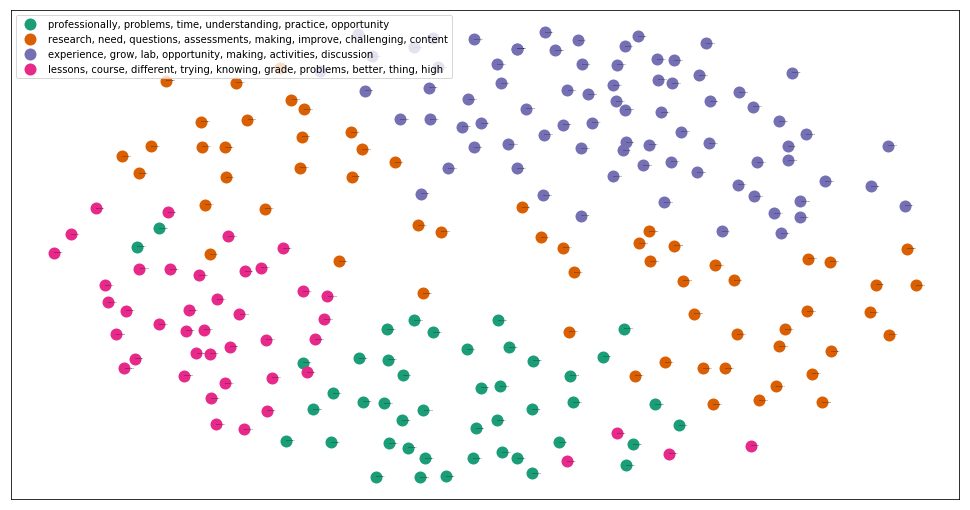

In [327]:
%matplotlib inline 

#create data frame that has the result of the MDS plus the cluster numbers and titles
df = pd.DataFrame(dict(x=xs, y=ys, label=clusters, ids= teacher['idOriginal'])) 

#group by cluster
groups = df.groupby('label')


# set up plot
fig, ax = plt.subplots(figsize=(17, 9)) # set size
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling

#iterate through groups to layer the plot
#note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=12, 
            label=cluster_names[name], color=cluster_colors[name], 
            mec='none')
    ax.set_aspect('auto')
    ax.tick_params(\
        axis= 'x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off')
    ax.tick_params(\
        axis= 'y',         # changes apply to the y-axis
        which='both',      # both major and minor ticks are affected
        left='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelleft='off')
    
ax.legend(numpoints=1)  #show legend with only 1 point

#add label in x,y position with the label as the film title
for i in range(len(df)):
    ax.text(df.ix[i]['x'], df.ix[i]['y'], df.ix[i]['ids'], size=1)  
    
    
plt.show() #show the plot

#uncomment the below to save the plot if need be
#plt.savefig('clusters_small_noaxes.png', dpi=200)


In [328]:
from __future__ import print_function

from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

Automatically created module for IPython interactive environment
For n_clusters = 2 The average silhouette_score is : 0.0770133759964


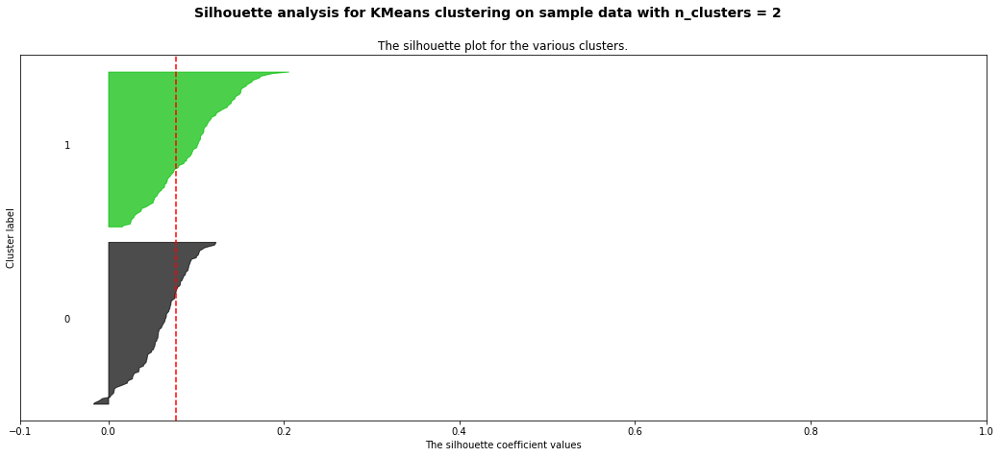

For n_clusters = 3 The average silhouette_score is : 0.0570752516956


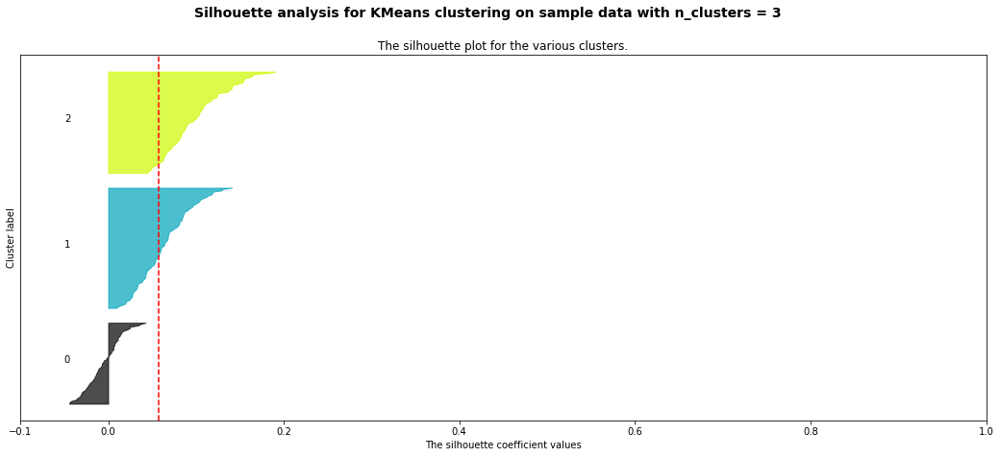

For n_clusters = 4 The average silhouette_score is : 0.0543984895204


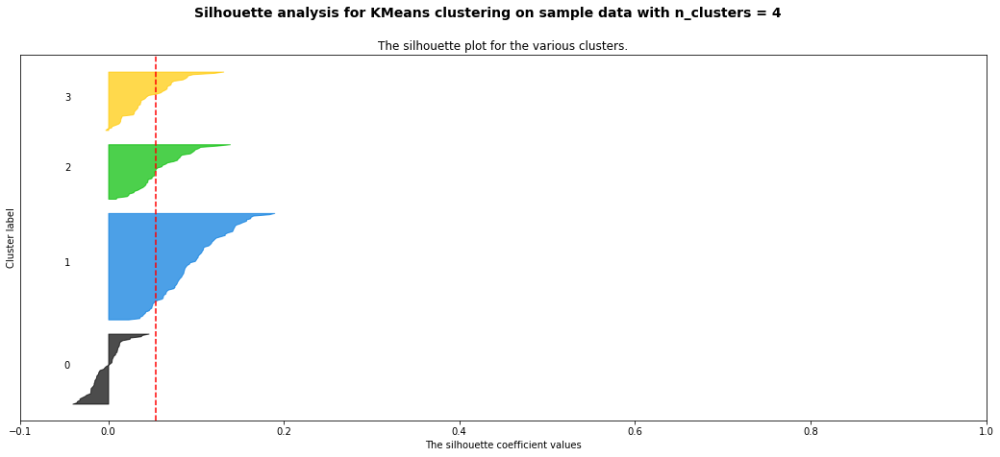

For n_clusters = 5 The average silhouette_score is : 0.0360668066227


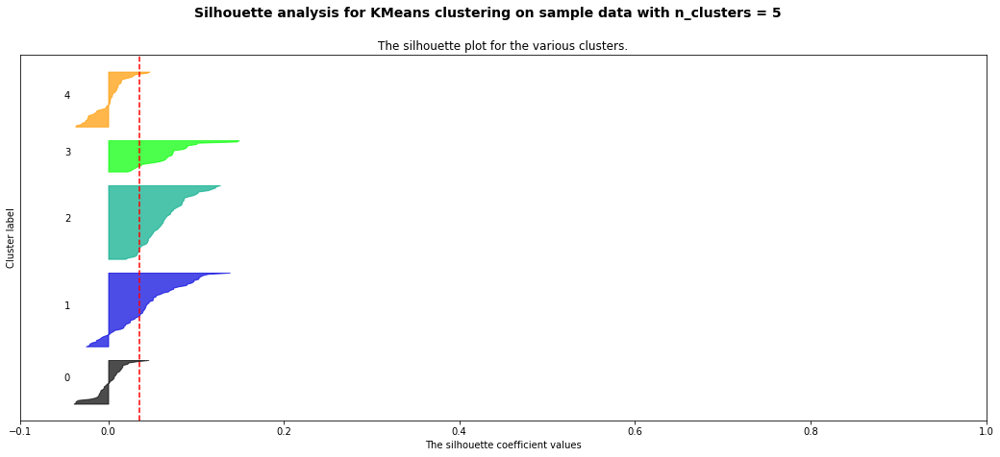

In [329]:
print(__doc__)

X = tfidf_matrix


range_n_clusters = [2 ,3 ,4, 5]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax1 = plt.subplots()
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
#     ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
#     ax1.set_ylim([0, len(clusters) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    
#     clusters = clusterer.labels_.tolist()
#     teacher['clusters'] = clusters

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

#     # 2nd Plot showing the actual clusters formed
#     colors = cm.spectral(cluster_labels.astype(float) / n_clusters)
#     ax2.scatter(clusters[:, 0], clusters[:, 1], marker='.', s=30, lw=0, alpha=0.7,
#                 c=colors, edgecolor='k')

#     # Labeling the clusters
#     centers = clusterer.cluster_centers_
#     # Draw white circles at cluster centers
#     ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
#                 c="white", alpha=1, s=200, edgecolor='k')

#     for i, c in enumerate(centers):
#         ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
#                     s=50, edgecolor='k')

#     ax2.set_title("The visualization of the clustered data.")
#     ax2.set_xlabel("Feature space for the 1st feature")
#     ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

    plt.show()

In [330]:
#print(df['x'])

In [104]:
#define custom toolbar location
class TopToolbar(mpld3.plugins.PluginBase):
    """Plugin for moving toolbar to top of figure"""

    JAVASCRIPT = """
    mpld3.register_plugin("toptoolbar", TopToolbar);
    TopToolbar.prototype = Object.create(mpld3.Plugin.prototype);
    TopToolbar.prototype.constructor = TopToolbar;
    function TopToolbar(fig, props){
        mpld3.Plugin.call(this, fig, props);
    };

    TopToolbar.prototype.draw = function(){
      // the toolbar svg doesn't exist
      // yet, so first draw it
      this.fig.toolbar.draw();

      // then change the y position to be
      // at the top of the figure
      this.fig.toolbar.toolbar.attr("x", 150);
      this.fig.toolbar.toolbar.attr("y", 400);

      // then remove the draw function,
      // so that it is not called again
      this.fig.toolbar.draw = function() {}
    }
    """
    def __init__(self):
        self.dict_ = {"type": "toptoolbar"}

In [173]:
#create data frame that has the result of the MDS plus the cluster numbers and titles
df = pd.DataFrame(dict(x=xs, y=ys, label=cluster, idStudy=idO) 

#group by cluster
groups = df.groupby('label')

#define custom css to format the font and to remove the axis labeling
css = """
text.mpld3-text, div.mpld3-tooltip {
  font-family:Arial, Helvetica, sans-serif;
}

g.mpld3-xaxis, g.mpld3-yaxis {
display: none; }

svg.mpld3-figure {
margin-left: -200px;}
"""

# Plot 
fig, ax = plt.subplots(figsize=(20,20)) #set plot size
ax.margins(0.03) # Optional, just adds 5% padding to the autoscaling

#iterate through groups to layer the plot
#note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    points = ax.plot(group.x, group.y, marker='o', linestyle='', ms=18, 
                     label=cluster_names[name], mec='none', 
                     color=cluster_colors[name])
    ax.set_aspect('auto')
    labels = [i for i in group.idStudy]
    
    #set tooltip using points, labels and the already defined 'css'
    tooltip = mpld3.plugins.PointHTMLTooltip(points[0], labels,
                                       voffset=10, hoffset=10, css=css)
    #connect tooltip to fig
    mpld3.plugins.connect(fig, tooltip, TopToolbar())    
    
    #set tick marks as blank
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    
    #set axis as blank
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

    
ax.legend(numpoints=1) #show legend with only one dot

mpld3.display() #show the plot

#uncomment the below to export to html
#html = mpld3.fig_to_html(fig)
#print(html)

SyntaxError: invalid syntax (<ipython-input-173-ef639b2e7af2>, line 5)

IndexError: string index out of range

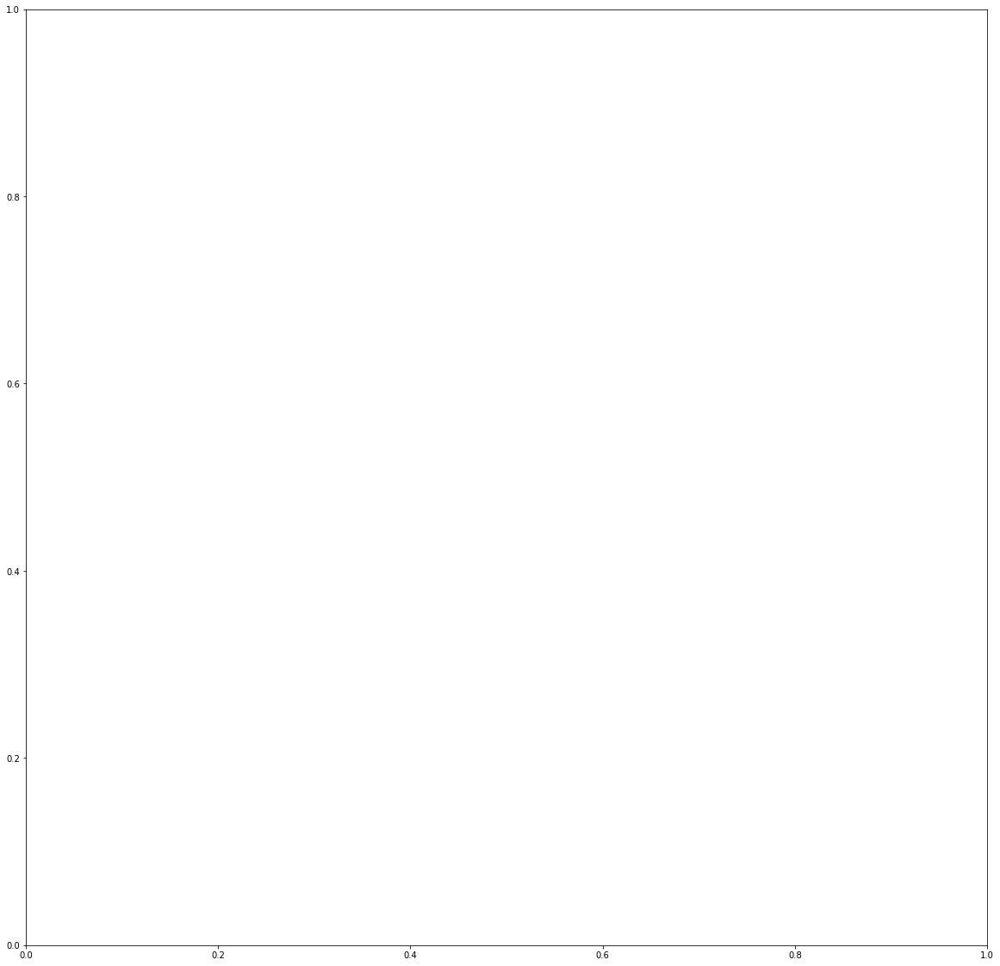

In [168]:
from scipy.cluster.hierarchy import ward, dendrogram

linkage_matrix = ward(dist) #define the linkage_matrix using ward clustering pre-computed distances

fig, ax = plt.subplots(figsize=(20, 20)) # set size
ax = dendrogram(linkage_matrix, orientation="right", labels=idO);

plt.tick_params(\
    axis= 'x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off')

plt.tight_layout() #show plot with tight layout

#uncomment below to save figure
plt.savefig('ward_clusters.png', dpi=200) #save figure as ward_clusters


In [61]:
teacher['textA'].replace("\r","")

0      How are you continuing to grow into the mathem...
1      \rHow does a musician in a pop-rock band in Lo...
2      \rTruth being said, being a member of Math for...
3      Nearly twenty years ago, while a graduate stud...
4      \rOver the course of my six years as a mathema...
5      \rThis year I will end my seventh year as a te...
6      \rWhen I think about what type of mathematics ...
7      I imagine a school in which walls between clas...
8      \rThis is my third personal statement for MfA....
9      In the past four years as a mathematics teache...
10     \rAfter completing my fourth year of teaching ...
11     \rI continue to grow as a math teacher by esta...
12     \rWith each new day, I am continuing to grow i...
13     \rIt seems the longer I teach, the more I real...
14     \rA teacher is not only an educator, but also ...
15     \rMy students are first and foremost the great...
16     \rWhen I first began teaching, I thought I kne...
17     \rThe answer to this que

In [63]:
teacher['textA'].replace("How are you continuing to grow into the mathematics teacher you want to be?","")



0      How are you continuing to grow into the mathem...
1      \rHow does a musician in a pop-rock band in Lo...
2      \rTruth being said, being a member of Math for...
3      Nearly twenty years ago, while a graduate stud...
4      \rOver the course of my six years as a mathema...
5      \rThis year I will end my seventh year as a te...
6      \rWhen I think about what type of mathematics ...
7      I imagine a school in which walls between clas...
8      \rThis is my third personal statement for MfA....
9      In the past four years as a mathematics teache...
10     \rAfter completing my fourth year of teaching ...
11     \rI continue to grow as a math teacher by esta...
12     \rWith each new day, I am continuing to grow i...
13     \rIt seems the longer I teach, the more I real...
14     \rA teacher is not only an educator, but also ...
15     \rMy students are first and foremost the great...
16     \rWhen I first began teaching, I thought I kne...
17     \rThe answer to this que

In [66]:
teacher['textA'].replace("How are you continuing to grow into the"," ")

0      How are you continuing to grow into the mathem...
1      \rHow does a musician in a pop-rock band in Lo...
2      \rTruth being said, being a member of Math for...
3      Nearly twenty years ago, while a graduate stud...
4      \rOver the course of my six years as a mathema...
5      \rThis year I will end my seventh year as a te...
6      \rWhen I think about what type of mathematics ...
7      I imagine a school in which walls between clas...
8      \rThis is my third personal statement for MfA....
9      In the past four years as a mathematics teache...
10     \rAfter completing my fourth year of teaching ...
11     \rI continue to grow as a math teacher by esta...
12     \rWith each new day, I am continuing to grow i...
13     \rIt seems the longer I teach, the more I real...
14     \rA teacher is not only an educator, but also ...
15     \rMy students are first and foremost the great...
16     \rWhen I first began teaching, I thought I kne...
17     \rThe answer to this que

In [68]:
for word in teacher['textA']:
    word = word.replace('\r',"")

In [73]:
for word in teacher
    

H
o
w
 
a
r
e
 
y
o
u
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
g
r
o
w
 
i
n
t
o
 
t
h
e
 
m
a
t
h
e
m
a
t
i
c
s
 
t
e
a
c
h
e
r
 
y
o
u
 
w
a
n
t
 
t
o
 
b
e
?

I
 
l
o
v
e
 
m
a
t
h
.
 
I
 
l
o
v
e
 
n
u
m
b
e
r
s
.
 
I
 
l
o
v
e
 
s
o
l
v
i
n
g
 
p
r
o
b
l
e
m
s
.
 
I
 
l
o
v
e
 
t
h
e
 
i
n
t
e
r
c
o
n
n
e
c
t
e
d
n
e
s
s
 
o
f
 
m
a
t
h
e
m
a
t
i
c
a
l
 
c
o
n
c
e
p
t
s
.
 
I
 
o
w
e
 
t
h
e
s
e
 
f
e
e
l
i
n
g
s
 
t
o
 
M
r
s
.
 
L
o
n
e
t
t
o
.
 
A
f
t
e
r
 
d
i
s
c
o
v
e
r
i
n
g
 
m
y
 
p
a
s
s
i
o
n
 
i
n
 
h
e
r
 
1
1
t
h
 
g
r
a
d
e
 
c
l
a
s
s
r
o
o
m
,
 
I
 
c
h
o
s
e
 
t
o
 
s
t
u
d
y
 
m
a
t
h
 
a
n
d
 
s
t
a
t
i
s
t
i
c
s
 
i
n
 
c
o
l
l
e
g
e
 
a
n
d
 
b
u
i
l
d
 
a
 
c
a
r
e
e
r
 
t
r
a
n
s
f
e
r
r
i
n
g
 
t
h
i
s
 
e
n
t
h
u
s
i
a
s
m
 
t
o
 
o
t
h
e
r
s
.
 
A
s
 
a
 
t
e
a
c
h
e
r
,
 
I
 
w
a
k
e
 
u
p
 
e
v
e
r
y
 
m
o
r
n
i
n
g
 
w
i
t
h
 
M
r
s
.
 
L
o
n
e
t
t
o
 
i
n
 
m
i
n
d
 
a
n
d
 
d
r
e
a
m
 
o
f
 
i
n
s
p
i
r
i
n
g
 
m
y
 
o
w
n
 
s
t
u
d
e
n
t
s
 
t
o
 
c
o
n
n
e
c

s
t
u
d
e
n
t
s
 
i
f
 
I
 
d
o
 
n
o
t
 
e
x
p
e
c
t
 
t
h
e
 
s
a
m
e
 
f
r
o
m
 
m
y
s
e
l
f
.
 
W
h
e
n
 
I
 
a
m
 
n
o
t
 
i
n
s
t
r
u
c
t
i
n
g
 
o
r
 
t
u
t
o
r
i
n
g
,
 
I
 
a
i
m
 
t
o
 
b
u
i
l
d
 
a
 
d
e
e
p
e
r
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
t
h
e
 
m
a
t
h
e
m
a
t
i
c
a
l
 
c
o
n
t
e
n
t
 
I
 
t
e
a
c
h
.
 
T
h
e
r
e
 
i
s
 
a
l
w
a
y
s
 
m
o
r
e
 
t
o
 
l
e
a
r
n
 
a
n
d
 
m
y
 
n
e
v
e
r
 
e
n
d
i
n
g
 
p
u
r
s
u
i
t
 
o
f
 
k
n
o
w
l
e
d
g
e
 
h
a
s
 
a
 
h
u
g
e
 
i
m
p
a
c
t
 
o
n
 
m
y
 
a
b
i
l
i
t
y
 
t
o
 
i
n
s
p
i
r
e
 
m
y
 
s
t
u
d
e
n
t
s
.
 
B
y
 
a
t
t
e
n
d
i
n
g
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
w
o
r
k
s
h
o
p
s
 
w
i
t
h
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
,
 
r
e
a
d
i
n
g
 
t
e
x
t
b
o
o
k
s
 
a
n
d
 
o
t
h
e
r
 
l
i
t
e
r
a
t
u
r
e
 
o
n
 
m
y
 
s
u
b
j
e
c
t
s
,
 
a
n
d
 
"
t
a
l
k
i
n
g
 
m
a
t
h
"
 
w
i
t
h
 
c
o
l
l
e
a
g
u
e
s
,
 
I
 
s
t
r
i
v
e
 
t
o
 
l
e
a
r
n
 
m
o
r
e
 
a
b
o
u
t
 
m
a
t
h
 
a
n
d
 
b
e
s
t
 
p
r
a
c


r
e
s
t
s
 
a
n
d
 
c
u
r
i
o
s
i
t
i
e
s
 
b
y
 
r
e
a
d
i
n
g
 
a
r
t
i
c
l
e
s
,
 
a
t
t
e
n
d
i
n
g
 
w
o
r
k
s
h
o
p
s
 
a
n
d
 
s
i
m
p
l
y
 
b
r
o
w
s
i
n
g
 
t
h
r
o
u
g
h
 
m
y
 
o
l
d
 
c
o
l
l
e
g
e
 
t
e
x
t
b
o
o
k
s
 
t
o
 
k
e
e
p
 
m
y
 
p
r
o
b
l
e
m
 
s
o
l
v
i
n
g
 
a
b
i
l
i
t
i
e
s
 
f
r
e
s
h
.
 
I
 
a
l
s
o
 
f
i
n
d
 
i
t
 
s
t
i
m
u
l
a
t
i
n
g
 
t
o
 
d
i
s
c
u
s
s
 
m
a
t
h
 
p
r
o
b
l
e
m
s
 
w
i
t
h
 
c
o
l
l
e
a
g
u
e
s
 
i
n
 
m
y
 
d
e
p
a
r
t
m
e
n
t
.
 
A
s
 
l
o
n
g
 
a
s
 
I
 
h
a
v
e
 
a
 
p
a
s
s
i
o
n
 
f
o
r
 
m
a
t
h
,
 
i
t
 
w
i
l
l
 
b
e
 
r
e
f
l
e
c
t
e
d
 
i
n
 
m
y
 
g
r
o
w
t
h
 
a
s
 
a
 
t
e
a
c
h
e
r
.

6

S
o
,
 
h
o
w
 
d
o
e
s
 
a
 
m
u
s
i
c
i
a
n
 
i
n
 
L
A
 
e
n
d
 
u
p
 
a
 
h
i
g
h
 
s
c
h
o
o
l
 
m
a
t
h
 
t
e
a
c
h
e
r
?
 
T
h
e
 
a
n
s
w
e
r
 
i
s
 
v
e
r
y
 
s
i
m
p
l
e
.
 
W
h
e
n
 
I
 
l
o
o
k
 
b
a
c
k
 
a
t
 
m
y
 
j
o
u
r
n
e
y
,
 
I
 
r
e
a
l
i
z
e
 
t
h
a
t
 
I
 
h
a
v
e
 
f
u
l
f
i
l
l
e
d
 
t
h
e
 
d
r
e
a
m
 
t


b
e
s
t
 
t
e
a
c
h
e
r
 
p
o
s
s
i
b
l
e
 
a
t
 
a
n
y
 
g
r
a
d
e
 
l
e
v
e
l
,
 
i
t
 
i
s
 
m
y
 
v
i
e
w
 
t
h
a
t
 
o
n
e
 
m
u
s
t
 
h
a
v
e
 
a
 
w
o
r
k
i
n
g
 
k
n
o
w
l
e
d
g
e
 
o
f
 
t
h
e
 
e
n
t
i
r
e
 
m
a
t
h
 
c
u
r
r
i
c
u
l
u
m
 
f
r
o
m
 
e
l
e
m
e
n
t
a
r
y
 
m
a
t
h
e
m
a
t
i
c
s
 
u
p
 
t
h
r
o
u
g
h
 
a
n
d
 
i
n
c
l
u
d
i
n
g
 
c
o
l
l
e
g
e
-
l
e
v
e
l
 
C
a
l
c
u
l
u
s
 
(
a
t
 
m
i
n
i
m
u
m
)
.
 
H
o
w
 
c
a
n
 
o
n
e
 
k
n
o
w
 
w
h
a
t
 
(
a
n
d
 
h
o
w
)
 
t
o
 
t
e
a
c
h
 
a
n
y
 
m
a
t
h
e
m
a
t
i
c
s
 
c
l
a
s
s
,
 
w
i
t
h
o
u
t
 
k
n
o
w
i
n
g
 
w
h
a
t
 
c
a
m
e
 
b
e
f
o
r
e
,
 
w
h
a
t
 
c
o
m
e
s
 
a
f
t
e
r
,
 
a
n
d
 
h
o
w
 
c
o
n
n
e
c
t
i
o
n
s
 
a
r
e
 
m
a
d
e
 
w
i
t
h
 
c
o
u
r
s
e
s
 
a
t
 
t
h
e
 
s
a
m
e
 
l
e
v
e
l
?
 
I
n
 
o
r
d
e
r
 
t
o

u
n
d
e
r
s
t
a
n
d
 
t
h
e
 
i
n
t
e
r
c
o
n
n
e
c
t
i
v
i
t
y
 
o
f
 
t
h
e
 
B
H
S
E
C
 
Q
u
e
e
n
s
 
M
a
t
h
e
m
a
t
i
c
s
 
C
u
r
r
i
c
u
l
u
m
,
 
I
 
h
a
v
e


m
a
d
e
 
i
t
 
a
 
p
o
i

 
i
n
 
t
h
e
 
B
r
o
n
x
,
 
I
 
h
a
v
e
 
g
r
o
w
n
 
p
e
d
a
g
o
g
i
c
a
l
l
y
 
a
s
 
a
n
 
e
d
u
c
a
t
o
r
 
a
n
d
 
h
a
v
e
 
b
e
c
o
m
e
 
a
 
m
o
r
e
 
g
r
o
u
n
d
e
d
,
 
c
o
m
p
a
s
s
i
o
n
a
t
e
 
p
e
r
s
o
n
.
 
I
 
h
a
v
e
 
t
a
u
g
h
t
 
a
 
r
a
n
g
e
 
o
f
 
m
a
t
h
 
c
o
u
r
s
e
s
 
t
o
 
a
 
v
a
r
i
e
t
y
 
o
f
 
s
t
u
d
e
n
t
s
 
i
n
 
t
w
o
 
v
e
r
y
 
d
i
f
f
e
r
e
n
t
 
s
c
h
o
o
l
s
.
 
W
h
i
l
e
 
f
o
c
u
s
i
n
g
 
o
n
 
b
u
i
l
d
i
n
g
 
m
y
 
s
t
u
d
e
n
t
s
'
 
c
o
n
f
i
d
e
n
c
e
,
 
s
k
i
l
l
s
,
 
a
n
d
 
a
p
p
r
e
c
i
a
t
i
o
n
 
f
o
r
 
m
a
t
h
e
m
a
t
i
c
s
,
 
I
 
a
l
s
o
 
f
o
u
n
d
 
m
y
 
o
w
n
 
l
o
v
e
 
f
o
r
 
t
h
e
 
s
u
b
j
e
c
t
 
d
e
e
p
e
n
i
n
g
 
i
n
 
t
h
e
 
p
r
o
c
e
s
s
.

M
a
t
h
 
h
a
d
 
a
l
w
a
y
s
 
b
e
e
n
 
m
y
 
f
a
v
o
r
i
t
e
 
s
u
b
j
e
c
t
 
a
s
 
a
 
c
h
i
l
d
,
 
a
n
d
 
b
e
c
a
m
e
 
m
y
 
p
a
s
s
i
o
n
 
i
n
 
c
o
l
l
e
g
e
.
 
B
e
c
a
u
s
e
 
I
 
s
t
r
u
g
g
l
e
d
 
i
n
 
o
t
h
e
r
 
s
u
b
j
e
c
t
s
 
a
s
 
a
 
c
h
i
l

r
s
 
I
 
c
u
r
r
e
n
t
l
y
 
w
o
r
k
 
w
i
t
h
.
 
I
 
h
a
v
e
 
b
e
e
n
 
l
u
c
k
y
 
e
n
o
u
g
h
 
t
o
 
c
u
r
r
e
n
t
l
y
 
t
e
a
c
h
 
i
n
 
a
 
s
c
h
o
o
l
 
w
h
e
r
e
 
I
 
a
m
 
t
h
e
 
s
e
c
o
n
d
 
y
o
u
n
g
e
s
t
 
i
n
 
p
r
o
f
e
s
s
i
o
n
a
l
 
a
g
e
 
o
u
t
 
o
f
 
t
h
i
r
t
e
e
n
 
m
a
t
h
 
t
e
a
c
h
e
r
s
.
 
T
h
i
s
 
a
l
l
o
w
s
 
m
e
 
t
o
 
o
b
s
e
r
v
e
 
t
h
e
s
e
 
v
e
t
e
r
a
n
 
t
e
a
c
h
e
r
s
 
o
n
 
a
 
c
o
n
s
t
a
n
t
 
b
a
s
i
s
 
a
n
d
 
p
a
y
 
a
t
t
e
n
t
i
o
n
 
t
o
 
t
h
e
i
r
 
s
t
r
e
n
g
t
h
s
.
 
W
e
 
h
a
v
e
 
t
e
a
c
h
e
r
s
 
w
h
o
 
h
a
v
e
 
a
m
a
z
i
n
g
 
o
r
g
a
n
i
z
a
t
i
o
n
a
l
 
s
k
i
l
l
s
;
 
t
e
a
c
h
e
r
s
 
w
h
o
 
h
a
v
e
 
g
r
e
a
t
 
s
t
r
a
t
e
g
i
e
s
 
t
o
 
r
e
a
c
h
 
l
o
w
e
r
 
l
e
v
e
l
 
s
t
u
d
e
n
t
s
;
 
t
e
a
c
h
e
r
s
 
w
h
o
 
h
a
v
e
 
d
e
e
p
 
k
n
o
w
l
e
d
g
e
 
o
f
 
t
h
e
 
c
o
n
t
e
n
t
 
a
n
d
 
c
u
r
r
i
c
u
l
u
m
.
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
l
e
a
r
n
 
f
r
o
m
 
e
a
c
h
 
o
f
 
t
h
e
m
 
o
n
 
a


e
r
e
 
I
 
r
e
f
l
e
c
t
 
o
n
 
t
h
i
n
g
s
 
t
h
a
t
 
I
 
h
a
v
e
 
d
o
n
e
 
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
.
 
I
 
c
a
n
 
g
e
t
 
f
e
e
d
b
a
c
k
 
o
n
 
t
h
e
 
t
h
i
n
g
s
 
t
h
a
t
 
I
 
d
o
 
s
o
 
I
 
c
a
n
 
i
m
p
r
o
v
e
 
t
h
e
m
.
 
O
n
 
t
o
p
 
o
f
 
t
h
a
t
,
 
e
v
e
r
y
 
s
u
m
m
e
r
 
I
 
a
t
t
e
n
d
 
T
w
i
t
t
e
r
 
M
a
t
h
 
C
a
m
p
.
 
(
I
n
 
f
a
c
t
,
 
s
i
n
c
e
 
l
a
s
t
 
y
e
a
r
 
I
 
h
a
v
e
 
b
e
e
n
 
o
n
 
t
h
e
 
p
l
a
n
n
i
n
g
 
c
o
m
m
i
t
t
e
e
 
f
o
r
 
t
h
e
 
c
o
n
f
e
r
e
n
c
e
.
)
 
A
t
 
t
h
i
s
 
c
o
n
f
e
r
e
n
c
e
,
 
I
'
v
e
 
h
o
s
t
e
d
 
s
e
s
s
i
o
n
s
 
o
n
 
m
a
k
i
n
g
 
i
n
t
e
r
d
i
s
c
i
p
l
i
n
a
r
y
 
t
o
p
i
c
s
 
a
n
d
 
m
a
k
i
n
g
 
e
d
u
c
a
t
i
o
n
a
l
 
m
a
t
h
 
g
a
m
e
s
.
 
I
'
v
e
 
c
o
-
c
r
e
a
t
e
d
 
l
e
s
s
o
n
s
 
w
i
t
h
 
t
h
e
s
e
 
t
e
a
c
h
e
r
s
 
t
h
a
t
 
a
r
e
 
t
h
e
n
 
s
p
r
e
a
d
 
t
o
 
o
t
h
e
r
s
 
b
e
y
o
n
d
 
t
h
e
 
c
o
n
f
e
r
e
n
c
e
.

T
h
r
o
u
g
h
 
t
h
i
s
 
n
e
t
w
o
r
k
 
I
 
a
l
s

y
 
t
o
 
l
i
v
e
 
i
n
.
 
I
 
h
a
d
 
s
t
u
d
e
n
t
s
 
c
h
o
o
s
i
n
g
 
c
o
u
n
t
r
i
e
s
 
s
u
c
h
 
a
s
 
K
o
r
e
a
 
a
n
d
 
j
o
b
s
 
t
h
a
t
 
i
n
c
l
u
d
e
d
 
j
o
i
n
i
n
g
 
t
h
e
 
P
e
a
c
e
 
C
o
r
p
s
.

E
v
e
r
y
 
y
e
a
r
 
o
u
r
 
s
t
u
d
e
n
t
s
 
w
r
i
t
e
 
p
r
o
p
o
s
a
l
s
 
f
o
r
 
o
u
r
 
a
n
n
u
a
l
 
m
a
t
h
e
m
a
t
i
c
s
 
c
o
n
f
e
r
e
n
c
e
,
 
m
o
d
e
l
e
d
 
a
f
t
e
r
 
t
h
e
 
N
C
T
M
 
c
o
n
f
e
r
e
n
c
e
.
 
S
t
u
d
e
n
t
s
 
p
r
e
s
e
n
t
 
w
o
r
k
s
h
o
p
s
 
t
o
 
e
a
c
h
 
o
t
h
e
r
.
 
O
n
e
 
y
e
a
r
 
w
e
 
h
a
d
 
o
u
r
 
s
t
u
d
e
n
t
s
 
f
i
n
d
 
c
o
n
n
e
c
t
i
o
n
s
 
b
e
t
w
e
e
n
 
m
a
t
h
e
m
a
t
i
c
s
 
a
n
d
 
o
t
h
e
r
 
s
u
b
j
e
c
t
s
;
 
t
h
i
s
 
y
e
a
r
 
s
t
u
d
e
n
t
s
 
h
a
d
 
t
o
 
l
o
o
k
 
a
t
 
m
a
t
h
e
m
a
t
i
c
s
 
a
s
 
g
l
o
b
a
l
 
c
i
t
i
z
e
n
s
.
 
T
h
e
y
 
c
o
v
e
r
e
d
 
t
o
p
i
c
s
 
r
a
n
g
i
n
g
 
f
r
o
m
 
A
I
D
S
 
a
w
a
r
e
n
e
s
s
 
t
o
 
h
u
m
a
n
 
t
r
a
f
f
i
c
k
i
n
g
.
 
T
h
e
y
 
a
r
e
 
n
o
t
 

 
i
n
c
l
u
d
e
:
 
c
h
a
i
r
 
o
f
 
t
h
e
 
C
o
o
r
d
i
n
a
t
i
n
g
 
C
o
u
n
c
i
l
;
 
c
h
a
i
r
 
o
f
 
M
a
t
h
 
D
e
p
t
.
;
 
s
e
c
r
e
t
a
r
y
 
o
f
 
S
c
h
o
o
l
 
L
e
a
d
e
r
s
h
i
p
 
T
e
a
m
,
 
o
r
g
a
n
i
z
i
n
g
 
t
u
t
o
r
i
n
g
 
f
o
r
 
t
h
e
 
"
l
o
w
e
s
t
 
t
h
i
r
d
"
 
o
f
 
s
t
u
d
e
n
t
s
 
i
n
 
c
o
n
j
u
n
c
t
i
o
n
 
w
i
t
h
 
C
i
t
y
 
T
u
t
o
r
s
 
l
e
d
 
b
y
 
G
a
r
r
i
 
R
i
v
k
i
n
 
o
f
 
C
i
t
y
 
C
o
l
l
e
g
e
;
 
o
r
g
a
n
i
z
i
n
g
 
t
w
o
 
t
e
a
m
s
 
f
o
r
 
t
h
e
 
M
3
 
M
o
o
d
y
'
s
 
M
e
g
a
M
a
t
h
C
h
a
l
l
e
n
g
e
 
a
s
 
e
n
r
i
c
h
m
e
n
t
 
f
o
r
 
t
h
e
 
h
i
g
h
 
a
c
h
i
e
v
i
n
g
 
s
t
u
d
e
n
t
s
 
a
n
d
 
o
f
 
c
o
u
r
s
e
 
a
t
t
e
n
d
i
n
g
 
M
f
A
 
m
e
e
t
i
n
g
s
 
w
h
i
c
h
 
a
l
w
a
y
s
 
l
i
f
t
 
m
y
 
t
h
i
n
k
i
n
g
 
a
n
d
 
s
p
i
r
i
t
.

T
h
e
 
m
a
t
h
 
d
e
p
a
r
t
m
e
n
t
,
 
w
h
i
c
h
 
I
 
c
h
a
i
r
,
 
a
g
a
i
n
 
r
e
p
r
e
s
e
n
t
e
d
 
t
h
e
 
s
c
h
o
o
l
 
a
n
d
 
i
t
'
s
 
t
e
a
c
h
e
r
s
 
f
o
r
 
t
h
e
 

t
e
n
d
i
n
g
 
s
e
v
e
r
a
l
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
i
n
 
N
e
w
 
Y
o
r
k
 
C
i
t
y
 
e
a
c
h
 
s
e
m
e
s
t
e
r
.
 
T
h
e
r
e
,
 
I
 
l
e
a
r
n
 
n
e
w
 
w
a
y
s
 
t
o
 
t
e
a
c
h
 
p
r
o
o
f
s
 
i
n
 
w
a
y
s
 
t
h
a
t
 
h
i
g
h
 
s
c
h
o
o
l
 
t
u
d
e
n
t
s
 
c
a
n
 
u
n
d
e
r
s
t
a
n
d
 
a
n
d
 
b
e
 
�
s
u
c
c
e
s
s
f
u
l
.

M
y
 
c
o
l
l
a
b
o
r
a
t
i
v
e
 
s
k
i
l
l
s
 
a
l
.
s
o
 
m
a
k
e
 
m
e
 
a
 
t
r
o
n
g
 
c
a
n
d
i
d
a
t
e
 
f
o
r
 
t
h
e
 
M
a
s
t
e
r
s
 
T
e
a
c
h
e
r
 
p
r
o
g
r
a
m
.
 
I
 
a
m
 
f
r
e
q
u
e
n
t
l
y
 
i
n
 
c
o
n
t
a
c
t
 
w
i
t
h
 
o
t
h
e
r
 
t
e
a
c
h
e
r
s
 
w
h
o
 
s
h
a
r
e
 
t
h
e
 
s
a
m
e
 
p
r
e
p
 
a
s
 
I
 
d
o
 
t
o
 
m
a
k
e
 
s
u
n
:
:
 
U
1
a
t
 
w
e
 
a
r
c
 
a
l
l
 
t
e
a
c
h
i
n
g
 
a
t
 
t
h
e
 
s
a
m
e
 
p
a
c
e
 
a
n
d
 
w
i
t
h
 
t
h
e
 
s
a
m
e
 
r
i
g
o
r
.
 
W
e
 
s
h
a
r
e
 
r
e
s
o
u
r
c
e
 
d
i
s
c
u
s
s
 
m
e
t
h
o
d
s
 
o
f
 
t
e
a
c
h
i
n
g
 
a
n
d
 
p
l
a
n
 
u
n

h
i
l
e
 
a
l
s
o
 
r
e
a
l
i
z
i
n
g
 
h
o
w
 
a
 
t
h
o
u
g
h
t
f
u
l
 
s
e
q
u
e
n
c
e
 
o
f
 
w
e
l
l
.
c
r
a
f
t
e
d
 
t
a
s
k
s
 
c
a
n
 
g
u
i
d
e
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
a
 
d
e
e
p
e
r
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
t
h
e
 
c
o
n
t
e
n
t
 
a
s
 
w
e
l
l
.
 
I
 
w
a
n
t
 
t
o
 
b
r
i
n
g
 
b
a
c
k
 
t
o
 
m
y
 
m
a
t
h
 
d
e
p
a
r
t
m
e
n
t
 
t
h
e
 
p
r
a
c
t
i
c
e
 
o
f
 
d
o
i
n
g
 
m
a
t
h


t
o
g
e
t
h
e
r
 
t
o
 
d
e
e
p
e
n
 
c
o
n
t
e
n
t
 
k
n
o
w
l
e
d
g
e
 
a
n
d
 
a
l
s
o
 
u
s
e
 
t
h
a
t
 
a
s
 
a
 
l
e
n
s
 
f
o
r
 
h
o
w
 
w
e
 
c
a
n

c
h
a
n
g
e
 
t
h
e
 
w
a
y
 
w
e
 
g
e
t
 
o
u
r
 
s
t
u
d
e
n
t
s
 
t
o
 
u
n
d
e
r
s
t
a
n
d
 
t
h
e
 
m
a
j
o
r
 
c
o
n
t
e
n
t
 
o
f
 
o
u
r
 
c
l
a
s
s
e
s
.

I
n
 
a
d
d
i
t
i
o
n
 
t
o
 
g
e
t
t
i
n
g
 
t
o
 
p
r
a
c
t
i
c
e
 
m
a
t
h
 
a
t
 
P
C
M
!
,
 
I
'
v
e
 
a
l
s
o
 
h
a
d
 
a
 
c
h
a
n
c
e
 
t
o
 
r
e
f
l
e
c
t
 
o
n
 
m
y
 
t
e
a
c
h
i
n
g
 
p
r
a
c
t
i
c
e
s
.
 
W
e
'
v
e
 
s
p
e
n
t
 
a
 
l
o
t
 
o


 
t
h
e
i
r
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
l
a
s
t
.
 
I
 
r
e
a
d
 
a
n
 
a
r
t
i
c
l
e
 
o
n
 
"
t
h
i
n
k
-
p
a
i
r
-
s
h
a
r
e
"
 
a
n
d
 
h
a
v
e
 
a
t
t
e
n
d
e
d
 
s
e
v
e
r
a
l
 
P
D
s
 
a
b
o
u
t
 
u
t
i
l
i
z
i
n
g
 
t
h
e
 
n
e
w
 
C
o
r
e
 
C
u
r
r
i
c
u
l
u
m
,
 
C
o
n
n
e
c
t
e
d
 
M
a
t
h
 
P
r
o
j
e
c
t
 
3
 
(
C
M
P
 
3
)
.
 
I
'
m
 
l
e
a
r
n
i
n
g
 
t
o
 
b
a
l
a
n
c
e
 
d
i
r
e
c
t
 
i
n
s
t
r
u
c
t
i
o
n
,
 
g
u
i
d
e
d
 
e
x
p
l
o
r
a
t
i
o
n
 
a
n
d
 
d
i
s
c
o
v
e
r
y
,
 
a
n
d
 
s
m
a
l
l
 
g
r
o
u
p
 
w
o
r
k
.
 
I
 
a
l
s
o
 
a
t
t
e
n
d
e
d
 
P
h
i
l
 
D
i
t
u
r
i
'
s
 
w
o
r
k
s
h
o
p
 
a
t
 
M
f
A
 
o
n
 
h
o
w
 
t
o
 
m
a
k
e
 
g
r
o
u
p
 
w
o
r
k
 
t
h
e
 
n
o
r
m
.

A
 
k
e
y
 
t
o
 
m
y
 
p
r
o
f
e
s
s
i
o
n
a
l
 
g
r
o
w
t
h
 
h
a
s
 
b
e
e
n
 
c
r
e
a
t
i
n
g
 
a
 
n
e
t
w
o
r
k
 
o
f
 
e
f
f
e
c
t
i
v
e
 
t
e
a
c
h
e
r
s
 
a
n
d
 
m
a
t
h
 
c
o
a
c
h
e
s
 
w
i
t
h
 
w
h
o
m
 
I
 
c
o
l
l
a
b
o
r
a
t
e
.
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
h
a
s
 
b
e

b
u
t
 
I
 
h
a
v
e
 
r
e
w
r
i
t
t
e
n
 
m
y
 
l
e
s
s
o
n
s
 
w
i
t
h
 
m
o
r
e
 
s
t
r
u
c
t
u
r
e
d
 
c
l
a
s
s
r
o
o
m
 
d
i
s
c
u
s
s
i
o
n
s
 
a
n
d
 
m
o
r
e
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
o
 
j
u
s
t
i
f
y
 
t
h
e
i
r
 
c
o
n
c
l
u
s
i
o
n
s
 
i
n
 
w
r
i
t
i
n
g
.
 
S
o
 
I
 
h
a
v
e
 
g
i
v
e
n
 
u
p
 
m
y
 
p
u
r
s
u
i
t
 
o
f
 
T
H
E
 
b
e
s
t
 
l
e
s
s
o
n
,
 
a
n
d
 
I
 
h
a
v
e
 
i
n
s
t
e
a
d
 
b
e
g
u
n
 
t
o
 
f
o
c
u
s
 
o
n
 
t
a
i
l
o
r
i
n
g
 
m
y
 
i
n
s
t
r
u
c
t
i
o
n
 
f
o
r
 
m
y
 
c
u
r
r
e
n
t
 
s
t
u
d
e
n
t
s
 
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
.

T
h
i
s
 
h
a
s
 
c
o
m
p
l
e
t
e
l
y
 
r
e
v
o
l
u
t
i
o
n
i
z
e
d
 
h
o
w
 
I
 
a
p
p
r
o
a
c
h
 
l
e
s
s
o
n
 
p
l
a
n
n
i
n
g
.
 
I
 
h
a
v
e
 
g
o
n
e
 
f
r
o
m
 
a
s
k
i
n
g
,
 
"
w
h
a
t
 
i
s
 
t
h
e
 
b
e
s
t
 
m
e
t
h
o
d
 
t
o
 
t
e
a
c
h
 
s
l
o
p
e
?
"
 
t
o
 
"
w
h
a
t
 
a
r
e
 
t
h
e
 
m
a
n
y
 
d
i
f
f
e
r
e
n
t
 
m
e
t
h
o
d
s
 
t
o
 
t
e
a
c
h
 
s
l
o
p
e
?
"
 
S
o
 
I
 
h
a
v
e
 
f
o
c
u
s
e
d
 

i
l
i
t
y
 
t
o
 
h
e
l
p
 
s
t
u
d
e
n
t
s
 
t
o
 
"
g
e
t
"
 
a
n
d
 
u
n
d
e
r
s
t
a
n
d
 
m
a
t
h
,
 
b
u
t
 
f
o
r
 
a
 
l
o
n
g
 
t
i
m
e
,
 
I
 
h
a
d
 
t
r
o
u
b
l
e
 
g
u
i
d
i
n
g
 
s
t
u
d
e
n
t
s
 
i
n
 
d
e
v
e
l
o
p
i
n
g
 
a
 
p
a
s
s
i
o
n
 
f
o
r
 
i
t
.
 
S
e
v
e
r
a
l
 
y
e
a
r
s
 
a
g
o
,
 
I
 
t
a
u
g
h
t
 
o
n
e
 
l
e
v
e
l
 
b
e
l
o
w
 
m
y
 
t
e
a
c
h
i
n
g
 
l
i
c
e
n
s
e
:
 
6
t
h
 
g
r
a
d
e
.
 
T
h
i
s
 
w
a
s
 
a
 
v
e
r
y
 
i
n
t
e
r
e
s
t
i
n
g
 
c
h
a
l
l
e
n
g
e
 
a
n
d
 
o
p
p
o
r
t
u
n
i
t
y
 
b
e
c
a
u
s
e
 
a
t
 
t
h
i
s
 
g
r
a
d
e
 
l
e
v
e
l
,
 
s
t
u
d
e
n
t
s
 
a
r
e
 
s
t
i
l
l
 
d
e
v
e
l
o
p
i
n
g
 
f
o
u
n
d
a
t
i
o
n
a
l
 
s
k
i
l
l
s
 
t
h
a
t
 
t
h
e
y
 
w
i
l
l
 
n
e
e
d
 
t
o
 
b
u
i
l
d
 
u
p
o
n
 
i
n
 
u
p
p
e
r
 
l
e
v
e
l
 
m
a
t
h
.
 
W
h
e
n
 
I
 
t
a
u
g
h
t
 
h
i
g
h
 
s
c
h
o
o
l
,
 
I
 
n
o
t
i
c
e
d
 
t
h
a
t
 
s
t
u
d
e
n
t
s
 
w
i
t
h
 
s
t
r
o
n
g
 
f
o
u
n
d
a
t
i
o
n
a
l
 
s
k
i
l
l
s
 
w
e
r
e
 
a
b
l
e
 
t
o
 
m
a
k


h
 
w
h
o
m
 
I
 
c
o
.
p
l
a
n
.
 
T
o
g
e
t
h
e
r
,
 
w
e
 
m
e
e
t
 
d
u
r
i
n
g
 
t
h
e
 
d
a
y
 
a
n
d
 
s
t
a
y
 
a
f
t
e
r
 
s
c
h
o
o
l
 
t
o
 
d
i
s
s
e
c
t
 
t
o
p
i
c
s
 
a
n
d
 
d
i
s
t
i
l
l
 
t
h
e
m
 
i
n
t
o
 
m
o
r
e
 
m
a
n
a
g
e
a
b
l
e
 
p
i
e
c
e
s
 
f
o
r
 
o
u
r
 
s
t
u
d
e
n
t
s
.
 
O
n
e
 
s
u
c
h
 
t
o
p
i
c
 
w
a
s
 
t
h
e
 
e
v
o
l
u
t
i
o
n
 
o
f
 
n
u
m
b
e
r
s
.
 
W
e
 
d
i
s
c
u
s
s
e
d
 
h
o
w
 
s
p
e
c
i
f
i
c
 
s
i
t
u
a
t
i
o
n
s
 
p
r
o
m
p
t
e
d
 
t
h
e
 
n
e
e
d
 
f
o
r
 
m
o
r
e
 
a
d
v
a
n
c
e
d
 
n
u
m
b
e
r
 
s
y
s
t
e
m
s
,
 
h
o
w
 
m
a
t
h
e
m
a
t
i
c
i
a
n
s
 
f
o
r
m
a
l
l
y
 
d
e
f
i
n
e
 
t
h
o
s
e
 
s
y
s
t
e
m
s
 
w
i
t
h
 
p
r
o
c
e
s
s
e
s
 
l
i
k
e
 
f
i
e
l
d
 
e
x
t
e
n
s
i
o
n
s
,
 
a
n
d
 
d
e
b
a
t
e
d
 
w
h
e
t
h
e
r
 
i
t
 
i
s
 
a
p
p
r
o
p
r
i
a
t
e
 
t
o
 
s
a
y
 
n
e
w
 
n
u
m
b
e
r
 
s
y
s
t
e
m
s
 
w
e
r
e
 
"
i
n
v
e
n
t
e
d
"
 
o
r
 
"
d
i
s
c
o
v
e
r
e
d
"
.
 
D
u
r
i
n
g
 
t
h
e
s
e
 
c
o
n
v
e
r
s
a
t
i
o
n
s
 
I


u
l
l
i
v
a
n
.
 
H
e
 
p
u
s
h
e
d
 
m
e
 
t
o
 
s
e
e
k
 
o
u
t
 
l
e
s
s
o
n
s
 
a
n
d
 
a
c
t
i
v
i
t
i
e
s
 
t
h
a
t
 
p
l
a
y
e
d
 
t
o
 
s
t
u
d
e
n
t
s
'
 
s
t
r
e
n
g
t
h
s
,
 
s
h
o
w
i
n
g
 
t
h
e
m
 
h
o
w
 
t
h
e
y
 
a
r
e
 
a
l
r
e
a
d
y
 
m
a
t
h
e
m
a
t
i
c
a
l
l
y
 
p
o
w
e
r
f
u
l
 
a
n
d
 
u
s
i
n
g
 
t
h
a
t
 
c
o
n
f
i
d
e
n
c
e
 
t
o
 
s
u
p
p
o
r
t
 
d
e
e
p
e
r
 
c
o
n
n
e
c
t
i
o
n
 
m
a
k
i
n
g
.
 
S
e
v
e
n
 
y
e
a
r
s
 
l
a
t
e
r
,
 
n
o
w
 
a
s
 
t
h
e
 
h
e
a
d
 
o
f
 
t
h
e
 
m
a
t
h
 
d
e
p
a
r
t
m
e
n
t
,
 
M
a
t
 
i
s
 
s
t
i
l
l
 
c
h
a
l
l
e
n
g
i
n
g
 
m
e
 
t
o
 
r
e
i
m
a
g
i
n
e
 
w
h
a
t
 
r
i
g
o
r
 
l
o
o
k
s
 
l
i
k
e
 
i
n
 
a
 
s
t
u
d
e
n
t
-
c
e
n
t
e
r
e
d
 
c
l
a
s
s
r
o
o
m
.
 
J
o
 
B
o
a
l
e
r
 
a
t
 
N
C
T
M
 
t
h
i
s
 
A
p
r
i
l
 
c
a
l
l
e
d
 
t
h
e
 
t
a
s
k
s
 
w
e
 
a
r
e
 
t
r
y
i
n
g
 
t
o
 
c
r
e
a
t
e
 
a
s
 
a
 
m
a
t
h
 
d
e
p
a
r
t
m
e
n
t
 
"
l
o
w
 
f
l
o
o
r
,
 
h
i
g
h
 
c
e
i
l
i
n
g
,
"
 
c
a
p
t
u
r
i
n
g
 
t
h
e


i
t
y
 
t
o
 
t
a
k
e
 
t
h
i
s
 
g
o
a
l
 
t
o
 
a
 
n
e
w
 
l
e
v
e
l
 
b
y
 
d
e
v
e
l
o
p
i
n
g
 
a
n
 
A
P
 
C
a
l
c
u
l
u
s
 
p
r
o
g
r
a
m
 
a
t
 
t
h
e
 
s
c
h
o
o
l
.
 
I
 
s
e
i
z
e
d
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
,
 
n
o
t
 
q
u
i
t
e
 
a
w
a
r
e
 
o
f
 
j
u
s
t
 
h
o
w
 
c
h
a
l
l
e
n
g
i
n
g
 
t
h
i
s
 
u
n
d
e
r
t
a
k
i
n
g
 
w
o
u
l
d
 
b
e
.

T
y
p
i
c
a
l
 
M
V
A
 
s
t
u
d
e
n
t
s
 
a
r
e
 
m
o
t
i
v
a
t
e
d
 
a
n
d
 
h
a
r
d
 
w
o
r
k
i
n
g
,
 
b
u
t
 
t
h
e
y
 
a
r
r
i
v
e
 
i
n
 
n
i
n
t
h
 
g
r
a
d
e
 
l
o
w
 
s
k
i
l
l
e
d
.
 
A
P
 
C
a
l
c
u
l
u
s
 
w
a
s
 
a
t
t
e
m
p
t
e
d
 
p
r
i
o
r
 
t
o
 
m
y
 
a
r
r
i
v
a
l
,
 
b
u
t
 
y
i
e
l
d
e
d
 
p
o
o
r
 
r
e
s
u
l
t
s
 
(
3
/
2
5
 
p
a
s
s
e
d
,
 
t
h
e
 
r
e
m
a
i
n
d
e
r
 
e
a
r
n
i
n
g
 
'
l
'
s
)
.
 
H
a
v
i
n
g
 
b
e
e
n
 
h
i
r
e
d
 
o
n
l
y
 
t
w
o
 
w
e
e
k
s
 
p
r
i
o
r
 
t
o
 
t
h
e
 
a
d
v
e
n
t
 
o
f
 
t
h
e
 
s
c
h
o
o
l
 
y
e
a
r
,
 
I
 
k
n
e
w
 
t
h
a
t
 
i
f
 
A
P
 
C
a
l
c
u
l
u
s
 
w
a
s
 
g
o
i

 
h
a
v
e
 
i
n
c
r
e
a
s
e
d
 
t
h
e
 
r
i
g
o
r
 
i
s
 
b
y
 
i
m
p
l
e
m
e
n
t
i
n
g
 
w
r
i
t
i
n
g
 
a
s
s
i
g
n
m
e
n
t
s
 
i
n
 
a
l
l
 
o
f
 
m
y
 
m
a
t
h
 
c
l
a
s
s
e
s
.
 
I
n
 
t
h
e
s
e
 
w
r
i
t
i
n
g
 
a
s
s
i
g
n
m
e
n
t
s
,
 
s
t
u
d
e
n
t
s
 
e
x
p
l
o
r
e
 
t
h
e
 
m
a
t
h
 
w
e
 
a
r
e
 
l
e
a
r
n
i
n
g
 
i
n
 
a
 
c
o
n
c
e
p
t
u
a
l
 
m
a
n
n
e
r
 
a
n
d
 
t
h
e
n
 
a
r
t
i
c
u
l
a
t
e
 
t
h
e
i
r
 
u
n
d
e
r
s
t
a
n
d
i
n
g
s
 
f
o
r
m
a
l
l
y
.
 
W
h
i
l
e
 
I
'
v
e
 
t
a
u
g
h
t
 
p
r
e
c
a
l
c
u
l
u
s
 
f
o
r
 
4
 
y
e
a
r
s
 
a
t
 
M
V
A
,
 
e
a
c
h
 
y
e
a
r
 
I
 
i
n
t
r
o
d
u
c
e
 
a
 
n
e
w
,
 
m
o
r
e
 
c
h
a
l
l
e
n
g
i
n
g
 
u
n
i
t
 
A
s
 
I
 
b
e
c
o
m
e
 
m
o
r
e
 
e
x
p
e
r
i
e
n
c
e
d
,
 
I
 
f
e
e
l
 
c
o
n
f
i
d
e
n
t
 
i
n
 
m
y
 
a
b
i
l
i
t
y
 
t
o
 
t
e
a
c
h
 
m
o
r
e
 
c
o
m
p
l
e
x
 
m
a
t
e
r
i
a
l
 
t
o
 
s
t
u
d
e
n
t
s
 
w
h
o
 
h
a
v
e
 
t
y
p
i
c
a
l
l
y
 
s
t
r
u
g
g
l
e
d
 
i
n
 
m
a
t
h
e
m
a
t
i
c
s
.
 
F
u
r
t
h
e
r
,
 
t
h
i


i
c
k
 
w
r
i
t
e
 
p
r
o
m
p
t
s
,
 
p
h
i
l
o
s
o
p
h
i
c
a
l
 
c
h
a
i
r
s
 
q
u
e
s
t
i
o
n
s
,
 
i
n
t
e
r
a
c
t
i
v
e
 
n
o
t
e
b
o
o
k
 
t
o
o
l
s
,
 
a
n
d
 
g
r
a
p
h
i
c
 
o
r
g
a
n
i
z
e
r
 
t
e
m
p
l
a
t
e
s
.
 
T
o
d
a
y
'
s
 
b
o
r
i
n
g
 
w
o
r
k
s
h
e
e
t
 
b
e
c
a
m
e
 
a
n
 
i
n
t
e
r
a
c
t
i
v
e
 
l
e
a
r
n
i
n
g
 
s
t
a
t
i
o
n
s
 
a
c
t
i
v
i
t
y
 
w
i
t
h
 
s
t
u
d
e
n
t
 
c
h
o
i
c
e
 
a
n
d
 
m
o
v
e
m
e
n
t
.
 
I
'
v
e
 
b
e
e
n
 
a
b
l
e
 
t
o
 
t
u
r
n
k
e
y
 
t
h
i
s
 
l
e
a
r
n
i
n
g
 
t
h
r
o
u
g
h
 
P
D
 
s
e
s
s
i
o
n
s
 
w
i
t
h
i
n
 
m
y
 
s
c
h
o
o
l
 
c
o
m
m
u
n
i
t
y
,
 
a
n
d
 
n
o
w
 
w
a
l
k
 
i
n
t
o
 
e
n
v
i
r
o
n
m
e
n
t
a
l
 
s
c
i
e
n
c
e
 
c
l
a
s
s
e
s
 
w
h
e
r
e
 
t
h
e
y
 
a
r
e
 
h
a
v
i
n
g
 
a
 
p
h
i
l
o
s
o
p
h
i
c
a
l
 
c
h
a
i
r
s
 
d
e
b
a
t
e
 
a
b
o
u
t
 
g
e
n
e
t
i
c
a
l
l
y
 
m
o
d
i
f
i
e
d
 
a
p
p
l
e
s
.
 
M
y
 
s
t
u
d
e
n
t
s
'
 
n
o
t
e
b
o
o
k
s
 
t
h
i
s
 
y
e
a
r
 
a
r
e
 
w
o
r
k
s
 
o
f
 
a
r
t
 
w
i
t
h
 
v
a


h
e
-
s
p
o
t
 
p
r
o
b
l
e
m
 
s
o
l
v
i
n
g
 
r
e
a
l
l
y
 
s
h
o
w
e
d
 
w
h
e
n
 
t
h
e
 
s
t
u
d
e
n
t
s
 
t
r
u
s
t
e
d
 
t
h
e
 
l
e
a
r
n
i
n
g
 
e
n
v
i
r
o
n
m
e
n
t
 
a
n
d
 
w
e
r
e
 
e
n
g
a
g
e
d
 
f
o
r
 
t
h
e
 
f
u
l
l
 
h
o
u
r
 
i
n
 
t
h
e
 
p
r
o
b
l
e
m
.

A
t
t
e
n
d
i
n
g
 
c
o
n
f
e
r
e
n
c
e
s
,
 
l
e
c
t
u
r
e
s
,
 
a
n
d
 
P
D
s
 
i
s
 
r
e
a
l
l
y
 
i
n
v
a
l
u
a
b
l
e
 
i
n
 
t
e
r
m
s
 
o
f
 
b
e
i
n
g
 
r
e
s
o
u
r
c
e
f
u
l
 
a
n
d
 
b
u
i
l
d
i
n
g
 
a
 
c
o
l
l
a
b
o
r
a
t
i
v
e
 
c
o
m
m
u
n
i
t
y
 
o
u
t
s
i
d
e
 
o
f
 
t
h
e
 
i
n
-
s
c
h
o
o
l
 
g
r
a
d
e
 
a
n
d
 
c
o
n
t
e
n
t
 
t
e
a
m
s
 
t
h
a
t
 
I
 
a
m
 
a
 
p
a
r
t
 
o
f
.
 
B
e
s
i
d
e
s
 
t
h
e
 
T
i
m
e
 
2
0
0
0
 
c
o
n
f
e
r
e
n
c
e
,
 
a
n
d
 
n
u
m
e
r
o
u
s
 
P
L
T
s
 
(
P
r
o
j
e
c
t
-
b
a
s
e
d
 
a
n
d
 
M
o
d
e
l
i
n
g
 
w
e
r
e
 
m
y
 
f
a
v
o
r
i
t
e
s
)
 
a
n
d
 
w
o
r
k
s
h
o
p
s
 
(
s
o
m
e
 
o
f
 
t
h
e
 
m
o
s
t
 
m
e
m
o
r
a
b
l
e
 
w
e
r
e
 
t
h
o
s
 
o
f
f
e
r
e
d
 
b

d
 
r
e
f
l
e
c
t
 
o
n
 
m
y
 
p
r
a
c
t
i
c
e
 
a
n
d
 
g
r
o
w
 
a
s
 
a
 
p
r
o
f
e
s
s
i
o
n
a
l
,
 
i
n
 
a
 
w
a
y
 
t
h
a
t
 
i
s
 
i
m
p
o
s
s
i
b
l
e
 
t
o
 
d
o
 
i
n
s
i
d
e
 
a
 
p
a
r
t
i
c
u
l
a
r
 
s
c
h
o
o
l
 
e
n
v
i
r
o
n
m
e
n
t
.
 
T
h
e
 
P
L
 
T
'
s
 
a
n
d
 
w
o
r
k
s
h
o
p
s
 
h
a
v
e
 
p
r
o
v
i
d
e
d
 
a
n
d
 
p
o
i
n
t
e
d
 
m
e
 
t
o
 
r
e
s
o
u
r
c
e
s
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
u
s
e
 
i
m
m
e
d
i
a
t
e
l
y
 
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
,
 
a
n
d
 
t
h
e
 
c
o
n
v
e
r
s
a
t
i
o
n
s
 
a
n
d
 
c
o
l
l
a
b
o
r
a
t
i
o
n
s
 
w
i
t
h
 
m
y
 
M
f
A
 
c
o
l
l
e
a
g
u
e
s
 
h
a
v
e
 
p
u
s
h
e
d
 
m
e
 
t
o
 
d
e
e
p
e
n
 
m
y
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
m
a
t
h
 
c
o
n
c
e
p
t
s
 
a
n
d
 
p
e
d
a
g
o
g
y
.

F
o
r
 
i
n
s
t
a
n
c
e
,
 
i
t
 
w
a
s
 
b
e
c
a
u
s
e
 
o
f
 
t
e
a
c
h
e
r
s
 
I
 
m
e
t
 
a
t
 
a
 
P
L
T
 
l
a
s
t
 
y
e
a
r
 
t
h
a
t
 
i
n
s
p
i
r
e
d
 
m
e
 
t
o
 
m
a
k
e
 
v
i
d
e
o
s
 
o
f
 
m
y
 
l
e
s
s
o
n
s
 
f
o
r
 
s
t
u
d
e
n
t

t
h
e
r
 
e
d
u
c
a
t
o
r
s
 
t
h
a
t
 
h
a
v
e
 
b
e
e
n
 
t
r
i
e
d
 
a
n
d
 
t
e
s
t
e
d
 
a
s
 
w
e
l
l
 
a
s
 
a
d
v
i
c
e
 
a
b
o
u
t
 
w
h
a
t
 
c
a
n
 
b
e
 
e
f
f
e
c
t
i
v
e
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
.

P
r
o
f
e
s
s
i
o
n
a
l
 
D
e
v
e
l
o
p
m
e
n
t
:
 
P
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
w
o
r
k
s
h
o
p
s
 
a
n
d
 
c
o
u
r
s
e
s
 
h
a
v
e
 
b
e
e
n
 
a
 
c
o
n
v
e
n
i
e
n
t
 
w
a
y
 
t
o
 
c
o
n
t
i
n
u
e
 
t
o
 
l
e
a
r
n
 
o
f
 
r
e
s
e
a
r
c
h
 
i
n
 
p
r
a
c
t
i
c
e
 
a
n
d
 
f
i
n
d
 
w
a
y
s
 
i
n
 
w
h
i
c
h
 
I
 
c
a
n
 
i
m
p
l
e
m
e
n
t
 
s
o
m
e
 
o
f
 
t
h
e
s
e
 
s
t
r
a
t
e
g
i
e
s
 
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
.
 
A
s
 
p
a
r
t
 
o
f
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
a
n
d
 
t
h
e
 
N
e
w
 
Y
o
r
k
 
C
i
t
y
 
C
o
n
s
o
r
t
i
u
m
 
I
 
h
a
v
e
 
h
a
d
 
t
h
e
 
d
i
s
t
i
n
c
t
 
p
l
e
a
s
u
r
e
 
o
f
 
p
a
r
t
i
c
i
p
a
t
i
n
g
 
i
n
 
a
n
d
 
l
e
a
d
i
n
g
 
w
o
r
k
s
h
o
p
s
 
t
h
a
t
 
f
o
c
u
s
 
o
n
 
t
h
e
 
c
u
r
r
e
n
t
 
c
l

C
T
 
t
e
a
c
h
i
n
g
 
t
e
a
m
,
 
I
 
w
o
u
l
d
 
l
i
k
e
 
t
o
 
c
o
n
t
i
n
u
e
 
t
o
 
s
t
u
d
y
 
h
o
w
 
d
i
f
f
e
r
e
n
t
 
t
y
p
e
s
 
o
f
 
l
e
a
r
n
e
r
s
 
l
e
a
r
n
 
a
n
d
 
s
t
r
a
t
e
g
i
e
s
 
t
o
 
t
e
a
c
h
 
t
h
e
m
 
e
f
f
e
c
t
i
v
e
l
y
;
 
s
p
e
c
i
f
i
c
a
l
l
y
 
s
t
u
d
e
n
t
s
 
w
i
t
h
 
l
e
a
r
n
i
n
g
 
d
i
s
a
b
i
l
i
t
i
e
s
 
a
n
d
/
 
o
r
 
I
n
d
i
v
i
d
u
a
l
i
z
e
d
 
E
d
u
c
a
t
i
o
n
a
l
 
P
l
a
n
s
 
(
I
E
P
)
,
 
E
n
g
l
i
s
h
 
a
s
 
a
 
S
e
c
o
n
d
 
L
a
n
g
u
a
g
e
 
l
e
a
r
n
e
r
s
 
(
E
S
L
)
,
 
o
r
 
s
t
u
d
e
n
t
s
 
w
i
t
h
 
c
o
m
b
i
n
a
t
i
o
n
s
 
o
f
 
t
h
o
s
e
 
m
e
n
t
i
o
n
e
d
 
a
b
o
v
e
.
 
D
i
f
f
e
r
e
n
t
i
a
t
i
n
g
 
a
n
d
 
m
o
d
i
f
y
i
n
g
 
i
n
s
t
r
u
c
t
i
o
n
 
w
i
l
l
 
h
e
l
p
 
t
o
 
s
u
p
p
o
r
t
 
t
h
e
s
e
 
s
t
u
d
e
n
t
s
 
a
s
 
w
e
l
l
 
a
s
 
b
r
i
d
g
e
 
t
h
e
 
g
a
p
 
i
n
 
c
o
n
t
e
n
t
 
k
n
o
w
l
e
d
g
e
 
t
h
a
t
 
s
o
m
e
 
o
f
 
t
h
e
s
e
 
s
t
u
d
e
n
t
s
 
c
o
m
e
 
t
o
 
h
i
g
h
 
s
c
h
o


c
a
l
l
i
n
g
 
n
o
t
 
j
u
s
t
 
a
 
c
a
r
e
e
r
.
 
F
o
r
 
m
e
 
b
e
i
n
g
 
a
 
t
e
a
c
h
e
r
 
i
s
 
b
e
i
n
g
 
a
 
l
e
a
r
n
e
r
.
 
E
v
e
r
y
d
a
y
 
I
 
l
e
a
r
n
 
f
r
o
m
 
m
y
 
c
o
l
l
e
a
g
u
e
s
 
t
h
r
o
u
g
h
 
c
o
l
l
a
b
o
r
a
t
i
v
e
 
t
e
a
m
 
t
e
a
c
h
i
n
g
 
a
n
d
 
f
r
o
m
 
m
y
 
s
t
u
d
e
n
t
s
 
t
h
r
o
u
g
h
 
t
h
e
i
r
 
e
a
g
e
r
n
e
s
s
 
a
n
d
 
e
x
c
i
t
e
m
e
n
t
 
t
o
 
l
e
a
r
n
 
a
n
d
 
t
h
e
i
r
 
c
o
n
t
i
n
u
e
d
 
c
u
r
i
o
s
i
t
y
.


A
t
 
t
h
e
 
b
e
g
i
n
n
i
n
g
 
o
f
 
m
y
 
c
a
r
e
e
r
,
 
m
y
 
g
o
a
l
 
w
a
s
 
t
o
 
b
e
 
a
 
t
e
a
c
h
e
r
 
w
h
o
 
h
e
l
p
e
d
 
s
t
u
d
e
n
t
s
 
t
o
 
t
r
u
l
y
 
u
n
d
e
r
s
t
a
n
d
 
a
n
d

a
p
p
r
e
c
i
a
t
e
 
m
a
t
h
e
m
a
t
i
c
s
.
 
D
e
s
p
i
t
e
 
t
h
e
 
m
a
n
y
 
w
a
y
s
 
i
n
 
w
h
i
c
h
 
m
y
 
c
a
r
e
e
r
 
h
a
s
 
c
h
a
n
g
e
d
 
a
n
d
 
m
y
 
t
e
a
c
h
i
n
g
 
h
a
s

e
v
o
l
v
e
d
 
o
v
e
r
 
t
h
e
 
p
a
s
t
 
1
1
 
y
e
a
r
s
,
 
t
h
i
s
 
r
e
m
a
i
n
s
 
m
y
 
p
r
i
m
a
r
y
 
f
o
c


 
c
a
n
 
a
l
w
a
y
s
 
b
e
 
b
e
t
t
e
r
.
 
I
t
 
i
s
 
a
l
s
o
 
t
h
e
 
m
o
s
t
 
e
x
c
i
t
i
n
g
 
a
s
p
e
c
t
 
o
f
 
t
h
e
 
p
r
o
f
e
s
s
i
o
n
,
 
w
h
i
c
h
 
i
s
 
w
h
y
 
I
 
a
m
 
c
o
n
t
i
n
u
a
l
l
y
 
w
o
r
k
i
n
g
 
t
o
 
b
e
c
o
m
e
 
t
h
e
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
.


T
e
a
c
h
i
n
g
 
i
s
 
t
h
e
 
m
o
s
t
 
d
y
n
a
m
i
c
 
p
r
o
f
e
s
s
i
o
n
 
t
h
a
t
 
I
'
v
e
 
b
e
e
n
 
a
 
p
a
r
t
 
o
f
.
 
W
h
e
n
 
I
 
f
i
r
s
t
 
s
t
a
r
t
e
d
 
t
e
a
c
h
i
n
g
 
i
n
 
2
0
 
l
 
0
,
 
t
h
e
 
m
a
t
h
e
m
a
t
i
c
s
 
t
e
a
c
h
e
r
 
t
h
a
t
 
I
 
t
h
o
u
g
h
t
 
I
 
w
a
n
t
e
d
 
t
o
 
b
e
 
w
a
s
 
d
i
f
f
e
r
e
n
t
 
f
r
o
m
 
b
o
t
h
 
w
h
o
 
l
a
m
 
t
o
d
a
y
 
a
n
d
 
w
h
o
 
l
 
w
a
n
t
 
t
o
 
h
e
 
t
o
m
o
r
r
o
w
.
 
A
s
 
l
 
e
n
t
e
r
e
d
 
m
y
 
f
i
r
s
t
 
y
e
a
r
 
t
e
a
c
h
i
n
g
,
 
I
 
w
a
n
t
e
d
 
t
o
 
b
e
 
a
n
y
t
h
i
n
g
 
a
n
d
 
e
v
e
r
y
t
h
i
n
g
 
I
 
c
o
u
l
d
 
b
e
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
:
 
m
a
t
h
 
t
e
a
c
h
e
r
,
 


o
r
e
 
n
u
m
b
e
r
s
 
a
n
d
 
t
h
e
y
 
w
e
r
e
 
a
b
l
e
 
t
o
 
b
e
t
t
e
r
 
u
n
d
e
r
s
t
a
n
d
 
q
u
a
d
r
a
t
i
c
 
f
a
c
t
o
r
i
n
g
.

I
 
i
n
c
o
r
p
o
r
a
t
e
 
s
t
u
d
e
n
t
 
a
n
d
 
c
o
l
l
e
a
g
u
e
 
f
e
e
d
b
a
c
k
 
i
n
 
m
y
 
r
e
f
l
e
c
t
i
v
e
 
p
r
a
c
t
i
c
e
 
a
s
 
I
 
t
r
y
 
t
o
 
b
e
t
t
e
r
 
m
y
 
l
e
s
s
o
n
s
,
 
u
n
i
t
s
,
 
a
n
d
 
c
u
r
r
i
c
u
l
u
m
 
m
a
p
.
 
I
t
 
i
s
 
i
m
p
o
r
t
a
n
t
 
t
o
 
m
e
 
t
h
a
t
 
I
 
p
r
o
a
c
t
i
v
e
l
y
 
s
e
e
k
 
f
e
e
d
b
a
c
k
 
f
r
o
m
 
w
i
t
h
i
n
 
a
n
d
 
b
e
y
o
n
d
 
m
y
 
c
l
a
s
s
r
o
o
m
.
 
T
h
e
 
m
a
t
h
 
t
e
a
m
 
m
e
e
t
s
 
o
n
c
e
 
a
 
w
e
e
k
 
t
o
 
d
i
s
c
u
s
s
 
i
t
e
m
s
 
s
u
c
h
 
a
s
,
 
b
e
s
t
 
p
r
a
c
t
i
c
e
s
,
 
s
h
i
f
t
s
 
i
n
 
c
u
r
r
i
c
u
l
u
m
,
 
a
n
d
 
C
C
L
S
.
 
W
e
 
a
l
s
o
 
e
n
g
a
g
e
 
i
n
 
a
 
c
r
i
t
i
c
a
l
 
f
r
i
e
n
d
s
 
p
r
o
t
o
c
o
l
.
 
M
y
 
i
n
q
u
i
r
y
 
t
e
a
m
 
m
e
e
t
s
 
o
n
c
e
 
a
 
w
e
e
k
 
a
s
 
w
e
l
l
 
t
o
 
r
e
f
l
e
c
t
 
o

u
i
c
k
l
y
 
c
o
m
e
 
t
o
 
m
i
n
d
 
a
r
e
 
K
a
r
a
 
I
m
m
'
s
 
"
U
n
p
a
c
k
i
n
g
 
t
h
e
 
C
o
a
c
h
i
n
g
 
M
o
d
e
l
'
'
.
 
P
L
T
 
o
n
 
l
e
a
d
e
r
s
h
i
p
 
w
h
i
c
h
 
h
e
l
p
e
d
 
m
e
 
r
e
f
l
e
c
t
 
o
n
 
m
y
 
l
e
a
d
e
r
s
h
i
p
 
a
n
d
 
m
e
n
t
o
r
i
n
g
 
c
a
p
a
b
i
l
i
t
i
e
s
 
w
i
t
h
i
n
 
t
h
e
 
m
a
t
h
 
d
e
p
a
r
t
m
e
n
t
,
 
a
n
d
 
P
a
t
r
i
c
k
 
H
o
n
n
e
r
'
s
 
"
P
D
 
t
h
r
o
u
g
h
 
S
o
c
i
a
l
 
M
e
d
i
a
"
 
s
e
s
s
i
o
n
 
a
l
l
o
w
e
d
 
m
e
 
t
o
 
g
a
i
n
 
i
n
s
i
g
h
t
 
i
n
t
o
 
o
t
h
e
r
 
m
a
t
h
e
m
a
t
i
c
i
a
n
'
s
 
p
o
n
d
e
r
i
n
g
s
 
v
i
a
 
t
h
e
 
T
w
i
t
t
e
r
v
e
r
s
e
.

p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
h
a
s
 
a
l
s
o
 
b
e
e
n
 
p
i
v
o
t
a
l
 
t
o
 
m
y
 
g
r
o
w
t
h
 
a
s
 
a
n
 
e
d
u
c
a
t
o
r
.
 
B
e
i
n
g
 
o
n
 
t
h
e
 
p
l
a
n
n
i
n
g
 
c
o
m
m
i
t
t
e
e
 
f
o
r
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
a
t
 
o
u
r
 
s
c
h
o
o
l
 
f
o
r
 
t
h
e
 
f
i
r
s
t
 
t
i
m
e
 
h
a
s
 
a
l
l

l
 
a
r
t
s
 
e
d
u
c
a
t
i
o
n
 
d
r
i
v
e
n
 
b
y
 
t
h
e
 
c
o
r
e
 
v
a
l
u
e
s
 
o
f
 
c
u
r
i
o
s
i
t
y
,
 
c
r
e
a
t
i
v
i
t
y
,
 
r
e
f
l
e
c
t
i
o
n
,
 
e
m
p
a
t
h
y
 
a
n
d
 
d
e
t
e
r
m
i
n
a
t
i
o
n
.
 
T
h
e
s
e
 
v
a
l
u
e
s
 
g
u
i
d
e
 
e
v
e
r
y
 
a
s
p
e
c
t
 
o
f
 
t
h
e
 
s
c
h
o
o
l
'
s
 
c
r
e
a
t
i
o
n
,
 
f
r
o
m
 
t
h
e
 
d
e
v
e
l
o
p
m
e
n
t
 
o
f
 
t
h
e
 
s
c
h
o
o
l
'
s
 
f
o
r
m
a
l
 
c
u
r
r
i
c
u
l
u
m
 
t
o
 
t
h
e
 
n
a
t
u
r
e
 
o
f
 
t
h
e
 
i
n
t
e
r
a
c
t
i
o
n
s
 
b
e
t
w
e
e
n
 
a
l
l
 
m
e
m
b
e
r
s
 
o
f
 
t
h
e
 
s
c
h
o
o
l
 
c
o
m
m
u
n
i
t
y
,
 
r
e
s
u
l
t
i
n
g
 
i
n
 
a
 
c
u
l
t
u
r
e
 
t
h
a
t
 
d
o
e
s
 
n
o
t
 
t
o
l
e
r
a
t
e
 
i
n
d
i
f
f
e
r
e
n
c
e
 
a
n
d
 
a
c
c
e
p
t
a
n
c
e
 
o
f
 
i
n
a
d
e
q
u
a
c
y
 
t
o
w
a
r
d
s
 
s
o
m
e
t
h
i
n
g
 
l
i
k
e
 
p
e
r
c
e
i
v
e
d
 
d
i
f
f
i
c
u
l
t
y
 
i
n
 
m
a
t
h
e
m
a
t
i
c
s
.

B
y
 
e
m
p
l
o
y
i
n
g
 
h
i
g
h
-
i
n
t
e
r
e
s
t
 
m
a
t
h
e
m
a
t
i
c
a
l
 
t
a
s
k
s
 
c
h
a
r
a
c
t

 
I
 
w
r
e
s
t
l
e
d
 
w
i
t
h
 
t
h
e
 
p
o
l
i
t
i
c
a
l
 
m
e
a
n
i
n
g
 
o
f
 
t
h
i
s
 
i
n
 
r
e
g
a
r
d
s
 
t
o
 
h
o
w
 
i
t
 
w
a
s
 
u
s
e
d
 
t
o
 
c
r
e
a
t
e
 
a
 
h
i
g
h
-
s
t
a
k
e
s
 
t
e
s
t
i
n
g
 
c
u
l
t
u
r
e
 
i
n
s
t
e
a
d
 
o
f
 
c
l
a
s
s
r
o
o
m
s
 
w
h
e
r
e
 
t
e
a
c
h
e
r
s

c
o
u
l
d
 
p
r
o
m
o
t
e
 
r
e
a
l
 
l
e
a
r
n
i
n
g
,
 
t
h
e
r
e
 
i
s
 
i
m
p
o
r
t
a
n
t
 
t
r
u
t
h
 
t
o
 
t
h
e
 
s
e
n
t
i
m
e
n
t
 
b
e
h
i
n
d
 
t
h
i
s

s
t
a
t
e
m
e
n
t
.
 
H
o
w
 
I
'
v
e
 
i
n
t
e
r
p
r
e
t
e
d
 
t
h
i
s
 
o
v
e
r
 
t
h
e
 
y
e
a
r
s
 
w
a
s
 
t
h
a
t
 
m
a
t
h
 
i
s
 
n
o
t
 
a
 
s
e
r
i
e
s
 
o
f
 
s
t
e
p
s
 
t
o
 
m
e
m
o
r
i
z
e
 
t
o
 
c
o
m
p
u
t
e
 
a
n
 
a
n
s
w
e
r
,
 
b
u
t
 
a
 
l
e
n
s
 
t
h
r
o
u
g
h
 
w
h
i
c
h
 
w
e
 
v
i
e
w
 
t
h
e
 
w
o
r
l
d
.
 
W
e
 
d
o
n
'
t
 
j
u
s
t
 
w
a
n
t
 
t
h
e
m
 
t
o
 
d
o
 
r
o
t
e
 
m
a
t
h
;
 
w
e
 
w
a
n
t
 
t
h
e
m
 
t
o
 
u
s
e
 
t
h
e
 
t
o
o
l
s
 
i
n
 
t
h
e
i
r
 
t
o
o
l
b
o
x
 
t
o
 
s
o
l
v


r
g
e
t
 
t
h
e
 
s
k
i
l
l
s
 
t
h
a
t
 
t
h
e
y
 
w
o
u
l
d
 
s
t
u
d
y
 
f
o
r
 
t
h
e
 
n
e
x
t
 
e
x
a
m
 
a
n
d
 
m
y
 
j
o
b
 
t
o
 
p
r
o
v
i
d
e
 
t
h
e
m
 
w
i
t
h
 
t
h
e
 
n
e
c
e
s
s
a
r
y
 
v
e
h
i
c
l
e
s
 
f
o
r
 
l
e
a
r
n
i
n
g
.
 
T
h
e
y
 
a
l
s
o
 
h
a
d
 
t
o
 
b
e
 
a
w
a
r
e
 
o
f
 
w
h
o
 
t
h
e
 
e
x
p
e
r
t
 
s
t
u
d
e
n
t
s
 
i
n
 
t
h
e
 
r
o
o
m
 
w
e
r
e
.
 
T
h
e
 
m
o
s
t

d
i
f
f
i
c
u
l
t
 
t
h
i
n
g
 
f
o
r
 
a
 
t
e
a
c
h
e
r
 
t
o
 
d
o
 
i
s
 
t
o
 
n
o
t
 
a
n
s
w
e
r
 
a
 
s
t
u
d
e
n
t
'
s
 
q
u
e
s
t
i
o
n
.
 
I
 
h
a
d
 
t
o
 
t
r
a
i
n


m
y
s
e
l
f
 
t
o
 
s
t
a
y
 
m
y
 
n
a
t
u
r
a
l
 
r
e
a
c
t
i
o
n
 
a
n
d
 
a
s
k
 
t
h
e
m
 
w
h
a
t
 
r
e
s
o
u
r
c
e
s
 
t
h
e
y
 
h
a
d
 
s
o
u
g
h
t
.

H
a
d
 
t
h
e
y
 
c
o
n
s
u
l
t
e
d
 
t
h
e
i
r
 
n
o
t
e
s
?
 
D
i
d
 
t
h
e
y
 
c
o
n
s
u
l
t
 
t
h
e
 
e
x
p
e
r
t
s
 
i
n
 
t
h
e
 
r
o
o
m
 
o
n
 
t
h
e

t
o
p
i
c
?
 
W
h
e
r
e
,
 
p
r
e
c
i
s
e
l
y
,
 
d
i
d
 
t
h
e
y
 
n
e
e
d
 
h
e
l
p
?
 
S
t

 
s
t
u
d
e
n
t
s
 
i
n
 
a
 
p
o
s
i
t
i
o
n
 
t
o
 
s
u
c
c
e
e
d
 
i
n
 
w
h
a
t
e
v
e
r
 
c
h
a
l
l
e
n
g
e
s
 
t
h
e
y
 
m
i
g
h
t
 
f
a
c
e
 
n
e
x
t
.

T
 
r
e
c
e
n
t
l
y
 
g
o
t
 
m
y
 
d
o
c
t
o
r
a
t
e
 
f
r
o
m
 
T
e
a
c
h
e
r
s
 
C
o
l
l
e
g
e
 
C
o
l
u
m
b
i
a
 
U
n
i
v
e
r
s
i
t
y
 
i
n
 
M
a
t
h
e
m
a
t
i
c
s
 
E
d
u
c
a
t
i
o
n
 
w
h
e
r
e
 
m
y
 
d
i
s
s
e
r
t
a
t
i
o
n
 
w
a
s
 
o
n
 
h
e
l
p
i
n
g
 
s
t
u
d
e
n
t
s
 
u
n
d
e
r
s
t
a
n
d
 
m
a
t
h
e
m
a
t
i
c
s
 
b
e
t
t
e
r
 
t
h
r
o
u
g
h
 
t
h
e
 
u
s
e
 
o
f
 
t
e
c
h
n
o
l
o
g
y
.
 
I
n
 
m
y
 
s
c
h
o
o
l
 
d
i
s
t
r
i
c
t
 
o
n
l
y
 
a
 
t
h
i
r
d
 
o
f
 
t
h
e
 
s
t
u
d
e
n
t
s
 
w
e
r
e
 
p
a
s
s
i
n
g
 
t
h
e
 
I
n
t
e
g
r
a
t
e
d
 
A
l
g
e
b
r
a
 
R
e
g
e
n
t
s
.
 
T
h
i
s
 
t
e
s
t
 
b
e
c
a
m
e
 
a
 
r
o
a
d
b
l
o
c
k
 
f
o
r
 
t
h
e
m
 
m
o
v
i
n
g
 
o
n
t
o
 
c
o
l
l
e
g
e
.
 
I
 
d
e
s
i
g
n
e
d
 
o
n
l
i
n
e
 
m
a
t
h
e
m
a
t
i
c
s
 
m
o
d
u
l
e
s
 
t
o
 
i
n
c
r
e
a
s
e
 
s
t
u
d
e
n
t
 
i
n
t
e
r
e

r
e
f
l
e
c
t
i
v
e
 
p
r
o
c
e
s
s
 
i
s
 
t
o
 
e
x
a
m
i
n
e
 
t
h
e
 
c
h
a
n
g
e
s
 
I
'
v
e
 
s
e
e
n
 
(
a
n
d
 
n
o
t
 
s
e
e
n
)
 
i
n
 
m
y
 
s
t
u
d
e
n
t
s
.
 
I
 
e
x
a
m
i
n
e
 
t
h
e
i
r
 
h
a
b
i
t
s
 
o
f
 
m
i
n
d
,
 
l
o
o
k
i
n
g
 
f
o
r
 
e
x
a
m
p
l
e
s
 
o
f
 
i
n
c
r
e
a
s
e
d
 
l
o
g
i
c
a
l
 
r
e
a
s
o
n
i
n
g
 
a
n
d
 
s
t
r
o
n
g
e
r
 
a
b
i
l
i
t
y
 
t
o
 
d
r
a
w
 
c
o
n
c
l
u
s
i
o
n
s
 
f
r
o
m
 
s
o
u
n
d
 
e
v
i
d
e
n
c
e
.
 
I
 
l
o
o
k
 
a
t
 
t
h
e
i
r
 
h
a
b
i
t
s
 
o
f
 
w
o
r
k
,
 
i
n
 
h
o
p
e
s
 
o
f
 
f
i
n
d
i
n
g
 
g
r
e
a
t
e
r
 
l
e
v
e
l
s
 
o
f
 
s
e
l
f
-
s
u
f
f
i
c
i
e
n
c
y
,
 
o
r
g
a
n
i
z
a
t
i
o
n
,
 
a
n
d
 
t
i
m
e
 
m
a
n
a
g
e
m
e
n
t
.
 
I
 
a
l
s
o
 
r
e
f
l
e
c
t
 
o
n
 
t
h
e
 
w
a
y
 
t
h
e
y
 
w
o
r
k
 
t
o
g
e
t
h
e
r
,
 
e
x
p
e
c
t
i
n
g
 
m
o
r
e
 
p
a
t
i
e
n
c
e
,
 
t
o
l
e
r
a
n
c
e
,
 
a
n
d
 
r
e
s
p
e
c
t
 
i
n
 
t
h
e
 
w
a
y
 
t
h
e
y
 
h
a
n
d
l
e
 
c
h
a
l
l
e
n
g
e
 
b
o
t
h
 
a
l
o
n
e
 
a
n
d
 
i
n
 


a
m
p
l
i
n
g
 
t
o
 
c
o
n
t
r
o
l
l
e
d
 
p
l
a
n
t
 
e
x
p
e
r
i
m
e
n
t
s
 
t
o
 
d
i
s
s
e
c
t
i
o
n
s
 
o
f
 
b
o
t
h
 
p
l
a
n
t
s
 
a
n
d
 
a
n
i
m
a
l
s
.

P
r
e
s
e
r
v
i
n
g
 
t
i
m
e
 
t
o
 
p
u
r
s
u
e
 
n
e
w
 
l
e
a
r
n
i
n
g
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
o
f
 
m
y
 
o
w
n
 
i
s
 
p
a
r
a
m
o
u
n
t
 
f
o
r
 
m
e
 
t
o
 
c
o
n
t
i
n
u
e
 
g
r
o
w
i
n
g
 
a
s
 
a
 
f
l
e
x
i
b
l
e
,
 
i
n
t
e
r
-
d
i
s
c
i
p
l
i
n
a
r
y
 
t
e
a
c
h
e
r
 
o
f
 
m
a
t
h
 
a
n
d
 
s
c
i
e
n
c
e
.
 
I
'
m
 
t
h
a
n
k
f
u
l
 
f
o
r
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
M
f
A
 
h
a
s
 
a
f
f
o
r
d
e
d
 
m
e
 
s
o
 
f
a
r
 
t
o
 
l
e
a
r
n
 
a
n
d
 
g
r
o
w
,
 
a
n
d
 
h
o
p
e
 
t
o
 
c
o
n
t
i
n
u
e
 
p
u
r
s
u
i
n
g
 
t
h
e
m
,
 
e
s
p
e
c
i
a
l
l
y
 
t
h
o
s
e
 
i
n
 
s
c
i
e
n
c
e
,
 
o
v
e
r
 
t
h
e
 
n
e
x
t
 
f
o
u
r
 
y
e
a
r
s
.

T
h
a
n
k
 
y
o
u
 
v
e
r
y
 
m
u
c
h
 
f
o
r
 
y
o
u
r
 
t
i
m
e
 
a
n
d
 
c
o
n
s
i
d
e
r
a
t
i
o
n
,
 
a
n
d
 
f
o
r
 
s
u
c
h
 
a
 
w
o
n
d
e
r
f
u
l
 
p
r


p
e
c
i
a
l
i
s
t
.
 
M
y
 
n
e
w
 
p
r
i
n
c
i
p
a
l
 
w
a
n
t
e
d
 
t
o
 
g
i
v
e
 
m
e
 
a
s
 
m
u
c
h
 
t
i
m
e
 
a
s
 
p
o
s
s
i
b
l
e
 
t
o
 
o
r
g
a
n
i
z
e
 
a
n
d
 
a
n
a
l
y
z
e
 
d
a
t
a
,
 
s
o
 
h
e
 
h
a
d
 
m
e
 
d
o
i
n
g
 
a
 
l
o
t
 
o
f
 
c
o
-
t
e
a
c
h
i
n
g
.
 
O
n
e
 
o
f
 
m
y
 
c
o
-
t
e
a
c
h
i
n
g
 
a
s
s
i
g
n
m
e
n
t
s
 
w
a
s
 
w
i
t
h
 
a
 
S
o
c
i
a
l
 
S
t
u
d
i
e
s
 
t
e
a
c
h
e
r
 
n
a
m
e
d
 
R
u
b
y
,
 
w
h
o
 
a
l
s
o
 
h
a
p
p
e
n
e
d
 
t
o
 
b
e
 
a
 
b
i
t
 
o
f
 
a
 
M
a
t
h
 
a
n
d
 
S
c
i
e
n
c
e
 
n
e
r
d
.
 
I
t
 
w
a
s
 
a
 
m
a
t
c
h
 
m
a
d
e
 
i
n
 
t
e
a
c
h
e
r
 
h
e
a
v
e
n
,
 
a
s
 
w
e
 
d
e
v
e
l
o
p
e
d
 
a
 
n
e
w
 
c
u
r
r
i
c
u
l
u
m
 
o
n
 
e
x
p
o
n
e
n
t
i
a
l
 
g
r
o
w
t
h
 
a
p
p
l
i
c
a
t
i
o
n
s
 
t
o
g
e
t
h
e
r
.
 
W
e
 
l
e
a
r
n
e
d
 
b
o
t
h
 
c
o
n
t
e
n
t
 
a
n
d
 
t
e
a
c
h
i
n
g
 
s
t
r
a
t
e
g
i
e
s
 
f
r
o
m
 
o
n
e
 
a
n
o
t
h
e
r
,
 
a
n
d
 
c
o
l
l
a
b
o
r
a
t
e
d
 
t
o
 
c
r
e
a
t
e
 
w
h
a
t
 
w
e
 
b
o


 
f
e
e
l
 
l
i
k
e
 
t
h
i
s
 
i
s
 
s
o
m
e
t
h
i
n
g
 
t
h
a
t
 
I
 
a
l
w
a
y
s
 
k
n
e
w
 
i
n
t
e
l
l
e
c
t
u
a
l
l
y
,
 
b
u
t
 
n
e
e
d
e
d
 
t
o
 
e
x
p
e
r
i
e
n
c
e
 
f
o
r
 
m
y
s
e
l
f
 
t
o
 
t
r
u
l
y
 
u
n
d
e
r
s
t
a
n
d
.


T
h
e
 
m
o
r
e
 
I
 
t
h
i
n
k
 
a
b
o
u
t
 
w
h
a
t
 
a
 
m
a
s
t
e
r
 
t
e
a
c
h
e
r
 
i
s
,
 
t
h
e
 
m
o
r
e
 
I
 
h
a
v
e
 
c
o
m
e
 
t
o
 
r
e
a
l
i
z
e
 
i
t
 
i
s
 
n
o
t
 
s
o
m
e
t
h
i
n
g
 
o
n
e
 
m
a
s
t
e
r
s
,
 
b
u
t
 
r
a
t
h
e
r
 
s
o
m
e
t
h
i
n
g
 
o
n
e
 
a
s
p
i
r
e
s
 
t
o
 
b
e
.
 
I
n
 
o
r
d
e
r
 
t
o
 
b
e
 
a
 
m
a
s
t
e
r
 
t
e
a
c
h
e
r
,
 
o
n
e
 
m
u
s
t
 
a
l
w
a
y
s
 
b
e
 
a
 
s
t
u
d
e
n
t
.
 
W
e
 
c
a
n
'
t
 
t
r
u
l
y
 
m
a
s
t
e
r
 
s
o
m
e
t
h
i
n
g
 
w
i
t
h
o
u
t
 
l
e
a
r
n
i
n
g
 
f
r
o
m
 
o
t
h
e
r
s
,
 
l
e
a
r
n
i
n
g
 
f
r
o
m
 
o
u
r
 
m
i
s
t
a
k
e
s
,
 
a
n
d
 
l
e
a
r
n
i
n
g
 
f
r
o
m
 
o
u
r
 
e
x
p
e
r
i
e
n
c
e
s
.
 
T
h
i
s
 
i
s
 
p
r
o
c
e
s
s
 
t
h
a
t
 
m
u
s
t
 
c
o
n
t
i
n
u
e
 
i
f


l
 
s
e
r
i
o
u
s
l
y
 
c
o
n
s
i
d
e
r
 
m
y
 
a
p
p
l
i
c
a
t
i
o
n
 
f
o
r
 
y
o
u
r
 
M
a
s
t
e
r
 
T
e
a
c
h
e
r
s
 
p
r
o
g
r
a
m
.

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

A
 
g
r
a
d
u
a
t
e
 
s
c
h
o
o
l
 
i
n
s
t
r
u
c
t
o
r
 
o
f
 
m
i
n
e
 
o
n
c
e
 
d
e
f
i
n
e
d
 
a
 
p
r
o
f
e
s
s
i
o
n
a
l
 
a
s
 
s
o
m
e
o
n
e
 
t
h
a
t
 
i
s
 
c
o
n
t
i
n
u
o
u
s
l
y
 
g
r
o
w
i
n
g
,
 
h
o
n
i
n
g
 
h
i
s
 
o
r
 
h
e
r
 
c
r
a
f
t
 
a
t
 
e
v
e
r
y
 
s
t
e
p
 
t
o
 
m
e
e
t
 
t
h
e
 
c
h
a
n
g
i
n
g
 
n
e
e
d
s
 
o
f
 
t
h
e
 
s
t
u
d
e
n
t
s
.
 
T
h
e
 
i
r
o
n
y
 
o
f
 
b
e
i
n
g
 
a
 
m
e
m
b
e
r
 
o
f
 
t
h
e
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
M
a
s
t
e
r
 
T
e
a
c
h
e
r
 
c
o
r
p
s
 
i
s
 
t
h
a
t
 
I
 
h
a
v
e
 
n
o
t
 
m
a
s
t
e
r
e
d
 
a
n
y
 
a
s
p
e
c
t
 
o
f
 
b
e
i
n
g
 
a
n
 
e
d
u
c
a
t
o
r
.
 
E
v
e
n
 
i
n
 
a
r
e
a
s
 
I
 
a
m
 
s
t
r
o
n
g
 
i
n
,
 
I
 
c
a
n
 
s
t
i
l
l
 
e
x
c
e
l
 
f
u
r
t
h
e
r
.
 
T
h
i
s
 
s
o
m
e
t
i
m
e
s
 
f
r
u
s
t
r
a
t
e
s
 
m
e
,
 
b
u
t


d
 
t
o
 
m
a
k
e
 
s
u
r
e
 
s
t
u
d
e
n
t
s
 
w
o
r
k
 
i
n
 
t
h
e
i
r
 
z
o
n
e
 
o
f
 
p
r
o
x
i
m
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
D
u
r
i
n
g
 
t
h
e
 
s
p
r
i
n
g
 
s
e
m
e
s
t
e
r
 
I
 
w
i
l
l
 
c
o
l
l
e
c
t
 
s
t
u
d
e
n
t
 
w
o
r
k
,
 
a
s
s
e
s
s
m
e
n
t
 
d
a
t
a
,
 
a
n
d
 
p
e
e
r
-
o
b
s
e
r
v
a
t
i
o
n
 
r
e
p
o
r
t
s
,
 
a
n
d
 
d
r
a
f
t
 
a
 
p
a
p
e
r
 
f
o
r
 
m
y
 
p
r
i
n
c
i
p
a
l
'
s
 
r
e
v
i
e
w
.
 
T
h
e
 
f
i
n
a
l
 
p
h
a
s
e
 
o
f
 
t
h
e
 
t
e
a
c
h
e
r
 
p
o
r
t
f
o
l
i
o
 
i
s
 
a
 
p
r
e
s
e
n
t
a
t
i
o
n
 
d
u
r
i
n
g
 
o
u
r
 
a
n
n
u
a
l
 
s
t
a
f
f
 
r
e
t
r
e
a
t
 
i
n
 
J
u
n
e
.
 
I
 
h
a
v
e
 
f
o
u
n
d
 
i
t
 
v
e
r
y
 
h
e
l
p
f
u
l
 
t
o
 
a
r
t
i
c
u
l
a
t
e
 
a
 
y
e
a
r
'
s
 
w
o
r
t
h
 
o
f
 
w
o
r
k
 
a
n
d
 
g
r
o
w
t
h
 
i
n
 
t
h
e
 
f
o
r
m
 
o
f
 
a
n
 
a
c
t
i
o
n
-
r
e
s
e
a
r
c
h
 
p
a
p
e
r
.
 
B
y
 
r
e
f
l
e
c
t
i
n
g
 
o
n
 
m
y
 
p
r
i
o
r
 
e
x
p
e
r
i
e
n
c
e
s
 
I
 
a
m
 
b
e
t
t
e
r
 
a
b
l
e
 
t
o
 
m
o
d
i
f
y
 
i
n


i
n
t
 
f
o
r
m
u
l
a
s
,
 
e
q
u
a
t
i
o
n
s
 
o
f
 
l
i
n
e
s
 
a
n
d
 
c
i
r
c
l
e
s
,
 
a
n
d
 
s
y
s
t
e
m
s
 
o
f
 
e
q
u
a
t
i
o
n
s
.
 
W
o
r
k
i
n
g
 
o
n
 
a
 
s
e
t
 
o
f
 
r
e
l
a
t
e
d
 
c
o
n
c
e
p
t
s
 
f
o
r
 
a
 
m
o
n
t
h
 
a
l
l
o
w
e
d
 
s
t
u
d
e
n
t
s
 
t
o
 
c
r
e
a
t
e
 
a
n
d
 
r
e
t
a
i
n
 
a


h
o
l
i
s
t
i
c
 
p
i
c
t
u
r
e
 
o
f
 
t
h
e
s
e
 
i
d
e
a
s
 
a
n
d
 
e
v
e
n
 
r
e
m
e
m
b
e
r
 
t
h
e
m
 
b
y
 
t
h
e
 
t
i
m
e
 
o
f
 
t
h
e
 
R
e
g
e
n
t
s
 
e
x
a
m
.
 
A
f
t
e
r
 
A
m
y
 
S
h
a
p
i
r
o
 
(
M
f
A
)
 
o
b
s
e
r
v
e
d
 
o
n
e
 
o
f
 
t
h
e
s
e
 
l
e
s
s
o
n
s
,
 
s
h
e
 
a
d
m
i
t
t
e
d
 
"
h
a
v
i
n
g
 
g
o
o
s
e
 
b
u
m
p
s
 
.
.
.
 
"
 
I
 
s
h
a
r
e
d
 
t
h
e
s
e
 
i
d
e
a
s
 
a
t
 
t
w
o
 
w
o
r
k
s
h
o
p
s
 
i
n
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
l
a
s
t
 
y
e
a
r
.

O
f
 
c
o
u
r
s
e
,
 
t
h
e
 
l
a
r
g
e
s
t
 
s
o
u
r
c
e
 
o
f
 
m
y
 
g
r
o
w
t
h
 
a
s
 
a
 
t
e
a
c
h
e
r
 
c
o
m
e
s
 
f
r
o
m
 
m
y
 
f
e
l
l
o
w
s
h
i
p
 
a
t
 
M
a
t
h
 

d
 
f
a
i
r
n
e
s
s
 
(
w
i
t
h
 
a
n
 
o
c
c
a
s
i
o
n
a
l
 
d
o
s
e
 
o
f
 
d
r
a
m
a
 
m
i
x
e
d
 
i
n
)
 
-
t
h
a
t
 
w
a
s
 
t
h
e
 
r
e
a
l
 
a
d
v
e
n
t
u
r
e
.
 
T
h
e
s
e
 
t
h
i
n
g
s
 
r
e
a
l
l
y
 
d
i
d
 
g
e
t
 
e
a
s
i
e
r
,
 
a
n
d
 
b
e
t
t
e
r
,
 
w
i
t
h
 
t
i
m
e
 
a
n
d
 
p
r
a
c
t
i
c
e
.

B
u
t
 
t
h
e
 
e
n
e
r
g
y
 
s
p
e
n
t
 
t
o
 
k
e
e
p
 
i
t
 
a
l
l
 
r
o
l
l
i
n
g
 
-
n
i
g
h
t
 
a
f
t
e
r
 
n
i
g
h
t
 
s
p
e
n
t
 
a
t
 
s
c
h
o
o
l
 
u
n
t
i
l
 
5
p
m
,
 
6
p
m
,
 
7
p
m
,
 
e
x
h
a
u
s
t
e
d
 
w
e
e
k
e
n
d
s
 
j
u
s
t
 
t
r
y
i
n
g
 
t
o
 
g
e
t
 
b
a
c
k
 
o
n
 
m
y
 
f
e
e
t
 
-
t
h
a
t
 
w
a
s
 
p
a
i
n
f
u
l
.
 
I
t
 
w
a
s
 
p
a
i
n
f
u
l
 
a
n
d
 
d
i
s
c
o
u
r
a
g
i
n
g
 
a
n
d
 
l
o
n
e
l
y
.
 
S
o
m
e
t
i
m
e
s
 
i
t
 
s
t
i
l
l
 
i
s
.
 
I
t
 
h
a
s
 
g
o
t
t
e
n
 
b
e
t
t
e
r
 
-
i
t
 
h
a
d
 
t
o
 
g
e
t
 
b
e
t
t
e
r
 
-
b
u
t
 
i
t
'
s
 
n
o
t
 
w
h
e
r
e
 
I
 
w
o
u
l
d
 
l
i
k
e
 
i
t
 
t
o
 
b
e
,
 
e
s
p
e
c
i
a
l
l
y
 
n
o
w
 
t
h
a

u
t
y
 
b
e
h
i
n
d
 
m
a
t
h
 
a
n
d
 
i
t
s
 
a
p
p
l
i
c
a
t
i
o
n
s
 
t
o
 
o
u
r
 
w
o
r
l
d
.
 
F
o
u
r
 
y
e
a
r
s
 
l
a
t
e
r
,
 
I
 
a
m
 
m
u
c
h
 
c
l
o
s
e
r
 
t
o
 
a
c
h
i
e
v
i
n
g
 
t
h
i
s
 
g
o
a
l
 
a
n
d
 
I
 
f
e
e
l
 
m
o
r
e
 
f
u
l
f
i
l
l
e
d
 
t
h
a
n
 
I
 
e
v
e
r
 
d
i
d
 
w
h
i
l
e
 
w
o
r
k
i
n
g
 
i
n
 
C
o
r
p
o
r
a
t
e
 
A
m
e
r
i
c
a
.

O
n
e
 
o
f
 
t
h
e
 
b
i
g
g
e
s
t
 
c
h
a
l
l
e
n
g
e
s
 
I
 
f
a
c
e
 
i
s
 
h
o
w
 
t
o
 
d
e
v
e
l
o
p
 
m
y
 
s
t
u
d
e
n
t
s
 
i
n
t
o
 
i
n
d
e
p
e
n
d
e
n
t
 
l
e
a
r
n
e
r
s
.
 
F
o
r
 
s
e
n
i
o
r
s
,
 
t
h
i
s
 
s
k
i
l
l
 
i
s
 
c
r
u
c
i
a
l
 
t
o
 
m
a
s
t
e
r
 
b
e
f
o
r
e
 
e
n
t
e
r
i
n
g
 
c
o
l
l
e
g
e
.
 
I
 
h
a
v
e
 
i
n
c
o
r
p
o
r
a
t
e
d
 
p
r
o
c
e
d
u
r
e
s
 
i
n
t
o
 
m
y
 
c
l
a
s
s
r
o
o
m
 
t
o
 
f
o
c
u
s
 
o
n
 
t
h
i
s
.
 
M
y
 
c
l
a
s
s
e
s
 
s
t
a
r
t
 
w
i
t
h
 
o
n
e
 
p
e
r
s
o
n
 
p
r
e
s
e
n
t
i
n
g
 
"
m
i
n
u
t
e
s
"
 
f
r
o
m
 
y
e
s
t
e
r
d
a
y
'
s
 
l
e
s
s
o
n
.
 
T
h
i
s

d
 
q
u
i
t
e
 
a
 
f
e
w
.
 
S
o
 
w
h
a
t
 
m
a
k
e
s
 
t
h
i
s
 
j
o
b
 
d
i
f
f
e
r
e
n
t
 
f
r
o
m
 
a
l
l
 
t
h
e
 
o
t
h
e
r
s
?
 
I
 
w
o
u
l
d
 
s
a
y
 
t
h
a
t
 
o
n
e

i
m
p
o
r
t
a
n
t
 
d
i
s
t
i
n
c
t
i
o
n
 
i
s
 
t
h
a
t
 
a
s
 
a
 
t
e
a
c
h
e
r
 
y
o
u
 
n
e
v
e
r
 
s
t
o
p
 
l
e
a
r
n
i
n
g
.
 
A
n
d
 
I
 
l
o
v
e
 
l
e
a
r
n
i
n
g
.
 
E
v
e
r
y
t
h
i
n
g
 
e
l
s
e

h
a
s
 
t
o
 
d
o
 
w
i
t
h
 
t
h
e
 
s
t
u
d
e
n
t
s
.

I
n
 
2
0
0
1
 
I
 
j
o
i
n
e
d
 
t
h
e
 
N
e
w
 
Y
o
r
k
 
C
i
t
y
 
T
e
a
c
h
i
n
g
 
F
e
l
l
o
w
s
 
p
r
o
g
r
a
m
 
a
n
d
 
s
t
a
r
t
e
d
 
w
o
r
k
i
n
g
 
a
t
 
H
o
s
t
o
s
 
L
i
n
c
o
l
n
 
A
c
a
d
e
m
y
.
 
I
n
 
t
e
a
c
h
i
n
g
 
m
a
t
h
e
m
a
t
i
c
s
,
 
I
 
h
a
v
e
 
a
n
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
s
h
a
r
e
 
w
i
t
h
 
m
y
 
s
t
u
d
e
n
t
s
 
m
y
 
l
o
v
e
 
f
o
r
 
t
h
e
 
s
u
b
j
e
c
t
,
 
m
y
 
l
o
v
e
 
f
o
r
 
l
e
a
r
n
i
n
g
,
 
a
n
d
 
t
h
e
 
j
o
y
 
t
h
a
t
 
i
s
 
f
o
u
n
d
 
i
n
 
d
i
s
c
o
v
e
r
y
 
a
n
d
 
u
n
d
e
r
s
t
a

e
g
e
s
.
 
I
 
a
m
 
s
o
 
v
e
r
y
 
p
r
o
u
d
 
o
f
 
t
h
e
m
.
 
W
h
e
n
 
t
h
e
i
r
 
s
e
n
i
o
r
 
h
o
o
d
i
e
s
 
c
a
m
e
 
i
n
,
 
t
h
e
y
 
p
r
e
s
e
n
t
e
d
 
m
e
 
w
i
t
h
 
o
n
e
 
t
h
a
t
 
h
a
d
 
"
A
l
p
h
a
 
M
o
m
"
 
w
r
i
t
t
e
n
 
o
n
 
i
t
s
 
b
a
c
k
.
 
H
o
w
 
c
o
u
l
d
 
I
 
n
o
t
 
l
o
v
e
 
m
y
 
j
o
b
?
!

9

A
s
 
a
n
 
a
c
t
i
v
e
 
l
e
a
r
n
e
r
 
a
n
d
 
r
e
s
i
l
i
e
n
t
 
e
d
u
c
a
t
o
r
,
 
I
 
h
a
v
e
 
i
n
v
o
l
v
e
d
 
m
y
s
e
l
f
 
t
o
 
u
n
c
o
v
e
r
 
m
y
 
c
u
r
i
o
s
i
t
y
 
a
n
d
 
p
r
a
c
t
i
c
e
 
p
e
r
s
e
v
e
r
a
n
c
e
 
i
n
 
t
e
a
c
h
i
n
g
 
a
n
d
 
f
a
c
i
l
i
t
a
t
i
n
g
 
l
e
a
r
n
i
n
g
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
o
 
a
l
l
 
s
t
u
d
e
n
t
s
 
a
t
 
v
a
r
i
o
u
s
 
p
r
o
f
i
c
i
e
n
c
y
 
l
e
v
e
l
s
 
i
n
 
m
e
e
t
i
n
g
 
t
h
e
i
r
 
i
m
m
e
d
i
a
t
e
 
l
e
a
r
n
i
n
g
 
n
e
e
d
s
 
i
n
 
m
a
t
h
e
m
a
t
i
c
s
.
 
F
o
r
 
s
e
v
e
r
a
l
 
y
e
a
r
s
,
 
I
 
h
o
n
e
d
 
m
y
 
c
r
a
f
t
 
a
s
 
a
 
m
a
t
h
e
m
a
t
i
c
i
a
n
 
a
n


 
t
a
s
k
 
a
s
s
i
g
n
m
e
n
t
s
.

J
u
s
t
 
r
e
c
e
n
t
l
y
,
 
I
 
f
a
c
i
l
i
t
a
t
e
d
 
a
 
s
e
s
s
i
o
n
 
o
n
 
C
o
m
m
o
n
 
C
o
r
e
 
A
l
i
g
n
e
d
 
T
a
s
k
s
 
a
t
 
t
h
e
 
N
e
w
 
Y
o
r
k
 
C
i
t
y
 
M
a
t
h
e
m
a
t
i
c
s
 
P
r
o
j
e
c
t
 
A
n
n
u
a
l
 
C
o
n
f
e
r
e
n
c
e
 
a
t
 
L
e
h
m
a
n
 
C
o
l
l
e
g
e
 
a
s
 
w
e
l
l
 
a
 
f
o
r
u
m
 
o
n
 
t
e
c
h
n
o
l
o
g
y
 
t
o
o
l
s
 
f
o
r
 
m
a
t
h
 
a
n
d
 
s
c
i
e
n
c
e
 
a
t
 
"
R
e
a
d
i
n
g
 
J
u
s
t
i
c
e
 
I
I
,
"
 
a
 
s
y
m
p
o
s
i
u
m
 
t
a
r
g
e
t
e
d
 
t
o
w
a
r
d
s
 
s
h
a
r
i
n
g
 
b
e
s
t
 
p
r
a
c
t
i
c
e
s
 
f
o
r
 
E
L
L
s
.
 
I
 
w
a
s
 
a
l
s
o
 
i
n
v
i
t
e
d
 
t
o
 
f
a
c
i
l
i
t
a
t
e
 
a
 
s
y
m
p
o
s
i
u
m
 
f
o
r
 
t
h
e
 
l
a
b
o
r
a
t
o
r
y
 
s
i
t
e
 
w
o
r
k
 
f
o
r
 
t
h
e
 
C
o
m
m
o
n
 
C
o
r
e
 
m
a
t
h
 
t
a
s
k
 
b
u
n
d
l
e
 
t
h
a
t
 
t
h
e
y
 
d
e
v
e
l
o
p
e
d
 
i
n
 
t
h
e
 
f
a
l
l
 
o
f
 
2
0
1
2
 
a
t
 
t
h
e
 
G
r
a
d
u
a
t
e
 
C
e
n
t
e
r
 
o
f
 
t
h
e
 
C
i
t
y
 
U
n
i
v
e
r
s

u
l
u
s
 
t
e
a
c
h
e
r
.
 
S
h
e
 
i
s
 
o
n
e
 
o
f
 
t
h
e
 
r
e
a
s
o
n
s
 
w
h
y
 
I
 
b
e
c
a
m
e
 
a
 
m
a
t
h
e
m
a
t
i
c
s
 
t
e
a
c
h
e
r
.
 
S
h
e
 
m
a
d
e
 
l
e
a
r
n
i
n
g
 
e
n
j
o
y
a
b
l
e
 
a
n
d
 
t
e
a
c
h
i
n
g
 
a
p
p
e
a
r
 
e
f
f
o
r
t
l
e
s
s
.
 
S
h
e
 
w
a
s
 
a
 
r
o
l
e
 
m
o
d
e
l
 
a
n
d
 
a
 
g
r
e
a
t
 
p
e
r
s
o
n
 
t
o
 
g
e
t
 
a
d
v
i
c
e
 
f
r
o
m
.
 
A
f
t
e
r
 
o
b
s
e
r
v
a
t
i
o
n
s
,
 
s
h
e
 
p
r
a
i
s
e
d
 
m
y
 
s
t
r
e
n
g
t
h
s
 
a
n
d
 
p
o
i
n
t
e
d
 
o
u
t
 
t
h
e
 
a
r
e
a
s
 
I
 
n
e
e
d
e
d
 
i
m
p
r
o
v
e
m
e
n
t
.
 
E
v
e
n
 
w
h
e
n
 
I
 
w
a
s
 
t
o
l
d
 
t
h
a
t
 
t
h
e
 
l
e
s
s
o
n
s
 
w
e
r
e
 
g
r
e
a
t
,
 
s
h
e
 
a
l
w
a
y
s
 
e
n
c
o
u
r
a
g
e
d
 
m
e
 
t
o
 
i
m
p
r
o
v
e
 
m
y
 
i
n
s
t
r
u
c
t
i
o
n
.
 
I
m
p
r
o
v
e
m
e
n
t
 
b
e
c
a
m
e
 
m
y
 
n
e
w
 
a
r
e
a
 
t
o
 
w
o
r
k
 
o
n
 
e
v
e
n
 
t
h
o
u
g
h
 
i
m
p
r
o
v
e
m
e
n
t
 
i
s
 
a
 
v
e
r
y
 
b
r
o
a
d
 
a
n
d
 
p
o
w
e
r
f
u
l
 
w
o
r
d
.
 
W
h
a
t
 
d
o
e


e
e
s
 
o
f
 
s
t
u
d
e
n
t
s
 
i
n
 
c
h
a
r
g
e
 
o
f
 
s
e
n
i
o
r
 
p
r
o
m
 
a
n
d
 
g
r
a
d
u
a
t
i
o
n
.
 
l
 
i
n
i
t
i
a
t
e
d
 
a
c
t
i
v
i
t
i
e
s
 
t
h
a
t
 
m
a
d
e
 
l
e
a
r
n
i
n
g
 
m
a
t
h
 
f
u
n
 
a
n
d
 
e
x
c
i
t
i
n
g
,
 
b
y
 
b
r
i
n
g
i
n
g
 
t
o
g
e
t
h
e
r
 
m
y
 
p
r
a
c
t
i
c
a
l
 
k
n
o
w
l
e
d
g
e
 
i
n
 
t
e
c
h
n
o
l
o
g
i
e
s
 
w
i
t
h
 
t
h
e
 
m
a
t
h
 
c
o
n
t
e
n
t
,
 
t
o
 
b
r
o
a
d
c
a
s
t
 
c
o
m
p
e
t
i
t
i
v
e
 
s
h
o
w
s
 
o
n
 
n
a
t
i
o
n
a
l
 
t
e
l
e
v
i
s
i
o
n
.
 
[
n
 
a
 
c
o
m
m
i
t
t
e
e
,
 
[
 
h
e
l
p
e
d
 
d
e
v
e
l
o
p
 
p
r
e
v
e
n
t
i
o
n
 
a
n
d
 
i
n
t
e
r
v
e
n
t
i
o
n
 
p
r
o
g
r
a
m
s
 
f
o
r
 
c
h
i
l
d
r
e
n
 
t
h
a
t
 
w
e
r
e
 
d
e
l
i
n
q
u
e
n
t
 
o
r
 
a
t
 
r
i
s
k
 
o
f
 
f
a
i
l
i
n
g
 
t
h
e
 
s
e
n
i
o
r
 
y
e
a
r
 
i
n
 
h
i
g
h
 
s
c
h
o
o
l
.
 
O
u
r
 
t
a
s
k
 
w
a
s
 
t
o
 
w
o
r
k
 
w
i
t
h
 
p
a
r
e
n
t
s
 
a
n
d
 
s
o
c
i
a
l
 
w
o
r
k
e
r
s
 
t
o
 
m
o
t
i
v
a
t
e
 
s
t
u
d
e
n
t
s
 
t
o
 
c
o
m
e
 


w
a
y
s
 
t
o
 
e
n
g
a
g
e
 
s
t
u
d
e
n
t
s
.
 
I
m
p
l
e
m
e
n
t
i
n
g
 
t
h
e
 
f
l
i
p
 
c
l
a
s
s
r
o
o
m
 
c
h
a
n
g
e
d
 
s
o
 
m
u
c
h
 
o
f
 
w
h
a
t
 
I
 
h
a
d
 
b
e
e
n
 
d
o
i
n
g
 
f
o
r
 
s
o
 
l
o
n
g
.
 
F
i
r
s
t
,
 
i
t
 
p
u
s
h
e
d
 
m
e
 
t
o
 
c
r
e
a
t
e
 
a
 
w
e
b
s
i
t
e
,
 
w
w
w
.
m
r
e
s
t
r
a
d
a
.
c
o
m
 
a
n
d
 
a
 
Y
o
u
T
u
b
e
 
c
h
a
n
n
e
l
.
 
T
h
r
o
u
g
h
 
t
h
e
s
e
 
m
e
d
i
u
m
s
 
I
 
h
a
v
e
 
b
e
e
n
 
a
b
l
e
 
t
o
 
e
n
g
a
g
e
 
m
y
 
s
t
u
d
e
n
t
s
 
o
u
t
s
i
d
e
 
o
f
 
n
o
r
m
a
l
 
s
c
h
o
o
l
 
h
o
u
r
s
 
t
h
e
r
e
b
y
 
g
i
v
i
n
g
 
u
s
 
a
m
p
l
e
 
t
i
m
e
 
i
n
 
c
l
a
s
s
 
f
o
r
 
h
a
n
d
s
-
o
n
 
a
c
t
i
v
i
t
i
e
s
.
 
T
h
e
 
f
l
i
p
 
c
l
a
s
s
r
o
o
m
 
a
l
s
o
 
a
l
l
o
w
s
 
m
e
 
t
o
 
p
u
t
 
i
n
t
o
 
p
r
a
c
t
i
c
e
 
w
h
a
t
 
I
 
l
e
a
r
n
e
d
 
f
r
o
m
 
J
o
 
B
o
a
t
e
r
 
a
n
d
 
i
s
 
e
c
h
o
e
d
 
b
y
 
t
h
e
 
p
r
o
f
e
s
s
i
o
n
a
l
 
c
o
m
m
u
n
i
t
y
:
 
S
t
u
d
e
n
t
s
 
g
e
t
 
b
e
t
t
e
r
 
a
t


e
 
t
h
e
y
 
c
a
n
'
t
 
b
e
 
c
i
t
i
z
e
n
s
.
 
O
n
c
e
 
I
 
w
r
a
p
p
e
d
 
m
y
s
e
l
f
 
a
r
o
u
n
d
 
t
h
a
t
 
i
d
e
a
,
 
I
 
s
t
a
r
t
e
d
 
t
o
 
s
e
e
 
t
h
a
t
 
m
a
t
h
 
w
a
s
n
'
t
 
j
u
s
t
 
a
b
o
u
t
 
e
x
c
e
l
l
i
n
g
 
i
n
 
n
u
m
e
r
a
c
y
,
 
b
u
t
 
g
r
a
n
t
i
n
g
 
a
c
c
e
s
s
 
t
o
 
t
h
e
i
r
 
f
u
t
u
r
e
.

T
w
o
 
y
e
a
r
s
 
a
g
o
,
 
I
 
f
i
n
a
l
l
y
 
g
o
t
 
t
o
 
r
e
a
d
 
R
a
d
i
c
a
l
 
E
q
u
a
t
i
o
n
s
:
 
M
a
t
h
 
L
i
t
e
r
a
c
y
 
a
n
d
 
C
i
v
i
l
 
R
i
g
h
t
s
 
b
y
 
p
o
p
u
l
a
r
 
m
a
t
h
 
e
d
u
c
a
t
o
r
 
R
o
b
e
r
t
 
M
o
s
e
s
,
 
a
n
d
 
h
e
 
w
r
o
t
e
:

"
S
o
 
a
l
g
e
b
r
a
,
 
o
n
c
e
 
s
o
l
e
l
y
 
i
n
 
p
l
a
c
e
 
a
s
 
t
h
e
 
g
a
t
e
k
e
e
p
e
r
 
f
o
r
 
h
i
g
h
e
r
 
m
a
t
h
 
a
n
d
 
t
h
e
 
p
r
i
e
s
t
h
o
o
d
 
w
h
o
 
g
a
i
n
e
d
 
a
c
c
e
s
s
 
t
o
 
i
t
,
 
n
o
w
 
i
s
 
t
h
e
 
g
a
t
e
k
e
e
p
e
r
 
f
o
r
 
c
i
t
i
z
e
n
s
h
i
p
;
 
a
n
d
 
p
e
o
p
l
e
 
w
h
o
 
d
o
n
'
t
 
h
a
v
e
 
i
t
 
a
r
e
 
l
i
k
e
 
t


s
 
t
h
a
t
 
e
n
a
b
l
e
s
 
t
h
e
m
 
t
o
 
g
r
a
d
u
a
t
e
 
h
i
g
h
 
s
c
h
o
o
l
 
a
n
d
p
r
o
c
e
e
d
 
t
o
 
g
r
a
p
p
l
e
 
m
o
r
e
 
a
d
v
a
n
c
e
d
 
s
t
u
d
y
 
(
i
n
 
m
a
t
h
e
m
a
t
i
c
s
 
o
r
 
o
t
h
e
r
w
i
s
e
)
.
 
I
 
c
a
n
 
t
h
i
n
k
 
o
f
 
m
a
n
y
 
o
t
h
e
r
 
w
a
y
s
 
t
o
 
e
x
p
r
e
s
s
 
t
h
e
s
e
 
i
d
e
a
l
s
 
a
s
 
w
e
l
l
,
 
b
u
t
 
w
o
u
l
d
 
s
u
m
m
a
r
i
z
e
 
t
h
e
s
e
 
a
i
m
s
 
a
s
 
b
e
i
n
g
 
a
n
 
a
n
s
w
e
r
 
(
i
n
 
a
 
w
a
y
)
 
t
o
 
t
h
e
 
o
f
t
-
a
s
k
e
d
 
q
u
e
s
t
i
o
n
,
 
"
W
h
e
n
 
a
r
e
 
w
e
 
e
v
e
r
 
g
o
i
n
g
 
t
o
 
u
s
e
 
t
h
i
s
?
"
 
I
 
w
a
n
t
 
t
o
 
b
e
 
a
 
t
e
a
c
h
e
r
 
t
h
a
t
 
c
a
n
 
h
e
l
p
 
s
t
u
d
e
n
t
s
 
g
r
a
s
p
 
t
h
a
t
 
m
a
t
h
 
c
l
a
s
s
,
 
a
n
d
 
t
h
e
 
t
h
i
n
k
i
n
g
 
a
n
d
 
r
e
a
s
o
n
i
n
g
 
i
n
 
m
a
t
h
 
c
l
a
s
s
,
 
w
i
l
l
 
b
e
 
a
 
f
o
u
n
d
a
t
i
o
n
 
u
p
o
n
 
w
h
i
c
h
 
m
a
n
y
 
d
i
f
f
e
r
e
n
t
 
d
i
s
c
i
p
l
i
n
e
s
 
a
r
e
 
b
u
i
l
t
.
 
I
 
w
a
n
t
 
m


u
t
 
m
a
t
h
e
m
a
t
i
c
s
.
 
I
 
w
a
n
t
 
t
h
e
m
 
t
o
 
e
n
j
o
y
 
m
a
t
h
 
a
n
d
 
w
o
n
d
e
r
 
a
b
o
u
t
 
m
a
t
h
 
j
u
s
t
 
a
 
l
i
t
t
l
e
 
d
e
e
p
e
r
.

W
h
e
n
 
I
 
f
i
r
s
t
 
s
t
a
r
t
e
d
 
t
e
a
c
h
i
n
g
,
 
I
 
h
a
d
 
s
o
m
e
 
r
e
a
l
l
y
 
g
r
e
a
t
 
m
e
n
t
o
r
s
,
 
s
o
m
e
 
o
f
 
w
h
i
c
h
 
I
 
a
m
 
s
t
i
l
l
 
i
n
 
c
o
n
t
a
c
t
 
w
i
t
h
 
t
o
d
a
y
.
 
T
h
e
y
 
w
e
r
e
 
e
x
c
i
t
e
d
 
a
b
o
u
t
 
m
a
t
h
,
j
u
s
t
 
a
s
 
I
 
w
a
s
.
 
T
h
e
y
 
s
h
o
w
e
d
 
m
e
 
d
i
f
f
e
r
e
n
t


w
a
y
s
 
a
n
d
 
m
e
t
h
o
d
s
 
t
o
 
e
n
g
a
g
e
 
s
t
u
d
e
n
t
s
.
 
I
 
g
r
e
w
 
u
p
 
l
e
a
r
n
i
n
g
 
m
a
t
h
 
b
y
 
c
o
p
y
i
n
g
 
n
o
t
e
s
 
t
h
a
t
 
w
e
r
e
 
g
i
v
e
n
 
a
n
d
 
t
h
e
n
 
s
t
u
d
y
i
n
g
 
t
h
e
m
 
o
n
 
m
y
 
o
w
n
.
 
T
o
d
a
y
 
w
.
 
a
r
e
 
a
b
l
e
 
t
o
 
u
t
i
l
i
z
e
 
s
o
 
m
a
n
y
 
d
i
f
f
e
r
e
n
t
 
a
v
e
n
u
e
s
 
o
f
 
l
e
a
r
n
i
n
g
 
a
n
d
 
t
h
e
 
p
o
s
s
i
b
i
l
i
t
i
e
s
 
a
r
e
 
e
n
d
l
e
s
s
.
 
T
h
e
 

 
m
y
 
k
n
o
w
l
e
d
g
e
 
o
f
 
m
a
t
h
e
m
a
t
i
c
s
 
w
i
t
h
 
t
h
e
 
s
a
m
e
 
f
e
r
v
o
r
 
a
s
 
w
h
e
n
 
I
 
f
i
r
s
t
 
b
e
g
a
n
.
 
I
 
s
t
a
n
d
 
i
n
 
f
r
o
n
t
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
 
d
a
i
l
y
 
w
i
t
h
 
p
r
o
f
o
u
n
d
 
e
n
t
h
u
s
i
a
s
m
,
 
e
a
g
e
r
n
e
s
s
 
a
n
d
 
e
x
c
i
t
e
m
e
n
t
 
f
o
r
 
t
h
e
 
t
o
p
i
c
 
o
f
 
L
h
a
l
 
d
a
y
'
s
 
l
e
s
s
o
n
.
 
I
 
g
e
t
 
e
x
c
i
t
e
d
 
b
e
c
a
u
s
e
 
I
 
k
n
o
w
 
t
h
a
t
 
o
n
c
e
 
I
 
a
l
l
o
w
 
t
h
e
m
 
a
c
c
e
s
s
 
t
o
 
t
h
e
 
c
o
n
t
e
n
t
,
 
m
y
 
s
t
u
d
e
n
t
s
 
w
i
l
l
 
g
e
t
 
e
x
c
i
t
e
d
,
 
t
o
o
!
 
M
y
 
p
a
s
s
i
o
n
 
i
s
 
n
o
t
 
o
n
l
y
 
f
o
r
 
t
h
e
 
a
c
t
 
o
f
 
t
e
a
c
h
i
n
g
,
 
b
u
t
 
a
l
s
o
 
f
o
r
 
t
h
e
 
e
n
d
s
 
i
n
 
w
h
i
c
h
 
i
t
 
s
e
r
v
e
s
,
 
i
n
n
o
v
a
t
i
v
e
 
l
e
a
r
n
i
n
g
.
 
I
 
a
m
 
a
l
w
a
y
s
 
i
n
 
s
e
a
r
c
h
 
o
f
 
n
e
w
 
m
e
d
i
u
m
s
 
t
o
 
c
o
n
n
e
c
t
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
t
h
e
 
c
u
r
r
i
c
u
l
u
m
.
 
T
e


M
y
 
g
o
a
l
 
i
s
 
t
o
 
c
r
e
a
t
e
,
 
d
e
v
e
l
o
p
 
a
n
d
 
i
m
p
l
e
m
e
n
t
,
 
t
o
 
t
h
e
 
b
e
s
t
 
o
f
 
m
y
 
a
b
i
l
i
t
i
e
s
,

i
n
s
t
r
u
c
t
i
o
n
 
w
h
i
c
h
 
i
s
 
m
o
t
i
v
a
t
i
o
n
a
l
 
a
s
 
w
e
l
l
 
a
s
 
c
h
a
l
l
e
n
g
i
n
g
.
 
I
 
s
t
r
i
v
e
 
t
o
 
p
r
o
m
o
t
e
 
e
d
u
c
a
t
i
o
n
,

a
n
d
 
s
p
a
r
k
 
e
n
t
h
u
s
i
a
s
m
 
a
n
d
 
c
u
r
i
o
s
i
t
y
 
t
o
 
l
e
a
r
n
 
w
i
t
h
i
n
 
m
y
 
s
t
u
d
e
n
t
s
 
i
n
 
a
n
 
e
n
v
i
r
o
n
m
e
n
t
 
t
h
a
t
 
i
s

p
o
s
i
t
i
v
e
,
 
s
t
r
u
c
t
u
r
e
d
,
 
a
n
d
 
d
i
c
t
a
t
e
d
 
b
y
 
t
h
e
 
s
t
u
d
e
n
t
s
'
 
o
w
n
 
i
d
e
a
s
,
 
q
u
e
s
t
i
o
n
s
,
 
a
n
d
 
i
n
s
i
g
h
t
s
.

M
y
 
a
p
p
r
o
a
c
h
 
t
o
 
t
e
a
c
h
i
n
g
 
m
a
t
h
e
m
a
t
i
c
s
 
i
s
 
i
n
f
l
u
e
n
c
e
d
 
b
y
 
m
y
 
b
e
l
i
e
f
s
 
a
b
o
u
t
 
t
h
e

p
h
i
l
o
s
o
p
h
y
 
o
f
 
l
e
a
r
n
i
n
g
,
 
a
s
 
w
e
l
l
 
a
s
 
b
y
 
p
r
o
v
i
d
i
n
g
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
f
o
r
 
s
t
u
d
e
n
t
s
 
t
o
 
b
e
c
o
m
e

e
n
g
a


 
I
t
 
i
s
 
t
h
i
s
 
c
o
n
s
t
a
n
t
 
a
t
t
e
n
t
i
o
n
 
t
o
 
h
o
w
 
m
y
 
c
l
a
s
s
r
o
o
m
 
w
o
r
k
s
 
t
o
 
m
e
e
t
 
t
h
e
 
n
e
e
d
s
 
o
f
 
t
h
e
 
s
t
u
d
e
n
t
s
 
t
h
a
t
 
h
e
l
p
s
 
m
e
 
t
o
 
g
r
o
w
 
i
n
t
o
 
t
h
e
 
m
a
t
h
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
.

G
r
o
w
i
n
g
 
i
n
t
o
 
a
 
m
a
t
h
e
m
a
t
i
c
s
 
t
e
a
c
h
e
r
 
t
h
a
t
 
i
s
 
b
e
t
t
e
r
 
a
t
 
m
e
e
t
i
n
g
 
t
h
e
 
n
e
e
d
s
 
o
f
 
e
a
c
h
 
i
n
d
i
v
i
d
u
a
l
 
l
e
a
r
n
e
r
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
.

I
t
 
h
a
s
 
b
e
c
o
m
e
 
m
y
 
g
u
i
d
i
n
g
 
p
r
i
n
c
i
p
l
e
 
t
h
a
t
 
I
 
n
e
e
d
 
t
o
 
b
e
t
t
e
r
 
u
n
d
e
r
s
t
a
n
d
 
w
h
a
t
 
e
a
c
h
 
s
t
u
d
e
n
t
 
u
n
d
e
r
s
t
a
n
d
s
 
i
n
 
o
r
d
e
r
 
t
o
 
r
e
a
c
h
 
m
a
s
t
e
r
y
.
 
T
h
e
 
m
a
t
h
e
m
a
t
i
c
a
l
 
f
l
u
e
n
c
y
 
p
a
r
t
s
 
o
f
 
m
y
 
m
a
t
h
 
c
l
a
s
s
 
h
a
v
e
 
m
e
 
a
n
a
l
y
z
i
n
g
 
e
a
c
h
 
s
t
u
d
e
n
t
'
s
 
i
n
d
i
v
i
d
u
a
l
 
p
r
o
g
r
e
s
s
 
a
n
d
 
g
e
n
e
r
a


 
a
 
m
a
t
h
 
o
r
 
m
a
t
h
 
e
d
u
c
a
t
i
o
n
 
c
o
u
r
s
e
 
e
a
c
h
 
s
u
m
m
e
r
.


B
e
s
i
d
e
s
 
a
n
 
1
m
m
e
r
s
1
o
n
 
t
h
a
t
 
1
s
 
c
o
n
n
e
c
t
e
d
 
t
o
 
m
a
t
h
,
 
I
 
w
a
n
t
 
t
o
 
b
e
 
a
 
m
a
t
h
 
t
e
a
c
h
e
r
 
t
h
a
t

h
e
l
p
s
 
s
t
u
d
e
n
t
s
 
m
a
k
e
 
c
o
n
n
e
c
t
i
o
n
s
 
t
o
 
w
h
a
t
 
t
h
e
y
 
a
r
e
 
l
e
a
r
n
i
n
g
 
i
n
 
o
t
h
e
r
 
c
l
a
s
s
e
s
 
a
n
d
 
t
h
e
 
w
o
r
l
d
.

W
e
 
n
e
e
d
 
t
o
 
a
n
s
w
e
r
 
t
h
e
 
q
u
e
s
t
i
o
n
 
H
o
w
 
i
s
 
m
a
t
h
 
r
e
l
e
v
a
n
t
?
.
 
M
y
 
A
l
g
e
b
r
a
 
s
t
u
d
e
n
t
s
 
a
l
s
o
 
t
a
k
e

L
i
v
i
n
g
 
E
n
v
i
r
o
n
m
e
n
t
,
 
s
o
 
I
 
w
o
r
k
 
v
e
r
y
 
c
l
o
s
e
l
y
 
w
i
t
h
 
t
h
a
t
 
t
e
a
c
h
e
r
 
t
o
 
c
r
e
a
t
e
 
C
o
m
m
o
n
 
C
o
r
e
 
a
l
i
g
n
e
d
 
t
a
s
k
s
 
t
h
a
t
 
c
o
n
n
e
c
t
 
t
h
e
 
t
w
o
.
 
B
e
s
i
d
e
s
 
s
i
m
p
l
y
 
c
r
u
n
c
h
i
n
g
 
n
u
m
b
e
r
s
 
a
n
d
 
u
s
i
n
g
 
a
l
g
o
r
i
t
h
m
s
,
 
s
t
u
d
e
n
t
s

a
r
e
 
a
n
s
w
e
r
i
n
g
 
t
h
e
 


h
e
l
p
 
e
x
p
l
a
i
n
 
t
h
e
 
c
o
n
c
e
p
t
.

M
y
 
g
r
a
d
i
n
g
 
p
o
l
i
c
y
 
i
s
 
a
n
 
e
x
c
e
l
l
e
n
t
 
e
x
a
m
p
l
e
 
o
f
 
h
o
w
 
I
 
h
a
v
e
 
a
d
a
p
t
e
d
 
t
h
e
 
v
a
l
u
e
s
 
d
e
m
o
n
s
t
r
a
t
e
d
 
b
y
 
M
s
.
 
P
e
l
l
i
g
r
i
n
o
 
i
n
t
o
 
m
y
 
c
l
a
s
s
r
o
o
m
 
e
n
v
i
r
o
n
m
e
n
t
.
 
T
h
e
 
p
o
l
i
c
y
 
i
s
 
o
n
e
 
t
h
a
t
 
e
n
c
o
u
r
a
g
e
s
 
h
a
r
d
 
w
o
r
k
,
 
p
a
r
t
i
c
i
p
a
t
i
o
n
,
 
a
n
d
 
c
o
l
l
a
b
o
r
a
t
i
o
n
 
t
o
 
s
u
c
c
e
e
d
.
 
I
 
a
l
l
o
w
 
s
t
u
d
e
n
t
s
 
t
o
 
m
a
k
e
 
c
o
r
r
e
c
t
i
o
n
s
 
o
n
 
a
n
y
 
a
s
s
e
s
s
m
e
n
t
 
u
n
d
e
r
 
m
y
 
s
u
p
e
r
v
i
s
i
o
n
 
b
e
c
a
u
s
e
 
I
 
a
m
 
a
 
f
i
r
m
 
b
e
l
i
e
v
e
r
 
t
h
a
t

a
s
s
e
s
s
m
e
n
t
s
 
a
r
e
 
n
o
t
 
u
s
e
d
 
t
o
 
d
e
t
e
r
m
i
n
e
 
a
 
g
r
a
d
e
,
 
b
u
t
 
t
o
 
a
n
a
l
y
z
e
 
s
t
u
d
e
n
t
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
t
h
e
 
c
o
n
t
e
n
t
 
m
a
t
e
r
i
a
l
.
 
I
f
 
a
 
s
t
u
d
e
n
t
 
d
i
d
 
n
o
t
 
u
n
d
e
r
s
t
a


y
s
 
t
o
 
i
m
p
r
o
v
e
 
m
y
 
p
r
a
c
t
i
c
e
s
.

W
h
e
n
 
I
 
s
t
a
r
t
e
d
 
t
e
a
c
h
i
n
g
 
e
l
e
v
e
n
 
y
e
a
r
s
 
a
g
o
,
 
I
 
q
u
i
c
k
l
y
 
r
e
a
l
i
z
e
d
 
t
h
a
t
 
I
 
w
a
s
 
e
n
t
e
r
i
n
g
 
i
n
t
o
 
a
 
s
y
s
t
e
m
 
t
h
a
t
 
v
a
l
u
e
d
 
s
e
n
i
o
r
i
t
y
 
a
n
d
 
n
o
t
 
m
e
r
i
t
.
 
N
e
w
 
t
e
a
c
h
e
r
s
 
w
e
r
e
 
i
n
v
a
r
i
a
b
l
y
 
a
s
s
i
g
n
e
d
 
f
r
e
s
h
m
a
n
 
l
e
v
e
l
 
c
l
a
s
s
e
s
,
 
w
h
e
r
e
a
s
 
t
h
e
 
m
o
r
e
 
e
x
p
e
r
i
e
n
c
e
d
 
s
t
a
f
f
 
m
e
m
b
e
r
s
 
w
e
r
e
 
a
s
s
i
g
n
e
d
 
h
i
g
h
e
r
 
l
e
v
t
:
:
l
 
c
o
u
r
s
e
s
.
 
B
e
i
n
g
 
a
 
n
e
w
 
t
e
a
c
h
e
r
,
 
I
 
w
a
s
 
p
a
i
r
e
d
 
w
i
t
h
 
a
 
m
o
r
e
 
e
x
p
e
r
i
e
n
c
e
d
 
t
e
a
c
h
e
r
 
a
s
 
I
 
t
a
u
g
h
t
 
t
h
e
 
M
a
t
h
 
A
 
c
u
r
r
i
c
u
l
u
m
 
f
o
r
 
t
h
e
 
f
i
r
s
t
 
t
i
m
e
.
 
S
h
e
 
w
o
u
l
d
 
b
e
 
t
e
a
c
h
i
n
g
 
t
h
e
 
h
o
n
o
r
s
 
c
l
a
s
s
 
a
n
d
 
I
 
w
a
s
 
t
o
 
s
t
a
y
 
a
 
f
e
w
 
d
a
y
s
 
b
e
h
i
n
d
 
h
e
r

 
h
e
 
w
a
s
 
c
o
n
s
i
d
e
r
e
d
 
t
h
e
 
g
r
e
a
t
e
s
t
 
a
r
l
i
s
l
 
o
f
 
h
i
s
 
l
i
m
e
 
a
n
d
 
y
e
t
 
h
e
 
d
i
s
p
l
a
y
e
d
 
h
u
m
i
l
i
t
y
 
i
n
 
s
a
y
i
n
g
 
t
h
a
t
 
h
e
 
h
a
d
 
m
u
c
h
 
t
o
 
l
e
a
r
n
.
 
I
 
m
a
y
 
b
e
 
b
i
a
s
e
d
,
 
b
u
t
 
I
 
f
e
e
l
 
t
h
a
t
 
t
h
o
s
e
 
t
h
a
t
 
t
e
a
c
h
 
h
a
v
e
 
c
h
o
s
e
n
 
t
h
e
 
m
o
s
t
 
c
h
a
l
l
e
n
g
i
n
g
 
c
a
r
e
e
r
.
 
Y
o
u
 
m
u
s
t
 
c
o
n
s
t
a
n
t
l
y
 
r
e
s
p
o
n
d
 
t
o
 
t
h
e
 
n
e
e
d
s
 
o
f
 
a
 
p
o
p
u
l
a
t
i
o
n
 
t
h
a
t
 
i
s
 
f
o
r
e
v
e
r
 
c
h
a
n
g
i
n
g
.
 
I
 
k
n
o
w
 
t
h
a
t
 
I
 
w
i
l
l
 
n
e
v
e
r
 
"
m
a
s
t
e
r
"
 
t
e
a
c
h
i
n
g
.
 
T
h
i
s
 
f
a
c
t
 
d
o
e
s
n
'
t
 
d
i
s
c
o
u
r
a
g
e
 
m
e
;
 
o
n
 
t
h
e
 
c
o
n
t
r
a
r
y
 
i
t
 
m
o
t
i
v
a
t
e
s
 
m
e
.
 
I
 
l
o
o
k
 
b
a
c
k
 
a
t
 
h
o
w
 
m
u
c
h
 
I
 
h
a
v
e
 
l
e
a
r
n
e
d
 
o
v
e
r
 
t
h
e
 
p
a
s
t
 
e
l
e
v
e
n
 
y
e
a
r
s
 
a
n
d
 
I
 
r
e
m
a
i
n
 
h
o
p
e
f
u
l
 
a
b
o
u
t
 
w
h
e
r
e


t
y
 
c
o
n
t
i
n
u
e
s
 
t
o
 
b
e
 
a
n
 
o
u
t
s
t
a
n
d
i
n
g
 
v
e
n
u
e
 
i
n
 
w
h
i
c
h
 
I

c
a
n
 
i
n
t
e
r
a
c
t
 
w
i
t
h
 
e
x
p
e
r
i
e
n
c
e
d
 
c
o
l
l
e
a
g
u
e
s
 
a
n
d
 
g
a
i
n
 
n
e
w
 
i
n
s
i
g
h
t
.
 
I
 
e
n
v
i
s
i
o
n
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
a
s
 
t
h
e
 
i
d
e
a
l
 
o
u
t
l
e
t

t
o
 
e
n
h
a
n
c
e
 
m
y
 
p
r
o
f
e
s
s
i
o
n
a
l
 
g
r
o
w
t
h
 
b
y
 
f
a
c
i
l
i
t
a
t
i
n
g
 
t
h
e
 
e
x
c
h
a
n
g
e
 
o
f
 
a
 
m
u
l
t
i
t
u
d
e
 
o
f
 
i
d
e
a
s
 
a
n
d
 
p
e
r
s
p
e
c
t
i
v
e
s
,
 
a
s
 
w
e
l
l

a
s
 
a
l
l
o
w
i
n
g
 
m
e
 
t
o
 
s
h
a
r
e
 
m
y
 
e
x
p
e
r
t
i
s
e
 
t
h
r
o
u
g
h
 
m
e
n
t
o
r
i
n
g
 
y
o
u
n
g
 
t
e
a
c
h
e
r
s
.

I
 
b
e
l
i
e
v
e
 
p
r
o
f
e
s
s
i
o
n
a
l
 
g
r
o
w
t
h
 
a
n
d
 
p
e
r
s
o
n
a
l
 
g
r
o
w
t
h
 
w
o
r
k
 
i
n
 
t
a
n
d
e
m
.
 
M
y
 
p
e
r
s
o
n
a
l
 
l
i
f
e
 
i
s
 
f
i
l
l
e
d
 
w
i
t
h

p
a
s
s
i
o
n
s
 
a
n
d
 
i
n
t
e
r
e
s
t
s
 
w
h
i
c
h
 
f
u
e
l
 
m
y
 
e
n
t
h
u
s
i
a
s
m
 
a
n
d
 
e
n
e
r
g
y
 

u
s
t
i
f
i
c
a
t
i
o
n
s
 
o
f
 
t
h
e
i
r
 
f
i
n
a
l
 
s
o
l
u
t
i
o
n
s
.
 
F
o
r
 
m
a
n
y
 
s
t
u
d
e
n
t
s
,
 
t
h
i
s
 
i
s
 
n
o
t
 
s
o
m
e
t
h
i
n
g
 
t
h
e
y
 
a
r
e
 
a
c
c
u
s
t
o
m
e
d
 
t
o
 
i
n
 
a
 
m
a
t
h
 
c
l
a
s
s
,
 
b
u
t
 
I
 
f
i
n
d
 
t
h
a
t
 
i
t
 
h
a
s
 
h
e
l
p
e
d
 
t
o
 
i
m
p
r
o
v
e
 
t
h
e
i
r
 
r
e
a
s
o
n
i
n
g
 
s
k
i
l
l
s
.
 
F
o
r
 
m
e
,
 
t
h
e
s
e
 
t
a
s
k
s
 
h
a
v
e
 
t
a
u
g
h
t
 
m
e
 
a
 
g
r
e
a
t
 
d
e
a
l
 
i
n
 
h
o
w
 
s
t
u
d
e
n
t
s
 
t
h
i
n
k
 
a
n
d
 
r
e
a
s
o
n
.
 
T
h
e
i
r
 
w
o
r
k
 
h
a
s
 
p
r
o
v
i
d
e
d
 
v
a
l
u
a
b
l
e
 
i
n
s
i
g
h
t
 
i
n
t
o
 
h
o
w
 
I
 
n
e
e
d
 
t
o
 
m
o
d
i
f
y
 
c
e
r
t
a
i
n
 
e
l
e
m
e
n
t
s
 
o
f
 
i
n
s
t
r
u
c
t
i
o
n
,
 
n
a
m
e
l
y
 
t
h
e
 
n
e
e
d
 
t
o
 
s
t
r
e
s
s
 
u
s
e
 
o
f
 
a
p
p
r
o
p
r
i
a
t
e
 
l
a
n
g
u
a
g
e
.
 
T
o
o
 
o
f
t
e
n
 
t
h
i
s
 
y
e
a
r
,
 
I
 
s
a
w
 
s
t
u
d
e
n
t
s
 
w
r
i
t
e
,
 
"
a
 
t
r
i
a
n
g
l
e
 
i
s
 
1
8
0
 
d
e
g
r
e
e
s
,
"
 
a
n
d
 
t


0
 
I
 
I
-
J
u
n
e
 
2
0
1
3
,
 
I
 
t
o
o
k
 
o
n
 
t
h
e
 
r
o
l
e
 
o
f
 
m
a
t
h
 
d
e
p
a
r
t
m
e
n
t
 
f
a
c
i
l
i
t
a
t
o
r
.
 
A
s
 
m
a
t
h
 
d
e
p
a
r
t
m
e
n
t
 
f
a
c
i
l
i
t
a
t
o
r
,
 
I
 
a
c
t
e
d
 
a
s
 
t
h
e
 
l
i
a
i
s
o
n
 
b
e
t
w
e
e
n
 
t
h
e
 
a
d
m
i
n
i
s
t
r
a
t
i
o
n
 
a
n
d
 
m
y
 
c
o
l
l
e
a
g
u
e
s
,
 
w
h
i
l
e
 
o
r
g
a
n
i
z
i
n
g
 
a
n
d
 
l
e
a
d
i
n
g
 
w
e
e
k
l
y
 
m
e
e
t
i
n
g
s
 
w
i
t
h
 
t
h
e
 
t
h
r
e
e
 
o
t
h
e
r
 
m
a
t
h
 
t
e
a
c
h
e
r
s
 
i
n
 
m
y
 
s
c
h
o
o
l
.
 
A
t
 
t
h
e
s
e
 
m
e
e
t
i
n
g
s
,
 
w
e
 
d
i
s
c
u
s
s
e
d
 
p
e
d
a
g
o
g
y
,
 
i
n
v
e
s
t
i
g
a
t
e
d
 
s
t
u
d
e
n
t
 
w
o
r
k
,
 
r
e
s
e
a
r
c
h
e
d
 
i
n
t
e
r
e
s
t
i
n
g
 
m
a
t
h
 
t
o
p
i
c
s
,
 
a
n
d
 
t
h
o
u
g
h
t
f
u
l
l
y
 
p
l
a
n
n
e
d
 
s
e
v
e
r
a
l
 
J
a
p
a
n
e
s
e
 
s
t
y
l
e
 
l
e
s
s
o
n
-
s
t
u
d
i
e
s
.
 
I
 
f
o
u
n
d
 
t
h
i
s
 
e
x
p
e
r
i
e
n
c
e
 
t
o
 
b
e
 
e
x
t
r
e
m
e
l
y
 
r
e
w
a
r
d
i
n
g
 
i
n
 
t
h
a
t
 
t
h
e
 
p
r
i
n
c
i


n
-
c
h
a
r
g
e
 
o
f
 
o
u
r
 
f
u
t
u
r
e
 
a
n
d
 
t
h
e
 
f
u
t
u
r
e
 
o
f
 
o
u
r
 
p
l
a
n
e
t
.
 
T
h
a
t
 
b
e
i
n
g
 
s
a
i
d
,
 
t
h
e
y
 
m
u
s
t
 
b
e
 
t
r
a
i
n
e
d
 
p
r
o
p
e
r
l
y
 
s
o
 
t
h
a
t
 
t
h
e
y
 
w
i
l
l
 
b
e
 
i
n
s
t
r
u
m
e
n
t
a
l
 
i
n
 
t
h
e
 
p
r
e
s
e
r
v
a
t
i
o
n
 
o
f
 
l
i
f
e
 
a
n
d
 
o
u
r
 
p
l
a
n
e
t
.

T
e
c
h
n
o
l
o
g
y
 
i
s
 
a
d
v
a
n
c
i
n
g
 
e
v
e
r
y
 
m
o
n
t
h
.
 
T
h
e
 
d
e
m
a
n
d
s
 
f
o
r
 
h
i
g
h
-
t
e
c
h
 
t
e
a
c
h
i
n
g
 
i
s
 
i
m
m
i
n
e
n
t
 
a
n
d
 
I
 
h
a
v
e
 
t
o
 
k
e
e
p
 
u
p
 
w
i
t
h
 
i
t
.
 
T
h
e
 
f
u
t
u
r
e
 
j
o
b
s
 
m
i
g
h
t
 
r
e
q
u
i
r
e
 
m
o
r
e
 
a
d
v
a
n
c
e
d
 
s
k
i
l
l
s
 
a
n
d
 
I
 
w
a
n
t
 
m
y


s
t
u
d
e
n
t
s
 
t
o
 
m
e
e
t
 
t
h
o
s
e
 
d
e
m
 
t
r
a
i
n
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
p
r
o
c
e
s
s
 
i
n
f
o
r
m
a
t
i
o
n
 
s
y
s
t
e
m
a
t
i
c
a
l
l
y
 
a
n
d

a
n
d
s
.
 
t
o
 
b
e
c
o
m
e
 
g
r
e
a
t
 
t
h
i
n
k
e
r
s
 
a
n
d
 
p
r
o
b
l
e
m
s
 
s
o
l
v
e
r
s
.
 
I
 
a


w
h
i
c
h
 
t
o
p
i
c
s
 
s
t
u
d
e
n
t
s
 
l
e
a
r
n
e
d
 
a
n
d
 
w
h
i
c
h
 
n
e
e
d
e
d
 
t
o
 
b
e
 
r
e
v
i
s
i
t
e
d
.
 
I
t
 
a
l
s
o
 
a
l
l
o
w
e
d
 
m
e
 
t
o
 
e
f
f
e
c
t
i
v
e
l
y
 
d
e
t
e
r
m
i
n
e
 
w
h
i
c
h
 
s
t
u
d
e
n
t
s
 
w
o
u
l
d
 
b
e
 
r
e
a
d
y
 
f
o
r
 
t
h
e
 
R
e
g
e
n
t
s
 
e
x
a
m
 
i
n
 
J
u
n
e
 
a
n
d
 
w
h
i
c
h
 
s
h
o
u
l
d
 
b
e
 
d
e
f
e
r
r
e
d
 
u
n
t
i
l
 
J
a
n
u
a
r
y
.
 
A
s
 
a
 
r
e
s
u
l
t
 
o
f
 
t
h
i
s
 
s
k
i
l
l
s
 
a
n
a
l
y
s
i
s
,
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
d
e
l
i
v
e
r
 
a
 
R
e
g
e
n
t
s
 
p
a
s
s
 
r
a
t
e
 
o
f
 
o
v
e
r
 
9
0
%
 
t
h
i
s
 
y
e
a
r
.

I
 
b
e
l
i
e
v
e
 
o
n
e
 
o
f
 
t
h
e
 
m
o
s
t
 
i
m
p
o
r
t
a
n
t
 
a
s
p
e
c
t
s
 
o
f
 
t
e
a
c
h
i
n
g
 
i
s
 
b
e
i
n
g
 
a
b
l
e
 
t
o
 
t
e
a
c
h
 
t
o
 
t
h
e
 
e
n
t
i
r
e
 
c
l
a
s
s
.

M
a
n
y
 
s
t
u
d
e
n
t
s
 
l
e
a
r
n
 
d
i
f
f
e
r
e
n
t
l
y
,
 
s
o
 
i
t
 
c
a
n
 
o
f
t
e
n
 
b
e
 
d
i
f
f
i
c
u
l
t
 
t
o
 
t
e
a
c
h
 
a
 
t
o
p
i
c
 
a
n
d
 
h
a
v
e
 


d
r
e
n
'
s
 
F
i
r
s
t
 
N
e
t
w
o
r
k
 
o
f
f
e
r
e
d
 
r
e
g
u
l
a
r
 
w
o
r
k
s
h
o
p
s
 
t
o
 
m
a
t
h
 
t
e
a
c
h
e
r
s
 
w
h
o
 
w
a
n
t
e
d
 
t
o
 
b
e
t
t
e
r
 
u
n
d
e
r
s
t
a
n
d
 
t
h
e
 
C
o
m
m
o
n
 
C
o
r
e
 
L
e
a
r
n
i
n
g
 
S
t
a
n
d
a
r
d
s
.
 
T
h
e
 
C
u
r
r
i
c
u
l
u
m
 
I
n
s
t
i
t
u
t
e
 
f
o
r
 
M
a
t
h
 
-
a
s
 
i
t
 
w
a
s
 
c
a
l
l
e
d
 
-
g
a
v
e
 
m
e
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
w
o
r
k
 
w
i
t
h
 
t
e
a
c
h
e
r
s
 
f
r
o
m
 
o
t
h
e
r
 
s
c
h
o
o
l
s
 
t
o
 
i
m
p
r
o
v
e
 
i
n
s
t
r
u
c
t
i
o
n
 
b
a
s
e
d
 
o
n
 
j
o
i
n
t
 
a
n
a
l
y
s
i
s
 
o
f
 
s
t
u
d
e
n
t
 
w
o
r
k
,
 
l
e
s
s
o
n
 
p
l
a
n
s
,
 
u
n
i
t
 
p
l
a
n
s
,
 
a
n
d
 
t
h
e
 
n
e
w
 
s
t
a
n
d
a
r
d
s
.
 
T
h
e
s
e
 
e
x
p
e
r
i
e
n
c
e
s
 
l
e
d
 
t
o
 
a
n
 
i
m
p
r
o
v
e
d
 
k
n
o
w
l
e
d
g
e
 
o
f
 
c
o
n
t
e
n
t
 
a
n
d
 
p
e
d
a
g
o
g
y
.
 
B
e
c
a
u
s
e
 
I
 
w
a
s
 
c
o
n
s
i
s
t
e
n
t
l
y
 
p
r
e
p
a
r
e
d
 
a
n
d
 
e
n
g
a
g
e
d
,
 
I
 
w
a
s
 
a
s
k
e
d
 
t
o
 
l


a
s
s
e
s
s
i
n
g
 
t
h
e
 
s
t
u
d
e
n
t
s
 
a
n
d
 
t
e
a
c
h
i
n
g
 
t
h
e
 
c
o
n
t
e
n
t
 
I
 
s
p
e
n
t
 
m
y
 
f
i
f
t
h
 
y
e
a
r
 
i
n
t
e
g
r
a
t
i
n
g
 
t
e
c
h
n
o
l
o
g
y
 
i
n
t
o
 
m
y
 
c
l
a
s
s
r
o
o
m
.
 
I
 
t
e
a
c
h
 
e
v
e
r
y
 
l
e
s
s
o
n
 
u
s
i
n
g
 
a
 
s
m
a
r
t
 
b
o
a
r
d
 
a
n
d
 
t
h
e
 
c
a
l
c
u
l
a
t
o
r
 
s
i
m
u
l
a
t
o
r
.
 
S
t
u
d
e
n
t
s
 
a
r
e
 
e
x
c
i
t
e
d
 
t
o
 
c
o
m
e
 
t
o
 
t
h
e
 
s
m
a
r
t
 
b
o
a
r
d
 
t
o
 
m
e
a
s
u
r
e
 
a
n
d
 
c
o
m
p
a
r
e
 
o
b
j
e
c
t
s
,
 
s
o
l
v
e
 
p
r
o
b
l
e
m
s
,
 
a
n
d
 
s
h
o
w
 
o
t
h
e
r
 
s
t
u
d
e
n
t
s
 
h
o
w
 
t
o
 
u
s
e
 
v
a
r
i
o
u
s
 
c
a
l
c
u
l
a
t
o
r
 
f
e
a
t
u
r
e
s
.
 
I
 
h
a
v
e
 
a
n
 
o
n
 
l
i
n
e
 
g
r
a
d
e
 
b
o
o
k
 
t
h
r
o
u
g
h
 
S
k
e
d
u
l
a
 
t
h
a
t
 
I
 
u
s
e
 
t
o
 
c
o
m
m
u
n
i
c
a
t
e
 
w
.
i
t
h
 
p
a
r
e
n
t
s
 
a
n
d
 
o
n
e
 
o
f
 
m
y
 
c
l
a
s
s
e
s
 
w
e
r
e
 
a
b
l
e
 
t
o
 
u
s
e
 
t
h
e
 
A
l
e
k
s
 
p
r
o
g
r
a
m
 
t
o
 
m
e
a
s
u
r
e
 
t
h
e
i


s
u
m
m
e
r
s
.
 
A
s
 
p
a
r
t
 
o
f
 
t
h
e
 
t
e
a
c
h
i
n
g
 
f
e
l
l
o
w
s
 
p
r
o
g
r
a
m
 
I
 
w
a
s
 
t
h
e
i
r
 
m
e
n
t
o
r
i
n
g
 
t
e
a
c
h
e
r
.
 
A
s
 
a
 
m
e
n
t
o
r
i
n
g
 
t
e
a
c
h
e
r
 
I
 
s
u
p
p
o
r
t
e
d
 
a
n
d
 
g
u
i
d
e
d
 
t
h
e
m
 
a
s
 
t
h
e
y
 
p
l
a
n
n
e
d
 
a
n
d
 
t
a
u
g
h
t
 
l
e
s
s
o
n
s
.
 
I
t
 
w
a
s
 
a
 
v
e
r
y
 
r
e
w
a
r
d
i
n
g
 
e
x
p
e
r
i
e
n
c
e
 
a
s
 
I
 
g
o
t
 
t
o
 
s
h
a
r
e
 
m
y
 
p
a
s
s
i
o
n
 
a
n
d
 
e
x
c
i
t
e
m
e
n
t
 
f
o
r
 
t
e
a
c
h
i
n
g
 
m
a
t
h
.

T
h
i
s
 
i
s
 
m
y
 
9
t
h
 
y
e
a
r
 
o
f
 
t
e
a
c
h
i
n
g
,
 
m
y
 
r
e
s
p
o
n
s
i
b
i
l
i
t
y
 
t
o
 
m
y
 
c
o
m
m
u
n
i
t
y
 
i
s
 
t
o
 
t
e
a
c
h
 
a
l
l
 
s
t
u
d
e
n
t
s
 
t
h
e
 
v
a
l
u
e
 
a
n
d
 
b
e
a
u
t
y
 
o
f
 
m
a
t
h
.
 
I
 
l
o
o
k
 
f
o
r
w
a
r
d
 
t
o
 
m
a
n
y
 
m
o
r
e
 
y
e
a
r
s
 
o
f
 
l
e
a
r
n
i
n
g
 
a
n
d
 
e
v
o
l
v
i
n
g
 
w
i
t
h
 
m
y
 
s
t
u
d
e
n
t
s
.
 
I
 
w
a
n
t
 
t
o
 
b
e
 
t
h
e
 
m
a
t
h
 
t
e
a
c
h
e
r
 
t
h
a
t
 
i
n


I
 
h
a
v
e
 
b
e
e
n
 
t
e
a
c
h
i
n
g
 
f
o
r
 
s
i
x
 
y
e
a
r
s
 
n
o
w
 
a
n
d
 
r
e
a
l
i
z
e
d
 
t
h
a
t
 
b
e
i
n
g
 
a
 
g
o
o
d
 
m
a
t
h
e
m
a
t
i
c
i
a
n
 
i
s
 
n
o
t
 
n
e
a
r
l
y
 
e
n
o
u
g
h
 
t
o
 
b
e
 
a
 
g
o
o
d
 
t
e
a
c
h
e
r
,
 
t
h
a
t
 
f
o
l
l
o
w
i
n
g
 
m
y
 
i
n
s
t
i
n
c
t
s
 
i
s
 
p
r
o
b
a
b
l
y
 
t
h
e
 
b
e
s
t
 
a
p
p
r
o
a
c
h
 
t
o
 
t
h
i
s
 
j
o
b
.
 
A
s
 
K
a
r
e
n
 
Z
u
m
w
a
l
t
 
p
o
i
n
t
s
 
o
u
t
 
i
n
 
T
e
a
c
h
e
r
s
 
a
n
d
 
M
o
t
h
e
r
s
:
 
F
a
c
i
n
g
 
N
e
w
 
B
e
g
i
n
n
i
n
g
s
 
"
o
n
e
 
n
e
e
d
s
 
t
o
 
c
o
m
e
 
t
o
 
t
e
r
m
s
 
w
i
t
h
 
t
h
e
 
f
a
c
t
 
t
h
a
t
 
t
h
e
r
e
 
i
s
 
n
o
 
o
n
e
 
r
i
g
h
t
 
w
a
y
 
i
n
 
t
e
a
c
h
i
n
g
 
a
n
d
 
m
o
t
h
e
r
i
n
g
,
 
t
h
a
t
 
t
h
e
 
r
i
g
h
t
 
w
a
y
 
e
v
o
l
v
e
s
 
a
s
 
o
n
e
 
a
p
p
l
i
e
s
 
a
 
g
o
o
d
 
d
o
s
e
 
o
f
 
p
e
r
s
o
n
a
l
i
t
y
,
 
i
n
t
u
i
t
i
o
n
,
 
c
o
m
m
o
n
 
s
e
n
s
e
,
 
p
a
s
t
 
e
x
p
e
r
i
e
n
c
e
,
 
a
n
d
 
v
a
l
u
e
s
 
a
l
o
n

s
 
t
h
a
t
 
n
e
v
e
r
 
e
n
d
s
.
 
E
a
c
h
 
c
h
a
n
g
e
 
I
 
m
a
k
e
 
i
n
 
m
y
 
p
r
a
c
t
i
c
e
 
i
n
e
v
i
t
a
b
l
y
 
l
e
a
d
s
 
t
o
 
a
 
n
e
w
 
s
e
t
 
o
f
 
r
e
f
l
e
c
t
i
o
n
s
.
 
T
h
e
s
e
 
r
e
f
l
e
c
t
i
o
n
s
 
b
e
c
o
m
e
 
t
h
e
 
q
u
e
s
t
i
o
n
s
 
t
h
a
t
 
a
r
e
 
f
u
e
l
 
i
n
 
m
y
 
s
e
a
r
c
h
 
f
o
r
 
n
e
w
 
a
n
s
w
e
r
s
 
a
n
d
 
n
e
w
 
i
d
e
a
s
.
 
T
h
i
s
 
m
i
n
d
s
e
t
 
a
n
d
 
a
p
p
r
o
a
c
h
 
a
l
w
a
y
s
 
e
x
c
i
t
e
s
 
m
e
 
b
e
c
a
u
s
e
 
i
t
 
p
o
s
i
t
i
v
e
l
y
 
a
f
f
e
c
t
s
 
t
h
e
 
l
e
a
r
n
i
n
g
 
o
f
 
m
y
 
c
u
r
r
e
n
t
 
s
t
u
d
e
n
t
s
 
a
n
d
 
t
h
o
s
e
 
t
h
a
t
 
I
 
w
i
l
l
 
t
e
a
c
h
 
i
n
 
t
h
e
 
f
u
t
u
r
e
.

T
o
 
b
e
 
m
o
r
e
 
s
p
e
c
i
f
i
c
 
i
n
 
h
o
w
 
I
 
c
o
n
s
i
d
e
r
 
m
y
 
c
o
n
t
i
n
u
i
n
g
 
g
r
o
w
t
h
,
 
I
 
l
i
k
e
 
t
o
 
t
h
i
n
k
 
o
f
 
i
t
 
i
n
 
t
w
o
 
w
a
y
s
.
 
T
h
e
 
f
i
r
s
t
 
b
e
i
n
g
 
t
h
e
 
c
u
r
r
e
n
t
 
c
h
a
n
g
e
s
 
I
 
a
m
 
m
a
k
i
n
g
 
o
r
 
r
e
c
e
n
t

t
e
n
 
b
y
 
f
e
l
l
o
w
 
h
i
g
h
 
s
c
h
o
o
l
 
m
a
t
h
 
t
e
a
c
h
e
r
s
 
w
h
o
 
p
r
o
v
i
d
e
 
a
 
c
o
n
t
i
n
u
o
u
s
 
s
t
r
e
a
m
 
o
f
 
i
d
e
a
s
.
 
T
h
i
s
 
r
e
a
d
i
n
g
 
h
a
s
 
b
e
e
n
 
a
n
d
 
c
o
n
t
i
n
u
e
s
 
t
o
 
b
e
 
t
h
e
 
b
e
s
t
 
s
o
u
r
c
e
 
o
f
 
p
r
o
f
e
s
s
i
o
n
a
l
 
g
r
o
w
t
h
 
I
 
h
a
v
e
.
 
I
n
 
a
d
d
i
t
i
o
n
,
 
I
 
a
m
 
v
e
r
y
 
l
u
c
k
y
 
t
o
 
w
o
r
k
 
a
t
 
a
 
s
c
h
o
o
l
 
w
i
t
h
 
a
m
a
z
i
n
g
 
c
o
l
l
e
a
g
u
e
s
 
w
h
e
r
e
 
c
o
l
l
a
b
o
r
a
t
i
o
n
 
i
s
 
f
r
e
q
u
e
n
t
.
 
C
o
u
p
l
e
d
 
t
o
g
e
t
h
e
r
,
 
b
o
t
h
 
o
n
l
i
n
e
 
a
n
d
 
i
n
 
m
y
 
b
u
i
l
d
i
n
g
,
 
t
h
e
 
c
h
a
l
l
e
n
g
e
s
 
a
n
d
 
i
n
s
p
i
r
a
t
i
o
n
 
I
 
r
e
c
e
i
v
e
 
f
r
o
m
 
c
o
l
l
e
a
g
u
e
s
 
m
a
k
e
s
 
m
e
 
o
p
t
i
m
i
s
t
i
c
 
t
h
a
t
 
t
h
e
 
g
r
o
w
t
h
 
s
i
m
i
l
a
r
 
t
o
 
w
h
a
t
 
w
a
s
 
d
e
s
c
r
i
b
e
d
 
a
b
o
v
e
 
c
a
n
 
c
o
n
t
i
n
u
e
 
i
n
 
t
h
e
 
f
u
t
u
r
e
.

7

I
 
w
o
u
l
d
 
l
i
k
e
 
t
o


w
a
y
s
 
i
n
 
w
h
i
c
h
 
w
e
 
c
a
n
 
s
u
p
p
o
r
t
 
S
t
u
d
e
n
t
s
 
w
i
t
h
 
I
n
t
e
r
r
u
p
t
e
d
 
F
o
r
m
a
l
 
E
d
u
c
a
t
i
o
n
 
(
S
I
F
E
)
 
d
u
e
 
t
o
 
t
h
e
 
l
a
r
g
e
 
i
n
f
l
u
x
 
o
f
 
t
h
i
s
 
s
t
u
d
e
n
t
 
p
o
p
u
l
a
t
i
o
n
 
t
h
i
s
 
y
e
a
r
.
 
A
f
t
e
r
 
s
e
e
i
n
g
 
t
h
e
 
b
e
n
e
f
i
t
s
 
o
f
 
t
h
e
 
m
a
t
h
 
t
u
t
o
r
i
n
g
,
 
m
y
 
c
o
l
l
e
a
g
u
e
s
 
a
n
d
 
I
 
d
e
c
i
d
e
d
 
t
o
 
a
d
a
p
t
 
t
h
e
 
m
a
t
h
 
p
e
e
r
-
t
u
t
o
r
i
n
g
 
i
n
t
o
 
a
 
l
i
t
e
r
a
c
y
 
p
r
o
g
r
a
m
,
 
w
h
e
r
e
 
w
e
 
p
a
i
r
e
d
 
o
u
r
 
S
I
F
E
 
s
t
u
d
e
n
t
s
 
w
i
t
h
 
o
t
h
e
r
s
 
w
h
o
 
s
e
r
v
e
 
a
s
 
t
h
e
i
r
 
r
e
a
d
i
n
g
 
t
u
t
o
r
s
.
 
O
n
 
t
h
e
 
o
t
h
e
r
 
s
i
d
e
 
o
f
 
t
h
e
 
s
p
e
c
t
r
u
m
,
 
c
o
l
l
e
a
g
u
e
s
 
a
n
d
 
I
 
c
r
e
a
t
e
d
 
a
n
d
 
c
o
-
t
a
u
g
h
t
 
a
 
p
r
e
-
c
a
l
c
u
l
u
s
 
c
o
u
r
s
e
 
t
o
 
c
h
a
l
l
e
n
g
e
 
t
h
e
 
s
t
u
d
e
n
t
s
 
i
n
 
o
u
r
 
u
p
p
e
r
 
t
h
i
r
d
.
 
T
h
e


 
m
y
 
g
o
a
l
s
 
a
s
 
a
n
 
e
d
u
c
a
t
o
r
.
 
F
i
r
s
t
,
 
I
 
s
t
r
i
v
e
 
t
o
 
b
e
 
a
 
t
e
a
c
h
e
r
 
w
h
o
 
i
s
 
n
o
t
 
j
u
s
t
 
k
n
o
w
l
e
d
g
e
a
b
l
e
 
a
b
o
u
t
 
m
a
t
h
e
m
a
t
i
c
s
 
a
n
d
 
i
t
s
 
a
p
p
l
i
c
a
t
i
o
n
s
,
 
b
u
t
 
a
l
s
o
 
o
n
e
 
w
h
o
 
c
a
n
 
c
o
m
m
u
n
i
c
a
t
e
 
m
a
t
h
e
m
a
t
i
c
s
 
i
n
 
a
 
c
a
p
t
i
v
a
t
i
n
g
 
a
n
d
 
c
o
m
p
r
e
h
e
n
s
i
b
l
e
 
w
a
y
 
t
o
 
a
l
l
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
.
 
I
 
a
l
s
o
 
w
a
n
t
 
L
o
 
i
n
c
r
e
a
s
e
 
m
y
 
k
n
o
w
l
e
d
g
e
 
o
f
 
r
e
s
o
u
r
c
e
s
 
a
v
a
i
l
a
b
l
e
 
t
o
 
a
s
s
i
s
t
 
m
e
 
w
i
t
h
 
b
o
t
h
 
c
o
n
t
e
n
t
 
a
n
d
 
d
e
l
i
v
e
r
y
.
 
I
 
d
e
s
i
r
e
 
t
o
 
b
e
c
o
m
e
 
a
 
p
a
r
t
 
o
f
 
a
 
c
o
l
l
a
b
o
r
a
t
i
v
e
 
c
o
m
m
u
n
i
t
y
 
o
f
 
e
d
u
c
a
t
o
r
s
 
g
l
e
a
n
i
n
g
 
k
n
o
w
l
e
d
g
e
 
f
r
o
m
 
t
h
e
 
e
x
p
e
r
i
e
n
c
e
s
 
o
f
 
v
e
t
e
r
a
n
 
t
e
a
c
h
e
r
s
,
 
p
e
e
r
s
,
 
a
n
d
 
n
e
w
e
r
 
t
e
a
c
h
e
r
s
.
 
F
u
r


t
e
r
 
T
e
a
c
h
e
r
 
F
e
l
l
o
w
 
w
o
u
l
d
 
a
s
s
i
s
t
 
m
y
 
g
r
o
w
t
h
 
a
s
 
a
 
m
a
t
h
e
m
a
t
i
c
s
 
t
e
a
c
h
e
r
 
b
y
 
p
r
o
v
i
d
i
n
g
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
a
n
d
 
r
e
s
o
u
r
c
e
s
 
t
o
 
e
n
h
a
n
c
e
 
m
y
 
i
n
s
t
r
u
c
t
i
o
n
.
 
F
u
r
t
h
e
r
,
 
i
t
 
w
o
u
l
d
 
p
r
o
v
i
d
e
 
a
 
n
e
t
w
o
r
k
 
o
f
 
m
a
t
h
 
e
d
u
c
a
t
o
r
s
 
w
i
t
h
 
w
h
o
m
 
I
 
c
a
n
 
c
o
l
l
a
b
o
r
a
t
e
 
a
n
d
 
l
e
a
r
n
 
f
r
o
m
.
 
O
v
e
r
a
l
l
,
 
b
e
c
o
m
i
n
g
 
a
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
M
a
s
t
e
r
 
T
e
a
c
h
e
r
 
w
o
u
l
d
 
s
u
p
p
o
r
t
 
m
y
 
e
n
t
h
u
s
i
a
s
m
 
f
o
r
 
m
a
t
h
e
m
a
t
i
c
s
 
a
n
d
 
h
e
l
p
 
m
e
 
t
o
 
i
n
s
p
i
r
e
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
b
e
 
s
u
c
c
e
s
s
f
u
l
 
i
n
 
t
h
e
i
r
 
a
c
a
d
e
m
i
c
 
p
u
r
s
u
i
t
s
.


W
h
e
n
 
I
 
s
t
a
r
t
e
d
 
t
e
a
c
h
i
n
g
 
m
a
t
h
e
m
a
t
i
c
s
 
i
n
 
t
h
e
 
f
a
l
l
 
o
f
 
2
0
0
7
,
 
I
 
w
a
s
 
o
n
l


t
o
 
d
e
t
e
r
m
i
n
e
 
t
h
e
 
n
u
m
b
e
r
 
o
f
 
s
o
l
u
t
i
o
n
s
,
 
i
f
 
a
n
y
,
 
w
i
t
h
o
u
t
 
a
c
t
u
a
l
l
y
 
s
o
l
v
i
n
g
 
t
h
e
 
s
y
s
t
e
m
.

D
u
r
i
n
g
 
m
y
 
t
h
i
r
d
 
y
e
a
r
 
a
s
 
a
 
t
e
a
c
h
e
r
,
 
a
s
 
I
 
p
r
e
s
e
n
t
e
d
 
g
r
a
p
h
i
c
a
l
l
y
 
t
h
e
 
p
o
s
s
i
b
l
e
 
s
c
e
n
a
r
i
o
s
 
f
o
r
 
s
o
l
v
i
n
g
 
a
 
s
y
s
t
e
m
 
c
o
n
s
i
s
t
i
n
g
 
o
f
 
a
 
q
u
a
d
r
a
t
i
c
 
e
q
u
a
t
i
o
n
 
a
n
d
 
a
 
l
i
n
e
a
r
 
e
q
u
a
t
i
o
n
,
 
a
 
s
t
u
d
e
n
t
 
a
s
k
e
d
 
m
e
 
t
o
 
p
r
o
v
i
d
e
 
a
n
 
e
x
a
m
p
l
e
 
o
f
 
a
 
s
y
s
t
e
m
 
w
h
e
r
e
 
t
h
e
 
g
r
a
p
h
 
o
f
 
t
h
e
 
l
i
n
e
a
r
 
e
q
u
a
t
i
o
n
 
w
a
s
 
t
a
n
g
e
n
t
 
t
o
 
t
h
e
 
p
a
r
a
b
o
l
a
.
 
I
 
i
m
m
e
d
i
a
t
e
l
y
 
u
s
e
d
 
m
y
 
k
n
o
w
l
e
d
g
e
 
o
f
 
d
e
r
i
v
a
t
i
v
e
s
 
t
o
 
c
r
e
a
t
e
 
s
u
c
h
 
a
 
s
y
s
t
e
m
.
 
T
h
i
s
 
p
a
r
t
i
c
u
l
a
r
 
i
n
s
t
a
n
c
e
 
r
e
m
i
n
d
e
d
 
m
e
 
o
f
 
t
h
e
 
i
m
p
o
r
t
a
n
c
e
 
o
f
 
c
o
n

s
t
a
n
d
 
t
h
e
 
p
r
o
b
l
e
m
.
 
T
o
 
o
v
e
r
c
o
m
e
 
t
h
i
s
 
h
u
r
d
l
e
,
 
I
 
p
r
o
v
i
d
e
 
p
r
e
f
e
r
e
n
t
i
a
l
 
s
e
a
t
i
n
g
 
n
e
a
r
 
s
t
u
d
e
n
t
s
 
t
h
a
t
 
s
p
e
a
k
 
t
h
e
 
s
a
m
e
 
l
a
n
g
u
a
g
e
 
a
n
d
 
a
l
s
o
 
p
r
o
v
i
d
e
 
d
i
c
t
i
o
n
a
r
i
e
s
 
d
u
r
i
n
g
 
c
l
a
s
s
 
t
i
m
e
 
a
n
d
 
G
o
o
g
l
e
 
T
r
a
n
s
l
a
t
e
 
w
h
e
n
 
t
h
e
y
 
t
a
k
e
 
t
e
s
t
s
 
o
r
 
q
u
i
z
z
e
s
.

W
h
i
l
e
 
m
a
n
y
 
E
L
L
s
 
a
n
d
 
F
E
L
L
s
 
s
t
r
u
g
g
l
e
,
 
I
 
a
l
s
o
 
h
a
v
e
 
s
o
m
e
 
s
t
u
d
e
n
t
s
 
t
h
a
t
 
e
n
t
e
r
 
t
h
e
 
s
c
h
o
o
l
 
w
i
t
h
 
a
 
s
t
r
o
n
g
 
m
a
t
h
e
m
a
t
i
c
a
l
 
b
a
c
k
g
r
o
u
n
d
.
 
I
t
 
i
s
 
e
q
u
a
l
l
y
 
i
m
p
o
r
t
a
n
t
 
t
o
 
d
i
f
f
e
r
e
n
t
i
a
t
e
 
t
h
e
 
l
e
s
s
o
n
s
 
f
o
r
 
t
h
e
s
e
 
h
i
g
h
-
f
u
n
c
t
i
o
n
i
n
g
 
s
t
u
d
e
n
t
s
.
 
I
 
d
e
t
e
r
m
i
n
e
 
s
t
u
d
e
n
t
s
 
a
p
t
i
t
u
d
e
 
b
a
s
e
d
 
o
n
 
t
h
e
i
r
 
a
s
s
e
s
s
m
e
n
t
 
s
c
o
r
e
s
 
a
n
d
 
m

e
y
s
 
s
o
 
t
h
a
t
 
I
 
c
a
n
 
g
e
t
 
f
e
e
d
b
a
c
k
 
f
r
o
m
 
a
l
l
 
s
t
u
d
e
n
t
s
.
 
I
 
a
l
s
o
 
a
s
k
 
t
h
e
m
 
a
b
o
u
t
 
m
e
t
h
o
d
s
 
t
h
a
t
 
o
t
h
e
r
 
t
e
a
c
h
e
r
s
 
u
s
e
 
t
h
a
t
 
t
h
e
y
 
l
i
k
e
 
a
n
d
 
f
r
o
m
 
w
h
i
c
h
 
t
h
e
y
 
f
e
e
l
 
t
h
a
t
 
t
h
e
y
 
l
e
a
r
n
 
t
h
e
 
b
e
s
t
.

W
h
e
n
 
I
 
a
m
 
l
o
o
k
i
n
g
 
f
o
r
 
l
e
s
s
o
n
 
p
l
a
n
 
i
d
e
a
s
,
 
I
 
o
f
t
e
n
 
l
o
o
k
 
o
n
 
t
h
e
 
i
n
t
e
r
n
e
t
 
t
o
 
s
e
e
 
w
h
a
t
 
o
t
h
e
r
 
t
e
a
c
h
e
r
s
 
h
a
v
e
 
t
r
i
e
d
.
 
I
 
a
m
 
c
o
n
s
t
a
n
t
l
y
 
r
e
a
d
i
n
g
 
m
a
t
h
 
t
e
a
c
h
e
r
 
b
i
o
g
s
 
a
n
d
 
t
r
y
i
n
g
 
n
e
w
 
t
h
i
n
g
s
 
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
 
t
h
a
t
 
I
 
h
a
v
e
 
n
e
v
e
r
 
t
r
i
e
d
 
b
e
f
o
r
e
.
 
L
a
s
t
 
s
u
m
m
e
r
 
I
 
t
o
o
k
 
a
n
 
o
n
l
i
n
e
 
c
o
u
r
s
e
 
a
t
 
S
t
a
n
f
o
r
d
 
U
n
i
v
e
r
s
i
t
y
 
c
a
l
l
e
d
 
H
o
w
 
t
o
 
L
e
a
r
n
 
M
a
t
h
t
h
a
t
 
f
o
c
u
s
e
d
 
o
n
 
w
h
a
t
 
t
e
a
c
h

c
h
o
o
l
 
t
e
a
c
h
e
r
,
 
M
r
s
.
 
S
l
o
b
o
d
n
i
k
,
 
w
a
s
 
v
e
r
y
 
d
y
n
a
m
i
c
.
 
I
t
 
w
a
s
 
a
b
o
u
t
 
t
h
e
 
G
o
l
d
e
n
 
R
a
t
i
o
.
 
M
r
s
.
 
S
l
o
b
o
d
n
i
k
 
h
a
d
 
a
 
P
o
w
e
r
 
P
o
i
n
t
 
p
r
e
s
e
n
t
a
t
i
o
n
 
a
n
d
 
s
h
e
 
h
a
s
 
u
s
 
a
p
p
l
y
i
n
g


t
h
e
o
r
y
 
t
o
 
r
e
a
l
 
l
i
f
e
,
 
m
e
a
s
u
r
i
n
g
 
o
u
r
 
h
e
i
g
h
t
,
 
o
u
r
 
n
a
v
a
l
 
h
e
i
g
h
t
,
 
a
n
d
 
c
a
l
c
u
l
a
t
i
n
g
 
t
h
e
 
r
a
t
i
o
.
 
T
h
a
t
'
s
 
w
h
e
n
 
I
 
r
e
a
l
i
z
e
d
 
t
h
a
t
 
g
r
o
u
p
 
w
o
r
k
 
c
o
u
l
d
 
b
e
 
v
e
r
y
 
p
r
o
d
u
c
t
i
v
e
.
 
I
 
e
m
a
i
l
e
d
 
h
e
r
 
a
n
d
 
s
h
e
 
s
e
n
t
 
m
e
 
h
e
r
 
p
r
e
s
e
n
t
a
t
i
o
n
.
 
I
 
a
d
j
u
s
t
e
d
 
i
t
 
t
o
 
f
i
t
 
m
y
 
s
t
u
d
e
n
t
s
'
 
l
e
v
e
l
s
 
a
n
d
 
w
a
s
 
h
a
p
p
y
 
t
o
 
u
s
e
 
i
t
 
i
n
 
m
y
 
c
l
a
s
s
.
 
I
 
e
d
i
t
e
d
 
i
t
 
m
o
r
e
 
s
u
i
t
a
b
l
e
 
f
o
r
 
b
o
t
h
 
m
y
 
6
t
h
 
g
r
a
d
e
r
s
 
a
n
d
 
m
y
 
8
t
h
 
g
r
a
d
e
r
s
.

I
 

s
t
u
d
e
n
t
s
'
 
d
e
t
e
r
m
i
n
a
t
i
o
n
 
t
o
 
l
e
a
r
n
 
m
o
r
e
 
a
b
o
u
t
 
c
o
m
p
u
t
e
r
s
 
a
n
d
 
t
e
c
h
n
o
l
o
g
y
 
l
e
d
 
m
e
 
t
o
 
a
d
v
o
c
a
t
e
 
f
o
r
 
s
t
a
r
t
i
n
g
 
a
n
 
A
P
 
C
o
m
p
u
t
e
r
 
S
c
i
e
n
c
e
 
c
o
u
r
s
e
 
a
t
 
o
u
r
 
s
c
h
o
o
l
.
 
L
a
c
k
i
n
g
 
f
o
r
m
a
l
 
c
o
m
p
u
t
e
r
 
s
c
i
e
n
c
e
 
t
r
a
i
n
i
n
g
,
 
I
 
r
e
s
e
a
r
c
h
e
d
 
a
n
d
 
b
e
c
a
m
e
 
d
e
d
i
c
a
t
e
d
 
t
o
 
p
r
a
c
t
i
c
e
 
a
n
d
 
l
e
a
r
n
 
o
n
 
m
y
 
o
w
n
,
 
d
e
t
e
r
m
i
n
e
d
 
t
o
 
e
x
p
o
s
e
 
s
t
u
d
e
n
t
s
 
t
o
 
r
e
l
e
v
a
n
t
,
 
i
n
t
e
r
d
i
s
c
i
p
l
i
n
a
r
y
 
l
e
a
r
n
i
n
g
 
i
n
c
o
r
p
o
r
a
t
e
s
 
m
a
t
h
 
i
n
t
o
 
t
e
c
h
n
o
l
o
g
y
.
 
A
s
 
I
 
l
o
o
k
 
f
o
r
w
a
r
d
 
t
o
 
e
m
b
r
a
c
i
n
g
 
t
h
e
 
c
h
a
n
g
e
s
 
i
n
 
e
d
u
c
a
t
i
o
n
,
 
m
y
 
p
e
r
s
e
v
e
r
a
n
c
e
 
a
n
d
 
g
r
i
t
 
m
u
s
t
 
a
l
s
o
 
b
e
 
p
a
i
r
e
d
 
w
i
t
h
 
r
e
f
l
e
c
t
i
o
n
 
a
n
d
 
a
d
a
p
t
a
b
i
l
i
t
y
.

M
e
n
t
o

a
r
t
.
 
L
o
c
k
h
a
r
t
'
s
 
a
r
g
u
m
e
n
t
s
 
a
g
a
i
n
s
t
 
t
h
e
 
c
u
r
r
e
n
t
 
s
t
a
t
e
 
o
f
 
m
a
t
h
 
e
d
u
c
a
t
i
o
n
 
f
o
r
c
e
d
 
m
e
 
t
o
 
t
a
k
e
 
a
n
 
i
n
v
e
n
t
o
r
y
 
o
f
 
m
y
 
t
e
a
c
h
i
n
g
 
p
h
i
l
o
s
o
p
h
y
 
a
n
d
 
m
y
 
t
e
a
c
h
i
n
g
 
p
r
a
c
t
i
c
e
s
.
 
H
e
 
c
o
n
v
i
n
c
e
d
 
m
e
 
t
h
a
t
 
m
a
t
h
 
i
s
 
n
o
t
 
j
u
s
t
 
a
b
o
u
t
 
n
u
m
b
e
r
s
 
a
n
d
 
t
h
e
i
r
 
i
n
f
i
n
i
t
e
 
r
e
l
a
t
i
o
n
s
h
i
p
s
 
w
i
t
h
 
e
a
c
h
 
o
t
h
e
r
,
 
b
u
t
 
a
b
o
u
t
 
t
h
e
 
p
r
o
c
e
s
s
 
i
n
 
w
h
i
c
h
 
t
h
e
s
e
 
b
e
a
u
t
i
f
u
l
 
r
e
l
a
t
i
o
n
s
h
i
p
s
 
c
o
m
e
 
a
l
i
v
e
.
 
I
 
f
i
n
a
l
l
y
 
h
a
d
 
a
 
b
e
t
t
e
r


v
i
s
i
o
n
 
o
f
 
w
h
a
t
 
m
a
t
h
 
e
d
u
c
a
t
i
o
n
 
s
h
o
u
l
d
 
b
e
,
 
b
u
t
 
I
 
s
t
i
l
l
 
l
a
c
k
e
d
 
t
h
e
 
n
e
c
e
s
s
a
r
y
 
t
o
o
l
s
 
t
o
 
m
a
k
e
 
i
t
 
a
 
r
e
a
l
i
t
y
.

L
u
c
k
i
l
y
 
f
o
r
 
m
e
,
 
I
 
w
o
r
k
 
i
n
 
a
n
 
e
n
v
i
r
o
n
m
e
n
t
 
w
h
e
r
e
 

t
 
i
s
 
n
o
 
l
o
n
g
e
r
 
m
y
 
p
r
i
m
a
r
y
 
o
b
j
e
c
t
i
v
e
.
 
T
h
e
 
"
w
h
y
"
 
q
u
e
s
t
i
o
n
s
 
a
r
e
 
a
l
w
a
y
s
 
b
e
t
t
e
r
 
t
h
a
t
 
t
h
e
 
"
h
o
w
 
d
o
 
I
 
d
o
 
t
h
i
s
"
 
o
r
 
"
w
h
a
t
'
s
 
m
y
 
n
e
x
t
 
s
t
e
p
?
"
 
T
h
e
 
l
a
t
t
e
r
 
t
w
o
 
o
n
l
y
 
a
n
s
w
e
r
 
h
o
w
 
t
o
 
f
i
n
i
s
h
 
a
 
p
r
o
b
l
e
m
.
 
T
h
e
 
f
o
r
m
e
r
 
a
n
s
w
e
r
s
 
h
o
w
 
t
o
 
a
p
p
r
o
a
c
h
 
a
 
p
r
o
b
l
e
m
 
t
h
a
t
 
y
o
u
 
m
i
g
h
t
 
n
o
t
 
h
a
v
e
 
a
 
s
t
r
a
t
e
g
y
 
f
o
r
 
h
o
w
 
t
o
 
a
p
p
r
o
a
c
h
.
 
S
t
u
d
e
n
t
s
 
w
i
l
l
 
s
t
i
l
l
 
l
e
a
r
n
 
t
h
e
 
s
p
e
c
i
f
i
c
 
m
a
t
h
e
m
a
t
i
c
a
l
 
s
k
i
l
l
s
 
t
h
e
y
 
n
e
e
d
 
t
o
 
b
e
 
a
b
l
e
 
t
o
 
d
o
 
t
h
e
 
m
a
t
h
e
m
a
t
i
c
s
 
i
n
 
m
y
 
c
l
a
s
s
 
a
n
d
 
i
n
 
s
u
b
s
e
q
u
e
n
t
 
c
l
a
s
s
e
s
.
 
B
u
t
,
 
i
d
e
a
l
l
y
,
 
a
l
l
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
 
w
i
l
l
 
l
e
a
r
n
 
a
 
s
k
i
l
l
 
t
h
a
t
 
c
a
n
 
b
e
 
u
s
e
d
 
o
u
t
s
i
d
e
 


t
r
a
n
s
i
t
i
o
n
i
n
g
 
t
o
 
a
 
s
m
a
l
l
 
s
c
h
o
o
l
.
 
I
 
l
e
f
t
 
L
e
h
m
a
n
 
H
i
g
h
 
S
c
h
o
o
l
 
t
o
 
w
o
r
k
 
a
t
 
K
A
P
P
A
 
I
n
t
e
r
n
a
t
i
o
n
a
l
 
H
i
g
h
 
S
c
h
o
o
l
,
 
a
n
o
t
h
e
r
 
s
c
h
o
o
l
 
i
n
 
t
h
e
 
B
r
o
n
x
.
 
A
t
 
K
A
P
P
A
,
 
I
 
g
a
i
n
e
d
 
t
h
e
 
e
x
p
e
r
i
e
n
c
e
 
o
f
 
b
e
i
n
g
 
o
n
e
 
o
f
 
o
n
l
y
 
t
h
r
e
e
 
m
a
t
h
 
t
e
a
c
h
e
r
s
 
a
t
 
a
 
s
c
h
o
o
l
 
o
f
 
a
b
o
u
t
 
3
2
0
 
s
t
u
d
e
n
t
s
.
 
T
h
i
s
 
f
o
r
c
e
d
 
a
 
l
e
v
e
l
 
o
f
 
r
e
s
p
o
n
s
i
b
i
l
i
t
y
 
I
'
d
 
n
e
v
e
r
 
h
a
d
 
b
e
f
o
r
e
.
 
A
t
 
K
A
P
P
 
A
,
 
I
 
w
a
s
 
t
h
e
 
o
n
l
y
 
A
l
g
e
b
r
a
 
2
/
T
r
i
g
o
n
o
m
e
t
r
y
 
t
e
a
c
h
e
r
 
a
n
d
 
w
a
s
,
 
a
s
 
s
u
c
h
,
 
s
o
l
e
l
y
 
r
e
s
p
o
n
s
i
b
l
e
 
f
o
r
 
d
e
v
e
l
o
p
i
n
g
 
a
n
d
 
e
x
e
r
,
1
1
t
i
n
g
 
t
h
e
 
c
u
r
r
i
c
u
l
u
m
.
 
l
 
a
l
s
o
 
t
a
u
g
h
t
 
g
e
o
m
e
t
r
y
 
a
n
d
 
w
o
r
k
e
d
 
v
e
r
y
 
c
l
o
s
e
l
y
 
w
i
t
h
 
t
h
e
 
o


 
w
o
r
k
 
w
i
t
h
 
s
t
u
d
e
n
t
s
 
f
r
o
m
 
d
i
f
f
e
r
e
n
t
 
a
g
e
 
g
r
o
u
p
s
 
a
n
d
 
w
i
t
h
 
d
i
f
f
e
r
e
n
t
 
m
a
t
h
 
a
b
i
l
i
t
i
e
s
.
 
A
l
o
n
g
 
w
i
t
h
 
t
e
a
c
h
i
n
g
 
h
i
g
h
 
s
c
h
o
o
l
 
m
a
t
h
 
(
A
l
g
e
b
r
a
,
 
G
e
o
m
e
t
r
y
,
 
T
r
i
g
)
,
 
I
 
a
l
s
o
 
h
a
d
 
t
h
e
 
p
l
e
a
s
u
r
e
 
t
o
 
h
a
v
e
 
t
a
u
g
h
t
 
S
H
S
A
 
T
 
t
o
 
a
 
g
r
o
u
p
 
o
f
 
a
d
v
a
n
c
e
d
 
6
t
h
 
g
r
a
d
e
r
s
 
i
n
 
a
 
t
w
o
 
y
e
a
r
 
p
r
o
g
r
a
m
,
 
t
a
u
g
h
t
 
C
o
l
l
e
g
e
 
N
o
w
 
t
o
 
p
r
e
p
a
r
e
 
s
t
u
d
e
n
t
s
 
f
o
r
 
t
h
e
 
A
l
g
e
b
r
a
 
R
e
g
e
n
t
s
,
 
t
a
u
g
h
t
 
S
A
T
 
M
a
t
h
 
t
o
 
j
u
n
i
o
r
s
 
&
 
s
e
n
i
o
r
s
,
 
a
n
d
 
t
a
u
g
h
t
 
c
o
l
l
e
g
e
 
s
t
u
d
e
n
t
s
 
E
l
e
m
e
n
t
a
r
y
 
A
l
 
.
e
b
r
a
 
t
h
r
o
u
g
h
 
P
r
e
-
C
a
l
c
u
l
u
s
.
 
I
n
 
m
y
 
s
p
a
r
e
 
t
i
m
e
,
 
I
 
a
l
s
o
 
h
a
d
 
a
n
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
t
e
a
c
h
 
5
 
t
h
 
g
r
a
d
e
 
a
n
d
 
6
t
 
g
r
a
d
e
 
m
a


d
 
k
n
o
w
l
e
d
g
e
 
o
f
 
t
h
e
 
l
a
n
g
u
a
g
e
,
 
a
n
d
 
I
 
w
o
r
r
i
e
d
 
a
b
o
u
t
 
t
h
e
 
c
h
a
l
l
e
n
g
e
s
 
o
f
 
t
h
e
i
r
 
c
u
l
t
u
r
a
l
 
a
d
j
u
s
t
m
e
n
t
 
t
o
 
t
h
e
 
l
i
f
e
 
i
n
 
t
h
e
 
U
S
.
 
I
 
a
l
s
o
 
w
o
r
r
i
e
d
 
a
b
o
u
t
 
t
h
e
i
r
 
a
b
i
l
i
t
y
 
t
o
 
s
t
u
d
y
 
t
h
e
 
r
e
q
u
i
r
e
d
 
c
o
n
t
e
n
t
 
a
r
e
a
 
m
a
t
e
r
i
a
l
,
 
w
h
i
l
e
 
a
t
 
t
h
e
 
s
a
m
e
 
t
i
m
e
 
a
c
q
u
i
r
i
n
g
 
f
l
u
e
n
c
y
 
i
n
 
t
h
e
 
E
n
g
l
i
s
h
 
l
a
n
g
u
a
g
e
.
 
D
u
r
i
n
g
 
o
u
r
 
f
i
r
s
t
 
y
e
a
r
s
 
i
n
 
t
h
e
 
U
n
i
t
e
d
 
S
t
a
t
e
s
,
 
m
y
 
s
o
n
s
 
h
a
d
 
t
o
 
w
o
r
k
 
v
e
r
y
 
h
a
r
d
,
 
a
n
d
 
I
 
t
r
i
e
d
 
t
o
 
p
r
o
v
i
d
e
 
t
h
e
m
 
w
i
t
h
 
a
l
l
 
p
o
s
s
i
b
l
e
 
e
d
u
c
a
t
i
o
n
a
l
 
a
n
d
 
e
m
o
t
i
o
n
a
l
 
s
u
p
p
o
r
t
.
 
B
u
t
,
 
w
h
a
t
 
e
s
p
e
c
i
a
l
l
y
 
i
n
f
l
u
e
n
c
e
d
 
t
h
e
i
r
 
e
v
e
n
t
u
a
l
 
s
u
c
c
e
s
s
 
i
n
 
t
h
e
i
r
 
a
c
a
d
e
m
i
c
 
s
t
u
d
i
e
s
 


t
o
 
b
e
 
a
 
g
r
e
a
t
 
t
e
a
c
h
e
r
.
 
I
 
h
a
v
e
 
l
e
a
r
n
e
d
 
o
v
e
r
 
t
h
e
 
y
e
a
r
s
 
t
h
a
t
 
t
e
a
c
h
i
n
g
 
i
s
 
a
s
 
m
u
c
h
 
a
 
l
e
a
r
n
i
n
g
 
p
r
o
c
e
s
s
 
f
o
r
 
m
e
 
a
s
 
i
t
 
i
s
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
.
 
W
i
t
h
 
c
h
a
n
g
e
s
 
i
n
 
t
e
c
h
n
o
l
o
g
y
,
 
t
e
a
c
h
e
r
 
e
v
a
l
u
a
t
i
o
n
,
 
c
u
r
r
i
c
u
l
u
m
 
a
n
d
 
m
o
r
e
 
i
m
p
o
r
t
a
n
t
l
y
 
t
h
e
 
t
y
p
e
s
 
o
f
 
s
t
u
d
e
n
t
s
,
 
I
 
h
a
d
 
t
o
 
l
e
a
r
n
 
t
o
 
a
d
j
u
s
t
 
m
y
 
t
e
c
h
n
i
q
u
e
s
 
a
s
 
a
 
t
e
a
c
h
e
r
.
 
I
 
h
a
v
e
 
l
e
a
r
n
e
d
 
t
h
a
t
 
I
 
t
o
o
 
h
a
v
e
 
t
o
 
c
h
a
n
g
e
 
i
n
 
o
r
d
e
r
 
t
o
 
s
u
c
c
e
e
d
 
a
n
d
 
b
e
 
t
h
e
 
b
e
s
t
 
t
e
a
c
h
e
r
 
I
 
c
a
n
 
b
e
.
 
I
n
 
o
r
d
e
r
 
t
o
 
d
o
 
s
o
 
I
 
h
a
d
 
t
o
 
l
e
a
r
n
 
h
o
w
 
t
o
 
a
d
j
u
s
t
 
m
y
 
t
e
c
h
n
i
q
u
e
s
 
i
n
 
t
o
 
r
e
a
c
h
 
e
v
e
r
y
 
s
t
u
d
e
n
t
 
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
.

T
h
i
s
 
p
a
s
t
 
s
c
h
o
o
l

v
e
r
 
t
h
e
 
l
a
s
t
 
8
 
y
e
a
r
s
 
I
 
h
a
v
e
 
t
a
u
g
h
t
 
i
n
 
t
h
e
 
B
r
o
n
x
,
 
W
a
s
h
i
n
g
t
o
n
 
D
C
 
a
n
d
 
i
n
 
M
a
n
h
a
t
t
a
n
.
 
I
 
h
a
v
e
 
t
a
u
g
h
t
 
f
o
u
r
t
h
 
g
r
a
d
e
r
s
 
a
l
l
 
t
h
e
 
w
a
y
 
t
h
r
o
u
g
h
 
e
i
g
h
t
h
 
g
r
a
d
e
r
s
.
 
I
 
h
a
v
e
 
t
a
u
g
h
t
 
i
n
 
c
h
a
r
t
e
r
 
s
c
h
o
o
l
s
 
a
n
d
 
p
u
b
l
i
c
 
s
c
h
o
o
l
s
.
 
I
 
h
a
v
e
 
w
o
r
k
e
d
 
a
t
 
a
 
s
c
h
o
o
l
 
t
h
a
t
 
w
a
s
 
d
r
i
v
e
n
 
o
n
l
y
 
b
e
 
s
t
a
t
e
 
t
e
s
t
 
s
c
o
r
e
s
 
a
n
d
 
s
c
h
o
o
l
s
 
t
h
a
t
 
p
r
o
m
o
t
e
d
 
m
o
r
e
 
c
o
n
c
e
p
t
u
a
l
 
u
n
d
e
r
s
t
a
n
d
i
n
g
.
 
T
h
e
 
c
o
m
m
o
n
 
t
h
r
e
a
d
 
t
h
r
o
u
g
h
o
u
t
 
m
y
 
e
i
g
h
t
 
y
e
a
r
s
 
w
a
s
 
m
y
 
g
o
a
l
 
t
o
 
a
l
w
a
y
s
 
g
e
t
 
b
e
t
t
e
r
,
 
t
o
 
l
e
a
r
n
 
n
e
w
 
w
a
y
s
 
t
o
 
r
e
a
c
h
 
a
l
l
 
m
y
 
s
t
u
d
e
n
t
s
.
 
T
h
e
r
e
 
a
r
e
 
t
h
r
e
e
 
w
a
y
s
 
i
n
 
w
h
i
c
h
 
I
 
c
o
n
s
i
s
t
e
n
t
l
y
 
s
e
e
k
 
t
o
 
i


e
 
a
b
l
e
 
t
o
 
c
o
l
l
a
b
o
r
a
t
e
 
w
i
t
h
 
g
r
e
a
t
 
m
a
t
h
 
t
e
a
c
h
e
r
s
.
 
I
 
h
o
p
e
 
I
 
w
i
l
l
 
b
e
 
e
x
p
o
s
e
d
 
t
o
 
g
r
e
a
t
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
o
p
p
o
r
t
u
n
i
t
i
e
s
,
 
b
u
t
 
m
o
s
t
 
i
m
p
o
r
t
a
n
t
l
y
 
I
 
h
o
p
e
 
t
h
r
o
u
g
h
 
M
a
t
h
 
F
o
r
 
A
m
e
r
i
c
a
 
I
 
w
i
l
l
 
b
e
c
o
m
e
 
a
 
b
e
t
t
e
r
 
t
e
a
c
h
e
r
 
t
h
a
t
 
c
a
n
 
p
u
s
h
 
m
y
�
s
t
u
d
e
n
t
s
 
t
o
 
h
i
g
h
e
r
 
l
e
v
e
l
s
.

W
h
e
n
 
I
 
t
h
i
n
k
 
a
b
o
u
t
 
t
h
e
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
,
 
I
 
t
h
i
n
k
 
p
r
i
m
a
r
i
l
y
 
a
b
o
u
t
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
h
o
w
 
I
 
r
e
l
a
t
e
 
t
o
 
t
h
e
m
.
 
I
n
 
r
e
c
e
n
t
 
y
e
a
r
s
,
 
I
 
h
a
v
e
 
a
s
k
e
d
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
t
a
k
e
 
o
n
 
a
 
g
o
o
d
 
d
e
a
l
 
o
f
 
r
e
s
p
o
n
s
i
b
i
l
i
t
y
 
f
o
r
 
t
h
e
i
r
 
o
w
n
 
l
e
a
r
n
i
n
g
,
 
a
n
d
 
I
'
v
e
 
o
b
s
e
r
v
e
d
 
t
h
a
t
 
t
h
e
 
o
n
e
s
 
w
h
o
 
a

w
o
r
k
 
i
n
 
p
r
o
g
r
e
s
s
,
 
a
n
d
 
I
 
a
m
 
c
u
r
r
e
n
t
l
y
 
w
o
r
k
i
n
g
 
o
n
 
s
t
r
e
n
g
t
h
e
n
i
n
g
 
t
h
e
 
t
r
i
g
o
n
o
m
e
t
r
y
 
c
o
m
p
o
n
e
n
t
 
o
f
 
o
u
r
 
p
r
e
c
a
l
c
u
l
u
s
 
c
u
r
r
i
c
u
l
u
m
 
t
o
 
m
e
e
t
 
t
h
e
 
n
e
e
d
s
 
o
f
 
s
t
u
d
e
n
t
s
 
w
h
o
 
w
i
l
l
 
n
o
t
 
h
a
v
e
 
l
e
a
r
n
e
d
 
t
h
i
s
 
c
o
n
t
e
n
t
 
i
n
 
A
l
g
e
b
r
a
 
I
I
 
-
b
u
t
 
i
t
 
h
a
s
 
r
e
i
n
f
o
r
c
e
d
 
f
o
r
 
m
e
 
h
o
w
 
i
m
p
o
r
t
a
n
t
 
i
t
 
i
s
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
e
x
p
e
r
i
e
n
c
e
 
s
u
c
c
e
s
s
.
 
O
n
l
y
 
t
h
e
n
 
w
i
l
l
 
t
h
e
y
 
b
e
 
w
i
l
l
i
n
g
 
t
o
 
f
a
i
l
 
o
c
c
a
s
i
o
n
a
l
l
y
 
a
n
d
 
g
e
t
 
u
p
 
a
n
d
 
t
r
y
 
a
g
a
i
n
.

I
 
s
e
e
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
a
s
 
a
n
 
o
r
g
a
n
i
z
a
t
i
o
n
 
t
h
a
t
 
c
a
n
 
h
e
l
p
 
m
e
 
t
o
 
g
r
o
w
 
i
n
 
a
l
l
 
o
f
 
t
h
e
s
e
 
a
r
e
a
s
.

I
 
a
m
 
e
x
c
i
t
e
d
 
t
o
 
p
a
r
t
i
c
i
p
a
t
e
 
i
n
 
p
r
o
f
e
s
s
i
o
n
a


s
 
p
o
s
i
t
i
o
n
,
 
I
 
t
o
o
k
 
l
e
a
d
 
i
n
 
c
u
r
r
i
c
u
l
u
m
 
d
e
v
e
l
o
p
m
e
n
t
 
f
o
r
 
t
h
e


G
e
o
m
e
t
r
y
 
c
o
u
r
s
e
.
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
u
s
e
 
m
y
 
k
n
o
w
l
e
d
g
e
 
i
n
 
m
a
t
h
e
m
a
t
i
c
s
 
a
s
 
w
e
l
l
 
m
y
 
e
x
p
e
r
i
e
n
c
e
 
o
n
 
t
h
e
 
m
a
t
h
e
m
a
t
i
c
s
 
t
e
a
m
 
t
o
 
c
o
m
e
 
u
p
 
w
i
t
h
 
a
 
c
u
r
r
i
c
u
l
u
m
 
a
l
i
g
n
e
d
 
t
o
 
t
h
e
 
C
o
m
m
o
n
 
C
o
r
e
 
S
t
a
t
e
 
S
t
a
n
d
a
r
d
s
.
 
I
 
a
m
 
c
o
n
f
i
d
e
n
t
 
t
h
a
t
 
a
s
 
a
 
n
e
w
 
a
n
d
 
u
p
c
o
m
i
n
g
 
d
e
p
a
r
t
m
e
n
t
,
 
w
e
 
w
i
l
l
 
b
e
 
a
b
l
e
 
t
o
 
c
o
n
v
e
r
s
e
 
a
b
o
u
t
 
t
h
e
 
k
i
n
k
s
 
i
n
 
t
h
e
 
c
u
r
r
i
c
u
l
u
m
 
t
o
 
c
o
m
e
 
u
p
 
w
i
t
h
 
a
 
h
i
g
h
l
y
 
e
f
f
e
c
t
i
v
e
 
c
u
r
r
i
c
u
l
u
m
 
t
h
a
t
 
m
a
x
i
m
i
z
e
s
 
s
t
u
d
e
n
t
 
l
e
a
r
n
i
n
g
 
a
n
d
 
e
n
g
a
g
e
m
e
n
t
.
 
I
 
a
m
 
e
x
c
i
t
e
d
 
t
o
 
g
r
o
w
 
a
s
 
a
 
t
e
a
c
h
e
r
 
a
n
d
 
a
 
l
e
a
d
e
r
 
i
n
 


c
o
n
t
e
n
t
-
s
p
e
c
i
f
i
c
 
b
r
i
c
k
 
v
o
c
a
b
u
l
a
r
y
)
 
t
h
a
t
 
s
t
u
d
e
n
t
s
 
n
e
e
d
 
t
o
 
e
x
p
r
e
s
s
 
t
h
e
i
r
 
i
d
e
a
s
 
i
n
 
a
c
a
d
e
m
i
c
 
l
a
n
g
u
a
g
e
,
 
l
i
k
e
 
"
c
o
n
s
e
q
u
e
n
t
l
y
,
"
 
"
t
h
e
r
e
f
o
r
e
,
"
 
"
a
s
 
a
 
r
e
s
u
l
t
,
"
 
e
t
c
.
 
S
e
c
o
n
d
l
y
,
 
m
y
 
c
l
a
s
s
e
s
 
o
n
 
m
u
l
t
i
c
u
l
t
u
r
a
l
 
e
d
u
c
a
t
i
o
n
 
h
a
v
e
 
e
m
p
h
a
s
i
z
e
d
 
t
h
e
 
n
e
e
d
 
t
o
 
c
o
n
n
e
c
t
 
w
i
t
h
 
t
h
e
i
r
 
o
w
n
 
i
d
e
n
t
i
t
i
e
s
 
a
n
d
 
p
e
r
s
o
n
a
l
 
p
a
s
s
i
o
n
s
 
t
o
 
f
u
l
l
y
 
e
n
g
a
g
e
 
t
h
e
m
 
i
n
 
l
e
a
r
n
i
n
g
.
 
F
o
r
 
e
x
a
m
p
l
e
,
 
v
a
l
o
r
i
z
i
n
g
 
s
t
u
d
e
n
t
s
'
 
o
w
n
 
r
e
g
i
o
n
a
l
 
a
n
d
 
i
n
f
o
r
m
a
l
 
d
i
a
l
e
c
t
s
 
o
f
 
S
p
a
n
i
s
h
 
a
n
d
 
E
n
g
l
i
s
h
 
a
s
 
v
a
l
i
d
 
w
a
y
s
 
o
f
 
s
p
e
a
k
i
n
g
,
 
r
a
t
h
e
r
 
t
h
a
n
 
a
s
 
i
n
c
o
r
r
e
c
t
 
o
r
 
"
u
n
g
r
a
m
m
a
t
i
c
a
l
"
,
 
i
s
 
e
x
t
r
e
m
e
l
y


i
m
p
o


t
o
 
m
y
 
l
e
s
s
o
n
 
s
t
r
u
c
t
u
r
e
 
i
s
 
a
 
w
h
o
l
e
 
c
l
a
s
s
 
d
i
s
c
u
s
s
i
o
n
.
 
A
t
 
t
h
e
 
b
e
g
i
n
n
i
n
g
 
o
f
 
m
y
 
c
a
r
e
e
r
 
t
h
i
s
 
d
i
s
c
u
s
s
i
o
n
 
w
o
u
l
d
 
u
s
u
a
l
l
y
 
c
o
n
s
i
s
t
 
o
f
 
g
o
i
n
g
 
o
v
e
r
 
t
h
e
 
r
i
g
h
t
 
a
n
s
w
e
r
s
.
 
A
s
 
I
 
a
m
 
e
v
o
l
v
i
n
g
 
i
n
t
o
 
t
h
e
 
m
a
t
h
 
t
e
a
c
h
e
r
 
t
h
a
t
 
I
 
w
a
n
t
 
t
o
 
b
e
,
 
I
 
h
a
v
e
 
c
o
m
p
l
e
t
e
l
y
 
r
e
s
t
r
u
c
t
u
r
e
d
 
t
h
i
s
 
t
i
m
e
.
 
I
 
h
a
v
e
 
l
e
a
r
n
e
d
 
t
h
a
t
 
i
t
 
i
s
 
n
o
t
 
a
b
o
u
t
 
t
h
e
 
r
i
g
h
t
 
a
n
s
w
e
r
,
 
b
u
t
 
r
a
t
h
e
r
 
t
h
e
 
t
h
o
u
g
h
t
 
p
r
o
c
e
s
s
e
s
 
u
s
e
d
.
 
L
o
o
k
i
n
g
 
a
t
 
i
n
c
o
r
r
e
c
t
 
w
o
r
k
 
i
s
 
j
u
s
t
 
a
s
 
i
m
p
o
r
t
a
n
t
 
a
s
 
l
o
o
k
i
n
g
 
a
t
 
c
o
r
r
e
c
t
 
w
o
r
k
 
b
e
c
a
u
s
e
 
m
i
s
c
o
n
c
e
p
t
i
o
n
s
 
c
a
n
 
b
e
 
u
s
e
d
 
t
o
 
c
r
e
a
t
e
 
v
a
l
u
a
b
l
e
 
l
e
a
r
n
i
n
g
 
e
x
p
e
r
i
e
n
c
e
s
.
 
P
l
a
n


c
o
g
n
i
z
e
 
a
n
d
 
r
e
s
p
e
c
t
 
t
h
e
 
c
a
p
a
c
i
t
y
 
o
f
 
e
a
c
h
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
.
 
S
p
a
c
e
 
a
n
d
 
t
i
m
e
 
h
a
v
e
 
b
e
e
n
 
s
e
t
 
a
s
i
d
e
 
w
h
e
r
e
 
m
y
 
s
t
u
d
e
n
t
s
 
c
a
n
 
s
e
e
 
m
e
 
a
n
d
 
t
a
l
k
 
t
o
 
m
e
 
a
b
o
u
t
 
a
c
a
d
e
m
i
c
 
a
n
d
 
o
t
h
e
r
 
s
c
h
o
o
l
-
r
e
l
a
t
e
d
 
i
s
s
u
e
s
.

O
v
e
r
 
t
h
e
 
c
o
u
r
s
e
 
o
f
 
m
y
 
t
e
a
c
h
i
n
g
 
c
a
r
e
e
r
,
 
I
 
h
a
v
e
 
d
e
v
e
l
o
p
e
d
 
c
e
r
t
a
i
n
 
p
r
o
f
e
s
s
i
o
n
a
l
 
s
k
i
l
l
s
,
 
b
e
l
i
e
f
s
,
 
a
n
d
 
a
t
t
i
t
u
d
e
s
 
t
h
a
t
 
h
e
l
p
e
d
 
m
e
 
d
o
 
m
y
 
b
e
s
t
 
i
n
 
s
e
r
v
i
n
g
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
s
c
h
o
o
l
 
c
o
m
m
u
n
i
t
y
.
 
I
 
h
a
v
e
 
e
n
d
e
a
v
o
r
e
d
 
t
o
 
c
h
a
l
l
e
n
g
e
 
m
y
s
e
l
f
 
i
n
t
e
l
l
e
c
t
u
a
l
l
y
 
a
n
d
 
c
r
e
a
t
i
v
e
l
y
 
t
h
r
o
u
g
h
o
u
t
 
m
y
 
c
a
r
e
e
r
.
 
M
y
 
j
o
u
r
n
e
y
 
i
n
t
o
 
b
e
c
o
m
i
n
g
 
t
h
e
 
t
e
a
c
h
e
r
 
t
h
a
t
 
I
 
w
a
n
t

 
w
h
e
r
e
 
s
t
u
d
e
n
t
s
 
g
e
t
 
a
 
c
h
a
n
c
e
 
t
o
 
a
p
p
l
y
 
m
a
t
h
e
m
a
t
i
c
s
 
a
n
d
 
e
n
g
i
n
e
e
r
i
n
g
 
k
n
o
w
l
e
d
g
e
 
f
o
r
 
p
r
o
b
l
e
m
 
s
o
l
v
i
n
g
.
 
B
e
l
o
w
 
a
r
e
 
s
o
m
e
 
o
f
 
t
h
e
 
m
a
n
y
 
d
i
f
f
e
r
e
n
t
 
w
a
y
s
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
g
r
o
w
 
a
s
 
a
 
S
T
E
M
 
t
e
a
c
h
e
r
.

O
n
e
 
w
a
y
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
g
r
o
w
 
a
s
 
a
 
S
T
E
M
 
t
e
a
c
h
e
r
 
i
s
 
b
y
 
s
c
o
r
i
n
g
 
N
Y
 
S
t
a
t
e
 
e
x
a
m
s
 
f
o
r
 
t
h
e
 
N
Y
C
 
D
e
p
a
r
t
m
e
n
t
 
o
f
 
E
d
u
c
a
t
i
o
n
.
 
T
h
r
o
u
g
h
 
t
h
i
s
 
p
r
o
c
e
s
s
 
I
 
h
a
v
e
 
h
a
d
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
o
f
 
s
c
o
r
i
n
g
 
t
h
e
 
I
n
t
e
g
r
a
t
e
d
 
A
l
g
e
b
r
a
,
 
G
e
o
m
e
t
r
y
,
 
a
n
d
 
A
l
g
e
b
r
a
 
2
/
T
r
i
g
o
n
o
m
e
t
r
y
 
s
t
a
t
e
 
r
e
g
e
n
t
s
 
e
x
a
m
s
,
 
a
s
 
w
e
l
l
 
a
s
 
N
Y
 
S
t
a
t
e
 
M
a
t
h
e
m
a
t
i
c
s
 
a
s
s
e
s
s
m
e
n
t
s
 
f
o
r
 
3
r
d
,
 
4
t
\
 
5
t
h
 
,
 
a
n
d
 
8
t
h
 
g

a
n
d
 
f
o
r
 
s
t
u
d
e
n
t
s
,
 
a
n
d
 
I
 
a
m
 
p
l
a
n
n
i
n
g
 
t
o
 
k
e
e
p
 
r
u
n
n
i
n
g
 
i
t
 
i
n
 
y
e
a
r
s
 
t
o
 
c
o
m
e
.

I
n
 
c
o
n
c
l
u
s
i
o
n
,
 
t
h
e
s
e
 
a
r
e
 
s
o
m
e
 
o
f
 
t
h
e
 
m
a
n
y
 
w
a
y
s
 
I
 
k
e
e
p
 
g
r
o
w
i
n
g
 
a
s
 
a
 
S
T
E
M
 
t
e
a
c
h
e
r
.
 
T
h
r
o
u
g
h
 
s
c
o
r
i
n
g
 
e
x
a
m
s
,
 
p
r
o
f
e
s
s
i
o
n
a
l
 
a
s
s
o
c
i
a
t
i
o
n
s
,
 
c
o
l
l
e
a
g
u
e
 
c
o
l
l
a
b
o
r
a
t
i
o
n
,
 
a
n
d
 
r
u
n
n
i
n
g
 
t
h
e
 
S
T
E
M
 
t
u
t
o
r
i
n
g
 
c
e
n
t
e
r
 
I
 
h
o
p
e
 
t
o
 
k
e
e
p
 
g
r
o
w
i
n
g
 
a
s
 
a
 
S
T
E
M
 
t
e
a
c
h
e
r
.
 
I
 
a
l
s
o
 
h
o
p
e
 
t
o
 
k
e
e
p
 
f
i
n
d
i
n
g
 
m
a
n
y
 
m
o
r
e
 
d
i
f
f
e
r
e
n
t
 
v
e
n
u
e
s
 
a
n
d
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
o
 
k
e
e
p
 
g
r
o
w
i
n
g
,
 
e
s
p
e
c
i
a
l
l
y
 
I
 
h
o
p
e
 
t
o
 
j
o
i
n
 
t
h
e
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
M
a
s
t
e
r
 
T
e
a
c
h
e
r
 
p
r
o
g
r
a
m
 
t
o
 
l
e
a
r
n
,
 
g
r
o
w
,
 
a
n
d
 
s
h
a
r
e
 
w
i
t
h
 
m
o


O
n
e
 
o
f
 
m
y
 
p
a
s
s
i
o
n
 
a
n
d
 
m
o
t
i
v
a
t
i
o
n
,
 
i
s
 
t
o
 
c
o
n
t
i
n
u
e
 
t
o
 
l
e
a
r
n
 
e
v
e
r
y
 
d
a
y
.
 
I
t
 
w
a
r
m
s
 
m
y
 
h
e
a
r
t
 
j
u
s
t
 
t
o
 
b
e
 
a
b
l
e
 
t
o
 
l
e
a
r
n
 
s
o
m
e
t
h
i
n
g
 
n
e
w
 
e
i
t
h
e
r
 
f
r
o
m
 
a
 
s
t
u
d
e
n
t
,
 
a
 
g
r
o
u
p
 
o
f
 
s
t
u
d
e
n
t
s
,
 
t
e
a
c
h
e
r
s
,
 
a
d
m
i
n
i
s
t
r
a
t
o
r
,


o
r
 
a
n
y
o
n
e
.
 
I
'
m
 
h
i
g
h
l
y
 
i
n
t
e
r
e
s
t
e
d
 
i
n
 
n
e
w
 
m
e
t
h
o
d
s
,
 
t
e
c
h
n
o
l
o
g
y
,
 
a
n
d
 
c
h
a
l
l
e
n
g
e
s
 
t
h
a
t
 
w
i
l
l
 
i
m
p
r
o
v
e
 
m
e
 
a
s
 
a
 
t
e
a
c
h
e
r
,
 
l
e
a
r
n
e
r
,
 
a
n
d
 
m
e
n
t
o
r
 
f
o
r
 
o
t
h
e
r
s
.

I
 
h
o
p
e
 
t
o
 
b
e
 
a
c
c
e
p
t
e
d
 
a
s
 
a
 
M
a
s
t
e
r
 
T
e
a
c
h
e
r
 
b
y
 
a
d
m
i
s
s
i
o
n
 
C
o
m
m
i
t
t
e
e
 
o
f
 
t
h
e
 
M
f
A
 
w
h
e
r
e
 
I
 
w
i
l
l
 
g
e
t
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
b
e
 
a
r
o
u
n
d
 
o
t
h
e
r
 
q
u
a
l
i
f
i
e
d
,
 
p
a
s
s
i
o
n
a
t
e
,
 
a
n
d
 
d
e
v
o
t
e
d


r
e
 
s
t
u
d
e
n
t
s
 
w
h
o
 
d
o
 
n
o
t
 
h
a
v
e
 
a
c
c
e
s
s
 
t
o
 
e
x
p
e
r
i
e
n
c
e
d
 
t
e
a
c
h
e
r
s
,
 
n
e
c
e
s
s
a
r
y
 
r
e
s
o
u
r
c
e
s
 
a
n
d
 
c
l
a
s
s
e
s
 
t
h
a
t
 
e
n
a
b
l
e
 
t
h
e
m
 
t
o
 
e
x
t
e
n
d
 
t
h
e
m
s
e
l
v
e
s
 
a
n
d
 
t
h
e
i
r
 
t
h
i
n
k
i
n
g
.
 
S
o
,
 
I
 
u
n
d
e
r
s
t
a
n
d
 
t
h
e
 
i
m
p
o
r
t
a
n
c
e
 
o
f
 
d
e
l
i
v
e
r
i
n
g
 
h
i
g
h
 
q
u
a
l
i
t
y
 
i
n
s
t
r
u
c
t
i
o
n
 
i
n
 
m
y


c
l
a
s
s
r
o
o
m
 
b
e
c
a
u
s
e
 
t
h
e
r
e
 
a
r
e
 
s
o
 
m
a
n
y
 
f
a
c
t
o
r
s
 
o
u
t
s
i
d
e
 
o
f
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
t
h
a
t
 
c
a
n
 
h
i
n
d
e
r
 
t
h
e
m
 
f
r
o
m
 
s
u
c
c
e
e
d
i
n
g
.
 
I
 
r
e
a
l
i
z
e
 
t
h
a
t
 
i
n
 
t
e
a
c
h
i
n
g
,
 
p
e
r
f
e
c
t
i
o
n
 
i
s
 
u
n
a
t
t
a
i
n
a
b
l
e
 
a
s
 
w
e
 
t
e
a
c
h
 
c
h
i
l
d
r
e
n
 
t
h
a
t
 
c
o
m
e
 
t
o
 
u
s
 
w
i
t
h
 
u
n
i
q
u
e
 
p
e
r
s
o
n
a
l
i
t
i
e
s
 
a
n
d
 
e
x
p
e
r
i
e
n
c
e
s
,
 
h
o
w
e
v
e
r
,
 
I
 
k
n
o
w
 
t
h
a
t
 
e
v
e
r
y
 
y
e
a
r


.
 
A
l
l
 
e
x
p
e
r
i
e
n
c
e
s
 
a
r
e


t
e
a
c
h
i
n
g
/
l
e
a
r
n
i
n
g
 
m
o
m
e
n
t
s
;
 
w
e
 
j
u
s
t
 
h
a
v
e
 
t
o
 
b
e
 
o
p
e
n
 
a
n
d
 
w
i
l
l
i
n
g
 
t
o
 
f
i
n
d
 
t
h
e

o
p
p
o
r
t
u
n
i
t
y
 
f
o
r
 
g
r
o
w
t
h
.

B
e
i
n
g
 
a
 
s
u
c
c
e
s
s
f
u
l
 
m
a
t
h
 
t
e
a
c
h
e
r
 
m
e
a
n
s
 
I
 
a
m
 
a
l
s
o
 
r
e
f
r
e
s
h
i
n
g
 
w
h
a
t
 
I
 
a
l
r
e
a
d
y
 
k
n
o
w
 
a
b
o
u
t
 
m
a
t
h
e
m
a
t
i
c
s
.
 
I
 
r
e
a
l
i
z
e
 
t
h
a
t
 
t
e
a
c
h
i
n
g
 
p
u
b
l
i
c
 
h
i
g
h
 
s
c
h
o
o
l
 
d
o
e
s
n
'
t
 
r
e
q
u
i
r
e
 
m
e
 
t
o
 
b
e
 
a
 
m
a
t
h
 
g
e
n
i
u
s
,
 
b
u
t
 
I
 
t
h
i
n
k
,
 
w
e
 
a
s
 
m
a
t
h
 
t
e
a
c
h
e
r
s
 
s
h
o
u
l
d
 
k
n
o
w
 
w
h
e
r
e
 
t
h
e
 
m
a
t
h
 
t
h
a
t
 
w
e
 
a
r
e
 
t
e
a
c
h
i
n
g
 
o
u
r
 
s
t
u
d
e
n
t
s
 
i
s
 
l
e
a
d
i
n
g
.
 
W
e
 
m
a
y
 
n
o
t
 
b
e
 
t
h
e
 
o
n
e
 
t
e
a
c
h
i
n
g
 
t
h
e
m
 
t
h
e
 
n
e
x
t
 
c
l
a
s
s
,
 
b
u
t
 
w
e
 
s
h
o
u
l
d
 
k
n
o
w
 
h
o
w
 
w
h
a
t
 
t
h
e
y
 
l
e
a
r
n
 
i
n


r
n
e
d
 
t
h
r
o
u
g
h
 
e
x
p
l
o
r
a
t
i
o
n
.

W
h
i
l
e
 
c
r
e
a
t
i
n
g
 
e
x
c
i
t
i
n
g
,
 
e
n
g
a
g
i
n
g
,
 
a
n
d
 
r
i
g
o
r
o
u
s
 
i
n
s
t
r
u
c
t
i
o
n
 
i
s
 
a
 
h
u
g
e
 
c
o
m
p
o
n
e
n
t
 
o
f
 
g
r
o
w
i
n
g
 
i
n
t
o
 
t
h
e
 
m
a
t
h
e
m
a
t
i
c
s
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
,
 
i
t
 
i
s
 
p
a
r
t
 
o
f
 
a
 
m
u
c
h
 
b
i
g
g
e
r
 
p
i
c
t
u
r
e
.
 
A
n
o
t
h
e
r
 
g
o
a
l
 
i
s
 
t
o
 
c
o
n
s
i
s
t
e
n
t
l
y
 
c
o
n
n
e
c
t
 
w
i
t
h
 
e
a
c
h
 
a
n
d
 
e
v
e
r
y
 
s
t
u
d
e
n
t
.
 
I
n
 
m
y
 
f
i
r
s
t
 
y
e
a
r
 
t
e
a
c
h
i
n
g
,
 
c
l
a
s
s
r
o
o
m
 
m
a
n
a
g
e
m
e
n
t
 
w
a
s
 
v
e
r
y
 
d
i
f
f
i
c
u
l
t
 
f
o
r
 
m
e
.
 
I
 
t
r
i
e
d
 
t
o
 
b
e
 
f
u
n
 
b
u
t
 
s
t
r
u
c
t
u
r
e
d
,
 
d
e
m
a
n
d
i
n
g
 
b
u
t
 
f
a
i
r
,
 
a
n
d
 
c
l
e
a
r
 
w
i
t
h
 
m
y
 
e
x
p
e
c
t
a
t
i
o
n
s
.
 
H
o
w
e
v
e
r
,
 
t
h
a
t
 
w
a
s
n
'
t
 
e
n
o
u
g
h
.
 
T
h
e
 
m
a
j
o
r
 
c
o
m
p
o
n
e
n
t
 
I
 
w
a
s
 
m
i
s
s
i
n
g
 
w
a
s
 
t
h
a
t
 
I
 

c
e
 
s
t
u
d
e
n
t
s
 
t
o
 
s
t
a
t
i
s
t
i
c
s
 
a
n
d
 
p
r
o
b
a
b
i
l
i
t
y
 
i
n
 
t
h
e
 
8
t
h
 
g
r
a
d
e
.
 
R
e
s
e
a
r
c
h
 
h
a
s
 
p
r
o
v
e
n
 
t
h
a
t
 
t
e
c
h
n
o
l
o
g
y
 
i
n
 
t
h
e
 
a
c
a
d
e
m
i
c
 
m
a
t
h
 
c
l
a
s
s
 
a
i
d
s
 
i
n
 
c
l
o
s
i
n
g
 
t
h
e
 
a
c
h
i
e
v
e
m
e
n
t
 
g
a
p
 
a
m
o
n
g
s
t
 
w
o
m
e
n
 
a
n
d
 
m
i
n
o
r
i
t
i
e
s
.
 
I
 
c
o
m
p
l
e
t
e
 
t
h
e
 
w
e
b
i
n
a
r
s
 
w
i
t
h
 
T
e
x
a
s
 
I
n
s
t
r
u
m
e
n
t
s
 
i
n
 
o
r
d
e
r
 
t
o
 
k
e
e
p
 
t
h
e
i
r
 
i
n
t
e
r
e
s
t
.
 
T
h
e
 
s
t
u
d
e
n
t
s
 
a
r
e
 
a
l
w
a
y
s
 
m
o
r
e
 
e
n
g
a
g
e
d
 
w
h
e
n
e
v
e
r
 
I
 
t
e
a
c
h
 
u
s
i
n
g
 
t
e
c
h
n
o
l
o
g
y
 
a
n
d
 
d
o
n
'
t
 
a
s
 
a
 
c
r
u
t
c
h
 
b
u
t
 
a
s
 
a
 
n
e
c
e
s
s
a
r
y
 
t
o
o
l
 
u
s
e
d
 
i
n
 
t
h
e
 
f
i
e
l
d
 
o
f
 
m
a
t
h
e
m
a
t
i
c
s
.
 
T
h
e
s
e
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
a
l
l
o
w
 
m
e
 
t
o
 
g
r
o
w
 
i
n
t
o
 
a
 
h
i
g
h
l
y
 
s
k
i
l


m
p
l
i
c
a
t
e
d
 
s
t
r
u
c
t
u
r
e
s
.
 
J
a
m
e
s
 
W
e
a
t
h
e
r
a
l
l
,
 
a
n
 
i
n
n
o
v
a
t
i
v
e
 
S
c
i
e
n
t
i
s
t
 
a
n
d
 
M
a
t
h
e
m
a
t
i
c
i
a
n
 
w
r
i
t
e
 
i
n
 
t
h
e

w
a
l
l
 
s
t
r
e
e
t
 
j
o
u
r
n
a
l
,
 
"
i
f
M
a
t
h
 
C
a
n
'
t
 
H
e
l
p
 
S
o
l
v
e
 
E
c
o
n
o
m
i
c
 
P
r
o
b
l
e
m
s
-
W
h
a
t
 
C
a
n
?
"
.
 
M
a
n
y
 
r
e
s
e
a
r
c
h
 
s
h
o
w
s
 
t
h
a
t
 
i
m
p
r
o
v
i
n
g
 
s
t
u
d
e
n
t
s
 
m
a
t
h
 
s
k
i
l
l
s
 
c
a
n
 
s
a
v
e
 
O
u
r
 
e
c
o
n
o
m
y
 
a
n
d
 
t
o
 
p
r
o
m
o
t
e
 
C
i
t
i
z
e
n
s
h
i
p
.
 
A
s
 
a
 
m
a
t
h
 
e
d
u
c
a
t
o
r
 
w
h
o
 
a
p
p
r
e
c
i
a
t
e
s
 
a
 
c
h
a
l
l
e
n
g
e
,
 
I
 
w
a
n
t
 
t
o
 
b
e
 
p
a
r
t
 
o
f
 
t
h
o
s
e
 
t
h
a
t
 
w
i
l
l
 
c
o
n
t
r
i
b
u
t
e
 
t
o
 
g
r
o
w
t
h
 
o
f
 
o
u
r
 
s
t
u
d
e
n
t
s
 
a
n
d
 
u
l
t
i
m
a
t
e
l
y
 
t
h
i
s
 
g
r
e
a
t
 
n
a
t
i
o
n
.

I
n
 
t
h
e
 
b
e
g
i
n
n
i
n
g
 
o
f
 
m
y
 
c
a
r
e
e
r
 
a
s
 
a
 
p
r
o
f
e
s
s
i
o
n
a
l
 
m
a
t
h
 
t
e
a
c
h
e
r
,
 
2
0
0
6
,
 
I


 
s
a
y
 
i
n
 
c
l
a
s
s
 
s
u
c
c
i
n
c
t
 
a
n
d
 
p
u
r
p
o
s
e
f
u
l
,
 
a
n
d
 
p
e
r
i
o
d
i
c
a
l
l
y
 
r
e
c
o
r
d
 
l
e
s
s
o
n
s
 
t
o
 
m
o
n
i
t
o
r
 
m
y
 
s
p
e
e
c
h
 
a
n
d
 
i
t
s
 
r
a
t
i
o
 
t
o
 
s
t
u
d
e
n
t
 
t
a
l
k
.
 
I
'
v
e
 
i
n
c
r
e
a
s
e
d
 
m
y
 
e
f
f
o
r
t
s
 
t
o
 
s
t
r
e
a
m
l
i
n
e
 
i
n
s
t
r
u
c
t
i
o
n
 
a
f
t
e
r
 
r
e
f
l
e
c
t
i
n
g
 
o
n
 
m
y
 
o
w
n
 
e
x
p
e
r
i
e
n
c
e
s
 
a
s
 
a
 
c
u
r
r
e
n
t
 
s
t
u
d
e
n
t
,
 
a
n
d
 
r
e
c
e
i
v
i
n
g
 
r
e
q
u
e
s
t
e
d
 
s
t
u
d
e
n
t
 
f
e
e
d
b
a
c
k
.

I
 
c
o
n
t
i
n
u
a
l
l
y
 
w
o
r
k
 
t
o
 
e
l
e
v
a
t
e
 
t
h
e
 
q
u
a
l
i
t
y
 
o
f
 
q
u
e
s
t
i
o
n
s
 
t
h
a
t
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
I
 
p
o
s
e
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
,
 
a
n
d
 
t
o
 
p
r
o
v
i
d
e
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
f
o
r
 
d
i
s
c
u
s
s
i
o
n
 
a
m
o
n
g
 
s
t
u
d
e
n
t
s
.
 
A
t
 
t
h
e
 
s
t
a
r
t
 
o
f
 
t
h
i
s
 
y
e
a
r
 
I
 
r
e
q
u
e
s
t
e
d
 
P
D
 
o
n
 
q
u
e
s
t
i
o
n
i
n
g
,
 
a
n
d
 
r

n
t
o
 
t
h
e
 
p
r
o
f
e
s
s
i
o
n
a
l
 
a
d
u
l
t
s
 
t
h
e
y
 
w
a
n
t
 
t
o
 
b
e
,
 
a
s
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
d
o
.


I
 
w
a
n
t
 
t
o
 
b
e
 
a
 
c
r
e
a
t
i
v
e
 
a
n
d
 
f
u
n
 
m
a
t
h
 
t
e
a
c
h
e
r
 
w
h
o
 
c
a
n
 
t
e
a
c
h
 
m
a
t
h
 
i
n
 
a
 
j
o
y
f
u
l
 
a
n
d
 
m
e
a
n
i
n
g
f
u
l
 
w
a
y
.
 
T
h
e
r
e
f
o
r
e
,
 
m
y
 
s
t
u
d
e
n
t
s
 
w
o
u
l
d
 
e
n
j
o
y
 
l
e
a
r
n
i
n
g
 
m
a
t
h
 
w
i
t
h
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
a
n
d
 
b
e
 
a
b
l
e
 
t
o
 
a
p
p
l
y
 
c
r
i
t
i
c
a
l
 
t
h
i
n
k
i
n
g
 
s
k
i
l
l
s
 
i
n
 
t
h
e
i
r
 
l
i
v
e
s
.
 
I
 
w
a
n
t
 
i
n
s
p
i
r
e
 
p
e
o
p
l
e
 
t
o
 
l
e
a
r
n
 
m
a
t
h
 
p
a
s
s
i
o
n
a
t
e
l
y
,
 
s
o
 
t
h
e
y
 
i
n
 
t
u
m
 
c
a
n
 
e
n
c
o
u
r
a
g
e
 
a
n
d
 
i
n
s
p
i
r
e
 
o
t
h
e
r
s
 
a
s
 
w
e
l
l
.
 
I
 
w
a
n
t
 
t
o
 
h
e
l
p
 
s
t
u
d
e
n
t
 
t
e
a
c
h
e
r
s
 
t
o
 
b
u
i
l
d
 
u
p
 
t
h
e
i
r
 
q
u
e
s
t
i
o
n
 
t
e
c
h
n
i
q
u
e
s
.
 
I
 
a
l
s
o
 
w
a
n
t
 
t
o
 
e
x
t
e
n
d
 
m
y
 
c
o
n
t
e


e
 
c
o
n
n
e
c
t
i
o
n
s
 
i
s
 
f
u
n
d
a
m
e
n
t
a
l
 
i
n
 
l
e
a
r
n
i
n
g
 
m
a
t
h
.
 
I
t
 
e
n
r
i
c
h
e
s
 
t
h
e
 
m
e
a
n
i
n
g
 
o
f
 
m
a
t
h
 
a
n
d
 
i
t


p
r
o
v
e
s
 
t
h
a
t
 
m
a
t
h
 
i
s
 
n
o
t
 
a
n
 
i
s
o
l
a
t
e
d
 
s
u
b
j
e
c
t
.
 
N
o
t
 
b
e
i
n
g
 
a
b
l
e
 
t
o
 
m
a
k
e
 
t
h
e
 
c
o
n
n
e
c
t
i
o
n
 
i
s
 
o
n
e
 
o
f
 
t
h
e
 
m
a
j
o
r
 
r
e
a
s
o
n
s
 
w
h
y
 
s
t
u
d
e
n
t
s
 
f
a
i
l
 
i
n
 
m
a
t
h
.
 
I
f
 
s
t
u
d
e
n
t
s
 
c
a
n
n
o
t
 
f
i
n
d
 
t
h
e
 
r
e
l
a
t
i
o
n
s
h
i
p
s
 
i
n
 
m
a
t
h
,
 
t
h
e
y
 
a
l
s
o
 
o
f
t
e
n
 
l
a
c
k
 
p
r
o
b
l
e
m
 
s
o
l
v
i
n
g
 
s
k
i
l
l
s
.
 
M
y
 
e
x
p
e
r
i
e
n
c
e
s
 
i
n
 
t
e
a
c
h
i
n
g
 
v
a
r
i
o
u
s

m
a
t
h
 
s
u
b
j
e
c
t
s
 
h
e
l
p
 
m
e
 
e
v
a
l
u
a
t
e
 
m
o
r
e
 
a
c
c
u
r
a
t
e
l
y
 
w
h
i
c
h
 
a
r
e
a
s
 
t
h
a
t
 
m
y
 
s
t
u
d
e
n
t
s
 
a
r
e
 
l
a
c
k
i
n
g
.
 
I
 
c
a
n
 
d
e
m
o
n
s
t
r
a
t
e
 
a
 
c
o
n
c
e
p
t
 
f
r
o
m
 
v
a
r
i
o
u
s
 
a
s
p
e
c
t
s
 
t
o
 
h
e
l
p
 

s
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
 
r
e
q
u
i
r
e
s
 
a
t
t
e
n
t
i
o
n
 
t
o
 
t
h
r
e
e
 
g
o
a
l
s
.
 
F
i
r
s
t
,
 
I
 
m
u
s
t
 
c
o
n
t
i
n
u
e
 
t
o
 
b
u
i
l
d
 
e
x
p
e
r
t
i
s
e
 
a
s
 
a
 
c
l
a
s
s
r
o
o
m
 
p
r
a
c
t
i
t
i
o
n
e
r
.
 
S
e
c
o
n
d
,
 
I
 
m
u
s
t
 
c
o
n
t
i
n
u
e
 
t
o
 
d
e
v
e
l
o
p
 
a
s
 
a
 
d
e
p
a
r
t
m
e
n
t
 
l
e
a
d
e
r
.
 
F
i
n
a
l
l
y
,
 
I
 
m
u
s
t
 
s
t
r
i
v
e
 
t
o
 
b
e
c
o
m
e
 
a
 
m
o
d
e
l
 
o
f
 
w
h
a
t
 
a
n
 
e
d
u
c
a
t
e
d
 
m
a
t
h
-
l
o
v
i
n
g
 
a
d
u
l
t
 
l
o
o
k
s
 
l
i
k
e
.
 
#

G
r
o
w
i
n
g
 
i
n
 
e
x
p
e
r
t
i
s
e
 
r
e
q
u
i
r
e
s
 
u
s
i
n
g
 
n
e
w
,
 
i
n
n
o
v
a
t
i
v
e
 
s
t
r
a
t
e
g
i
e
s
 
t
o
 
r
e
a
c
h
 
a
l
l
 
s
t
u
d
e
n
t
s
,
 
w
h
i
l
e
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
h
o
n
e
 
t
h
o
s
e
 
p
r
a
c
t
i
c
e
s
 
t
h
a
t
 
h
a
v
e
 
b
e
e
n
 
s
u
c
c
e
s
s
f
u
l
.
 
D
e
v
e
l
o
p
i
n
g
 
a
 
w
e
l
l
-
s
t
r
u
c
t
u
r
e
d
 
c
u
r
r
i
c
u
l
u
m
 
c
o
n
t
i
n
u
e
s
 
t
o
 
f
o
r
m
 
t
h
e
 
f
o
u
n

r
o
r
 
a
n
a
l
y
s
i
s
 
q
u
e
s
t
i
o
n
s
 
i
n
t
o
 
t
h
e
 
W
e
 
D
o
 
w
h
e
r
e
 
s
t
u
d
e
n
t
s
 
m
u
s
t
 
j
u
s
t
i
f
y
 
t
h
e
i
r
 
r
e
a
s
o
n
i
n
g
 
a
n
d
 
b
e
 
a
b
l
e
 
t
o
 
a
r
t
i
c
u
l
a
t
e
 
t
h
e
 
c
o
n
c
e
p
t
u
a
l
 
r
e
a
s
o
n
i
n
g
 
r
a
t
h
e
r
 
t
h
a
n
 
j
u
s
t

p
e
r
f
o
r
m
i
n
g
 
t
h
e
 
s
t
e
p
s
.
 
I
 
h
a
v
e
 
a
l
s
o
 
i
n
c
o
r
p
o
r
a
t
e
d
 
m
o
r
e
 
c
o
n
c
e
p
t
u
a
l
 
q
u
e
s
t
i
o
n
s
 
d
u
r
i
n
g
 
t
h
e
 
W
e
 
D
o
,
 
w
h
e
r
e
 
s
t
u
d
e
n
t
s
 
m
u
s
t
 
j
u
s
t
i
f
y
 
t
h
e
i
r
 
r
e
a
s
o
n
i
n
g
 
a
n
d
 
r
e
a
l
l
y
 
d
e
m
o
n
s
t
r
a
t
e
 
a
 
d
e
e
p
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
t
h
e
 
m
a
t
h
e
m
a
t
i
c
a
l
 
c
o
n
c
e
p
t
s
.
 
I
 
g
i
v
e
 
t
h
e
 
s
t
u
d
e
n
t
s
 
t
i
m
e
 
t
o
 
w
r
i
t
e
 
d
o
w
n
 
t
h
e
i
r
 
e
x
p
l
a
n
a
t
i
o
n
s
 
f
i
r
s
t
.
 
T
h
e
n
 
t
h
e
 
s
t
u
d
e
n
t
s
 
s
h
a
r
e
 
t
h
e
i
r
 
a
n
s
w
e
r
 
w
i
t
h
 
t
h
e
i
r
 
p
a
r
t
n
e
r
.
 
W
e
 
t
h
e
n
 
d
i
s
c
u
s
s
 
i
t
 
a

f
r
o
m
 
t
h
e
 
i
n
c
r
e
d
i
b
l
e
 
i
n
d
i
v
i
d
u
a
l
s
 
i
n
 
t
h
e
 
c
l
a
s
s
 
w
h
o
 
q
u
i
c
k
l
y
 
b
e
c
a
m
e
 
f
r
i
e
n
d
s
.
 
W
e
 
w
o
u
l
d
 
t
r
a
d
e
 
s
t
o
r
i
e
s
,
 
e
x
c
h
a
n
g
e
 
i
d
e
a
s
 
a
n
d
 
b
e
s
t
 
p
r
a
c
t
i
c
e
s
,
 
r
e
f
l
e
c
t
 
o
n
 
o
u
r
 
t
e
a
c
h
i
n
g
,
 
a
n
d
 
w
o
r
k
 
t
h
r
o
u
g
h
 
t
h
e
 
e
m
o
t
i
o
n
s
 
t
h
a
t
 
a
c
c
o
m
p
a
n
y


b
e
i
n
g
 
a
 
f
i
r
s
t
-
y
e
a
r
-
t
e
a
c
h
e
r
.
 
W
e
 
l
e
a
r
n
e
d
 
f
r
o
m
 
e
a
c
h
 
o
t
h
e
r
'
s
 
e
x
p
e
r
i
e
n
c
e
s
 
a
n
d
 
I
 
c
o
u
l
d
 
f
e
e
l
 
m
y
s
e
l
f
 
b
e
c
o
m
i
n
g
 
a
 
b
e
t
t
e
r
 
t
e
a
c
h
e
r
 
t
o
 
m
y
 
s
t
u
d
e
n
t
s
.

T
h
e
 
N
e
w
 
T
e
a
c
h
e
r
 
A
c
a
d
e
m
y
 
w
a
s
 
o
n
l
y
 
t
h
e
 
b
e
g
i
n
n
i
n
g
.
 
S
i
n
c
e
 
t
h
e
n
 
I
 
h
a
v
e
 
a
t
t
e
n
d
e
d
 
c
o
u
n
t
l
e
s
s
 
w
o
r
k
s
h
o
p
s
,
 
c
o
n
f
e
r
e
n
c
e
s
,
 
f
o
c
u
s
 
g
r
o
u
p
s
,
 
a
n
d
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
s
.
 
I
 
h
a
v
e
 
r
e
c

g
a
n
 
w
i
t
h
 
m
a
j
o
r
s
 
i
n
 
a
s
t
r
o
n
o
m
y
 
a
n
d
 
e
n
g
i
n
e
e
r
i
n
g
 
a
n
d
 
e
n
d
e
d
 
w
i
t
h
 
a
 
d
e
g
r
e
e
 
i
n
 
f
i
n
e
 
a
r
t
,
 
a
f
t
e
r
 
w
h
i
c
h
 
I
 
m
o
v
e
d
 
t
o
 
N
e
w
 
Y
o
r
k
 
a
n
d
 
b
e
g
a
n
 
e
x
h
i
b
i
t
i
n
g
 
m
y
 
p
a
i
n
t
i
n
g
s
.
 
O
v
e
r
 
t
h
e
 
y
e
a
r
s
,
 
m
y
 
c
a
r
e
e
r
 
a
s
 
a
n
 
a
r
t
i
s
t
 
h
a
s
 
a
l
w
a
y
s
 
i
n
v
o
l
v
e
d
 
u
s
i
n
g
 
m
u
l
t
i
d
i
s
c
i
p
l
i
n
a
r
y
 
s
o
u
r
c
e
s
 
f
o
r
 
i
n
s
p
i
r
a
t
i
o
n
 
p
r
o
d
u
c
i
n
g
 
m
a
n
y
 
p
r
o
j
e
c
t
s
 
i
n
v
o
l
v
i
n
g
 
s
c
i
e
n
c
e
,
 
a
r
t
,
 
a
n
d
 
m
a
t
h
e
m
a
t
i
c
s
.
 
T
h
i
s
 
p
r
o
c
e
s
s
 
b
e
g
a
n
 
i
n
 
a
 
C
h
e
l
s
e
a
 
a
r
t
 
g
a
l
l
e
r
y
 
i
n
 
w
h
i
c
h
 
I
 
g
a
v
e
 
w
e
e
k
l
y
 
a
s
t
r
o
n
o
m
y
 
l
e
c
t
u
r
e
s
 
b
a
s
e
d
 
u
p
o
n
 
i
m
a
g
e
s
 
f
r
o
m
 
t
h
e
 
H
u
b
b
l
e
 
S
p
a
c
e


T
e
l
e
s
c
o
p
e
 
t
h
a
t
 
I
 
p
r
o
j
e
c
t
e
d
 
i
n
 
t
h
e
 
g
a
l
l
e
r
y
.
 
A
l
o
n
g
 
w
i
t
h


s
 
f
o
r
 
a
 
p
o
l
i
c
y
 
c
o
n
n
e
c
t
i
n
g
 
a
r
t
,
 
s
c
i
e
n
c
e
,
 
a
n
d
 
m
a
t
h
e
m
a
t
i
c
s
 
i
n
t
o
 
a
 
u
s
a
b
l
e
 
c
u
r
r
i
c
u
l
u
m
 
-
s
u
c
h
 
a
 
p
r
o
g
r
a
m
 
c
o
u
l
d
 
h
a
v
e
 
t
h
e
 
p
o
t
e
n
t
i
a
l
 
t
o
 
r
e
a
c
h
 
m
o
r
e
 
s
t
u
d
e
n
t
s
 
t
h
a
n
 
j
u
s
t
 
t
h
o
s
e
 
w
h
o
m
 
I
 
t
e
a
c
h
.

I
 
c
o
n
t
i
n
u
e
 
t
o
 
t
e
a
c
h
 
m
a
t
h
e
m
a
t
i
c
s
 
b
e
c
a
u
s
e
 
i
t
 
i
s
 
a
 
t
r
u
l
y
 
f
u
l
f
i
l
l
i
n
g
 
p
r
o
f
e
s
s
i
o
n
 
t
h
a
t
 
a
l
l
o
w
s
 
m
e
 
t
o
 
h
a
v
e
 
a
 
p
o
s
i
t
i
v
e
 
i
m
p
a
c
t
 
o
n
 
f
u
t
u
r
e
 
g
e
n
e
r
a
t
i
o
n
s
.
 
I
 
a
l
s
o
 
c
o
n
t
i
n
u
e
 
t
o
 
t
e
a
c
h
 
b
e
c
a
u
s
e
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
h
a
s
 
p
r
o
v
i
d
e
d
 
m
e
 
w
i
t
h
 
i
n
v
a
l
u
a
b
l
e
 
s
u
p
p
o
r
t
 
a
n
d
 
p
r
o
f
e
s
s
i
o
n
a
l
 
r
e
c
o
g
n
i
t
i
o
n
.

I
 
f
e
l
l
 
i
n
 
l
o
v
e
 
w
i
t
h
 
m
a
t
h
e
m
a
t
i
c
s
 
t
e
a
c
h
i
n
g
 
w
h
i
l
e
 
I
 
w
a
s
 
s
t
i
l
l
 
a
 
s
t
u
d
e


r
w
a
r
d
 
t
o
 
h
e
a
r
i
n
g
 
f
r
o
m
 
f
o
r
m
e
r
 
s
t
u
d
e
n
t
s
 
a
b
o
u
t
 
t
h
e
i
r
 
v
a
r
i
o
u
s
 
a
c
c
o
m
p
l
i
s
h
m
e
n
t
s
 
i
n
 
l
i
f
e
.
 
A
n
d
 
w
h
i
l
e
 
I
 
r
e
c
o
g
n
i
z
e
 
t
h
a
t
 
t
h
e
i
r
 
s
u
c
c
e
s
s
e
s
 
a
r
e
 
o
n
l
y
 
i
n
 
s
m
a
l
l
 
p
a
r
t
 
d
u
e
 
t
o
 
a
n
y
t
h
i
n
g
 
1
 
c
o
u
l
d
 
h
a
v
e
 
t
a
u
g
h
t
 
t
h
e
m
,
 
I
 
t
r
u
l
y
 
f
e
e
l
 
p
r
o
u
d
 
o
f
 
t
h
e
m
.

T
e
a
c
h
i
n
g
 
i
s
 
i
n
h
e
r
e
n
t
l
y
 
r
e
w
a
r
d
i
n
g
 
f
o
r
 
m
e
,
 
b
u
t
 
b
e
c
o
m
i
n
g
 
a
 
p
a
r
t
 
o
f
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
h
a
s
 
m
a
d
e
 
i
t
 
e
v
e
n
 
m
o
r
e
 
s
o
.
 
T
h
r
o
u
g
h
 
M
f
A
,
 
I
 
j
o
i
n
e
d
 
a
 
c
o
m
m
u
n
i
t
y
 
o
f
 
t
a
l
e
n
t
e
d
 
p
r
o
f
e
s
s
i
o
n
a
l
s
 
w
i
t
h
 
w
h
o
m
 
I
 
c
o
u
l
d
 
e
x
c
h
a
n
g
e
 
i
d
e
a
s
 
o
n
 
m
a
t
h
e
m
a
t
i
c
s
 
a
n
d
 
p
e
d
a
g
o
g
y
.
 
I
 
f
o
u
n
d
 
u
 
p
l
a
c
e
 
w
h
e
r
e
 
I
 
c
o
u
l
d
 
d
i
s
c
u
s
s
 
a
n
 
i
n
t
e
r
e
s
t
i
n
g
 

x
p
e
r
i
e
n
c
e
s
 
h
a
s
 
b
e
e
n
 
u
n
i
q
u
e
l
y
 
r
e
w
a
r
d
i
n
g
.
 
I
 
w
o
r
k
 
c
l
o
s
e
l
y
 
w
i
t
h
 
m
y
 
i
n
t
e
r
n
s
;
 
g
u
i
d
i
n
g
 
t
h
e
m
 
t
h
r
o
u
g
h
 
t
h
e
i
r
 
f
i
r
s
t
 
y
e
a
r
,
 
s
h
a
r
i
n
g
 
i
n
 
t
h
e
 
c
r
e
a
t
i
v
e
 
p
r
o
c
e
s
s
 
o
f
 
w
r
i
t
i
n
g
 
l
e
s
s
o
n
s
,
 
s
e
a
r
c
h
i
n
g
 
f
o
r
 
w
a
y
s
 
t
o
 
r
e
a
c
h
 
a
l
l
 
s
t
u
d
e
n
t
s
 
i
n
 
a
 
c
l
a
s
s
,
 
o
b
s
e
r
v
i
n
g
 
a
s
 
t
h
e
y
 
t
e
a
c
h
 
t
h
e
i
r
 
l
e
s
s
o
n
s
,
 
a
n
d
,
 
m
a
y
b
e
 
m
o
s
t
 
i
m
p
o
r
t
a
n
t
l
y
,
 
r
e
f
l
e
c
t
i
n
g
 
o
n
 
h
o
w
 
t
h
e
 
l
e
s
s
o
n
 
w
e
n
t
 
a
n
d
 
m
a
k
i
n
g
 
a
d
j
u
s
t
m
e
n
t
s
 
f
o
r
 
t
h
e
 
n
e
x
t
 
t
i
m
e
.
 
I
 
b
e
l
i
e
v
e
 
t
h
a
t
 
r
e
f
l
e
c
t
i
o
n
 
i
s
 
w
h
e
r
e
 
m
a
n
y
 
o
f
 
u
s
 
l
e
a
r
n
 
t
h
e
 
m
o
s
t
 
a
b
o
u
t
 
o
u
r
s
e
l
v
e
s
 
a
n
d
 
c
o
n
t
i
n
u
e
 
t
o
 
g
r
o
w
 
a
s
 
e
d
u
c
a
t
o
r
s
.
 
W
e
 
l
e
a
r
n
 
f
r
o
m
 
w
h
a
t
 
w
o
r
k
e
d
,
 
t


e
r
i
c
a
.
 
A
f
t
e
r
 
r
o
u
n
d
s
 
o
f
 
i
n
t
e
r
v
i
e
w
s
 
I

w
a
s
 
s
e
l
e
c
t
e
d
,
 
a
n
d
 
m
y
 
j
o
u
r
n
e
y
 
a
s
 
a
 
f
u
l
l
 
t
i
m
e
 
t
e
a
c
h
e
r
 
b
e
g
a
n
.

A
s
s
i
g
n
e
d
 
t
o
 
o
n
e
 
o
f
 
t
h
e
 
h
i
g
h
 
n
e
e
d
 
s
c
h
o
o
l
s
 
i
n
 
N
e
w
 
Y
o
r
k
 
C
i
t
y
,
 
I
 
w
a
s
 
t
o
 
t
e
a
c
h
 
m
a
t
h
e
m
a
t
i
c
s
 
t
o
 
s
e
v
e
n
t
h
 
g
r
a
d
e
r
s
.
 
M
o
s
t
 
o
f
 
t
h
e
 
s
t
u
d
e
n
t
s
 
h
a
d
 
v
e
r
y
 
w
e
a
k
 
f
o
u
n
d
a
t
i
o
n
s
 
i
n
 
m
a
t
h
e
m
a
t
i
c
s
,
 
d
i
d
 
n
o
t
 
b
e
h
a
v
e
 
i
n
 
c
l
a
s
s
,
 
a
n
d
 
h
a
d
 
a
b
s
o
l
u
t
e
l
y
 
n
o
 
m
o
t
i
v
a
t
i
o
n
 
t
o
 
l
e
a
r
n
.
 
D
a
y
 
a
f
t
e
r
 
d
a
y
,
 
I
 
g
o
t
 
m
e
r
c
i
l
e
s
s
l
y
 
c
r
u
s
h
e
d
 
a
n
d
 
f
e
l
t
 
c
o
m
p
l
e
t
e
l
y
 
d
e
f
e
a
t
e
d
.
 
I
n
 
o
r
d
e
r
 
t
o
 
k
e
e
p
 
g
o
i
n
g
,
 
I
 
h
a
d
 
t
o
 
m
a
k
e
 
a
 
c
o
n
s
t
a
n
t
 
e
f
f
o
r
t
 
t
o
 
r
e
m
e
m
b
e
r
 
t
h
e
 
k
i
n
d
 
o
f
 
t
e
a
c
h
e
r
 
I
 
h
a
d
 
w
a
n
t


q
u
e
 
a
n
d
 
i
m
p
r
o
v
e
 
o
n
 
m
y
 
t
e
a
c
h
i
n
g
.
 
T
h
r
o
u
g
h
 
c
l
a
s
s
r
o
o
m
 
v
i
d
e
o
s
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
o
b
s
e
r
v
e
 
m
y
 
d
i
s
c
o
u
r
s
e
 
w
i
t
h
 
s
t
u
d
e
n
t
s
 
a
n
d
 
a
s
 
a
 
r
e
s
u
l
t
 
a
d
j
u
s
t
 
m
y
 
q
u
e
s
t
i
o
n
i
n
g
 
s
t
r
a
t
e
g
i
e
s
 
t
o
 
p
r
o
m
o
t
e
 
a
 
d
e
e
p
e
r
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
t
h
e
 
m
a
t
e
r
i
a
l
.
 
A
n
a
l
y
s
i
s
 
o
f
 
s
t
u
d
e
n
t
 
w
o
r
k
 
g
a
v
e
 
m
e
 
a
 
b
e
t
t
e
r
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
h
o
w
 
s
t
u
d
e
n
t
s
'
 
b
u
i
l
d
 
a
n
d
 
a
p
p
l
y
 
k
n
o
w
l
e
d
g
e
.
 
I
 
o
b
s
e
r
v
e
d
 
h
o
w
 
s
t
u
d
e
n
t
s
 
i
n
t
e
r
a
c
t
e
d
 
a
n
d
 
d
i
s
c
u
s
s
e
d
 
t
h
e
 
m
a
t
h
 
w
o
r
k
 
i
n
 
s
m
a
l
l
 
g
r
o
u
p
s
 
a
n
d
 
a
d
j
u
s
t
e
d
 
h
o
w
 
T
 
l
e
a
d
 
s
t
u
d
e
n
t
s
 
i
n
t
o
 
t
h
e
i
r
 
w
o
r
k
.
 
T
h
e
 
a
p
p
l
i
c
a
t
i
o
n
 
p
r
o
c
e
s
s
 
a
l
l
o
w
e
d
 
m
e
 
t
o
 
b
e
 
a
 
b
e
t
t
e
r
-
i
n
f
o
r
m
e
d
 
t
e
a
c
h
e


t
t
a
i
n
 
a
 
P
h
D
 
I
n
 
M
a
t
h
e
m
a
t
i
c
s
 
a
n
d
 
/
o
r
 
P
h
y
s
i
c
s
,
 
a
s
 
I
 
h
a
d
 
a
 
R
u
s
s
i
a
n
 
e
q
u
i
v
a
l
e
n
t
,
 
w
h
i
c
h
 
u
n
f
o
1
t
u
n
a
t
e
l
y
 
d
i
d
 
n
o
t
 
t
r
a
n
s
f
e
r
.
 
H
o
w
e
v
e
r
,
 
a
 
P
h
D
 
p
r
o
g
r
a
m
 
w
i
l
l
 
n
o
t
 
i
n
s
t
i
l
l
 
i
n
 
m
e
 
t
h
e
 
s
k
i
l
l
s
 
t
h
a
t
 
m
a
k
e
 
a
n
 
e
x
p
e
r
t
 
e
d
u
c
a
t
o
r
,
 
w
h
i
c
h
 
a
r
e
 
h
i
g
h
l
y
 
i
m
p
o
r
t
a
n
t
 
t
o
 
m
e
.
 
T
h
i
s
 
i
s
 
t
h
e
 
r
e
a
s
o
n
 
I
 
s
e
e
k
 
t
o
 
a
t
t
e
n
d
 
M
[
A
,
 
t
o
 
r
e
a
c
h
 
t
h
e
 
p
e
n
u
l
t
i
m
a
t
e
 
s
t
e
p
 
i
n
 
m
y
 
c
a
r
e
e
r
.

T
o
 
p
r
o
v
i
d
e
 
s
o
m
e
 
b
a
c
k
g
r
o
u
n
d
 
o
n
 
m
y
s
e
l
f
,
 
I
 
a
m
 
a
 
p
r
o
d
u
c
t
 
o
f
 
t
h
e
 
N
e
w
 
Y
o
r
k
 
p
u
b
l
i
c
 
s
c
h
o
o
l
 
s
y
s
t
e
m
 
a
n
d
 
R
u
s
s
i
a
n
 
p
u
b
l
i
c
 
s
c
h
o
o
l
 
s
y
s
t
e
m
,
 
a
n
d
 
I
 
b
e
l
i
e
v
e
 
e
v
e
t
y
 
s
t
u
d
e
n
t
 
s
h
o
u
l
d
 
b
e
 
p
r
o
v
i
d
e
d
 
w
i
t
h
 
a
 
t
o
p
 

b
i
t
 
o
v
e
r
w
h
e
l
m
i
n
g
.
 
O
n
e
 
t
e
a
c
h
e
r
 
w
a
s
 
t
e
l
l
i
n
g
 
m
e
 
t
o
 
d
o
 
o
n
e
 
t
h
i
n
g
 
a
n
d
 
a
n
o
t
h
e
r
 
w
a
s
 
g
i
v
i
n
g
 
m
e
 
t
h
e
i
r
 
p
e
r
s
o
n
a
l
 
a
d
v
i
c
e
.
 
I
 
j
u
s
t
 
l
i
s
t
e
n
e
d
 
a
n
d
 
l
o
g
g
e
d
 
i
t
 
i
n
t
o
 
m
e
m
o
r
y
 
a
n
d
 
w
h
e
n
e
v
e
r
 
I
 
g
o
t
 
t
h
e
 
c
h
a
n
c
e
 
t
o
 
i
m
p
l
e
m
e
n
t
 
s
o
m
e
t
h
i
n
g
 
t
h
e
y
 
s
a
i
d
,
 
I
 
g
a
v
e
 
i
t
 
a
 
s
h
o
t
.
 
O
b
v
i
o
u
s
l
y
,
 
i
t
 
t
o
o
k
 
t
i
m
e
 
t
o
 
g
e
t
 
g
o
o
d
 
a
t
 
t
h
o
s
e
 
k
i
n
d
s
 
o
f
 
t
h
i
n
g
s
,
 
b
u
t
 
w
h
e
n
 
t
h
e
y
 
w
e
r
e
 
s
u
1
,
;
1
,
;
e
s
s
f
u
l
,
 
I
 
n
e
v
e
r
 
r
e
g
r
e
t
t
e
d
 
l
i
s
l
e
n
i
n
g
 
l
o
 
l
h
e
 
a
d
v
i
l
:
e
 
f
o
r
 
o
n
e
 
m
i
n
u
l
e
.

I
n
 
t
h
e
 
n
e
x
t
 
f
e
w
 
y
e
a
r
s
,
 
I
 
t
o
o
k
 
t
h
e
 
c
h
a
n
c
e
 
t
o
 
g
o
 
t
o
 
m
a
n
y
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
o
p
p
o
r
t
u
n
i
t
i
e
s
.
 
I
 
l
e
a
r
n
e
d
 
h
o
w
 
t
o

I
t
 
w
a
s
 
t
a
u
g
h
t
 
t
o
 
a
 
F
u
n
d
a
m
e
n
t
a
l
 
A
l
g
e
b
r
a
2
/
T
r
i
g
o
n
o
m
e
t
r
y
 
c
l
a
s
s
.
 
T
h
e
 
c
l
a
s
s
 
c
o
n
s
i
s
t
s
 
o
f
 
3
4
 
s
t
u
d
e
n
t
s
 
w
h
o
 
a
r
e
 
l
o
w
 
l
e
v
e
l
 
p
e
r
f
o
r
m
i
n
g
 
s
t
u
d
e
n
t
s
 
w
h
o
 
s
c
o
r
e
d
 
a
n
 
8
0
 
o
r
 
l
o
w
e
r
 
i
n
 
t
h
e
i
r
 
p
r
e
v
i
o
u
s
 
c
o
u
r
s
e
,
 
w
h
e
t
h
e
r
 
i
t
 
b
e
 
G
e
o
m
e
t
r
y
 
o
r
 
A
l
g
e
b
r
a
 
I
.
 
T
�
-
7
0
 
o
f
 
t
h
e
 
s
t
u
d
e
n
t
s
 
i
n
 
t
h
e
 
c
l
a
s
s
 
a
l
s
o
 
h
a
v
e
 
a
n
 
I
E
P
.
 
T
h
e
 
c
u
r
r
i
c
u
l
u
m
 
b
e
i
n
g
 
f
o
l
l
o
w
e
d
 
i
s
 
t
h
e
 
A
M
A
P
S
 
s
y
l
l
a
b
u
s
 
(
T
h
e
 
A
s
s
o
c
i
a
t
i
o
n
 
o
f
 
M
a
t
h
e
m
a
t
i
c
s
 
A
s
s
i
s
t
a
n
t
 
P
r
i
n
c
i
p
a
l
s
,
 
S
u
p
e
r
v
i
s
i
o
n
)
.
 
T
h
e
 
s
t
u
d
e
n
t
s
 
h
a
v
e
 
s
p
e
n
t
 
a
b
o
u
t
 
5
-
6
 
d
a
y
s
 
i
n
 
t
h
e
 
r
a
d
i
c
a
l
s
 
u
n
i
t
,
 
w
h
i
c
h
 
e
n
t
a
i
l
s
 
s
i
m
p
l
i
f
y
i
n
g
,
 
a
d
d
i
n
g
,
 
s
u
b
t
r
a
c
t
i
n


v
e
 
a
t
t
e
n
d
e
d
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
s
 
w
i
t
h
 
t
e
a
c
h
e
r
s
 
f
r
o
m
 
o
t
h
e
r
 
h
i
g
h
 
s
c
h
o
o
l
s
,
 
a
n
d
 
o
f
f
e
r
e
d
 
t
h
e
 
t
o
o
l
s
 
t
h
a
t
 
I
 
h
a
v
e
 
l
e
a
r
n
e
d
 
t
o
 
m
y
 
c
o
l
l
e
a
g
u
e
s
.
 
T
h
e
 
e
x
p
a
n
s
i
o
n
 
o
f
 
m
y
 
p
r
o
f
e
s
s
i
o
n
a
l
 
r
e
s
p
o
n
s
i
b
i
l
i
t
i
e
s
 
h
a
s
 
b
e
e
n
 
a
 
c
a
t
a
l
y
s
t
 
f
o
r
 
m
e
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
a
s
 
w
e
l
l
,
 
a
l
l
o
w
i
n
g
 
m
e
 
t
o
 
g
r
o
w
 
a
s
 
a
 
m
o
t
i
v
a
t
o
r
 
a
n
d
 
f
a
c
i
l
i
t
a
t
o
r
 
o
f
 
l
e
a
r
n
i
n
g
.

T
h
e
 
f
u
e
l
 
t
h
a
t
 
s
u
s
t
a
i
n
s
 
m
y
 
g
r
o
w
t
h
 
a
s
 
a
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
i
s
 
e
x
p
e
r
i
e
n
t
i
a
l
 
b
o
t
h
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
a
n
d
 
l
a
b
o
r
a
t
o
r
y
,
 
a
n
d
 
i
n
 
t
h
e
 
i
n
t
e
r
a
c
t
i
o
n
s
 
I
 
h
a
v
e
 
w
i
t
h
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
c
o
l
l
e
a
g
u
e
s
.
 
B
e
i
n
g
 
w
e
l
l
 
r
o
u
n
d
e
d
 
a
n
d
 
p
r

v
e
r
 
t
o
u
c
h
e
d
 
o
n
 
t
e
a
c
h
i
n
g
 
s
t
u
d
e
n
t
s
 
h
o
w
 
t
o
 
w
r
i
t
e
.

A
s
 
t
h
e
 
f
o
c
u
s
 
o
f
 
e
d
u
c
a
t
i
o
n
 
i
n
 
N
e
w
 
Y
o
r
k
 
s
h
i
f
t
e
d
 
t
o
w
a
r
d
s
 
t
h
e
 
C
o
m
m
o
n
 
C
o
r
e
 
s
t
a
n
d
a
r
d
s
 
a
n
d
 
a
 
m
o
r
e
 
i
n
t
e
r
d
i
s
c
i
p
l
i
n
a
r
y
 
a
p
p
r
o
a
c
h
 
t
o
 
e
d
u
c
a
t
i
o
n
,
 
I
 
l
o
o
k
e
d
 
f
o
r
w
a
r
d
 
t
o
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
l
e
a
r
n
 
h
o
w
 
t
o
 
f
o
s
t
e
r
 
w
r
i
t
i
n
g
 
s
k
i
l
l
s
 
i
n
 
m
y
 
c
l
a
s
s
.
 
I
n
 
o
r
d
e
r
 
t
o
 
d
o
 
s
o
,
 
I
 
n
e
e
d
e
d
 
t
o
 
b
e
c
o
m
e
 
a
 
s
t
u
d
e
n
t
 
a
g
a
i
n
.
 
I
 
t
o
o
k
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
i
n
t
e
r
v
i
s
i
t
 
m
y
 
c
o
l
l
e
a
g
u
e
s
 
i
n
 
t
h
e
 
h
u
m
a
n
i
t
i
e
s
 
t
o
 
s
e
e
 
v
a
r
y
i
n
g
 
a
p
p
r
o
a
c
h
e
s
 
t
o
 
w
r
i
t
i
n
g
.
 
I
 
a
m
 
a
l
s
o
 
g
r
a
t
e
f
u
l
 
t
o
 
m
y
 
c
u
r
r
e
n
t
 
s
c
h
o
o
l
,
 
T
h
e
 
A
c
a
d
e
m
y
 
f
o
r
 
C
a
r
e
e
r
s
 
i
n
 
T
e
l
e
v

d
 
o
n
 
t
h
e
 
s
c
i
e
n
t
i
f
i
c
 
m
e
t
h
o
d
.
 
H
o
w
e
v
e
r
,
 
s
o
m
e
t
i
m
e
s
 
i
t
 
b
e
c
o
m
e
s
 
e
x
t
r
e
m
e
l
y
 
d
i
f
f
i
c
u
l
t
.
 
T
h
e
r
e
 
i
s
 
t
o
o

m
u
c
h
 
c
o
n
t
e
n
t
 
t
o
 
t
e
a
c
h
 
a
n
d
 
l
e
a
r
n
i
n
g
 
t
h
r
o
u
g
h
 
e
n
q
u
i
r
y
 
t
a
k
e
s
 
a
 
l
o
n
g
e
r
 
t
i
m
e
.
 
F
i
n
d
i
n
g
 
t
h
e
 
b
a
l
a
n
c
e
 
b
e
t
w
e
e
n
 
t
e
a
c
h
i
n
g
 
t
h
e
 
a
m
o
u
n
t
 
o
f
 
c
o
n
t
e
n
t
 
t
h
a
t
 
w
i
l
l
 
a
l
l
o
w
 
t
h
e
 
s
t
u
d
e
n
t
s
 
t
o
 
p
a
s
s
 
t
h
e
i
r
 
o
f
f
i
c
i
a
l
 
e
x
a
m
s
 
a
n
d
 
l
e
a
r
n
i
n
g
 
t
h
r
o
u
g
h
 
d
a
t
a
 
a
n
d
 
s
t
u
d
e
n
t
s
 
o
w
n
 
q
u
e
s
t
i
o
n
s
 
i
s
 
a
 
b
i
g
 
c
h
a
l
l
e
n
g
e
.
 
H
o
w
e
v
e
r
,
 
I
 
a
m
 
n
o
t
 
a
l
o
n
e
.
 
I
t
 
i
s
 
a
l
w
a
y
s
 
v
e
r
y
 
h
e
l
p
f
u
l
 
t
o
 
s
h
a
r
e
 
i
d
e
a
s
 
w
i
t
h
 
o
t
h
e
r
 
c
o
l
l
e
a
g
u
e
s
.
 
I
n
 
p
a
r
t
i
c
u
l
a
r
,
 
I
 
h
a
v
e
 
w
o
r
k
e
d
 
t
o
g
e
t
h
e
r
 
w
i
t
h
 
M
a
t
h
 
t
e
a
c
h
e
r
s
 
i

r
m
 
t
h
e
i
r
 
o
w
n
 
d
e
m
o
s
,
 
a
f
f
o
r
d
i
n
g
 
m
e
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
o
b
s
e
r
v
e
,
 
c
r
i
t
i
q
u
e
,
 
a
n
d
 
l
e
a
r
n
.

I
 
h
a
v
e
 
f
o
u
n
d
 
e
f
f
e
c
t
i
v
e
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
(
P
D
)
 
t
o
 
b
e
 
a
n
 
e
x
c
e
l
l
e
n
t
 
s
o
u
r
c
e
 
o
f
 
p
e
d
a
g
o
g
y
.
 
N
e
t
w
o
r
k
i
n
g
 
w
i
t
h
 
o
t
h
e
r
 
t
e
a
c
h
e
r
s
 
b
o
t
h
 
i
n
s
i
d
e
 
a
n
d
 
o
u
t
s
i
d
e
 
m
y
 
s
c
h
o
o
l
 
p
r
o
v
i
d
e
s
 
a
n
 
e
n
v
i
r
o
n
m
e
n
t
 
w
h
e
r
e
 
i
d
e
a
s
 
c
a
n
 
b
e
 
e
x
c
h
a
n
g
e
d
.
 
A
 
m
a
j
o
r
 
i
n
s
t
r
u
c
t
i
o
n
a
l
 
s
t
r
a
t
e
g
y
 
I
 
t
o
o
k
 
a
w
a
y
 
f
r
o
m
 
o
n
e
 
w
o
r
k
s
h
o
p
 
w
a
s
 
a
l
l
o
w
i
n
g
 
s
t
u
d
e
n
t
s
 
t
o
 
s
h
a
r
e
 
t
h
e
i
r
 
a
n
s
w
e
r
s
 
t
o
 
q
u
e
s
t
i
o
n
s
 
p
o
s
e
d
 
i
n
 
c
l
a
s
s
 
w
i
t
h
 
e
a
c
h
 
o
t
h
e
r
 
f
o
r
 
t
h
i
r
t
y
 
s
e
c
o
n
d
s
 
b
e
f
o
r
e
 
e
l
i
c
i
t
i
n
g
 
r
e
s
p
o
n
s
e
s
,
 
e
n
c
o
u
r
a
g
i
n
g

s
h
o
p
s
,
 
a
n
d
 
d
i
s
c
u
s
s
i
o
n
s
 
w
i
t
h
 
f
i
e
l
d
 
p
r
o
f
e
s
s
i
o
n
a
l
s
 
h
e
l
p
 
t
o
 
p
r
o
v
i
d
e
 
m
e
 
w
i
t
h
 
i
n
s
i
g
h
t
 
t
o
 
w
h
a
t
 
s
k
i
l
l
s
 
s
t
u
d
e
n
t
s
 
n
e
e
d
 
t
o
 
s
u
c
c
e
e
d
 
a
f
t
e
r
 
h
i
g
h
 
s
c
h
o
o
l
.
 
I
 
h
a
v
e
 
f
o
u
n
d
 
t
h
e
 
m
o
s
t
 
i
m
p
o
r
t
a
n
t
 
o
f
 
t
h
e
s
e
 
s
k
i
l
l
s
 
t
o
 
b
e
 
r
e
a
d
i
n
g
 
c
o
m
p
r
e
h
e
n
s
i
o
n
 
a
n
d
 
b
a
s
i
c
 
m
a
t
h
 
s
k
i
l
l
s
.
 
I
 
s
t
r
i
v
e
 
t
o
 
f
i
n
d
 
n
e
w
 
a
n
d
 
c
r
e
a
t
i
v
e
 
w
a
y
s
 
t
o
 
i
n
c
l
u
d
e
 
t
h
e
s
e
 
s
k
i
l
l
s
 
i
n
t
o
 
m
y
 
t
e
a
c
h
i
n
g
.
M
a
s
t
e
r
 
T
e
a
c
h
e
r
 
F
e
l
l
o
w
s
h
i
p
 
A
p
p
l
i
c
a
t
i
o
n
 
2
0
1
4
 
S
h
i
l
i
n
i
 
B
u
d
h
r
a
m
'
s
 
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

H
o
w
 
a
r
e
 
y
o
u
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
g
r
o
w
 
i
n
t
o
 
t
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
y
o
u
 
w
a
n
t
 
t
o
 
b
e
?


M
y
 
n
a
m
e
 
i
s
 
N
A
M
E
 
a
n
d
 
r
 
w
a
s
 
b
o
r
n
 

e
a
r
n
e
d
 
a
l
l
 
I
 
n
e
e
d
.
 
I
t
 
i
s
 
a
 
c
o
n
s
t
a
n
t
l
y
 
e
v
o
l
v
i
n
g
 
i
d
e
a
l
,
 
w
h
e
r
e
 
I
 
w
i
l
l
 
a
l
w
a
y
s

b
e
 
l
e
a
r
n
i
n
g
,
 
a
n
d
 
a
d
j
u
s
t
i
n
g
.
 
O
f
 
c
o
u
r
s
e
 
I
 
h
a
v
e
 
a
n
d
 
w
i
l
l
 
c
o
n
t
i
n
u
e
 
t
o
 
d
e
v
e
l
o
p
 
a
 
c
e
r
t
a
i
n
 
s
e
n
s
e
 
o
f

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
6
7
6
3
4
4

c
o
m
f
o
r
t
 
a
n
d
 
c
o
n
f
i
d
e
n
c
e
 
i
n
 
f
r
o
n
t
 
o
f
 
t
h
e
 
c
l
a
s
s
r
o
o
m
.
 
I
t
 
i
s
 
t
h
i
s
 
v
e
r
y
 
s
t
a
b
l
e
 
b
a
s
e
 
t
h
a
t
 
w
i
l
l
 
a
l
l
o
w
 
m
e
 
t
o
 
m
e
e
t
 
n
e
w
 
s
t
a
n
d
a
r
d
s
 
a
n
d
 
e
x
p
e
c
t
a
t
i
o
n
s
.
 
I
 
b
e
l
i
e
v
e
 
i
n
 
h
o
n
i
n
g
 
m
y
 
c
r
a
f
t
 
a
s
 
a
 
d
y
n
a
m
i
c
 
t
e
a
c
h
e
r
,
 
t
h
a
t
 
I
 
m
u
s
t
 
c
o
n
s
t
a
n
t
l
y
 
m
a
k
e
 
a
d
j
u
s
t
m
e
n
t
s
 
t
o
 
s
u
i
t
 
e
a
c
h
 
n
e
w
 
s
i
t
u
a
t
i
o
n
 
I
 
f
i
n
d
 
m
y
s
e
l
f
 
i
n
.
 
M
a
k
i
n
g
 
t
h
e
 
s
u
b
j
e
c
t
 
r
e
l
e
v
a
n
t
 
t
o
 
r
e
a

n
t
s
 
l
e
a
r
n
i
n
g
,
 
t
h
r
o
u
g
h
 
t
e
a
c
h
i
n
g
 
I
,
 
m
y
s
e
l
f
,
 
e
n
d
 
u
p
 
l
e
a
r
n
i
n
g
 
s
o
 
m
u
c
h
 
a
s
 
w
e
l
l
.

I
 
h
a
v
e
 
b
e
e
n
 
v
e
r
y
 
l
u
c
k
y
 
t
o
 
w
o
r
k
 
w
i
t
h
 
s
u
c
h
 
a
n
 
e
x
c
e
p
t
i
o
n
a
l
 
n
u
m
b
e
r
 
o
f
 
c
o
l
l
e
a
g
u
e
s
.
 
I
 
h
a
v
e
 
b
e
e
n
 
a
t
 
t
h
e
 
s
a
m
e
 
s
c
h
o
o
l
 
s
i
n
c
e
 
I
 
b
e
g
a
n
 
t
e
a
c
h
i
n
g
 
m
y
 
f
i
r
s
t
 
y
e
a
r
 
a
n
d
 
i
t
 
i
s
 
s
o
 
a
m
a
z
i
n
g
 
t
h
e
 
a
m
o
u
n
t
 
o
f
 
s
u
p
p
o
r
t
 
a
l
l
 
t
h
e
 
t
e
a
c
h
e
r
s
 
h
a
v
e
 
g
i
v
e
n
 
m
e
 
a
n
d
 
e
a
c
h
 
o
t
h
e
r
.
 
T
h
e
 
t
i
m
e
 
w
e
 
s
p
e
n
t
 
c
o
l
l
a
b
o
r
a
t
i
n
g
 
i
s
 
i
n
v
a
l
u
a
b
l
e
.
 
T
h
e
 
i
m
p
r
o
m
p
t
u
 
c
o
n
v
e
r
s
a
t
i
o
n
s
 
d
u
r
i
n
g
 
o
u
r
 
l
u
n
c
h
 
o
r
 
c
o
m
m
o
n
 
p
r
e
p
,
 
t
h
e
 
o
r
g
a
n
i
z
e
d
 
m
o
n
t
h
l
y
 
s
c
i
e
n
c
e
 
m
e
e
t
i
n
g
s
 
a
f
t
e
r
 
o
r
 
d
u
r
i
n
g
 
s
c
h
o
o
l
,
 
a
n
d
 
e
v
e
n
 
t
h
e
 
l
a
t
e
 
n

l
p
h
 
t
h
e
 
R
e
d
n
o
s
e
 
R
e
i
n
d
e
e
r
 
s
t
o
r
y
 
t
o
 
t
e
a
c
h
 
e
v
o
l
u
t
i
o
n
 
b
y
 
n
a
t
u
r
a
l
 
s
e
l
e
c
t
i
o
n
 
i
n
 
m
y
 
o
w
n
 
c
l
a
s
s
r
o
o
m
)
.
 
M
r
.
 
S
h
e
l
d
o
n
'
s
 
h
u
m
o
r
 
a
n
d
 
p
a
s
s
i
o
n
 
f
o
r
 
s
c
i
e
n
c
e
 
n
e
v
e
r
 
c
e
a
s
e
d
 
t
o
 
e
n
g
a
g
e
,
 
i
n
s
p
i
r
e
 
a
n
d
 
c
h
a
l
l
e
n
g
e
 
m
e
.
 
T
h
e
s
e
 
t
h
r
e
e
 
q
u
a
l
i
t
i
e
s
 
e
m
b
o
d
y
 
t
h
e
 
t
y
p
e
 
o
f
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
c
o
m
e
.

B
y
 
r
e
m
a
i
n
i
n
g
 
a
 
r
e
f
l
e
c
t
i
v
e
 
p
r
a
c
t
i
t
i
o
n
e
r
,
 
h
o
n
i
n
g
 
m
y
 
i
n
s
t
r
u
c
t
i
o
n
a
l
 
s
t
r
a
t
e
g
i
e
s
,
 
a
n
d
 
c
o
n
t
i
n
u
o
u
s
l
y
 
c
o
l
l
a
b
o
r
a
t
i
n
g
 
w
i
t
h
 
c
o
l
l
e
a
g
u
e
s
,
 
I
 
h
o
p
e
 
t
o
 
g
e
t
 
c
l
o
s
e
r
 
t
o
 
t
h
e
 
t
y
p
e
 
o
f
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
T
 
w
a
n
t
 
t
o
 
b
e
c
o
m
e
 
e
a
c
h
 
y
e
a
r
 
-
o
n
e

t
h
a
t
 
c
h
a
l
l
e
n
g
e
s
 
m
y
 
s
t
u
d
e
n
t
s
 
r
e
g


c
o
u
r
s
e
w
o
r
k
,
 
w
h
i
l
e
 
a
l
s
o
 
e
n
a
b
l
i
n
g
 
m
e
 
t
o
 
e
x
p
l
o
r
e
 
s
o
m
e
 
f
u
n
,
 
n
e
w
 
s
c
i
e
n
c
e
,
 
f
r
o
m
 
m
o
d
e
l
i
n
g
 
w
a
s
t
e
w
a
t
e
r
 
t
r
e
a
t
m
e
n
t
 
i
n
 
t
h
e
 
l
a
b
,
 
t
o
 
d
i
s
c
u
s
s
i
n
g
 
c
a
t
 
d
r
o
p
s
 
i
n
 
B
o
r
n
e
o
,
 
t
o
 
s
t
u
d
e
n
t
s
 
t
w
e
e
t
i
n
g
 
a
b
o
u
t
 
g
l
o
b
a
l
 
w
a
r
m
i
n
g
.
 
I
 
c
o
l
l
a
b
o
r
a
t
e
 
w
i
t
h
 
m
y
 
m
e
n
t
o
r
 
t
e
a
c
h
e
r
s
 
t
h
r
o
u
g
h
 
N
M
S
I
 
t
o
 
d
i
s
c
u
s
s
 
a
n
d
 
r
e
f
l
e
c
t
 
o
n
 
m
y
 
l
e
s
s
q
n
s
,
 
a
n
d
 
T
 
a
m
 
l
o
o
k
i
n
g
 
f
o
r
w
a
r
d
 
t
o
 
h
o
n
i
n
g
 
m
y
 
A
P
 
i
n
s
t
r
u
c
t
i
o
n
 
i
n
 
t
h
e
 
y
e
a
r
s
 
t
o
 
c
o
m
e
.

T
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
c
o
m
e
 
i
s
 
n
o
t
 
a
 
s
t
a
t
i
c
 
i
m
a
g
e
 
o
f
 
t
h
e
 
p
e
r
f
e
c
t
 
t
e
a
c
h
e
r
 
(
a
l
t
h
o
u
g
h
,
 
M
r
.
 
S
h
e
l
d
o
n
 
c
a
m
e
 
q
u
i
t
e
 
c
l
o
s
e
 
f
o
r
 
m
e
)
.
 
R
a
t
h
e
r
 
i
t
 
i
s

R
C
T
 
i
s
 
d
e
s
i
g
n
e
d
 
f
o
r
 
S
p
e
c
i
a
l
 
E
d
u
c
a
t
i
o
n
 
s
t
u
d
e
n
t
s
 
w
h
o
 
w
o
u
l
d

n
o
t
 
b
e
 
e
x
p
e
c
t
e
d
 
t
o
 
p
a
s
s
 
t
h
e
 
s
t
a
t
e
 
r
e
g
e
n
t
s
 
e
x
a
m
i
n
a
t
i
o
n
.
 
T
h
e
 
e
x
a
m
 
i
s
 
d
e
s
i
g
n
e
d
 
t
o
 
t
e
s
t
 
a
 
s
t
u
d
e
n
t
'
s

u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
i
n
t
r
o
d
u
c
t
o
r
y
 
b
i
o
l
o
g
y
,
 
p
h
y
s
i
c
s
,
 
c
h
e
m
i
s
t
r
y
 
a
n
d
 
e
a
r
t
h
 
s
c
i
e
n
c
e
.

A
s
 
t
h
e
 
s
c
i
e
n
c
e
 
p
r
o
g
r
a
m
 
l
i
a
i
s
o
n
 
f
o
r
 
s
e
v
e
n
 
y
e
a
r
s
 
a
n
d
 
t
h
e
 
d
e
p
a
r
t
m
e
n
t
 
c
h
a
i
r
 
f
o
r
 
t
h
e
 
p
a
s
t
 
t
h
r
e
e
 
y
e
a
r
s
,
 
I
 
h
a
v
e

h
a
d
 
t
h
e
 
p
r
i
v
i
l
e
g
e
 
o
f
 
m
e
n
t
o
r
i
n
g
 
n
e
w
l
y
 
h
i
r
e
d
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s
,
 
s
o
m
e
 
n
e
w
 
t
o
 
t
h
e
 
t
e
a
c
h
i
n
g
 
f
i
e
l
d
.
 
M
y
 
m
a
i
n
 
a
p
p
r
o
a
c
h
 
h
a
d
 
b
e
e
n
 
t
o
 
h
e
l
p
 
t
h
e
m
 
d
e
v
e
l
o
p
 
s
e
n
s
i
t
i
v
i
t
y
 
t
o
 
t
h
e
i
r
 
n
e
w
 
e
n


s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

A
s
 
a
 
n
a
t
i
v
e
 
N
e
w
 
Y
o
r
k
e
r
 
I
 
d
i
d
 
n
o
t
 
g
r
o
w
 
u
p
 
w
i
t
h
 
s
i
g
n
i
f
i
c
a
n
t
 
e
x
p
e
r
i
e
n
c
e
 
i
n
 
a
 
n
a
t
u
r
a
l
 
e
n
v
i
r
o
n
m
e
n
t
.
 
I
 
u
n
d
e
r
s
t
a
n
d
 
t
h
e
 
c
h
a
s
m
 
b
e
t
w
e
e
n
 
t
h
e
 
c
o
n
t
e
n
t
 
I
 
t
e
a
c
h
 
a
n
d
 
t
h
e
 
e
n
v
i
r
o
n
m
e
n
t
 
m
y
 
s
t
u
d
e
n
t
s
 
l
i
v
e
 
i
n
.
 
I
n
 
t
h
e
 
s
u
b
j
e
c
t
 
o
f
 
e
c
o
l
o
g
y
 
e
s
p
e
c
i
a
l
l
y
,
 
u
r
b
a
n
 
s
t
u
d
e
n
t
s
 
a
r
e
 
a
t
 
a
 
d
i
s
a
d
v
a
n
t
a
g
e
,
 
w
h
i
c
h
 
c
a
n
 
i
m
p
a
c
t
 
c
o
m
p
r
e
h
e
n
s
i
o
n
 
a
n
d
 
t
e
s
t
 
s
c
o
r
e
s
.

A
s
 
a
 
r
e
s
u
l
t
,
 
J
 
c
o
n
t
i
n
u
a
l
l
y
 
s
e
e
k
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
o
 
b
r
o
a
d
e
n
 
m
y
 
k
n
o
w
l
e
d
g
e
 
i
n
 
e
c
o
l
o
g
i
c
a
l

s
c
i
e
n
c
e
.

.

D
u
r
i
n
g
 
t
h
e
 
s
u
m
m
e
r
 
o
f
 
2
0
1
1
,
 
I
 
v
o
l
u
n
t
e
e
r
e
d
 
t
o
 
l
i
v
e
 
a
n
d
 
w
o
r
k
 
a
b
o
a
r
d
 
t
h
e
 
C
l
e
a
r
w
a
t
e
r
,
 

 
I
 
e
v
e
n
 
c
o
n
d
u
c
t
e
d
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
f
o
r
 
n
o
v
e
l
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s
 
a
b
o
u
t
 
h
o
w
 
t
o
 
i
n
c
o
r
p
o
r
a
t
e
 
N
e
x
t
 
G
e
n
e
r
a
t
i
o
n
 
S
c
i
e
n
c
e
 
S
t
a
n
d
a
r
d
s
 
(
N
G
S
S
)
,
 
t
h
e
 
C
o
m
m
o
n
 
C
o
r
e
 
s
t
a
n
d
a
r
d
 
i
n
t
o
 
t
h
e
 
s
c
i
e
n
c
e
 
c
u
r
r
i
c
u
l
u
m
 
a
n
d
 
d
a
i
l
y
 
s
c
i
e
n
c
e
 
l
e
s
s
o
n
s
.
 
I
 
h
a
v
e
 
t
a
k
e
n
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
a
t
 
t
h
e
 
G
e
n
o
v
e
s
i
 
E
n
v
i
r
o
n
m
e
n
t
a
l
 
S
t
u
d
y
 
C
e
n
t
e
r
 
(
E
S
C
)
 
o
n
 
w
i
l
d
l
i
f
e
 
F
o
r
e
n
s
i
c
s
 
a
n
d
 
D
N
A
 
g
e
l
 
E
l
e
c
t
r
o
p
h
o
r
e
s
i
s
,
 
j
u
s
t
 
s
o
 
t
h
a
t
 
I
 
c
a
n
 
r
e
n
t
 
t
h
e
i
r
 
k
i
t
s
 
a
n
d
 
c
o
n
d
u
c
t
 
l
a
b
s
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
.

A
s
 
a
 
s
c
i
e
n
c
e
 
a
m
b
a
s
s
a
d
o
r
 
f
o
r
 
t
h
e
 
s
c
h
o
o
l
,
 
I
 
a
p
p
l
i
e
d
 
f
o
r
 
t
h
e
 
S
c
i
e
n
t
i
s
t
-
i
n
-
R
e
s
i
d

s
o
n
.
 
I
'
v
e
 
d
e
v
e
l
o
p
e
d
 
a
n
 
a
c
u
t
e
 
s
e
n
s
e
 
t
o
 
t
a
p
 
i
n
t
o
 
t
h
e
 
d
e
f
i
c
i
e
n
c
i
e
s
 
t
h
a
t
 
e
a
c
h
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
 
s
t
r
u
g
g
l
e
 
w
i
t
h
.
 
T
h
e
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
c
o
u
r
s
e
s
 
t
h
a
t
 
I
'
v
e
 
t
a
k
e
n
 
a
d
v
a
n
t
a
g
e
 
o
f
 
p
r
o
v
i
d
e
 
m
e
 
t
o
o
l
s
 
t
o
 
d
e
l
i
v
e
r
 
s
u
b
j
e
c
t
 
m
a
t
t
e
r
 
i
n
 
a
 
v
a
r
i
e
t
y
 
o
f

w
a
y
s
.
 
J
 
e
n
g
a
g
e
 
m
y
 
s
t
u
d
e
n
t
s
 
b
y
 
c
r
e
a
t
i
n
g
 
l
e
s
s
o
n
 
p
l
a
n
s
 
w
h
i
c
h
 
i
n
c
l
u
d
e
 
t
a
n
g
i
b
l
e
 
s
c
i
e
n
t
i
f
i
c
 
m
o
d
e
l
s
 
a
n
d
 
v
i
s
u
a
l
 
a
i
d
s
.
 
T
h
i
s
 
h
a
s
 
b
e
e
n
 
e
x
t
r
e
m
e
l
y
 
s
u
c
c
e
s
s
f
u
l
 
i
n
 
h
e
l
p
i
n
g
 
m
y
 
s
t
u
d
e
n
t
s
 
r
e
a
c
h
 
t
h
e
i
r
 
a
c
a
d
e
m
i
c
 
g
o
a
l
s
.

D
u
r
i
n
g
 
m
y
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
w
o
r
k
s
h
o
p
s
 
t
h
i
s
 
y
e
a
r
,
 
I
 
s
o
u
g
h
t
 
o
u
t
 
p
r
o
g
r
a
m


v
e
n
 
y
e
a
r
s
 
o
f
 
e
x
p
e
r
i
e
n
c
e
,
 
I
 
h
a
v
e
 
c
o
m
e
 
t
o
 
k
n
o
w
 
t
h
a
t
 
f
o
r
 
s
t
u
d
e
n
t
s
 
t
o
 
m
a
x
i
m
i
z
e
 
t
h
e
 
b
e
n
e
f
i
t
s
 
o
f
 
a
n
 
e
x
c
e
l
l
e
n
t
 
e
d
u
c
a
t
i
o
n
 
s
o
 
t
h
a
t
 
i
t
 
c
a
n
 
w
o
r
k
 
t
o
 
e
n
h
a
n
c
e
 
t
h
e
i
r
 
l
i
v
e
s
,
 
t
h
e
y
 
m
u
s
t
 
b
e
 
e
x
p
o
s
e
d
 
t
o
 
e
f
f
e
c
t
i
v
e
 
t
e
a
c
h
i
n
g
,
 
o
n
e
,
 
w
h
i
c
h
 
c
o
n
s
t
a
n
t
l
y
 
c
h
a
l
l
e
n
g
e
s
 
t
h
e
i
r
 
i
n
n
a
t
e
 
c
u
r
i
o
s
i
t
y
 
w
h
i
l
e
 
r
e
m
a
i
n
i
n
g
 
i
n
t
e
r
e
s
t
i
n
g
 
a
n
d
 
r
e
l
e
v
a
n
t
 
t
o
 
o
n
e
s
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
t
h
e
 
w
o
r
l
d
.

M
y
 
t
e
a
c
h
i
n
g
 
p
h
i
l
o
s
o
p
h
y
 
f
o
c
u
s
e
s
 
o
n
 
s
t
u
d
e
n
t
 
a
c
a
d
e
m
i
c
 
p
r
o
g
r
e
s
s
 
w
i
t
h
 
t
h
e
 
p
r
i
m
a
r
y
 
g
o
a
l
 
o
f
 
i
m
p
r
o
v
i
n
g
 
s
t
u
d
e
n
t
 
a
c
h
i
e
v
e
m
e
n
t
.
 
I
t
 
d
o
e
s
 
n
o
t
 
o
n
l
y
 
i
n
c
l
u
d
e
 
a
 
w
e
l
l
-
d
e
s
i
g
n
e
d
 
i
n
t
e
r
a
c
t
i

i
n
g
 
o
f
 
s
c
i
e
n
c
e
.
 
I
t
 
i
s
 
m
y
 
g
o
a
l
 
t
o
 
u
s
e
 
a
n
 
i
n
q
u
i
r
y
-
b
a
s
e
d
 
a
p
p
r
o
a
c
h
 
t
o
 
s
p
u
r
 
c
r
e
a
t
i
v
e
 
t
h
o
u
g
h
t
 
a
n
d
 
t
o
 
a
l
l
o
w
 
s
t
u
d
e
n
t
s
 
t
o
 
t
a
k
e
 
r
e
s
p
o
n
s
i
b
i
l
i
t
y
 
f
o
r
 
t
h
e
i
r
 
l
e
a
r
n
i
n
g
 
a
l
l
 
w
h
i
l
e
 
f
o
s
t
e
r
i
n
g
 
p
r
o
b
l
e
m
 
s
o
l
v
i
n
g
 
s
k
i
l
l
s
 
t
h
a
t
 
c
a
n
 
b
e
 
a
p
p
l
i
e
d
 
u
n
i
v
e
r
s
a
l
l
y
.
 
M
y
 
w
i
s
h
 
i
s
 
f
o
r
 
s
t
u
d
e
n
t
s
 
t
o
 
l
e
a
v
e
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
w
i
t
h
 
t
h
e
 
p
o
w
e
r
 
t
o
 
d
e
b
a
t
e
 
a
n
d
 
c
u
l
t
i
v
a
t
e
 
i
d
e
a
s
 
t
o
 
a
d
d
r
e
s
s
 
r
e
a
l
 
l
i
f
e
 
i
s
s
u
e
s
.
 
I
 
w
i
s
h
 
f
o
r
 
t
h
e
m
 
t
o
 
h
a
v
e
 
e
x
p
e
r
i
e
n
c
e
d
 
t
h
e
 
r
i
c
h
n
e
s
s
 
a
n
d
 
e
x
c
i
t
e
m
e
n
t
 
o
f
 
k
n
o
w
i
n
g
 
a
b
o
u
t
 
a
n
d
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
t
h
e
 
n
a
t
u
r
a
l
 
w
o
r
l
d
.
 
C
o
n
n
e
c
t
i
n
g
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
c
o
n
c
e
p
t
s


 
c
a
n
 
g
i
v
e
 
t
t
:
,
e
m
 
w
h
i
l
e
 
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
.
 
I
 
r
e
a
l
l
y
 
l
o
o
k
 
f
o
r
w
a
r
d
 
t
o
 
w
o
r
k
i
n
g
 
w
i
t
h
 
o
t
h
e
r
 
e
d
u
c
a
t
o
r
s
 
a
n
d
 
d
i
s
c
u
s
s
i
n
g
 
t
e
a
c
h
i
n
g
 
t
e
c
h
n
i
q
u
e
s
 
s
o
 
t
h
a
t
 
I
 
c
a
n
 
r
e
f
i
n
e
 
a
n
d
 
g
r
o
w
 
p
r
o
f
e
s
s
i
o
n
a
l
l
y
.

7
3
4
7
6
9
6
5

"
K
n
o
w
l
e
d
g
e
 
i
s
 
l
i
g
h
t
 
j
u
s
t
 
a
s
 
i
g
n
o
r
a
n
c
e
 
i
s
 
d
a
r
k
n
e
s
s
.
"
 
T
h
i
s
 
i
s
 
a
 
p
h
r
a
s
e
 
t
h
a
t
 
i
s
 
d
e
e
p
l
y
 
e
n
t
r
e
n
c
h
e
d
 
i
n
t
o
 
m
y
 
m
i
n
d
s
 
f
r
o
m
 
c
h
i
l
d
h
o
o
d
 
d
a
y
s
.
 
T
h
i
s
 
i
d
i
o
m
 
f
i
t
s
 
a
p
p
r
o
p
r
i
a
t
e
l
y
 
w
i
t
h
 
m
y
 
e
d
u
c
a
t
i
o
n
a
l
 
p
h
i
l
o
s
o
p
h
y
.
 
T
h
e
 
p
u
r
p
o
s
e
 
o
f
 
e
d
u
c
a
t
i
o
n
 
m
u
s
t
 
b
e
 
t
o
 
h
e
l
p
 
i
n
d
i
v
i
d
u
a
l
s
 
d
e
v
e
l
o
p
 
i
n
t
o
 
r
e
s
p
o
n
s
i
b
l
e
 
a
n
d
 
p
r
o
d
u
c
t
i
v
e
 
l
i
f
e
l
o
n
g
 
l
e
a
r
n
e
r
s
 
a
n
d
 
c
i
t
i
z
e
n
s
 
w


n
 
t
o
 
m
e
e
t
 
t
h
e
 
u
n
i
q
u
e
 
n
e
e
d
s
 
a
n
d
 
g
o
a
l
s
 
o
f
 
m
y
 
c
u
r
r
e
n
t
 
s
t
u
d
e
n
t
s
.
 
T
h
i
s
 
p
a
s
t
 
y
e
a
r
,
 
I
 
w
o
r
k
e
d
 
t
o
g
e
t
h
e
r
 
w
i
t
h
 
a
n
 
E
L
A
 
t
e
a
c
h
e
r
 
t
o
 
c
r
e
a
t
e
 
a
 
p
r
o
j
e
c
t
 
i
n
 
w
h
i
c
h
 
s
t
u
d
e
n
t
s
 
d
e
v
e
l
o
p
e
d
 
i
d
e
a
s
 
a
n
d
 
w
r
o
t
e
 
p
r
o
p
o
s
a
l
s
 
f
o
r
 
n
e
w
 
s
m
a
r
t
p
h
o
n
e
 
a
p
p
l
i
c
a
t
i
o
n
s
.
 
A
s
 
a
n
 
a
l
u
m
n
u
s
 
o
f
 
T
e
a
c
h
 
F
o
r
 
A
m
e
r
i
c
a
,
 
I
 
h
a
v
e
 
h
a
d
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
o
 
a
t
t
e
n
d
 
s
t
i
m
u
l
a
t
i
n
g
 
p
r
o
g
r
a
m
s
 
a
n
d
 
s
e
m
i
n
a
r
s
,
 
i
n
c
l
u
d
i
n
g
 
a
 
r
e
c
e
n
t
 
p
a
n
e
l
 
d
i
s
c
u
s
s
i
o
n
 
o
n
 
n
u
t
r
i
t
i
o
n
 
i
n
 
s
c
h
o
o
l
s
.
 
I
 
l
e
f
t
 
w
i
t
h
 
c
o
n
c
r
e
t
e
 
w
a
y
s
 
t
o
 
e
m
p
o
w
e
r
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
t
a
k
e
 
m
o
r
e
 
c
o
n
t
r
o
l
 
o
v
e
r
 
n
u
t
r
i
t
i
o
n
a
l
 
c
h
a
l
l
e
n
g
e
s
 
i
n
 
t
h
e
i
r
 
o
w
n
 


s
t
u
d
e
n
t
s
 
w
e
r
e
 
n
o
t
 
a
c
h
i
e
v
i
n
g
 
t
h
e
i
r
 
p
o
t
e
n
t
i
a
l
,
 
a
n
d
 
n
e
i
t
h
e
r
 
w
a
s
 
I
.

T
e
a
c
h
i
n
g
 
s
c
i
e
n
c
e
 
a
t
 
a
 
t
r
a
n
s
f
e
r
 
s
c
h
o
o
l
 
p
o
s
e
s
 
i
t
s
 
p
a
r
t
i
c
u
l
a
r
 
c
h
a
l
l
e
n
g
e
s
,
 
a
n
d
 
I
 
h
a
d
 
b
e
e
n
 
g
r
a
p
p
l
i
n
g
 
w
i
t
h
 
t
h
o
s
e
 
c
h
a
l
l
e
n
g
e
s
 
f
o
r
 
t
h
e
 
p
a
s
t
 
f
i
v
e
 
y
e
a
r
s
.
 
S
t
u
d
e
n
t
s
 
c
o
m
e
 
i
n
t
o
 
t
r
a
n
s
f
e
r
 
s
c
h
o
o
l
s
 
w
i
t
h
 
a
 
h
i
s
t
o
r
y
 
o
f
 
f
a
i
l
u
r
e
 
a
n
d
 
t
r
u
a
n
c
y
 
a
t
 
t
h
e
 
t
h
e
i
r
 
p
r
e
v
i
o
u
s
 
s
c
h
o
o
l
,
 
a
n
d
 
t
h
e
i
r
 
s
e
n
s
e
 
o
f
 
a
l
i
e
n
a
t
i
o
n
 
i
s
 
p
a
r
t
i
c
u
l
a
r
l
y
 
s
t
r
o
n
g
 
w
h
e
n
 
i
t
 
c
o
m
e
s
 
.
o
 
s
c
i
e
n
c
e
.
 
T
h
e
y
 
f
e
e
l
 
o
v
e
r
w
h
e
l
m
e
d
 
b
y
 
t
h
e
 
v
o
c
a
b
u
l
a
r
y
 
a
n
d
 
c
o
n
t
e
n
t
,
 
w
h
i
c
h
 
t
h
e
y
 
s
e
e
 
a
s
 
c
o
m
p
l
e
t
e
l
y
 
i
r
r
e
l
e
v
a
n
t
 
t
o
 
t
h
e
i
r
 
l
i
v
e
s
.
 
M
y

a
t
u
r
a
l
 
b
e
n
t
 
f
o
r
 
d
i
s
c
o
v
e
r
y
 
d
o
e
s
 
n
o
t
 
a
l
w
a
y
s
 
r
e
a
d
i
l
y
 
t
r
a
n
s
l
a
t
e
 
i
n
t
o
 
s
c
i
e
n
t
i
f
i
c
 
l
i
t
e
r
a
c
y
.
 
M
y
 
e
x
p
e
r
i
e
n
c
e
s
 
a
s
 
a
n
 
e
d
u
c
a
t
o
r
 
b
o
t
h
 
w
i
t
h
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
 
a
n
d
 
o
u
t
s
i
d
e
 
o
f
 
i
t
 
h
a
v
e
 
s
h
o
w
n
 
m
e
 
t
h
a
t
 
t
h
e
 
a
n
s
w
e
r
s
 
t
o
 
t
h
e
s
e
 
p
r
o
b
l
e
m
s
 
o
f
 
p
r
a
c
t
i
c
e
 
l
i
e
 
i
n
 
o
p
e
n
i
n
g
 
o
n
e
s
e
l
f
 
u
p
 
t
o
 
c
o
l
l
a
b
o
r
a
t
i
o
n
 
a
n
d
 
t
o
 
g
r
o
w
t
h
.
 
T
e
a
c
h
i
n
g
 
i
s
 
i
t
s
e
l
f
 
a
b
o
u
t
 
l
e
a
r
n
i
n
g
.

T
h
r
o
u
g
h
o
u
t
 
m
y
 
t
i
m
e
 
a
t
 
V
i
c
t
o
r
y
 
C
o
l
l
e
g
i
a
t
e
,
 
I
 
h
a
v
e
 
w
o
r
k
e
d
 
t
o
 
b
u
i
l
d
 
s
y
s
t
e
m
s
 
a
n
d
 
s
t
r
u
c
t
u
r
e
s
 
w
h
i
c
h
 
a
l
l
o
w
 
t
e
a
c
h
e
r
s
 
t
o
 
e
n
g
a
g
e
 
i
n
 
l
e
a
r
n
i
n
g
,
 
t
o
g
e
t
h
e
r
.
 
I
 
j
o
i
n
e
d
 
V
i
c
t
o
r
y
 
d
u
r
i
n
g
 
i
t
s
 
t
h
i
r
d
 
y
e
a
r
:
 
w
e
 
h
a
d

t
o
 
M
a
r
b
l
e
 
H
i
l
l
 
S
c
h
o
o
l
 
w
i
t
h
 
s
t
o
r
i
e
s
 
f
r
o
m
 
p
o
s
t
-
h
i
g
h
 
s
c
h
o
o
l
 
l
i
f
e
.
 
S
o
m
e
 
t
h
a
n
k
 
m
e
 
f
o
r
 
p
r
e
p
a
r
i
n
g
 
t
h
e
m
 
f
o
r
 
u
n
i
v
e
r
s
i
t
y
 
l
e
v
e
l
 
s
c
i
e
n
c
e
 
c
l
a
s
s
e
s
,
 
o
t
h
e
r
 
r
e
m
i
n
i
s
c
e
 
a
b
o
u
t
 
A
P
 
B
i
o
 
c
l
a
s
s
;
 
h
o
w
e
v
e
r
,
 
t
h
e
y
 
a
l
l
 
r
e
m
e
m
b
e
r
 
t
h
e
 
w
a
y
 
I
 
c
h
a
l
l
e
n
g
e
d
 
t
h
e
m
 
t
o
 
t
h
i
n
k
 
s
c
i
e
n
t
i
f
i
c
a
l
l
y
.
 
M
a
n
y
 
o
f
 
t
h
e
m
 
m
a
d
e
 
c
h
o
i
c
e
s
 
b
e
c
a
u
s
e
 
o
f
 
t
h
e
 
s
c
i
e
n
c
e
 
w
e
 
d
i
s
c
u
s
s
e
d
 
i
n
 
o
u
r
 
c
l
a
s
s
e
s
.
 
E
v
e
n
 
t
h
o
u
g
h
 
I
 
a
m
 
n
o
 
l
o
n
g
e
r
 
t
h
e
i
r
 
t
e
a
c
h
e
r
,
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
b
e
 
a
 
m
e
n
t
o
r
 
f
o
r
 
y
e
a
r
s
 
t
o
 
c
o
m
e
.
 
A
s
 
I
 
a
m
 
a
c
u
t
e
l
y
 
a
w
a
r
e
 
o
f
 
t
h
e
s
e
 
s
u
b
s
t
a
n
t
i
a
l
 
i
n
f
l
u
e
n
c
e
s
 
I
 
m
a
k
e
 
i
n
 
m
y
 
s
t
u
d
e
n
t
s
'
 
l
i
v
e
s
,
 
I
 
h


 
l
e
v
e
l
 
p
e
d
a
g
o
g
i
c
a
l
 
t
o
p
i
c
s
 
s
u
c
h
 
a
s
 
h
o
w
 
t
o
 
f
o
s
t
e
r
 
e
f
f
e
c
t
i
v
e
 
d
i
s
c
u
s
s
i
o
n
s
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
.
 
S
t
u
d
e
n
t
s
 
l
e
a
v
e
 
m
y
 
c
l
a
s
s
r
o
o
m
 
i
n
 
J
u
n
e
 
s
a
y
i
n
g
 
s
t
a
t
e
m
e
n
t
s
 
l
i
k
e
 
"
y
o
u
 
m
a
d
e
 
b
i
o
l
o
g
y
 
f
u
n
 
a
n
d
 
i
n
t
e
r
e
s
t
i
n
g
,
 
I
 
t
h
o
u
g
h
t
 
i
t
 
w
o
u
l
d
 
b
e
 
a
l
l
 
m
e
m
o
r
i
z
a
t
i
o
n
.
"
 
I
 
w
o
u
l
d
 
n
o
t
 
h
a
v
e
 
b
e
e
n
 
a
b
l
e
 
t
o
 
a
c
c
o
m
p
l
i
s
h
 
t
h
i
s
 
g
o
a
l
 
s
o
 
q
u
i
c
k
l
y
 
i
f
 
i
t
 
w
e
r
e
n
'
t
 
f
o
r
 
t
h
e
 
S
c
i
-
E
d
 
i
n
n
o
v
a
t
o
r
s
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
.

T
h
r
o
u
g
h
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
,
 
I
 
a
m
 
w
o
r
k
i
n
g
 
t
o
 
b
e
c
o
m
e
 
t
h
e
 
t
y
p
e
 
o
f
 
t
e
a
c
h
e
r
 
t
h
a
t
 
c
a
n
 
i
n
s
p
i
r
e
 
s
t
u
d
e
n
t
s
 
s
c
i
e
n
t
i
f
i
c
a
l
l
y
.
 
I
 
k
n
o
w
 
t
h
a
t
 
t
h
i
s
 
y
e
a
r
 
w
i
l
l
 

c
h
.
 
O
n
c
e
 
I
 
c
a
n
 
s
e
e
 
t
h
e
 
s
c
i
e
n
c
e

w
i
t
h
i
n
 
e
a
c
h
 
c
u
l
t
u
r
e
,
 
I
 
c
a
n
 
r
e
l
a
t
e
 
c
h
e
m
i
s
t
r
y
 
c
o
n
t
e
n
t
 
a
n
d
 
s
k
i
l
l
s
.
 
I
 
a
m
 
g
r
o
w
i
n
g
 
m
y
 
s
k
i
l
l
s
 
i
n
 
t
h
i
s

t
h
r
o
u
g
h
 
r
e
s
e
a
r
c
h
 
a
n
d
 
c
h
a
n
g
e
s
 
i
n
 
r
o
u
t
i
n
e
.
 
I
 
r
e
a
d
 
G
l
o
r
i
a
 
L
a
d
s
o
n
-
B
i
l
l
i
n
g
'
s
 
c
u
l
t
u
r
a
l
 
r
e
l
e
v
a
n
c
y

w
r
i
t
i
n
g
s
 
a
n
d
 
h
e
r
 
r
e
c
o
m
m
e
n
d
a
t
i
o
n
s
 
f
o
r
 
t
e
a
c
h
i
n
g
 
s
t
u
d
e
n
t
s
 
o
f
 
c
o
l
o
r
.
 
I
 
r
e
a
d
 
C
h
r
i
s
t
o
p
h
e
r
 
E
m
d
i
n
'
s

h
i
p
-
h
o
p
 
e
d
u
c
a
t
i
o
n
 
a
n
d
 
r
e
a
l
i
t
y
 
p
e
d
a
g
o
g
y
 
w
o
r
k
.
 
F
r
o
m
 
t
h
e
i
r
 
r
e
c
o
m
m
e
n
d
a
t
i
o
n
s
,
 
I
 
h
a
v
e
 
c
h
a
n
g
e
d

c
l
a
s
s
r
o
o
m
 
r
o
u
t
i
n
e
s
.
 
I
 
u
s
e
 
a
 
r
a
p
 
c
y
p
h
e
r
 
m
o
d
e
l
 
t
o
 
e
n
g
a
g
e
 
a
 
s
m
a
l
l
 
g
r
o
u
p
 
o
f
 
s
t
u
d
e
n
t
s
 
i
n
 
c
l
a
s
s
r
o
o
m

c
h
a
n
g
e
s
 
a
n
d
 


e
n
t
s
 
a
r
e
 
n
o
t
 
d
i
s
c
o
u
r
a
g
e
d
 
b
y
 
t
h
e
 
c
h
a
l
l
e
n
g
i
n
g
 
a
n
d
 
u
n
f
a
m
i
l
i
a
r
,
 
b
u
t
 
a
r
e
 
e
n
j
o
y
i
n
g
 
i
t
.
 
A
n
d
 
t
h
a
t
 
h
a
s
 
b
e
e
n
 
m
y
 
g
o
a
l
,
 
t
o
 
c
o
n
t
i
n
u
e
 
t
o
 
b
e
 
a
 
t
e
a
c
h
e
r
 
t
h
a
t
 
h
e
l
p
s
 
s
t
u
d
e
n
t
s
 
u
n
d
e
r
s
t
a
n
d
 
t
h
e
 
j
o
y
 
i
n
 
l
e
a
r
n
i
n
g
 
f
r
o
m
 
t
h
e
 
c
h
a
l
l
e
n
g
e
s
 
S
T
E
M
 
p
l
a
c
e
s
 
f
o
r
 
o
u
r
 
s
o
c
i
e
t
y
 
a
n
d
 
f
u
t
u
r
e
.

T
h
i
s
 
s
u
m
m
e
r
,
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
c
h
a
l
l
e
n
g
e
 
m
y
s
e
l
f
 
f
o
r
 
t
h
e
 
b
e
n
e
f
i
t
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
.
 
I
 
h
a
v
e
 
c
o
m
m
i
t
t
e
d
 
t
o
 
a
 
s
u
m
m
e
r
 
r
e
s
e
a
r
c
h
 
p
r
o
g
r
a
m
 
f
o
r
 
t
e
a
c
h
e
r
s
.
 
T
h
e
 
p
r
o
g
r
a
m
 
t
h
r
o
u
g
h
 
t
h
e
 
N
Y
U
-
P
o
l
y
t
e
c
h
n
i
c
 
S
c
h
o
o
l
 
o
f
 
E
n
g
i
n
e
e
r
i
n
g
 
a
s
k
s
 
t
e
a
c
h
e
r
s
 
t
o
 
c
o
m
m
i
t
 
t
o
 
l
e
a
r
n
i
n
g
 
c
o
m
p
u
t
e
r
 
s
c
i
e
n
c
e
 
a
n
d

e
v
e
l
o
p
m
e
n
t
 
t
o
 
a
d
v
a
n
c
e
 
m
y
 
s
c
i
e
n
c
e
 
t
e
a
c
h
i
n
g
.
 
W
h
e
n
 
c
h
o
o
s
i
n
g
 
t
h
e
 
f
o
c
u
s
 
f
o
r
 
m
y
 
d
o
c
t
o
r
a
l
 
w
o
r
k
 
i
n

A
n
t
h
r
o
p
o
l
o
g
y
 
a
n
d
 
E
d
u
c
a
t
i
o
n
 
a
t
 
T
e
a
c
h
e
r
s
 
C
o
l
l
e
g
e
,
 
C
o
l
u
m
b
i
a
 
U
n
i
v
e
r
s
i
t
y
 
I
 
c
h
o
s
e
 
o
n
e
 
t
h
a
t
 
w
o
u
l
d
 
b
e
s
t
 
i
m
p
r
o
v
e
 
m
y
 
t
e
a
c
h
i
n
g
 
p
r
a
c
t
i
c
e
:
 
i
n
v
e
s
t
i
g
a
t
i
n
g
 
t
h
e
 
e
d
u
c
a
t
i
o
n
 
o
f
 
i
m
m
i
g
r
a
n
t
 
s
t
u
d
e
n
t
s
.
 
W
h
e
n
 
I
 
p
r
e
p
a
r
e
d
 
f
o
r
 
m
y
 
c
e
r
t
i
f
i
c
a
t
i
o
n
 
e
x
a
m
s
,
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
e
v
a
l
u
a
t
e
 
h
u
n
d
r
e
d
s
 
o
f
 
b
o
o
k
s
 
a
n
d
 
a
r
t
i
c
l
e
s
 
c
o
n
c
e
r
n
i
n
g
 
i
m
m
i
g
r
a
n
t
 
e
d
u
c
a
t
i
o
n
.
 
T
h
i
s
 
g
a
v
e
 
m
e
 
a
 
d
e
e
p
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
w
h
a
t
 
i
s
 
k
n
o
w
n
 
a
b
o
u
t
 
i
m
m
i
g
r
a
n
t
 
e
d
u
c
a
t
i
o
n
.
 
I
n
 
a
d
d
i
t
i
o
n
,
 
I
 
w
a
s
 
a
b
l
e
 
t

h
e
 
a
d
v
i
c
e
 
o
f
 
m
y
 
a
s
s
i
s
t
a
n
t
 
p
r
i
n
c
i
p
a
l
,
 
"
L
a
w
r
e
n
c
e
,
 
b
e
c
o
m
e
 
m
o
r
e
 
r
e
a
l
 
t
o
 
t
h
e
m
.
 
T
e
l
l
 
t
h
e
m
 
m
o
r
e
 
a
b
o
u
t
 
w
h
o
 
y
o
u
 
a
r
e
.
"
 
A
s
 
w
e
e
k
s
 
w
e
n
t
 
b
y
 
[
 
b
e
g
a
n
 
s
h
a
r
i
n
g
 
t
i
d
b
i
t
s
 
o
f
 
m
y
s
e
l
f
.
 
I
 
r
e
c
o
u
n
t
e
d
 
m
y
 
t
r
a
v
e
l
s
 
t
o
 
S
p
a
i
n
 
a
n
d
 
C
h
i
n
a
,
 
a
n
d
 
m
y
 
l
i
f
e
 
g
r
o
w
i
n
g
 
u
p
 
i
n
 
a
 
s
i
n
g
l
e
 
p
a
r
e
n
t
 
h
o
m
e
 
o
f
 
t
e
n
,
 
w
h
e
r
e
 
m
o
n
e
y
 
a
n
d
 
f
o
o
d
 
w
e
r
e
 
s
c
a
r
c
e
.
 
L
i
t
t
l
e
 
b
y
 
l
i
t
t
l
e
 
s
t
u
d
e
n
t
s
 
s
t
a
r
t
e
d
 
c
o
m
i
n
g
 
a
r
o
u
n
d
,
 
c
a
l
l
i
n
g
 
m
e
 
M
r
.
 
L
,
 
a
n
d
 
s
e
e
k
i
n
g
 
h
e
l
p
 
w
h
e
n
 
s
t
u
c
k
 
o
n
 
a
 
p
r
o
b
l
e
m
.
 
B
e
f
o
r
e
 
l
o
n
g
 
m
y
 
s
o
l
i
t
a
r
y
 
l
u
n
c
h
e
s
 
b
e
c
a
m
e
 
v
a
l
u
a
b
l
e
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
o
 
c
o
n
n
e
c
t
 
w
i
t
h
 
m
y
 
s
t
u
d
e
n
t
s
.

A
t
 
t
h
e
 
e

?
"

"
N
o
,
 
m
y
 
d
r
e
a
m
 
j
o
b
 
i
s
 
s
t
i
l
l
 
i
n
 
p
o
l
i
t
i
c
s
,
"
 
P
a
t
r
i
c
k
 
s
a
i
d
.
 
"
I
 
j
u
s
t
 
t
h
i
n
k
 
m
a
j
o
r
i
n
g
 
i
n
 
p
h
y
s
i
c
s
 
w
i
l
l
 
b
e
 
m
o
r
e
 
u
s
e
f
u
l
 
i
n
 
t
h
a
t
 
k
i
n
d
 
o
f
 
j
o
b
 
t
h
e
s
e
 
d
a
y
s
 
t
h
a
n
 
h
i
s
t
o
r
y
 
o
r
 
p
o
l
i
-
s
c
i
.
"

T
h
i
s
 
w
a
s
 
t
h
e
 
f
i
r
s
t
 
t
i
m
e
 
I
 
h
a
d
 
h
e
a
r
d
 
o
n
e
 
o
f
 
o
u
r
 
s
t
u
d
e
n
t
s
 
m
a
k
e
 
a
 
s
t
a
t
e
m
e
n
t
 
l
i
k
e
 
t
h
a
t
,
 
s
o
 
I
 
a
s
k
e
d
 
h
i
m
 
t
o
 
e
l
a
b
o
r
a
t
e
.
 
H
i
s
 
r
e
s
p
o
n
s
e
 
c
o
u
l
d
 
s
e
r
v
e
 
a
s
 
a
 
p
e
r
f
e
c
t
 
a
n
s
w
e
r
 
t
o
 
t
h
e
 
p
r
o
m
p
t
 
f
o
r
 
t
h
i
s
 
e
s
s
a
y
,
 
a
n
d
 
i
n
d
e
e
d
 
l
 
c
o
u
l
d
 
n
o
t
 
s
a
y
 
i
t
 
b
e
t
t
e
r
 
m
y
s
e
l
f
:

"
O
n
 
C
N
N
 
t
h
e
 
o
t
h
e
r
 
d
a
y
 
t
h
e
y
 
w
e
r
e
 
s
h
o
w
i
n
g
 
s
p
e
e
c
h
e
s
 
i
n
 
t
h
e
 
U
.
S
.
 
S
e
n
a
t
e
 
o
v
e
r
 
s
o
m
e
 
b
i
l
l
 
t
o
 
r
e
g
u
l
a
t
e
 
c
a
r
b

 
t
o
 
a
c
c
e
s
s
 
d
i
f
f
e
r
e
n
t
 
l
e
a
r
n
i
n
g
 
m
o
d
a
l
i
t
i
e
s
.
 
M
y
 
c
l
a
s
s
r
o
o
m
 
i
s
 
a
 
s
a
f
e
 
s
p
a
c
e
 
w
h
e
r
e
 
s
t
u
d
e
n
t
s
 
f
e
e
l
 
c
o
m
f
o
r
t
a
b
l
e
 
t
o
 
a
s
k
 
q
u
e
s
t
i
o
n
s
,
 
t
o
 
l
e
a
r
n
 
a
n
d
 
t
o
 
s
h
a
r
e
 
t
h
e
i
r
 
k
n
o
w
l
e
d
g
e
.
 
I
 
a
l
w
a
y
s
 
a
i
m
 
t
o
 
c
r
e
a
t
e
 
d
y
n
a
m
i
c
,
 
i
n
n
o
v
a
t
i
v
e
 
l
e
s
s
o
n
s
 
a
n
d
 
f
o
c
u
s
 
o
n
 
h
a
n
d
s
-
o
n
 
c
u
r
r
i
c
u
l
a
 
t
h
a
t
 
m
a
k
e
 
s
t
u
d
e
n
t
s
 
a
c
t
i
v
e
 
p
a
r
t
i
c
i
p
a
n
t
s
 
i
n
 
t
h
e
i
r
 
e
d
u
c
a
t
i
o
n
.
 
I
 
s
e
e
 
a
 
l
e
s
s
o
n
 
e
v
e
r
y
w
h
e
r
e
,
 
a
n
d
 
a
l
w
a
y
s
 
i
n
c
o
r
p
o
r
a
t
e
 
t
h
e
 
l
i
f
e
 
e
x
p
e
r
i
e
n
c
e
s
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
m
y
s
e
l
f
,
 
t
h
e
r
e
b
y
 
a
c
c
e
s
s
i
n
g

6
3
3
2
8
3
5
7

W
h
e
n
 
r
e
f
l
e
c
t
i
n
g
 
u
p
o
n
 
w
h
y
 
I
 
h
a
v
e
 
c
o
n
t
i
n
u
e
d
 
t
o
 
d
e
d
i
c
a
t
e
 
m
y
 
p
r
o
f
e
s
s
i
o
n
a
l
 
l
i
f
e


a
c
k
g
r
o
u
n
d
 
i
n
 
m
y
 
s
u
b
j
e
c
t
 
a
r
e
a
.
 
R
e
s
e
a
r
c
h
 
i
n
 
s
c
i
e
n
c
e
 
p
r
o
g
r
e
s
s
e
s
 
a
t
 
l
i
g
h
t
i
n
g
 
s
p
e
e
d
 
w
i
t
h
 
t
h
e
 
r
e
c
e
n
t
 
a
d
v
a
n
c
e
m
e
n
t
 
o
f
t
e
c
h
n
o
l
o
g
y
.
 
I
n
 
o
r
d
e
r
 
t
o
 
b
e
s
t
 
s
e
r
v
e
 
m
y
 
s
t
u
d
e
n
t
s
,
 
I
 
m
u
s
t
 
k
e
e
p
 
u
p
 
w
i
t
h
 
t
h
e
 
n
e
w
 
d
i
s
c
o
v
e
r
i
e
s
,
 
a
n
d
 
b
e
 
a
b
l
e
 
t
o
 
t
r
a
n
s
l
a
t
e

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

t
h
i
s
 
n
e
w
 
i
n
f
o
r
m
a
t
i
o
n
 
t
o
 
m
e
e
t
 
m
y
 
s
t
u
d
e
n
t
s
'
 
l
e
v
e
l
 
o
f
 
u
n
d
e
r
s
t
a
n
d
i
n
g
.
 
T
h
i
s
 
i
n
v
o
l
v
e
s
 
r
e
s
e
a
r
c
h
i
n
g
 
a
n
d
 
r
e
a
d
i
n
g
 
p
r
i
m
a
r
y
 
l
i
t
e
r
a
t
u
r
e
 
a
n
d
 
c
a
r
e
f
u
l
l
y
 
s
c
r
e
e
n
i
n
g
 
f
o
r
 
t
h
e
 
a
p
p
r
o
p
r
i
a
t
e
 
c
o
n
t
e
n
t
.
 
I
 
s
u
b
s
c
r
i
b
e
d
 
t
o
 
t
h
e
 
j
o
u
r
n
a
l
s
 
N
a
t
u
r
e
 
a
n
d
 
S
c
i
e
n
c
e
,
 
H
H
M
I
 
n
e
w
s
,
 
a
n
d
 
t
h
e
 
n
e
w
s
l
e
t
t
e
r
 
o
f
 
t


t
o
 
m
e
e
t
i
n
g
s
,
 
w
o
r
r
y
i
n
g
 
a
b
o
u
t
 
a
n
 
o
l
d
 
s
t
u
d
e
n
t
 
w
h
o
 
s
e
e
m
e
d
 
u
p
s
e
t
 
i
n
 
t
h
e
 
h
a
l
l
w
a
y
,
 
o
r
 
w
o
n
d
e
r
i
n
g
 
i
f
 
c
o
p
i
e
s
 
g
o
t
 
m
a
d
e
 
o
n
 
t
i
m
e
-
t
h
e
 
t
i
m
e
 
a
f
t
e
r
s
c
h
o
o
l
 
i
s
 
m
y
 
o
w
n
 
a
n
d
 
I
 
t
r
y
 
t
o
 
f
i
g
u
r
e
 
o
u
t
 
w
h
a
t
 
I
 
c
o
u
l
d
 
h
a
v
e
 
o
r
 
s
h
o
u
l
d
 
d
o
 
d
i
f
f
e
r
e
n
t
l
y
 
i
n
 
t
h
e
 
f
u
t
u
r
e
.
 
S
o
m
e
t
i
m
e
s
,
 
s
o
m
e
t
h
i
n
g
 
p
o
p
s
 
u
p
 
i
n
 
m
y
 
m
i
n
d
 
a
n
d
 
i
t
 
i
s
 
c
l
e
a
r
 
w
h
a
t
 
I
 
n
e
e
d
 
t
o
 
d
o
 
t
h
e
 
n
e
x
t
 
l
e
s
s
o
n
 
t
o
 
c
l
a
r
i
f
y
 
a
 
c
o
n
t
e
n
t
 
p
o
i
n
t
,
 
b
u
t
 
t
h
a
t
 
k
i
n
d
 
o
f
 
n
e
e
d
 
i
s
 
u
s
u
a
l
l
y
 
n
o
t
i
c
e
a
b
l
e
 
w
h
i
l
e
 
I
 
a
m
 
t
e
a
c
h
i
n
g
.
 
S
o
m
e
t
i
m
e
s
,
 
b
a
s
e
d
 
o
n
 
t
h
e
 
w
a
y
 
t
h
e
 
c
l
a
s
s
 
w
e
n
t
,
 
I
 
t
h
i
n
k
 
o
f
 
a
 
d
i
f
f
e
r
e
n
t
 
w
a
y
 
t
h
a
t
 
I
 
w
a
n
t
 
t
o
 
s
t


h
a
t
 
i
s
 
w
e
l
l
 
w
o
r
t
h
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
b
e
c
o
m
e
 
t
h
e
 
b
e
s
t
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
I
 
c
a
n
 
b
e
.

8
2
9
9
3
9
7
2

M
e
:
 
"
A
h
h
.
 
W
h
i
c
h
 
b
r
a
n
d
 
w
a
s
 
t
h
e
 
g
r
e
a
s
i
e
s
t
?
"
 
J
a
v
i
e
r
 
a
n
d
 
L
i
n
o
:
 
"
I
t
 
w
a
s
 
l
a
y
s
 
m
s
.
d
o
l
e
"
 
M
e
:
 
"
G
o
o
d
 
t
o
 
k
n
o
w
!
 
H
a
v
e
 
a
 
g
o
o
d
 
r
e
s
t
 
o
f
 
t
h
e
 
b
r
e
a
k
.
"
 
J
a
v
i
e
r
a
n
d
 
L
i
n
o
:
 
"
W
h
e
n
 
i
s
 
t
h
e
 
p
o
s
t
e
r
 
b
o
a
r
d
 
d
u
e
"
 
M
e
:
 
"
N
o
t
 
u
n
t
i
l
 
a
r
o
u
n
d
 
M
a
r
c
h
 
8
�
�
.
 
W
e
 
h
a
v
e
 
t
o
 
w
r
i
t
e
 
t
h
e
 
r
e
s
u
l
t
s
 
a
n
d
 
c
o
n
c
l
u
s
i
o
n
 
s
e
c
t
i
o
n
 
d
u
r
i
n
g
 
s
c
h
o
o
l
 
f
i
r
s
t
 
b
e
f
o
r
e
 
y
o
u
 
c
a
n
 
m
a
k
e
 
t
h
e
 
p
o
s
t
e
r
.
 
"
 
J
a
v
i
e
r
 
a
n
d
 
L
i
n
o
:
 
"
T
h
a
n
k
 
u
 
m
s
.
d
o
l
e
 
4
 
e
n
c
o
u
r
a
g
i
n
g
 
u
s
 
t
o
 
d
o
 
a
l
l
 
o
f
 
o
u
r
 
w
o
r
k
 
a
n
d
 
w
e
 
d
i
d
 
i
t
"

M
e
:
 
"
Y
e
s

 
c
o
m
m
u
n
i
c
a
t
e
 
m
o
r
e
 
f
r
e
q
u
e
n
t
l
y
 
w
i
t
h
 
p
a
r
e
n
t
s
 
a
n
d
 
s
t
u
d
e
n
t
s
 
u
s
i
n
g
 
o
u
r
 
o
n
l
i
n
e
 
g
r
a
d
i
n
g
 
a
n
d
 
m
e
s
s
a
g
i
n
g
 
s
y
s
t
e
m
,
 
E
n
g
r
a
d
e
,
 
t
h
a
t
 
a
l
l
o
w
s
 
m
e
 
t
o
 
m
e
s
s
a
g
e
 
p
a
r
e
n
t
s
 
a
n
d
 
s
t
u
d
e
n
t
s
 
w
i
t
h
 
r
e
m
i
n
d
e
r
s
 
a
b
o
u
t
 
p
r
o
j
e
c
t
s
,
 
q
u
i
z
z
e
s
,
 
a
n
d
 
f
i
e
l
d
 
t
r
i
p
s
.
 
F
u
n
 
L
a
b
 
F
r
i
d
a
y
s
 
s
e
r
v
e
 
t
w
o
 
b
i
g
 
p
u
r
p
o
s
e
s
.
 
T
h
e
y
 
s
e
r
v
e
 
a
s
 
a
 
c
l
a
s
s
-
w
i
d
e
 
g
o
a
l
 
s
e
t
t
i
n
g
 
s
y
s
t
e
m
 
a
r
o
u
n
d
 
b
e
h
a
v
i
o
r
 
a
n
d
 
a
s
 
a
 
w
a
y
 
t
o
 
e
n
g
a
g
e
 
i
n
 
b
a
n
d
s
-
o
n
 
s
c
i
e
n
c
e
 
e
x
p
e
r
i
m
e
n
t
s
 
a
n
d
 
l
a
b
s
.
 
E
v
e
r
y
 
o
t
h
e
r
 
F
r
i
d
a
y
 
I
 
w
e
a
r
 
m
y
 
a
s
t
r
o
n
a
u
t
 
f
l
i
g
h
t
 
s
u
i
t
 
a
s
 
a
 
r
e
m
i
n
d
e
r
 
t
o
 
t
h
e
 
s
t
u
d
e
n
t
s
 
t
h
a
t
 
w
e
'
l
l
 
b
e
 
d
o
i
n
g
 
s
c
i
e
n
c
e
 
t
o
d
a
y
!
 
T


s
o
u
r
c
e
s
 
t
h
a
t
 
h
a
v
e
 
e
x
p
a
n
d
e
d
 
m
y
 
k
n
o
w
l
e
d
g
e
 
b
a
s
e
 
a
n
d
,
 
t
h
e
r
e
f
o
r
e
,
 
a
l
l
o
w
e
d
 
m
e
 
t
o
 
b
r
i
n
g
 
e
v
e
r
 
m
o
r
e
 
d
i
v
e
r
s
e
 
a
n
d
 
e
n
g
a
g
i
n
g
 
c
o
n
t
e
n
t
 
t
o
 
m
y
 
s
t
u
d
e
n
t
s
.
 
I
 
h
a
v
e
 
c
o
m
e
 
t
o
 
v
a
l
u
e
 
t
h
e
s
e
 
p
e
e
r
 
i
n
t
e
r
a
c
t
i
o
n
s
 
a
n
d
 
s
h
a
r
i
n
g
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
a
s
 
e
s
s
e
n
t
i
a
l
 
f
o
r
 
m
y
 
g
r
o
w
t
h
 
a
s
 
a
n
 
e
d
u
c
a
t
o
r
.

O
n
e
 
o
f
 
t
h
e
 
m
o
s
t
 
i
m
p
a
c
t
f
u
l
 
c
h
o
i
c
e
s
 
I
 
h
a
v
e
 
m
a
d
e
 
t
o
 
i
m
p
r
o
v
e
 
m
y
 
p
r
a
c
t
i
c
e
 
i
s
 
t
o
 
i
n
v
e
s
t
 
i
n
 
d
e
v
e
l
o
p
i
n
g
 
m
y
 
k
n
o
w
l
e
d
g
e
 
o
f
 
p
e
d
a
g
o
g
y
 
b
y
 
j
o
i
n
i
n
g
 
t
h
e
 
N
a
t
i
o
n
a
l
 
A
c
a
d
e
m
y
 
o
f
 
A
d
v
a
n
c
e
d
 
T
e
a
c
h
e
r
 
E
d
u
c
a
t
i
o
n
 
(
N
A
A
T
E
)
.
 
T
h
r
o
u
g
h
 
t
h
i
s
 
p
r
o
g
r
a
m
 
I
 
h
a
v
e
 
b
e
e
n
 
a
b
l
e
 
t
o
 
e
n
g
a
g
e
 
w
i
t
h
 
t
e
a
c
h
e

w
o
 
y
e
a
r
s
 
I
 
h
a
v
e
 
u
s
e
d

c
o
-
g
e
n
s
 
t
o
 
g
r
e
a
t
 
e
f
f
e
c
t
 
b
y
 
r
a
i
s
i
n
g
 
c
o
m
m
u
n
i
c
a
t
i
o
n
 
l
e
v
e
l
s
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
a
n
d
 
f
o
s
t
e
r
i
n
g
 
d
i
a
l
o
g
u
e
 
b
e
t
w
e
e
n

n
o
t
 
o
n
l
y
 
t
h
e
 
t
e
a
c
h
e
r
 
a
n
d
 
s
t
u
d
e
n
t
s
 
b
u
t
 
a
l
s
o
 
a
m
o
n
g
 
t
h
e
 
s
t
u
d
e
n
t
s
.
 
T
h
e
s
e
 
w
e
e
k
l
y
 
d
i
a
l
o
g
u
e
s
 
b
e
c
a
m
e
 
i
n
t
e
g
r
a
l

t
o
 
m
y
 
c
l
a
s
s
r
o
o
m
 
d
y
n
a
m
i
c
 
a
n
d
 
t
o
 
t
h
e
 
l
e
a
r
n
i
n
g
 
e
x
p
e
r
i
e
n
c
e
 
i
n
 
g
e
n
e
r
a
l
.
 
T
h
e
 
s
t
u
d
e
n
t
s
 
w
h
o
 
w
e
r
e
 
p
a
r
t
 
o
f
 
t
h
e
 
c
o
-
g
e
n
s
 
w
e
r
e
 
v
e
r
y
 
i
n
s
i
g
h
t
f
u
l
 
a
n
d
 
t
h
o
u
g
h
t
f
u
l
 
a
n
d
 
h
e
l
p
f
u
l
 
t
o
 
t
h
e
i
r
 
p
e
e
r
s
.

C
.
 
T
h
i
s
 
p
a
s
t
 
y
e
a
r
 
I
 
c
o
l
l
a
b
o
r
a
t
e
d
 
w
i
t
h
 
t
w
o
 
o
u
t
s
i
d
e
 
n
o
n
-
p
r
o
f
i
t
 
o
r
g
a
n
i
z
a
t
i
o
n
s
 
w
h
o
 
a
r
e
 
i
n
v
o
l
v
e
d
 
i
n
 
e
d
u
c
a
t
i


o
f
 
l
e
a
r
n
i
n
g
 
s
c
i
e
n
c
e
 
i
s
 
d
o
i
n
g
 
s
c
i
e
n
c
e
!
 
F
r
o
m
 
t
h
a
t
 
m
o
m
e
n
t
 
o
n
 
I
 
h
a
v
e
 
s
p
e
n
d
 
t
h
e
 
m
a
j
o
r
i
t
y
 
o
f
 
m
y
 
c
l
a
s
s
e
s
 
a
s
 
a
 
g
u
i
d
e
,
 
f
a
c
i
l
i
t
a
t
i
n
g
 
l
e
a
r
n
i
n
g
 
t
h
r
o
u
g
h
 
d
i
f
f
e
r
e
n
t
 
l
a
b
o
r
a
t
o
r
y
 
a
c
t
i
v
i
t
i
e
s
 
t
h
a
t
 
t
h
e
 
s
t
u
d
e
n
t
s
 
c
a
n
 
w
o
r
k
 
t
h
r
o
u
g
h
.
 
P
r
o
m
o
t
i
n
g
 
l
e
a
r
n
i
n
g
,
 
n
o
t
 
t
h
r
o
u
g
h
 
d
i
r
e
c
t
 
i
n
s
t
r
u
c
t
i
o
n
,
 
b
u
t
 
r
a
t
h
e
r
 
t
h
r
o
u
g
h
 
q
u
e
s
t
i
o
n
i
n
g
,
 
a
n
d
 
e
x
p
e
r
i
m
e
n
t
a
t
i
o
n
.

I
n
 
m
y
 
s
e
c
o
n
d
 
y
e
a
r
 
o
f
 
t
e
a
c
h
i
n
g
 
E
a
r
t
h
 
S
c
i
e
n
c
e
 
m
y
 
s
t
u
d
e
n
t
s
 
a
c
h
i
e
v
e
d
 
a
 
l
e
v
e
l
 
o
f
 
s
u
c
c
e
s
s
 
o
n
 
t
h
e
 
N
Y
S
 
R
e
g
e
n
t
s
 
e
x
a
m
 
o
n
 
a
 
l
e
v
e
l
 
t
h
a
t
 
t
h
e
 
s
c
h
o
o
l
 
h
a
s
 
n
e
v
e
r
 
p
r
e
v
i
o
u
s
l
y
 
e
x
p
e
r
i
e
n
c
e
d
,
 
n
e
e
d
l
e
s
s
 
t
o
 
s
a
y
 
t
h
e

l
a
t
e
-
t
e
c
t
o
n
i
c
s
 
d
r
i
v
e
s
 
t
h
e
 
c
o
n
t
i
n
e
n
t
s
 
a
r
o
u
n
d
 
t
h
e
 
E
a
r
t
h
.
 
W
e
 
m
o
d
i
f
y
 
l
e
s
s
o
n
s
,
 
a
d
d
 
n
e
w
 
d
i
s
c
o
v
e
r
y
 
l
a
b
s
,
 
c
r
e
a
t
e
 
i
n
q
u
i
r
y
-
b
a
s
e
d
 
e
x
p
e
r
i
e
n
c
e
s
 
a
n
d
 
e
x
p
a
n
d

a
n
y
 
o
p
p
o
r
t
u
n
i
t
y
 
f
u
r
 
s
t
u
d
e
n
t
 
w
o
n
d
e
r
.
 
W
e
 
t
e
a
c
h
 
t
h
a
t
 
w
e
 
s
t
u
d
y
 
g
a
s
 
l
a
w
s
 
n
o
t
 
t
o
 
r
e
a
d
 
a
b
o
u
t
 
t
h
e
 
w
o
r
k
 
o
f
 
B
o
y
l
e
 
o
r
 
C
h
a
r
l
e
s
 
o
r
 
h
o
w
 
t
o
 
s
o
l
v
e
 
a
l
g
e
b
r
a
i
c
 
e
x
p
r
e
s
s
i
o
n
s
,
 
b
u
t
 
b
e
c
a
u
s
e
 
t
h
e
 
w
o
r
l
d
 
i
s
 
s
u
r
r
o
u
n
d
e
d
 
b
y
 
g
a
s
e
s
.
 
A
n
d
 
t
h
e
s
e
 
g
a
s
e
s
 
h
a
v
e
 
u
n
i
q
u
e
 
p
r
o
p
e
r
t
i
e
s
 
t
h
a
t
 
s
h
a
p
e
 
s
o
 
m
a
n
y
 
a
s
p
e
c
t
s
 
o
f
 
o
u
r
 
w
o
r
l
d
.
 
B
y
 
l
e
a
r
n
i
n
g
 
a
b
o
u
t
 
g
a
s
e
s
,
 
o
r
 
a
n
y
 
s
c
i
e
n
c
e
 
t
o
p
i
c
,
 
w
e
 
d
i
s
c
o
v
e
r
 
h
o
w
 
o
u
r
 
w
o
r
l
d
 
w
o
r
k
s
 

e
a
r
n
 
s
c
i
e
n
c
e
.
 
I
n
 
o
r
d
e
r
 
t
o
 
d
o
 
t
h
i
s
 
I
 
h
a
v
e
 
h
a
d
 
t
o
 
g
r
o
w
 
i
n
 
m
a
n
y
 
w
a
y
s
.
 
S
o
 
m
u
c
h
 
o
f
 
t
h
a
t
 
g
r
o
w
t
h
 
h
a
s
 
c
o
m
e
 
t
h
r
o
u
g
h
 
c
o
l
l
a
b
o
r
a
t
i
o
n
 
w
i
t
h
 
o
t
h
e
r
 
t
e
a
c
h
e
r
s
.
 
I
 
h
a
v
e
 
l
e
a
r
n
e
d
 
a
n
 
i
n
c
r
e
d
i
b
l
e
 
a
m
o
u
n
t
 
a
b
o
u
t
 
i
n
s
t
r
u
c
t
i
o
n
,
 
p
l
a
n
n
i
n
g
,
 
m
a
n
a
g
e
m
e
n
t
,
 
a
s
s
e
s
s
m
e
n
t
,
 
a
n
d
 
c
u
r
r
i
c
u
l
u
m
 
d
e
v
e
l
o
p
m
e
n
t
 
t
h
r
o
u
g
h
 
t
a
l
k
i
n
g
 
w
i
t
h
 
m
y
 
c
o
l
l
e
a
g
u
e
s
.
 
I
 
f
e
e
l
 
i
t
 
i
s
 
s
o
 
i
m
p
o
r
t
a
n
t
 
f
o
r
 
t
e
a
c
h
e
r
s
 
t
o
 
c
o
l
l
a
b
o
r
a
t
e
 
a
n
d
 
c
o
n
s
t
a
n
t
l
y
 
b
o
u
n
c
e
 
i
d
e
a
s
 
o
f
f
 
o
f
 
e
a
c
h
 
o
t
h
e
r
 
i
n
 
o
r
d
e
r
 
t
o
 
h
e
l
p
 
p
r
o
g
r
e
s
s
 
a
s
 
e
d
u
c
a
t
o
r
s
.
 
B
e
c
a
u
s
e
 
o
f
 
t
h
i
s
,
 
I
 
h
a
v
e
 
c
o
n
v
e
r
s
a
t
i
o
n
s
 
w
i
t
h
 
t
e
a
c
h
e
r
s
 
o
n
 
a
 
d
a
i
l
y
 
b
a
s


t
 
s
c
i
e
n
c
e
 
i
s
 
i
n
 
t
h
e
i
r
 
e
v
e
r
y
d
a
y
 
l
i
v
e
s
.
 
A
s
 
a
 
v
i
s
u
a
l
 
l
e
a
r
n
e
r
 
m
y
s
e
l
f
,
 
I
 
h
a
v
e
 
a
l
w
a
y
s
 
b
e
l
i
e
v
e
d
 
i
n
 
s
i
m
p
l
i
f
y
i
n
g
 
c
o
m
p
l
i
c
a
t
e
d
 
c
o
n
c
e
p
t
s
 
t
h
r
o
u
g
h
 
v
i
s
u
a
l
 
a
n
i
m
a
t
i
o
n
s
 
t
h
a
t
 
b
r
i
n
g
 
t
h
e

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
7
0
5
8
6
8

a
b
s
t
r
a
c
t
 
c
o
n
c
e
p
t
s
 
t
o
 
l
i
f
e
.
 
W
o
r
k
i
n
g
 
f
u
r
t
h
e
r
 
o
n
 
t
h
e
s
e
 
i
l
l
u
s
t
r
a
t
i
o
n
s
,
 
e
x
p
e
r
i
m
e
n
t
s
,
 
a
n
d
 
a
n
i
m
a
t
i
o
n
s
 
o
f
 
s
c
i
e
n
t
i
f
i
c
 
c
o
n
c
e
p
t
s
 
c
o
n
t
i
n
u
e
s
 
t
o
 
b
e
 
a
n
 
i
m
p
o
r
t
a
n
t
 
g
o
a
l
.
 
L
a
s
t
l
y
,
 
I
 
a
m
 
l
o
o
k
i
n
g
 
t
o
 
g
r
o
w
 
r
e
l
a
t
i
o
n
s
h
i
p
s
 
w
i
t
h
 
s
c
i
e
n
c
e
 
a
n
d
 
e
d
u
c
a
t
i
o
n
 
i
n
s
t
i
t
u
t
i
o
n
s
 
s
u
c
h
 
a
s
 
t
h
e
 
M
u
s
e
u
m
 
o
f
 
N
a
t
u
r
a
l
 
H
i
s
t
o
r
y
 
s
o
 
t
h
a
t
 
I
 
m
a
y
 
c
o
n
t
i
n
u
e
 
t
o
 
e
x
p
o
s
e
 


 
Y
o
r
k
 
C
i
t
y
.
 
I
 
h
a
v
e
 
a
l
s
o
 
b
e
e
n
 
s
t
u
d
y
i
n
g
 
F
r
e
n
c
h
 
l
i
t
e
r
a
t
u
r
e
 
a
t
 
H
u
n
t
e
r
 
C
o
l
l
e
g
e
 
f
o
r
 
f
i
v
e
 
y
e
a
r
s
 
s
o
 
t
h
a
t
 
I
 
c
a
n
 
c
o
m
m
u
n
i
c
a
t
e
 
m
o
r
e
 
c
o
m
f
o
r
t
a
b
l
y
 
w
i
t
h
 
s
t
u
c
i
e
n
t
s
 
f
r
o
m
 
F
r
e
n
c
h
-
s
p
e
<
1
k
i
n
g
 
c
o
u
n
t
r
i
e
s
 
i
n
 
A
 
f
r
i
c
<
1
 
<
1
n
d
 
H
<
1
i
t
i
.

E
f
f
e
c
t
i
v
e
 
t
e
a
c
h
i
n
g
 
r
e
q
u
i
r
e
s
 
c
o
n
t
i
n
u
i
n
g
 
g
r
o
w
t
h
.
 
T
o
 
b
e
 
c
o
m
f
o
r
t
a
b
l
e
 
t
e
a
c
h
i
n
g
 
I
 
m
u
s
t
 
b
e
 
p
r
o
f
i
c
i
e
n
t
 
i
n
 
t
h
e
 
s
u
b
j
e
c
t
,
 
h
a
v
e
 
s
u
f
f
i
c
i
e
n
t
 
r
e
s
o
u
r
c
e
s
,
 
a
n
d
 
I
 
n
e
e
d
 
t
o
 
u
n
d
e
r
s
t
a
n
d
 
m
y
 
s
t
u
d
e
n
t
s
'
 
b
a
c
k
g
r
o
u
n
d
s
.
 
B
e
c
o
m
i
n
g
 
p
a
r
t
 
o
f
 
t
h
e
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
M
a
s
t
e
r
 
T
e
a
c
h
e
r
 
F
e
l
l
o
w
s
h
i
p
 
w
o
u
l
d
 
h
e
l
p
 
m
e
 
f
u
r
t
h
e
r
 
d
e
v
e
l
o
p
 
m
y
 
t
e
a
c
h
i
n
g
 
s
k

P
s
,
 
a
n
d
 
d
i
s
c
o
v
e
r
y
 
o
f
 
t
h
e
 
g
r
e
e
n
 
f
l
u
o
r
e
s
c
e
n
t
 
p
r
o
t
e
i
n
.
 
T
h
i
s
 
s
u
m
m
e
r
 
I
 
w
i
l
l
 
c
o
n
t
i
n
u
e
 
i
:
l
s
s
i
s
t
i
n
g
 
D
r
.
 
M
i
:
l
r
k
i
:
I
 
i
n
 
h
i
s
 
r
e
s
e
a
r
c
h
.
 
I
 
t
e
a
c
h
 
m
y
 
s
t
u
d
e
n
t
s
 
a
b
o
u
t
 
t
h
e
 
w
i
d
e
 
r
a
n
g
e
 
o
f
 
r
e
s
e
a
r
c
h
 
t
h
a
t
 
i
s
 
b
e
i
n
g
 
c
o
n
d
u
c
t
e
d
 
t
o
d
a
y
 
a
n
d
 
t
h
e
 
h
o
w
 
t
h
i
s
 
r
e
s
e
a
r
c
h
 
i
s
 
l
e
a
d
i
n
g
 
t
o
 
i
n
n
o
v
a
t
i
o
n
 
a
n
d
 
n
e
w
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
a
b
o
u
t
 
t
h
e
 
w
o
r
l
d
 
w
e
 
l
i
v
e
 
i
n
.

I
 
a
l
s
o
 
t
r
y
 
t
o
 
g
r
o
w
 
a
s
 
a
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
b
y
 
l
e
a
r
n
i
n
g
 
f
r
o
m
 
m
y
 
s
t
u
d
e
n
t
s
.
 
M
y
 
s
t
u
d
e
n
t
s
 
h
a
v
e
 
v
a
r
i
e
d
 
i
n
t
e
r
e
s
t
s
 
i
n
c
l
u
d
i
n
g
 
a
s
t
r
o
n
o
m
y
,
 
e
l
e
c
t
r
i
c
i
t
y
,
 
a
n
d
 
n
u
c
l
e
a
r
 
e
n
e
r
g
y
.
 
I
 
t
r
y
 
t
o
 
f
o
s
t
e
r
 
t
h
e
s
e
 
v
a
r
i
e
d
 
i
n
t
e
r
e
s

c
t
i
c
e
.
 
I
f
 
I
 
s
t
o
p
p
e
d
 
l
e
a
r
n
i
n
g
 
a
n
d
 
s
t
o
p
p
e
d
 
t
r
y
i
n
g
 
t
o
 
b
e
 
a
 
b
e
t
t
e
r
 
t
e
a
c
h
e
r
,
 
m
y
 
c
l
a
s
s
r
o
o
m
 
a
n
d
 
l
e
s
s
o
n
s
 
w
o
u
l
d
 
b
e
c
o
m
e
 
s
t
a
l
e
.
 
M
y
 
f
a
v
o
r
i
t
e
 
a
c
h
i
e
v
e
m
e
n
t
 
i
s
 
t
o
 
s
e
e
 
s
t
u
d
e
n
t
s
 
d
e
s
i
r
e
 
t
o
 
k
n
o
w
 
m
o
r
e
 
t
h
a
n
 
I
 
h
a
v
e
 
t
a
u
g
h
t
 
t
h
e
m
 
a
n
d
 
t
o
 
h
e
a
r
 
p
a
r
e
n
t
s
 
s
h
a
r
e
 
t
h
a
t
 
t
h
e
i
r
 
c
h
i
l
d
r
e
n
 
a
r
e
 
t
a
l
k
i
n
g
 
a
b
o
u
t
 
s
c
i
e
n
c
e
 
a
r
o
u
n
d
 
t
h
e
 
d
i
n
n
e
r
 
t
a
b
l
e
.

I
n
s
p
i
r
a
t
i
o
n
 
h
a
s
 
a
l
w
a
y
s
 
s
t
e
m
m
e
d
 
f
r
o
m
 
c
o
l
l
a
b
o
r
a
t
i
o
n
 
w
i
t
h
 
m
y
 
c
o
l
l
e
a
g
u
e
s
 
b
o
t
h
 
w
i
t
h
i
n
 
m
y
 
s
c
h
o
o
l
 
a
n
d
 
a
c
r
o
s
s
 
t
h
e
 
c
i
t
y
.
 
A
s
 
a
 
m
e
m
b
e
r
 
o
f
 
U
r
b
a
n
 
A
d
v
a
n
t
a
g
e
,
 
a
 
c
o
l
l
a
b
o
r
a
t
i
o
n
 
b
e
t
w
e
e
n
 
s
c
i
e
n
c
e
-
r
i
c
h
 
c
u
l
t
u
r
a
l
 
i
n
s
t
i
t
u
t
i
o

r
n
i
n
g
.

8
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

I
l
o
w
 
a
m
 
J
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
g
r
o
w
 
i
n
t
o
 
t
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
J
 
w
a
n
t
 
L
u
 
b
e
?
 
J
n
 
o
r
d
e
r
 
L
u
 
e
x
p
l
a
i
n
 
t
h
a
t
,
 
I
'
d
 
h
a
v
e
 
t
o
 
f
i
r
s
t
 
e
x
p
l
a
i
n
 
h
o
w
 
m
y
 
l
o
v
e
 
f
o
r
 
t
e
a
c
h
i
n
g
 
d
e
v
e
l
o
p
e
d
.

1
 
w
i
s
h
 
1
 
c
o
u
l
d
 
s
a
y
 
t
h
a
t
 
T
e
a
c
h
i
n
g
 
w
a
s
 
m
y
 
f
i
r
s
t
 
l
o
v
e
,
 
b
u
t
 
t
h
a
t
 
w
o
u
l
d
n
'
t
 
b
e
 
e
n
t
i
r
e
l
y
 
t
r
u
e
.
 
M
y

f
i
r
s
t
 
t
r
u
e
 
l
o
v
e
 
h
a
s
 
a
l
w
a
y
s
 
b
e
e
n
 
t
h
e
 
D
i
o
l
o
g
i
c
a
l
 
S
c
i
e
n
c
e
s
.
 
A
s
 
a
 
c
h
i
l
d
,
 
I
 
r
e
v
e
l
e
d
 
i
1
1
 
1
1
i
y
 
e
x
p
e
r
i
e
n
c
e
s
 
a
t
 
t
h
e
 
z
o
o
 
w
i
t
h
 
m
y
 
m
o
t
h
e
r
,
 
a
n
d
 
m
y
 
t
r
i
p
s
 
t
o
 
t
h
e
 
b
e
a
c
h
 
w
e
r
e
 
m
u
c
h
 
m
o
r
e
 
a
b
o
u
t
 
i
n
q
u
i
r
y
 
t
h
a
n
 
t
h
e
y
 
w
e
r
e
 
a
b
o
u
t
 
s
w
i
m
m
i
n
g
.
 
M
y
 
f
a
s
c
i
n
a
t
i
o
n
 


 
i
n
 
s
d
e
n
c
e
 
a
n
d
 
m
a
t
h
 
c
l
a
s
s
e
s
.
 
I
t
 
t
o
o
k
 
i
n
t
o
 
a
c
c
o
u
n
t
 
m
a
n
y
 
a
s
p
e
c
t
s

7
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
4
8
6
0
2
0

T
h
r
o
u
g
h
o
u
t
 
m
y
 
c
a
r
e
e
r
,
 
I
 
h
a
v
e
 
p
r
o
v
e
n
 
m
y
 
a
b
i
l
i
t
y
 
t
o
 
w
o
r
k
 
e
f
f
e
c
t
i
v
e
l
y
 
i
n
 
t
h
e
 
f
i
e
l
d
s
 
o
f
 
e
d
u
c
a
t
i
o
n
,
 
i
n
t
e
r
n
e
t
 
t
e
c
h
n
o
l
o
g
y
,
 
a
n
d
 
d
e
s
i
g
n
.
 
I
 
h
a
v
e
 
n
o
t
 
o
n
l
y
 
w
o
r
k
e
d
 
f
o
r
 
t
h
e
 
D
e
p
a
r
t
m
e
n
t
 
o
f
 
E
d
u
c
a
t
i
o
n
 
f
o
r
 
t
h
e
 
p
a
s
l
 
e
i
g
h
t
 
y
e
a
r
s
,
 
b
u
t
 
a
l
s
o
 
i
n
 
n
o
n
-
p
r
o
f
i
t
 
a
n
d
 
p
r
i
v
a
t
e
 
s
e
c
t
o
r
s
 
o
f
 
N
e
w
 
Y
o
r
k
 
C
i
t
y
.
 
F
o
r
 
t
h
e
 
p
a
s
t
 
s
i
x
t
e
e
n
 
y
e
a
r
s
,
 
I
 
h
a
v
e
 
d
e
v
e
l
o
p
e
d
 
c
o
n
s
t
r
u
c
t
i
v
e
 
r
e
l
a
t
i
o
n
s
h
i
p
s
 
w
i
t
h
 
t
e
a
c
h
e
r
s
,
 
c
h
i
l
d
r
e
n
 
a
n
d
 
t
h
e
i
r
 
p
a
r
e
n
t
s
 
a
n
d
 
u
s
e
d
 
m
y
 
a
r
t
i
s
t
i
c
 
b
a
c
k
g
r

 
e
x
p
e
r
i
e
n
c
e
 
h
a
s
 
b
e
e
n
 
f
i
l
l
e
d
 
w
i
t
h
 
a
 
r
a
n
g
e
 
o
f
 
d
i
v
e
r
s
e
 
s
t
m
f
o
n
t
s
 
w
i
t
h
 
v
a
r
i
o
u
s
 
d
e
g
r
e
e
s
 
o
f
 
a
c
a
d
e
m
i
c
 
c
a
p
a
b
i
l
i
t
i
e
s
.
 
T
h
r
o
u
g
h
 
s
c
i
e
n
c
e
,
 
I
 
h
a
v
e
 
b
e
e
n
 
a
b
l
e
 
t
o
 
c
r
e
a
t
e
 
l
e
s
s
o
n
s
 
t
h
a
t
 
t
a
u
g
h
t
 
t
h
e
 
a
c
a
d
e
m
i
c
 
e
s
s
e
n
t
i
a
l
s
 
a
n
d
 
a
l
l
o
w
e
d
 
f
o
r
 
y
o
u
t
h
 
t
o
 
e
x
p
r
e
s
s
 
t
h
e
m
s
e
l
v
e
s
 
a
n
d
 
u
n
d
e
r
s
t
a
n
d
 
c
o
n
c
e
p
t
s
 
i
n
 
a
c
c
o
r
d
a
n
c
e
 
t
o
 
t
h
e
i
r
 
c
a
p
a
b
i
l
i
t
i
e
s
.
 
L
a
r
g
e
 
r
e
s
u
l
t
s
 
w
e
r
e
n
'
t
 
a
l
w
a
y
s
 
i
m
m
e
d
i
a
t
e
;
 
t
h
e
 
r
e
w
a
r
d
s
 
c
a
m
e
 
w
h
e
n
 
t
h
e
 
l
i
t
t
l
e
 
s
t
e
p
s

o
f
 
a
c
e
 
m
p
l
i
s
h
m
e
n
l
 
r
n
c
a
n
L
 
m
 
r
e
 
d
o
o
 
w
e
r
e
 
c
a
p
a
b
l
e
 
o
r
 
s
w
i
n
g
i
n
 
o
p
e
n
 
c
o
 
h
e
l
p
 
c
h
i
l
d
r
e
n
 
r
e
a
c
h
 
s
u
c
c
e
s
s
.

A
p
p
l
y
i
n
g
 
f
o
r
 
t
h
e
 
M
a
t
h
 
f
o
r
 


 
a
s
s
e
s
s
 
s
t
u
d
e
n
t
 
u
n
d
e
r
s
t
a
n
d
i
n
g
,
 
b
u
t
 
t
o
 
h
e
l
p
 
t
h
e
 
s
t
u
d
e
n
t
s
 
t
h
e
m
s
e
l
v
e
s
 
o
b
t
a
i
n
 
a
 
f
i
r
m
e
r
 
g
r
a
s
p
 
o
n
 
w
h
a
t
 
t
h
e
y
 
w
e
r
e
 
l
e
a
r
n
i
n
g
 
a
n
d
 
p
u
t
 
i
t
 
i
n
t
o
 
s
h
o
r
t
 
c
o
n
c
i
s
e
 
s
e
n
t
e
n
c
e
s
.
 
M
y
 
s
t
u
d
e
n
t
s
 
u
s
e
 
t
h
e
s
e
 
l
e
s
s
o
n
 
s
u
m
m
a
r
i
e
s
 
t
o
 
g
o
 
b
a
c
k
 
a
n
d
 
r
e
v
i
e
w
 
t
h
e
 
m
a
i
n
 
i
d
e
a
s
 
o
f
 
e
a
c
h
 
l
e
s
s
o
n
 
t
o
 
h
e
l
p
 
t
h
e
m
 
s
t
u
d
y
 
f
o
r
 
e
x
a
m
s
 
a
n
d
 
t
o
 
g
i
v
e
 
t
h
e
m
 
a
 
s
t
a
r
t
i
n
g
 
p
o
i
n
t
 
f
o
r
 
m
a
n
y
 
o
f
 
t
h
e
i
r
 
p
r
o
j
e
c
t
s
.

I
 
a
l
s
o
 
p
a
r
t
a
k
e
 
i
n
 
m
a
n
y
 
o
f
 
t
h
e
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
o
f
f
e
r
e
d
 
b
y
 
t
h
e
 
A
m
e
r
i
c
a
n
 
m
u
s
e
u
m
 
o
f
 
n
a
t
u
r
a
l
 
h
i
s
t
o
r
y
.
 
 
A
t
t
e
n
d
i
n
g
 
t
h
e
s
e
 
w
o
r
k
s
h
o
p
s
 
f
r
o
m
 
n
e
u
r
o
b
i
o
l
o

 
e
d
u
c
a
t
i
o
n
 
l
a
w
 
a
n
d
 
t
h
e
 
n
e
e
d
s
 
o
f
a
d
m
i
n
i
s
t
r
a
t
o
r
s
;
 
a
n
d
,
 
5
)
 
r
e
i
n
f
o
r
c
i
n
g
 
t
h
a
t
 
s
t
u
d
e
n
t
 
l
e
a
r
n
i
n
g
 
o
u
t
c
o
m
e
s
 
m
u
s
t
 
b
e
 
s
u
p
p
o
r
t
e
d
 
w
i
t
h
 
t
a
n
g
i
b
l
e
 
d
a
t
a
.

E
v
e
r
y
 
y
e
a
r
 
I
 
h
a
v
e
t
a
u
g
h
t
,
t
h
e
j
o
b
 
h
a
s
 
g
o
t
t
e
n
 
b
o
t
h
 
e
a
s
i
e
r
-
a
s
 
I
 
h
a
v
e
 
b
e
c
o
m
e
 
m
o
r
e
 
c
o
n
f
i
d
e
n
t
-
a
n
d
 
h
a
r
d
e
r
,
 
a
s
 
t
h
e
a
d
m
i
n
i
s
t
r
a
t
i
v
e
 
d
e
m
a
n
d
s
 
o
f
 
t
h
e
j
o
b
c
o
n
t
i
n
u
e
 
t
o
 
e
s
c
a
l
a
t
e
.
 
F
o
r
 
e
x
a
m
p
l
e
,
 
i
t
 
i
s
 
d
i
f
f
i
c
u
l
t
 
t
o
 
f
i
n
d
 
t
i
m
e
 
i
n
 
t
h
e
 
d
a
y
 
t
o
 
c
a
r
e
f
u
l
l
y
 
a
n
a
l
y
z
e
 
s
t
u
d
e
n
t
 
w
o
r
k
 
a
n
d
 
p
l
a
n
 
e
f
f
e
c
t
i
v
e
l
y
 
f
o
r
 
t
h
e
 
n
e
x
t
 
d
a
y
;
 
t
h
e
r
e
 
i
s
 
u
s
u
a
l
l
y
 
a
n
o
t
h
e
r
 
c
l
a
s
s
 
e
n
t
e
r
i
n
g
 
t
h
e
 
r
o
o
m
 
a
s
 
t
h
e
 
p
r
e
v
i
o
u
s
 
c
l
a
s
s
 
e
x
i
t
s
,
 
a
n
d

r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
6
4
5
7
6
2

e
v
o
l
v
e
d
 
t
o
 
i
n
c
l
u
d
e
 
d
a
i
l
y
,
 
p
r
o
c
e
s
s
 
o
r
i
e
n
t
e
d
,
 
g
u
i
d
e
d
 
i
n
q
u
i
r
y
-
b
a
s
e
d
 
l
e
a
r
n
i
n
g
,
 
w
h
i
c
h
 
a
l
l
o
w
s
 
f
o
r
 
m
o
r
e
 
s
t
u
d
e
n
t
-
f
a
c
i
l
i
t
a
t
e
d
 
l
e
a
r
n
i
n
g
.
 
T
h
e
 
i
m
p
r
o
v
e
d
 
c
u
r
r
i
c
u
l
u
m
 
a
l
s
o
 
p
r
o
v
i
d
e
d
 
v
a
r
i
o
u
s
 
a
v
e
n
u
e
s
 
f
o
r
 
a
t
t
r
a
c
t
i
n
g
 
d
i
f
f
e
r
e
n
t
 
t
y
p
e
s
 
o
f
 
l
e
a
r
n
e
r
s
.
 
W
e
 
i
n
c
l
u
d
e
d
 
n
o
t
 
o
n
l
y
 
i
n
q
u
i
r
y
-
b
a
s
e
d
 
l
a
b
s
 
a
n
d
 
a
c
t
i
v
i
t
i
e
s
 
b
u
t
 
a
l
s
o
 
u
s
a
g
e
 
o
f
 
d
i
f
f
e
r
e
n
t
 
t
e
c
h
n
o
l
o
g
i
e
s
,
 
p
e
r
f
o
r
m
i
n
g
 
s
o
n
g
s
 
a
n
d
 
d
a
n
c
e
,
 
a
n
d
 
m
u
l
t
i
p
l
e
 
f
i
e
l
d
 
t
r
i
p
s
.

I
n
 
a
d
d
i
t
i
o
n
,
 
i
t
 
w
a
s
 
d
u
r
i
n
g
 
t
h
i
s
 
y
e
a
r
 
i
n
 
w
h
i
c
h
 
I
 
r
e
c
e
i
v
e
d
 
a
n
o
t
h
e
r
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
t
e
a
c
h
 
p
h
y
s
i
c
s
.
 
P
h
y
s
i
c

e
.
 
I
n
 
a
d
d
i
t
i
o
n
 
I
 
w
i
l
l
 
c
o
n
t
i
n
u
e
 
t
o
 
u
s
e
 
t
r
i
p
s
 
t
o
 
t
h
e
 
A
m
e
r
i
c
a
n
 
M
u
s
e
u
m
 
o
f
 
N
a
t
u
r
a
l
 
H
i
s
t
o
r
y
 
a
s
 
w
e
l
l
 
a
s
 
o
u
r
 
a
n
n
u
a
l
 
t
r
i
p
 
t
o
 
A
r
i
z
o
n
a
 
a
s
 
a
n
 
e
d
u
c
a
t
i
o
n
 
t
o
o
l
.
 
T
h
r
o
u
g
h
 
t
h
i
s
 
f
a
c
i
l
i
t
a
t
i
o
n
 
a
n
d
 
t
r
a
v
e
l
 
I
 
w
i
l
l
 
b
e
 
a
b
l
e
 
t
o
 
a
s
k
 
q
u
e
s
t
i
o
n
s
 
a
n
d
 
l
e
a
r
n
 
a
l
o
n
g
 
w
i
t
h
 
m
y
 
s
t
u
d
e
n
t
s
.

D
e
v
e
l
o
p
i
n
g
 
c
o
n
n
e
c
t
i
o
n
s
 
b
e
t
w
e
e
n
 
s
c
i
e
n
c
e
 
c
u
r
r
i
c
u
l
u
m
s
 
i
s
 
a
n
o
t
h
e
r
 
w
a
y
 
I
 
a
m
 
t
r
y
i
n
g
 
t
o
 
g
r
o
w
 
a
s
 
a
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
.
 
I
 
a
m
 
f
o
1
t
u
n
a
t
e
 
t
o
 
h
a
v
e
 
a
 
s
l
r
u
n
g
 
p
r
u
f
e
s
s
i
u
n
u
l
 
u
e
v
e
l
o
p
m
c
n
l
 
p
r
o
g
r
a
m
 
a
t
 
m
y
 
s
c
h
o
o
l
.
 
W
e
 
h
a
v
e
 
t
i
m
e
 
a
s
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s
 
t
o
 
d
i
s
c
u
s
s
 
w
h
a
t
 
w
e
 
a
r
e
 
d
o
i
n
g
 
i
n
 

n
g
 
i
n
t
o
 
a
 
l
a
b
 
a
n
d
 
g
e
t
t
i
n
g
 
t
o
 
w
o
r
k
 
u
n
t
i
l
 
a
 
f
e
w
 
m
o
n
t
h
s
 
a
g
o
,
 
w
h
e
n
 
a
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
i
n
 
m
y
 
s
c
h
o
o
l
 
a
s
k
e
d
 
i
f
l
 
w
a
n
t
e
d
 
t
o
 
d
o
 
a
n
 
M
F
A
 
w
o
r
k
s
h
o
p
 
w
i
t
h
 
h
i
m
.
 
I
 
j
u
m
p
e
d
 
o
n
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
s
e
e
 
w
h
a
t
 
o
n
e
 
o
f
 
t
h
e
 
w
o
r
k
s
h
o
p
s
 
w
a
s
 
l
i
k
e
,
 
a
n
d
 
t
o
 
g
e
t
 
t
o
 
g
o
 
t
o
 
a
 
w
o
r
k
i
n
g
 
l
a
b
.
 
I
t
 
f
e
l
t
 
s
o
 
n
i
c
e
 
t
o
 
b
e
 
a
r
o
u
n
d
 
a
d
u
l
t
s
 
w
h
o
 
a
l
s
o
 
l
i
k
e
d
 
s
c
i
e
n
c
e
 
i
n
 
a
 
s
c
i
e
n
c
e
 
a
t
m
o
s
p
h
e
r
e
,
 
w
i
t
h
 
a
c
t
u
a
l
 
r
e
s
e
a
r
c
h
 
s
c
i
e
n
t
i
s
t
s
.
 
F
o
r
 
m
e
 
t
h
e
 
b
e
s
t
 
p
a
r
t
 
w
a
s
 
t
h
a
t
 
t
h
e
r
e
 
w
a
s
 
n
o
 
u
n
d
e
r
l
y
i
n
g
 
f
e
e
l
i
n
g
 
o
f
 
t
h
e
 
d
a
y
 
b
e
i
n
g
 
f
o
r
 
c
r
e
d
i
t
,
 
o
r
 
b
e
i
n
g
 
e
v
a
l
u
a
t
e
d
.
 
T
h
e
 
w
h
o
l
e
 
e
x
p
e
r
i
e
n
c
e
 
w
a


i
o
n
,
 
t
h
e
 
s
y
s
t
e
m
 
o
f
 
l
a
r
g
e
 
c
a
m
p
u
s
e
s
 
a
n
d
 
c
o
m
p
r
e
h
e
n
s
i
v
e

e
d
u
c
a
t
i
o
n
 
w
a
s
 
d
i
s
m
a
n
t
l
e
d
 
t
o
 
m
a
k
e
 
r
o
o
m
 
f
o
r
 
s
m
a
l
l
 
s
c
h
o
o
l
s
.
 
I
 
c
h
o
o
s
e
 
t
o
 
b
e
 
p
r
o
a
c
t
i
v
e
 
d
u
r
i
n
g
 
t
h
i
s

p
e
r
i
o
d
 
a
n
d
 
w
o
r
k
e
d
 
w
i
t
h
 
a
 
t
e
a
m
 
t
o
 
c
r
e
a
t
e
 
a
 
n
e
w
 
s
c
h
o
o
l
,
 
T
h
e
 
G
a
t
e
w
a
y
 
S
c
h
o
o
l
 
f
o
r
 
E
n
v
i
r
o
n
m
e
n
t
a
l

R
e
s
e
a
r
c
h
 
a
n
d
 
T
e
c
h
n
o
l
o
g
y
.
 
W
e
 
f
o
c
u
s
e
d
 
o
n
 
e
n
v
i
r
o
n
m
e
n
t
a
l
 
s
c
i
e
n
c
e
 
a
s
 
t
h
e
 
n
e
i
g
h
b
o
r
h
o
o
d
,
 
a
l
t
h
o
u
g
h

e
c
o
n
o
m
i
c
a
l
l
y
 
d
i
s
a
d
v
a
n
t
a
g
e
d
,
 
w
a
s
 
r
i
c
h
 
i
n
 
n
a
t
u
r
a
l
 
r
e
s
o
u
r
c
e
s
.
 
W
e
 
h
a
d
 
a
n
 
e
n
c
l
o
s
e
d
 
e
c
o
l
o
g
i
c
a
l

g
a
r
d
e
n
,
 
L
o
n
g
 
I
s
l
a
n
d
 
S
o
u
n
d
,
 
a
n
d
 
P
e
l
h
a
m
 
B
a
y
 
P
a
r
k
 
a
t
 
o
u
r
 
d
i
s
p
o
s
a
l
 
t
o
 
s
t
u
d
y
 
a
n
d
 
m
o
n
i
t
o
r
.
 
I

a
t
i
o
n
 
s
e
e
m
e
d
 
e
n
d
l
e
s
s
.
 
I
 
r
e
c
o
g
n
i
z
e
d
 
t
h
e
s
e
 
t
w
o
 
p
r
o
b
l
e
m
s
 
a
n
d
 
d
e
v
e
l
o
p
e
d
 
t
w
o
 
m
a
j
o
r
 
w
a
y
s
 
t
o
 
a
d
d
r
e
s
s
 
t
h
e
m
.
 
T
h
e
 
f
i
r
s
t
 
i
s
 
t
o
 
a
l
w
a
y
s
 
a
s
k
 
t
h
i
s
 
q
u
e
s
t
i
o
n
 
a
t
 
t
h
e
 
b
e
g
i
n
n
i
n
g
 
o
f
 
a
 
n
e
w
 
t
o
p
i
c
:
 
W
h
y
 
d
o
e
s
 
i
t
 
m
a
t
t
e
r
?
 
W
h
y
 
i
s
 
t
h
i
s
 
i
n
f
o
r
m
a
t
i
o
n
 
i
m
p
o
r
t
a
n
t
 
t
o
 
y
o
u
 
a
s
 
a
n
 
i
n
d
i
v
i
d
u
a
l
?
 
B
y
 
t
h
e
 
e
n
d
 
o
f
 
t
h
e
 
t
o
p
i
c
,
 
I
 
h
o
p
e
 
s
t
u
d
e
n
t
s
 
w
o
u
l
d
 
n
o
t
 
o
n
l
y
 
u
n
d
e
r
s
t
a
n
d
 
t
h
e
 
r
e
l
e
v
a
n
c
e
 
o
f
 
t
h
e
 
c
o
n
c
e
p
t
s
 
b
u
t
 
a
l
s
o
 
h
a
v
e
 
a
 
n
e
w
 
a
p
p
r
e
c
i
a
t
i
o
n
 
f
o
r
 
t
h
e
 
i
n
f
o
r
m
a
t
i
o
n
.
 
I
n
 
m
y
 
e
x
p
e
r
i
e
n
c
e
,
 
y
o
u
 
r
e
m
e
m
b
e
r
 
w
h
a
t
 
y
o
u
 
c
a
r
e
 
a
b
o
u
t
,
 
s
o
 
I
 
l
e
a
r
n
e
d
 
t
o
 
t
e
a
c
h
 
t
h
e
 
t
o
p
i
c
s
 
i
n
 
a
 
p
e
r
s
o
n


 
a
 
c
h
e
m
i
c
a
l
 
c
o
n
c
e
p
t
.
 
F
o
r
 
e
x
a
m
p
l
e
,
 
w
h
e
n
 
I
 
t
a
u
g
h
t
 
m
y
 
l
e
s
s
o
n
 
o
n
 
R
e
d
o
x
 
r
e
a
c
t
i
o
n
s
 
m
y
 
s
t
u
d
e
n
t
s
 
w
e
r
e
 
n
o
t
 
e
n
g
a
g
e
d
 
i
n
 
t
h
e
 
l
e
s
s
o
n
 
b
e
c
a
u
s
e
 
t
h
e
 
c
o
n
c
e
p
t
 
o
f
 
e
l
e
c
t
r
o
n
 
m
o
v
e
m
e
n
t
 
s
e
e
m
e
d
 
t
o
o
 
a
b
s
t
r
a
c
t
 
u
n
t
i
l
 
I
 
r
e
f
e
r
e
n
c
e
d
 
t
h
e
i
r
 
S
m
a
r
t
p
h
o
n
e
.
 
I
 
m
e
n
t
i
o
n
e
d
 
h
o
w
 
i
t
'
s
 
s
u
c
h
 
a
 
p
a
i
n
 
w
h
e
n
 
y
o
u
r
 
p
h
o
n
e
 
h
a
s
 
d
i
e
d
 
a
n
d
 
t
h
e
n
 
h
a
s
 
t
o
 
b
e
 
r
e
c
h
a
r
g
e
d
.
 
I
 
s
a
w
 
t
h
e
 
i
n
t
e
r
e
s
t
 
i
n
 
t
h
e
 
t
o
p
i
c
 
s
t
a
r
t
 
t
o
 
g
r
o
w
 
b
e
c
a
u
s
e
 
i
t
 
w
a
s
 
n
o
t
 
a
b
s
t
r
a
c
t
 
a
n
y
m
o
r
e
 
i
t
 
w
a
s
 
a
 
t
a
n
g
i
b
l
e
 
r
e
a
l
i
t
y
 
f
o
r
 
t
h
e
m
.
 
T
h
e
y
 
w
a
n
t
e
d
 
t
o
 
l
e
a
r
n
 
m
o
r
e
 
a
b
o
u
t
 
h
o
w
 
t
h
e
 
b
a
t
t
e
r
y
 
w
o
r
k
s
 
a
n
d
 
s
u
d
d
e
n
l
y
 
R
e
d
o
x
 
r
e
a


k
 
a
n
d
 
s
h
a
r
e
 
b
e
s
t
 
p
r
a
c
t
i
c
e
s
.
 
F
o
r
 
e
x
a
m
p
l
e
,
 
o
n
e
 
o
f
 
m
y
 
c
o
l
l
e
a
g
u
e
s
 
s
h
a
r
e
d
 
w
i
t
h
 
m
e
 
a
n
 
a
c
t
i
v
i
t
y
 
d
e
v
e
l
o
p
e
d
 
b
y
 
C
o
r
n
e
l
l
 
U
n
i
v
e
r
s
i
t
y
 
w
h
i
c
h
 
i
l
l
u
s
t
r
a
t
e
s
 
n
e
u
r
a
l
 
t
r
a
n
s
m
i
s
s
i
o
n
.
 
I
n
 
t
h
i
s
 
a
c
t
i
v
i
t
y
,
 
t
h
e
 
s
t
u
d
e
n
t
s
 
a
r
e
 
t
h
e
 
n
e
u
r
o
n
s
,
 
c
h
o
c
o
l
a
t
e
 
c
a
n
d
y
 
k
i
s
s
e
s
 
a
r
e
 
t
h
e
 
n
e
u
r
o
t
r
a
n
s
m
i
t
t
e
r
 
a
n
d
 
i
n
d
e
x
 
c
a
r
d
s
 
w
i
t
h
 
p
l
u
s
 
s
i
g
n
s
 
r
e
p
r
e
s
e
n
t
 
t
h
e
 
s
o
d
i
u
m
 
a
n
d
 
p
o
t
a
s
s
i
u
m
 
i
o
n
s
 
m
o
v
i
n
g
 
i
n
 
a
n
d
 
o
u
t
 
o
f
 
t
h
e
 
c
e
l
l
.
 
W
o
r
k
i
n
g
 
t
o
g
e
t
h
e
r
,
 
t
h
e
 
s
t
u
d
e
n
t
s
 
m
o
v
e
 
t
h
e
 
i
m
p
u
l
s
e
 
d
o
w
n
 
t
h
e
 
a
x
o
n
 
a
n
d
 
t
r
a
n
s
f
e
r
 
i
t
 
t
o
 
t
h
e
 
n
e
x
t
 
n
e
u
r
o
n
.
 
F
o
r
 
m
a
n
y
 
o
f
 
t
h
e
 
s
t
u
d
e
n
t
s
,
 
a
c
t
i
n
g
 
o
u
t
 
t
h
e
 
p
r


i
s
 
j
o
y
 
o
f
 
l
e
a
r
n
i
n
g
 
t
o
 
e
v
e
r
y
 
s
t
u
d
e
n
t
,
 
I
 
f
i
r
s
t
 
l
o
o
k
e
d
 
t
o
 
H
o
w
a
r
d
 
G
a
r
d
e
n
e
r
'
s
 
M
u
l
t
i
p
l
e
 
I
n
t
e
l
l
i
g
e
n
c
e
 
T
h
e
o
r
y
 
t
o
 
g
u
i
d
e
 
m
y
 
e
a
r
l
y
 
c
u
r
r
i
c
u
l
a
r
 
d
e
v
e
l
o
p
m
e
n
t
.
 
I
 
b
e
g
a
n
 
e
a
c
h
 
y
e
a
r
 
b
y
 
i
d
e
n
t
i
f
y
i
n
g
 
a
n
d
 
c
e
l
e
b
r
a
t
i
n
g
 
d
i
f
f
e
r
e
n
t
 
s
t
r
e
n
g
t
h
s
 
m
y
 
s
t
u
d
e
n
t
s
 
p
o
s
s
e
s
s
e
d
,
 
t
h
e
 
v
e
r
b
a
l
-
l
i
n
g
u
i
s
t
i
c
 
l
e
a
r
n
e
r
s
 
a
l
o
n
g
s
i
d
e
 
t
h
e
 
k
i
n
e
s
t
h
e
t
i
c
.
 
I
 
d
i
f
f
e
r
e
n
t
i
a
t
e
d
 
t
h
e
 
p
r
o
d
u
c
t
s
 
a
 
s
t
u
d
e
n
t
 
c
o
u
l
d
 
c
h
o
o
s
e
 
t
o
 
d
e
m
o
n
s
t
r
a
t
e
 
m
a
s
t
e
r
y
.
 
I
 
w
a
s
 
w
o
r
k
i
n
g
 
i
n
 
a
 
t
e
s
t
-
d
r
i
v
e
n
 
s
c
h
o
o
l
,
 
y
e
t
 
m
y
 
a
d
m
i
n
i
s
t
r
a
t
o
r
s
 
w
e
r
e
 
s
u
p
p
o
r
t
i
v
e
 
o
f
 
t
h
e
 
p
r
o
j
e
c
t
-
b
a
s
e
d
 
a
s
s
e
s
s
m
e
n
t
s
 
I
 
d
e
s
i
g
n
e
d
.
 
G
r
o
u
p
 
l


 
t
h
e
i
r
 
u
n
d
e
r
s
t
a
n
d
i
n
g
,
 
a
n
d
 
w
h
e
r
e
 
s
c
i
e
n
c
e
 
c
l
a
s
s
 
c
a
n
 
f
a
s
c
i
n
a
t
e
 
t
h
e
m
 
o
n
t
o
 
t
h
e
 
e
d
g
e
 
o
f
 
t
h
e
i
r
 
s
e
a
t
s
.
H
o
w
 
a
r
e
 
y
o
u
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
g
r
o
w
 
i
n
t
o
 
t
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
y
o
u
 
w
a
n
t
 
t
o
 
b
e
?

A
 
f
e
w
 
y
e
a
r
s
 
a
g
o
 
I
 
t
a
u
g
h
t
 
E
a
r
t
h
 
S
c
i
e
n
c
e
 
o
u
t
 
o
f
 
m
y
 
l
i
c
e
n
s
e
 
a
r
e
a
.
 
I
 
w
a
s
 
b
r
e
a
k
i
n
g
 
n
e
w
 
g
r
o
u
n
d
 
a
n
d
 
t
o
 
m
y
 
d
e
l
i
g
h
t
 
I

f
o
u
n
d
 
t
h
e
 
t
o
p
i
c
s
 
f
a
s
c
i
n
a
t
i
n
g
.
 
F
e
e
l
i
n
g
 
s
t
i
m
u
l
a
t
e
d
,
 
I
 
d
e
c
i
d
e
d
 
t
o
 
p
u
r
s
u
e
 
s
e
v
e
r
a
l
 
E
a
r
t
h
 
S
c
i
e
n
c
e
 
c
o
u
r
s
e
s
 
a
n
d
 
g
o
t
 
a

s
e
c
o
n
d
 
c
e
r
t
i
f
i
c
a
t
i
o
n
 
i
n
 
t
h
i
s
 
s
u
b
j
e
c
t
 
a
r
e
a
.
 
G
r
o
w
t
h
 
o
f
t
e
n
 
l
e
a
d
s
 
t
o
 
c
h
a
n
g
e
 
a
s
 
i
t
 
d
i
d
 
i
n
 
m
y
 
c
a
s
e
,
 
a
n
d
 
I
 
o
f
f
i
c
i
a
l
l
y
 
c
h
a
n
g
e

v
e
 
t
e
a
c
h
i
n
g
 
i
n
 
c
o
m
p
o
n
e
n
t
s
 
3
b
 
(
Q
u
e
s
t
i
o
n
i
n
g
 
a
n
d
 
D
i
s
c
u
s
s
i
o
n
)
 
a
n
d
 
3
c
 
(
S
t
u
d
e
n
t
 
E
n
g
a
g
e
m
e
n
t
)
.
 
A
s
 
a
 
r
e
s
u
l
t
,
 
I
 
c
r
e
a
t
e
d
 
a
 
m
e
t
h
o
d
 
t
h
a
t
 
p
r
e
p
a
r
e
s
 
s
t
u
d
e
n
t
s
 
t
o
 
m
a
k
e
 
r
e
l
e
v
a
n
t
 
c
l
a
i
m
s
 
a
n
d
 
s
u
p
p
o
r
t
 
t
h
e
s
e

7

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t
 
c
l
a
i
m
s
 
w
i
t
h

e
v
i
d
e
n
c
e
 
f
r
o
m
 
t
e
x
t
s
,
 
w
h
i
l
e
 
m
o
t
i
v
a
t
i
n
g
 
t
h
e
m
 
t
o
 
i
n
c
l
u
d
e
 
a
n
d
 
v
a
l
u
e
 
m
u
l
t
i
p
l
e
 
v
o
i
c
e
s
.
 
I
 
c
a
l
l
e
d
 
t
h
i
s

m
e
t
h
o
d
 
"
T
U
S
K
"
 
(
T
a
l
k
 
U
s
e
d
 
t
o
 
S
h
a
r
e
 
K
n
o
w
l
e
d
g
e
)
.
 
T
U
S
K
 
S
e
m
i
n
a
r
s
 
a
r
e
 
v
i
d
e
o
-
t
a
p
e
d
,
 
a
d
d
i
n
g
 
t
o
 
t
h
e
 
s
e
r
i
o
u
s
n
e
s
s

o
f
 
t
h
e
 
d
i
s
c
u
s
s
i
o
n
 
a
n
d
 
e
n
h
a
n
c
i
n
g
 
a
s
s
e
s
s
m
e
n
t
.
 
I
 
p
e
r
f
e
c
t
e
d
 
t
h
e
 
m
e
t
h
o
d
 
o
v
e
r
 
s
e
v
e
r
a
l
 
t
r
i
a
l
s
.
 

o
l
o
g
y
 
u
n
i
f
o
r
m
 
m
i
d
y
e
a
r
 
e
x
a
m
 
t
o
 
n
i
n
e
 
c
l
a
s
s
e
s
;
 
I
 
o
r
g
a
n
i
z
e
d
 
t
h
e
 
a
d
m
i
n
i
s
t
r
a
t
i
o
n
 
o
f
 
t
h
e
 
R
e
g
e
n
t
s
 
L
i
v
i
n
g
 
E
n
v
i
r
o
n
m
e
n
t
 
e
x
a
m
 
t
o
 
n
i
n
e
t
e
e
n
 
c
l
a
s
s
e
s
;
 
I
 
t
a
u
g
h
t
 
m
a
n
y
 
o
f
 
t
h
e
 
9
t
h
 
g
r
a
d
e
 
R
e
g
e
n
t
s
 
L
i
v
i
n
g
 
E
n
v
i
r
o
n
m
e
n
t
 
r
e
v
i
e
w
 
s
e
s
s
i
o
n
s
 
a
n
d
 
a
l
l
 
o
f
 
t
h
e
 
d
e
p
a
r
t
m
e
n
t
'
s
 
S
A
T
 
I
I
 
B
i
o
l
o
g
y
 
s
u
b
j
e
c
t
 
t
e
s
t
 
r
e
v
i
e
w
 
s
e
s
s
i
o
n
s
;
 
a
n
d
 
I
 
w
a
s
 
s
e
l
e
c
t
e
d
 
t
o
 
s
e
r
v
e
 
a
s
 
a
 
"
C
o
n
t
e
n
t
 
T
r
a
i
n
e
r
"
 
f
o
r
 
g
r
a
d
i
n
g
 
t
h
e
 
R
e
g
e
n
t
s
 
e
x
a
m
.
 
T
h
i
s
 
p
o
s
i
t
i
o
n
 
i
n
v
o
l
v
e
d
 
s
u
p
e
r
v
i
s
i
n
g
 
a
n
d
 
s
u
p
p
o
r
t
i
n
g
 
t
h
e
 
a
p
p
r
o
x
i
m
a
t
e
l
y
 
1
0
0
 
b
i
o
l
o
g
y
 
l
e
a
d
1
e
r
s
 
g
r
a
J
i
u
g
 
l
h
e
 
R
e
g
e
n
t
s
 
e
x
a
m
 
a
t
 
m
y
 
a
s
s
i
g
n
e
d
 
g
r
a
d
i
n
g
 


 
i
n
 
h
e
l
p
i
n
g
 
m
e
 
m
a
k
e
 
e
f
f
o
r
t
s
 
t
o
 
e
n
h
a
n
c
e
 
m
y
 
t
e
a
c
h
i
n
g
.

F
u
r
t
h
e
r
m
o
r
e
,
 
I
 
a
l
s
o
 
h
a
v
e
 
a
c
c
e
s
s
 
t
o
 
c
o
a
c
h
e
s
.
 
I
 
m
e
e
t
 
w
i
t
h
 
m
y
 
s
c
i
e
n
c
e
 
c
o
a
c
h
 
f
o
u
r
 
t
i
m
e
s
 
a
 
m
o
n
t
h
 
i
n
-
p
e
r
s
o
n
,
 
a
n
d
 
c
o
m
m
u
n
i
c
a
t
e
 
w
i
t
h
 
h
e
r
 
v
i
a
 
p
h
o
n
e
 
a
n
d
 
e
m
a
i
l
 
r
e
g
u
l
a
r
l
y
.
 
N
o
t
 
o
n
l
y
 
d
o
e
s
 
s
h
e
 
m
e
n
t
o
r
 
a
n
d
 
s
h
a
r
e
s
 
h
e
r
 
e
x
p
e
r
t
i
s
e
 
a
n
d
 
e
n
t
h
u
s
i
a
s
m
 
f
o
r
 
s
c
i
e
n
c
e
 
w
i
t
h
 
m
e
,
 
s
h
e
 
a
l
s
o
 
a
s
s
i
s
t
s
 
m
e
 
i
n

2

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

c
o
m
i
n
g
 
u
p
 
w
i
t
h
 
i
n
t
e
r
e
s
t
i
n
g
 
w
a
y
s
 
t
o
 
i
n
t
r
o
d
u
c
e
 
n
e
w
 
t
o
p
i
c
s
 
i
n
 
l
e
c
t
u
r
e
s
 
a
n
d
 
l
a
b
s
.
 
W
e
 
a
l
s
o
 
w
o
r
k
 
t
o
g
e
t
h
e
r
 
t
o
 
m
a
p
 
o
u
t
 
m
y
 
c
u
r
r
i
c
u
l
u
m
 
a
n
d
 
d
e
t
e
r
m
i
n
e
 
s
t
u
d
e
n
t
s
'
 
m
i
s
c
o
n
c
e
p
t
i

a
g
a
i
n
s
t
 
t
h
e
 
b
i
g
,
 
b
a
d
 
S
t
o
i
c
h
i
o
m
e
t
r
y
 
p
r
o
b
l
e
m
.
 
W
e
 
a
c
c
e
s
s

t
h
e
 
r
i
g
h
t
 
t
o
o
l
s
 
a
n
d
 
s
k
i
l
l
s
 
a
n
d
 
i
s
n
'
t
 
i
t
 
s
o
 
a
w
e
s
o
m
e
 
w
h
e
n
 
w
e
 
f
i
g
u
r
e
 
i
t
 
o
u
t
?
!

I
n
 
h
i
g
h
 
s
c
h
o
o
l
,
 
C
h
e
m
i
s
t
r
y
 
w
i
t
h
 
M
s
.
 
S
.
 
w
a
s
 
l
i
k
e
 
a
 
r
e
v
e
l
a
t
i
o
n
.
 
S
h
e
 
c
o
m
m
a
n
d
e
d
 
r
e
s
p
e
c
t
 
w
i
t
h
 
h
e
r
 
s
c
i
e
n
c
e
 
r
e
s
e
a
r
c
h
 
b
a
c
k
g
r
o
u
n
d
 
a
n
d
 
i
n
t
e
r
a
c
t
e
d
 
w
i
t
h
 
u
s
 
a
s
 
i
f
 
w
e
 
w
e
r
e
 
a
 
t
e
a
m
 
w
o
r
k
i
n
g
 
t
o
 
s
o
l
v
e
 
t
h
e
 
m
y
s
t
e
r
i
e
s
 
o
f
 
t
h
e
 
p
h
y
s
i
c
a
l
 
w
o
r
l
d
 
o
n
 
a
 
c
h
e
m
i
c
a
l
 
l
e
v
e
l
.
 
S
h
e
 
w
a
s
 
a
b
l
e
 
t
o
 
g
e
n
e
r
a
t
e
 
a
 
r
a
p
p
o
r
t
 
w
i
t
h
 
u
s
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
w
h
e
r
e
 
w
e
 
w
e
r
e
 
e
n
c
o
u
r
n
g
e
c
i
 
t
o
 
v
e
r
b
a
l
i
z
e
 
o
u
r
 
t
h
o
u
g
h
t
 
p
r
o
c
e
s
s
e
s
 
b
u
t
 
a
l
s
o
 
e
m
p
h


 
s
y
m
p
t
o
m
s
 
o
f
 
a
 
r
e
l
a
t
e
d
 
d
i
s
e
a
s
e
 
w
i
t
h
o
u
t
 
r
e
v
e
a
l
i
n
g
 
t
h
e
 
u
n
d
e
r
l
y
i
n
g
 
h
o
r
m
o
n
e
 
i
n
v
o
l
v
e
d
.
 
T
h
e
 
s
t
u
d
e
n
t
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
w
h
o
 
c
o
r
r
e
c
t
l
y
 
g
u
e
s
s
e
s
 
t
h
e
 
h
o
r
m
o
n
e
 
g
i
v
e
s
 
h
i
s
 
g
r
o
u
p
'
s
 
p
r
o
j
e
c
t
 
a
n
 
e
x
t
r
a
-
c
r
e
d
i
t
 
p
o
i
n
t
.
 
T
h
e
 
p
r
o
d
u
c
t
i
o
n
s
 
a
r
e
 
v
e
r
y

i
m
a
g
i
n
a
t
i
v
e
!

7

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
2
1
1
8
7
7

W
o
r
k
i
n
g
 
i
n
 
t
h
e
 
l
a
b
o
r
a
t
o
r
y
 
w
i
t
h
 
m
y
 
s
t
u
d
e
n
t
s
 
i
s
 
m
y
 
f
a
v
o
r
i
t
e
 
t
i
m
e
 
o
f
 
t
h
e
 
w
e
e
k
.
 
E
v
e
n
 
t
h
o
u
g
h
 
I
 
e
n
j
o
y
 
d
e
m
o
n
s
t
r
a
t
i
n
g
 
a
 
n
e
w
 
t
e
c
h
n
i
q
u
e
,
 
i
t
 
i
s
 
m
o
r
e
 
f
u
n
 
d
i
s
c
u
s
s
i
n
g
 
w
i
t
h
 
t
h
e
 
s
t
u
d
e
n
t
s
 
t
h
e
 
m
e
a
n
i
n
g
 
o
f
 
t
h
e
 
d
a
t
a
 
a
n
d
 
w
h
e
t
h
e
r
 
i
t
 
s
u
p
p
o
r
t
s
 
t
h
e
 
h
y
p
o
t
h
e
s
i
s
.
 
I
n
 
o
n
e
 

 
u
n
d
e
r
p
r
i
v
i
l
e
g
e
d
 
n
e
i
g
h
b
o
r
h
o
o
d
 
w
h
e
r
e
 
I
 
m
y
s
e
l
f
 
g
r
e
w
 
u
p
)
 
w
e
r
e
 
a
b
l
e
 
t
o
 
b
e
a
t
 
t
h
e
 
t
e
a
m
 
f
r
o
m
 
B
r
o
n
x
 
S
c
i
e
n
c
e
 
t
h
a
t
 
y
e
a
r
.
 
T
h
o
s
e
 
s
t
u
d
e
n
t
s
 
e
x
p
e
r
i
e
n
c
e
d
 
a
 
p
r
o
f
o
u
n
d
 
p
a
r
a
d
i
g
m
 
s
h
i
f
t
 
w
h
e
n
 
t
h
e
y
 
r
e
a
l
i
z
e
d
 
t
h
a
t
 
t
h
e
y
 
w
e
r
e
 
i
n
d
e
e
d
 
c
a
p
a
b
l
e
 
o
f
 
c
o
m
p
e
t
i
n
g
 
w
i
t
h
 
t
h
e
 
"
s
m
a
r
t
"
 
k
i
d
s
.
 
T
h
a
t
 
i
n
 
f
a
c
t
,
 
t
h
e
y
 
w
e
r
e
 
a
l
s
o
 
"
s
m
a
r
t
"
 
k
i
d
s
.
 
T
h
a
t
 
i
s
 
w
h
a
t
 
b
e
i
n
g
 
a
 
g
r
e
a
t
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
i
s
 
a
b
o
u
t
.

I
 
s
t
i
l
l
 
w
a
n
t
 
t
o
 
h
a
v
e
 
m
o
r
e
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
o
 
w
o
r
k
 
w
i
t
h
 
o
t
h
e
r
 
a
c
c
o
m
p
l
i
s
h
e
d
 
E
a
r
t
h
 
S
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s

t
o
 
s
h
a
r
e
 
b
e
s
t
 
p
r
a
c
t
i
c
e
s
.
 
F
o
r
 
m
o
s
t
 
o
f
 
m
y
 
c
a
r
e
e
r
 
I
 
h
a
v
e
 
b
e
e
n
 
t
h


r
t
u
n
i
t
y
 
a
n
d
 
m
a
k
e
 
i
t
 
u
n
i
q
u
e
 
t
o
 
t
h
e
i
r
 
c
l
a
s
s
r
o
o
m
.
 
B
e
i
n
g
 
a
c
c
e
p
t
e
d
 
i
n
 
t
h
e
 
M
f
A
 
p
r
o
g
r
a
m
 
i
s
 
t
h
a
t
 
o
p
p
o
r
t
u
n
i
t
y
 
f
o
r
 
g
r
o
w
t
h
 
t
h
a
t
 
i
 
a
m
 
l
o
o
k
i
n
g
 
f
o
r
.

9
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
6
8
1
9
4
2

M
y
 
c
o
l
l
e
g
e
'
s
 
m
o
t
t
o
 
w
a
s
 
M
e
l
i
o
r
a
,
 
m
e
a
n
i
n
g
 
"
e
v
e
r
 
b
e
t
t
e
r
"
.
 
I
t
 
i
s
 
a
 
r
e
m
i
n
d
e
r
 
n
o
t
 
t
o
 
s
t
a
g
n
a
t
e
,
 
a
n
d
 
I
 
t
r
y
 
t
o
 
b
r
i
n
g
 
a
s
 
m
u
c
h
 
o
f
 
t
h
i
s
 
i
n
t
o
 
m
y
 
t
e
a
c
h
i
n
g
 
p
r
a
c
t
i
c
e
 
a
s
 
p
o
s
s
i
b
l
e
.
 
T
h
e
y
 
s
a
y
,
 
"
W
h
e
n
 
a
 
s
h
a
r
k
 
s
t
o
p
s
 
m
o
v
i
n
g
,
 
i
t
 
d
i
e
s
"
 
(
"
w
h
i
c
h
 
i
s
 
n
o
t
 
a
l
t
o
g
e
t
h
e
r
 
t
r
u
e
!
"
 
y
e
l
l
s
 
t
h
e
 
b
i
o
l
o
g
i
s
t
)
.
 
W
h
a
t
 
i
s
 
m
y
 
v
i
s
i
o
n
?

�

I
 
w
a
n
t
 
t
o
 
o
f
f
e
r
 
l
e
a
r
n
i
n
g
 
e
x
p
e
r
i
e
n
c
e
s
 
t
h
a
t
 
a
r
e
 
e
n
g
a
g
i
n
g

 
d
o
i
n
g
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
.
 
I
n
 
2
0
1
1
,
 
I
 
e
n
g
a
g
e
d
 
i
n
 
C
o
r
n
e
l
l
'
s
 
o
n
e
-
w
e
e
k
 
C
I
C
T
 
(
C
h
e
m
i
s
t
r
y
)
 
a
n
d
,
 
i
n
 
2
0
1
2
,
 
t
h
e
 
C
o
r
n
e
l
l
'
s
 
t
w
o
-
w
e
e
k
 
C
I
B
T
 
(
B
i
o
l
o
g
y
)
 
a
s
 
w
e
l
l
 
a
s
 
a
 
b
i
o
l
o
g
y
-
i
n
t
e
n
s
i
v
e
 
w
e
e
k
 
a
t
 
N
C
S
U
 
p
r
o
v
i
d
e
d
 
b
y
 
C
o
l
l
e
g
e
B
o
a
r
d
 
a
s
 
a
n
 
A
P
 
F
e
l
l
o
w
.
 
I
n
 
a
l
l
 
t
h
r
e
e
 
e
x
p
e
r
i
e
n
c
e
s
,
 
I
 
g
o
t
 
t
o
 
c
o
l
l
a
b
o
r
a
t
e
 
w
i
t
h
 
a
 
t
e
a
c
h
e
r
s
 
f
r
o
m
 
a
c
r
o
s
s
 
t
h
e
 
g
l
o
b
e
,
 
i
t
 
r
a
i
n
e
d
 
l
a
b
 
i
d
e
a
s
,
 
a
n
d
 
I
 
m
a
d
e
 
l
a
s
t
i
n
g
 
p
r
o
f
e
s
s
i
o
n
a
l
 
c
o
n
n
e
c
t
i
o
n
s
 
t
h
a
t
 
h
a
v
e
 
b
e
e
n
 
k
e
y
 
t
o
 
e
v
o
l
v
i
n
g
 
m
y
 
c
o
u
r
s
e
.
 
I
n
 
2
0
1
4
,
 
I
 
d
e
s
i
g
n
e
d
 
a
n
d
 
w
a
s
 
a
w
a
r
d
e
d
 
a
 
F
u
n
d
 
f
o
r
 
T
e
a
c
h
e
r
s
 
g
r
a
n
t
 
f
o
r
 
$
9
,
4
0
0
 
t
o
:
 
"


a
r
s
,
 
a
n
d
 
t
e
a
c
h
 
t
w
o
 
c
l
a
s
s
e
s
 
o
f
 
1
 
o
 
t
h
 
,
 
I
 
I
 
t
h
 
,
 
a
n
d
 
1
2
t
h
 
g
r
a
d
e
 
s
t
u
d
e
n
t
s

w
h
o
 
h
a
d
 
a
l
l
 
p
r
e
v
i
o
u
s
l
y
 
f
a
i
l
e
d
 
L
i
v
i
n
g
 
E
n
v
i
r
o
n
m
e
n
t
.
 
T
h
e
y
 
a
r
e
 
s
o
m
e
 
o
f
 
t
h
e
 
s
t
u
d
e
n
t
s
 
i
n
 
t
h
e
 
s
c
h
o
o
l

�
 
w
i
t
h
 
t
h
e
 
h
i
g
h
e
s
t
 
n
e
e
d
s
,
 
a
n
d
 
i
t
 
h
a
s
 
b
e
e
n
 
a
n
 
e
y
e
-
o
p
e
n
i
n
g
 
e
x
p
e
r
i
e
n
c
e
 
f
o
r
 
m
e
.
 
S
o
m
e
 
o
f
 
m
y
 
i
d
e
a
s

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
5
1
0
0
6
'
2

a
b
o
u
t
 
t
h
e
 
i
m
p
o
r
t
a
n
c
e
 
o
f
 
s
t
r
u
c
t
u
r
e
 
h
a
v
e
 
h
e
l
p
e
d
 
m
e
 
w
i
t
h
 
t
h
i
s
 
g
r
o
u
p
 
o
f
 
s
t
u
d
e
n
t
s
,
 
b
u
t
 
I
 
h
a
v
e
 
a
l
s
o
 
r
e
a
l
i
z
e
d
 
j
u
s
t
 
h
o
w
 
i
m
p
o
r
t
a
n
t
 
i
t
 
i
s
 
t
o
 
h
a
v
e
 
a
 
w
a
r
m
 
s
m
i
l
e
 
a
n
d
 
a
 
k
i
n
d
 
w
o
r
d
 
f
o
r
 
s
o
m
e
 
o
f
 
t
h
e
s
e
 
y
o
u
n
g
 
p
e
o
p
l
e
.
 
T
h
e
y
 
m
a
y
 
n
o
t
 
p
a
s
s


I
 
h
a
d
 
t
o
 
f
i
g
u
r
e
 
o
u
t
 
h
o
w
 
t
o
 
g
e
t
 
t
h
e
m
 
t
o
 
a
u
t
h
e
n
t
i
c
a
l
l
y
 
a
n
s
w
e
r
 
t
h
i
s
 
q
u
e
s
t
i
o
n
.

W
i
t
h
 
a
 
r
e
n
e
w
e
d
 
s
e
n
s
e
 
o
f
 
d
e
d
i
c
a
t
i
o
n
,
 
I
 
w
a
s
 
c
o
m
p
e
l
l
e
d
 
t
o
 
b
e
c
o
m
e
 
a
n
 
a
c
t
i
v
e
 
m
e
m
b
e
r
 
o
f
 
m
y
 
s
c
h
o
o
l
'
s
 
c
u
r
r
i
c
u
l
u
m
 
d
e
v
e
l
o
p
m
e
n
t
 
t
e
a
m
.
 
I
 
k
n
e
w
 
t
h
a
t
 
d
e
s
i
g
n
i
n
g
 
m
y
 
o
w
n
 
c
u
r
r
i
c
u
l
u
m
 
w
o
u
l
d
 
g
i
v
e
 
m
e
 
t
h
e
 
c
o
n
t
r
o
l
 
n
e
e
d
e
d
 
t
o
 
b
e
 
m
o
r
e
 
e
f
f
e
c
t
i
v
e
 
a
t
 
e
n
a
b
l
i
n
g
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
g
e
t
 
t
o
 
t
h
e
 
n
e
x
t
 
l
e
v
e
l
.
 
W
h
e
n
 
p
l
a
n
n
i
n
g
,
 
I
 
c
o
n
s
i
d
e
r
e
d
 
t
h
e
 
p
o
p
u
l
a
t
i
o
n
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
c
r
e
a
t
e
d
 
a
n
 
e
n
t
i
r
e
 
c
u
r
r
i
c
u
l
u
m
 
t
h
a
t
 
w
a
s
 
a
i
m
e
d
 
a
t
 
i
n
c
r
e
a
s
i
n
g
 
t
h
e
 
s
t
u
d
e
n
t
s
'
 
a
b
i
l
i
t
y
 
t
o
 
e
x
t
e
n
d
 
t
h
e
i
r
 
t

r
t
i
f
i
e
d
 
i
n
 
P
h
y
s
i
c
s
 
w
h
e
r
e
 
o
t
h
e
r
 
s
t
a
t
e
s
 
w
o
u
l
d
 
p
r
o
v
i
d
e
 
t
h
a
t
 
l
i
c
e
n
s
e
 
b
a
s
e
d
 
o
n
 
m
y
 
P
r
a
x
i
s
 
s
c
o
r
e
 
a
n
d
 
c
l
a
s
s
e
s
 
I
'
v
e
 
t
a
k
e
n
)
 
I
 
h
a
d
 
a
 
s
p
l
i
t
 
s
c
h
e
d
u
l
e
 
o
f
 
R
e
g
e
n
t
s
 
C
h
e
m
i
s
t
r
y
,
 
C
h
e
m
i
s
t
r
y
 
L
a
b
 
(
a
 
d
i
f
f
e
r
e
n
t
 
s
e
c
t
i
o
n
 
o
f
 
s
t
u
d
e
n
t
s
 
e
a
c
h
 
d
a
y
)
 
a
n
d
 
R
e
g
e
n
t
s
 
P
h
y
s
i
c
s
.
 
S
u
f
f
i
c
e
 
i
t
 
t
o
 
s
a
y
 
I
 
w
a
s
 
u
n
h
a
p
p
y
 
w
i
t
h
 
t
h
i
s
 
s
c
h
e
d
u
l
e
 
a
n
d
 
t
h
e
 
f
o
l
l
o
w
i
n
g
 
y
e
a
r
 
I
 
w
a
s
 
a
s
k
e
d
 
t
o
 
t
e
a
c
h
 
t
w
o
 
s
e
c
t
i
o
n
s
 
o
f
 
A
P
 
P
h
y
s
i
c
s
 
a
n
d
 
o
n
e
 
s
e
c
t
i
o
n
 
o
f
 
R
e
g
e
n
t
s
 
P
h
y
s
i
c
s
.
 
I
 
h
a
v
e
 
n
e
v
e
r
 
h
a
d
 
a
 
m
o
r
e
 
r
e
w
a
r
d
i
n
g
 
y
e
a
r
 
o
f
 
t
e
a
c
h
i
n
g
.
 
N
o
t
 
o
n
l
y
 
h
a
d
 
I
 
f
i
n
a
l
l
y
 
l
e
a
r
n
e
d
 
A
P
 
P
h
y
s
i
c
s
 
w
e
l
l
 
e
n
o
u
g
h


l
a
r
,
 
t
h
i
s
 
t
e
a
m
 
c
o
l
l
a
b
o
r
a
t
i
o
n
 
h
e
l
p
e
d
 
o
u
r
 
t
w
o
 
n
e
w
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s
 
w
h
o
 
w
e
r
e
 
s
t
r
u
g
g
l
i
n
g
 
t
o
 
e
v
e
n
 
c
r
e
a
t
e
 
l
e
s
s
o
n
s
.
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
c
r
e
a
t
e
 
t
h
e
 
a
s
s
e
s
s
m
e
n
t
s
 
a
n
d
 
l
e
s
s
o
n
s
 
f
o
r
 
t
h
e
m
 
t
o
 
u
s
e
 
a
n
d
 
a
s
s
i
s
t
e
d
 
t
h
e
m
 
i
n
 
c
a
r
r
y
i
n
g
 
o
u
t
 
d
i
f
f
e
r
e
n
t
i
a
t
e
d
 
a
n
d
 
r
i
g
o
r
o
u
s
 
l
e
s
s
o
n
s
 
t
h
a
t
 
a
p
p
l
i
e
d
 
d
i
r
e
c
t
l
y
 
t
o
 
t
h
e
 
s
t
u
d
e
n
t
s
'
 
n
e
e
d
s
.
 
I
 
t
o
o
k
 
o
n
 
t
h
i
s
 
l
e
a
d
e
r
s
h
i
p
 
r
o
l
e
,
 
b
e
c
a
u
s
e
 
I
 
k
n
e
w
 
t
h
a
t
 
a
 
f
i
r
s
t
-
y
e
a
r
 
t
e
a
c
h
e
r
'
s
 
j
o
b
 
i
s
 
e
x
t
r
e
m
e
l
y
 
d
i
f
f
i
c
u
l
t
.
 
A
s
 
a
 
v
e
t
e
r
a
n
 
t
e
a
c
h
e
r
,
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
a
p
p
l
y
 
e
v
e
r
y
t
h
i
n
g
 
I
 
l
e
a
r
n
e
d
 
i
n
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
s
 
a
n
d
 
a
s
 
a
 
p
r
o
g
r
a


o
v
i
d
e
 
c
o
n
t
e
n
t
-
b
a
s
e
d
 
i
n
s
i
g
h
t
 
a
s
 
w
e
l
l
 
a
s
 
s
c
i
e
n
c
e
-
s
p
e
c
i
f
i
c
 
a
d
v
i
c
e
,
 
s
u
c
h
 
a
s
 
b
e
t
t
e
r
 
w
a
y
s
 
t
o
 
a
n
a
l
y
z
e
 
d
a
t
a
 
f
r
o
m
 
l
a
b
s
 
o
r
 
c
r
e
a
t
e
 
h
y
p
o
t
h
e
s
e
s
.
 
W
h
e
n
 
n
o
n
-
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s
 
o
b
s
e
r
v
e
 
m
e
 
I
 
a
m
 
a
b
l
e
 
t
o
 
r
e
c
e
i
v
e
 
v
e
r
y
 
o
b
j
e
c
t
i
v
e
 
f
e
e
d
b
a
c
k
 
t
h
a
t
 
i
s
 
b
a
s
e
d
 
m
o
r
e
 
o
n
 
m
y
 
i
n
t
e
r
a
c
t
i
o
n
s
 
w
i
t
h
 
s
t
u
d
e
n
t
s

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

a
n
d
 
m
y
 
l
e
s
s
o
n
'
s
 
a
l
i
g
n
m
e
n
t
 
t
o
 
t
h
e
 
l
a
r
g
e
r
 
c
u
r
r
i
c
u
l
u
m
,
 
s
i
n
c
e
 
t
h
e
y
 
d
o
 
n
o
t
 
p
o
s
s
e
s
s
 
t
h
e
 
c
o
n
t
e
n
t

k
n
o
w
l
e
d
g
e
.
 
I
 
f
e
e
l
 
a
s
 
t
h
o
u
g
h
 
I
 
a
m
 
a
b
l
e
 
t
o
 
m
o
v
e
 
c
l
o
s
e
r
 
t
o
w
a
r
d
s
 
t
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e

b
e
c
a
u
s
e
 
o
f
 
t
h
e
 
c
o
n
s
t
r
u
c
t
i
v
e
 
f
e
e
d

r
e
m
i
n
d
s
 
m
e
 
t
h
a
t
 
a
s
 
a
 
t
e
a
c
h
e
r
 
I
 
d
o
 
n
o
t
 
h
a
v
e
 
a
l
l
 
t
h
e
 
a
n
s
w
e
r
s
 
o
r
 
n
o
r
 
s
h
o
u
l
d
 
I
 
p
r
e
t
e
n
d
 
t
o
;
 
t
h
a
t
 
t
o
 
b
e
 
a
 
g
o
o
d
 
t
e
a
c
h
e
r
 
I
 
a
l
s
o
 
h
a
v
e
 
t
o
 
b
e
 
a
 
g
o
o
d
 
l
i
s
t
e
n
e
r
 
a
n
d
 
t
a
k
e
 
t
h
e
 
t
i
m
e
 
t
o
 
l
e
a
r
n
 
h
o
w
 
t
o
 
h
e
l
p
 
m
y
 
s
t
u
d
e
n
t
s
 
l
e
a
r
n
 
b
e
s
t
.
 
T
e
a
c
h
i
n
g
,
 
I
 
n
o
w
 
k
n
o
w
,
 
i
s
 
n
o
t
 
m
e
r
e
l
y
 
a
 
d
i
d
a
c
t
i
c
 
p
r
a
c
t
i
c
e
 
t
o
 
h
e
l
p
 
s
t
u
d
e
n
t
s
 
p
a
s
s
 
a
n
 
e
x
a
m
,
 
b
u
t
 
a
 
c
o
m
p
l
e
x
,
 
o
f
t
e
n
 
d
e
m
a
n
d
i
n
g
 
p
r
o
f
e
s
s
i
o
n
 
i
n
 
w
h
i
c
h
 
o
n
e
 
w
e
a
r
s
 
m
a
n
y
 
h
a
t
s
 
.
t
e
a
c
h
e
r
,
 
s
t
u
d
e
n
t
,
 
a
d
v
i
s
o
r
,
 
c
o
n
f
i
d
a
n
t
e
 
-
t
o
 
n
a
m
e
 
a
 
f
e
w
.

A
 
q
u
e
s
t
i
o
n
 
1
 
o
f
t
e
n
 
a
s
k
 
m
y
s
e
l
f
 
i
s
 
h
o
w
 
m
y
 
s
t
u
d
e
n
t
s
'
 
p
e
r
s
o
n
a
l
 
e
x
p
e
r
i
e
n
c
e
s
 
c
a
n
 
h
e
l

n
 
a
r
e
 
a
l
w
a
y
s
 
e
v
o
l
v
i
n
g
.
 
I
 
l
i
k
e
 
t
o
 
c
o
n
s
i
d
e
r
 
m
y
s
e
l
f
 
a
s
 
t
h
e
 
p
a
s
s
e
n
g
e
r
 
w
h
o
 
g
l
a
d
l
y
 
f
i
n
d
s
 
w
a
y
s
 
t
o
 
e
m
b
a
r
k
 
o
n
 
t
h
a
t
 
j
o
u
r
n
e
y
 
o
f
 
e
x
p
l
o
r
a
t
i
o
n
.

D
u
r
i
n
g
 
t
h
e
 
s
u
m
m
e
r
 
o
f
 
2
0
1
2
 
a
t
 
C
U
N
Y
 
B
r
o
o
k
l
y
n
 
C
o
l
l
e
g
e
,
 
I
 
t
o
o
k
 
p
a
r
t
 
i
n
 
a
 
s
c
i
e
n
c
e
 
R
e
s
e
a
r
c
h
 
E
x
p
e
r
i
e
n
c
e
 
f
o
r
 
T
e
a
c
h
e
r
s
 
p
r
o
j
e
c
t
 
(
R
E
T
)
,
 
f
u
n
d
e
d
 
b
y
 
t
h
e
 
N
a
t
i
o
n
a
l
 
S
c
i
e
n
c
e
 
F
o
u
n
d
a
t
i
o
n
,
 
a
l
o
n
g
s
i
d
e
 
P
r
o
f
e
s
s
o
r
 
Z
h
o
n
g
q
i
 
C
h
e
n
g
,
 
d
i
r
e
c
t
o
r
 
o
f
 
t
h
e
 
E
n
v
i
r
o
n
m
e
n
t
a
l
 
S
c
i
e
n
c
e
s
 
A
n
a
l
y
t
i
c
a
l
 
C
e
n
t
e
r
 
a
t
 
B
r
o
o
k
l
y
n
 
C
o
l
l
e
g
e
 
a
n
d
 
f
a
c
u
l
t
y
 
m
e
m
b
e
r
 
f
o
r
 
t
h
e
 
E
a
r
t
h
 
a
n
d
 
E
n
v
i
r
o
n
m
e
n
t
a
l
 
S
c
i
e
n
c
e
s
 
P
h
D
 
p
r
o
g
r
a
m
 
a
t
 
t
h
e
 
C
U
N
Y
 
g
r
a
d
u
a
t

s
o
 
p
r
o
v
i
d
e
d
 
m
e
 
w
i
t
h
 
t
h
e
 
c
h
a
n
c
e
 
t
o
 
g
r
o
w
 
a
s
 
a
n
 
e
d
u
c
a
t
o
r
.
 
I
 
a
m
 
a
b
l
e
 
t
o
 
s
h
a
r
e
 
s
t
r
a
t
e
g
i
e
s
 
w
i
t
h
 
m
y
 
c
o
-
t
e
a
c
h
e
r
s
 
a
n
d
 
c
o
w
o
r
k
e
r
s
 
a
n
d
 
d
i
s
c
u
s
s
 
d
i
f
f
e
r
e
n
t
 
w
a
y
s
 
o
f
 
a
p
p
r
o
a
c
h
i
n
g
 
t
h
e
 
c
o
n
t
e
n
t
 
a
n
d
 
h
o
w
 
t
o
 
p
r
e
s
e
n
t
 
i
t
 
t
o
 
s
t
u
d
e
n
t
s
.
 
N
a
t
u
r
a
l
l
y
,
 
t
h
i
s
 
r
o
l
e
 
h
a
s
 
l
e
d
 
m
e
 
t
o
 
a
s
s
u
m
e
 
t
h
e
 
p
o
s
i
t
i
o
n
 
o
f
 
S
c
i
e
n
c
e
 
C
o
n
t
e
n
t
 
T
e
a
m
 
l
e
a
d
e
r
 
i
n
 
t
h
e
 
c
o
m
i
n
g
 
F
a
l
l
 
o
f
 
2
0
1
4
.
 
I
 
l
o
o
k
 
f
o
r
w
a
r
d
 
t
o
 
g
r
o
w
i
n
g
 
i
n
t
o
 
a
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
t
h
a
t
 
n
.
t
 
o
n
l
y
 
t
e
a
c
h
e
s
 
s
t
u
d
e
n
t
s
,
 
b
u
t
 
a
l
s
o
 
o
n
e
 
w
h
o
 
t
e
a
c
h
e
s
,
 
l
e
a
d
s
,
 
a
n
d
 
g
u
i
d
e
s
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s
 
i
n
 
b
e
c
o
m
i
n
g
 
b
e
t
t
e
r
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s
.


u
t

o
r
g
a
n
e
l
l
e
s
 
a
n
d
 
g
e
n
e
t
i
c
 
e
n
g
i
n
e
e
r
i
n
g
.
 
T
h
e
i
r
 
i
n
s
i
g
h
t
s
,
 
a
w
a
k
e
n
i
n
g
s
,
 
a
n
d
 
t
r
a
n
s
f
o
r
m
a
t
i
o
n
s

w
e
r
e
 
e
x
t
r
a
o
r
d
i
n
a
r
y
.
 
T
h
e
y
 
g
a
v
e
 
m
e
 
n
e
w
 
p
e
r
s
p
e
c
t
i
v
e
s
 
o
n
 
s
t
e
m
 
c
e
l
l
 
r
e
s
e
a
r
c
h
 
a
n
d
 
m
a
d
e
 
m
e

a
w
a
r
e
 
o
f
 
n
e
w
 
d
e
v
e
l
o
p
m
e
n
t
s
 
i
n
 
t
h
e
 
f
i
e
l
d
.
 
I
n
 
s
h
o
r
t
,
 
t
h
e
y
 
t
r
a
n
s
f
o
r
m
e
d
 
m
e
 
a
s
 
I
 
t
r
a
n
s
f
o
r
m
e
d

t
h
e
m
.
 
I
 
a
m
 
a
 
b
e
t
t
e
r
 
s
c
i
e
n
t
i
s
t
 
a
n
d
 
a
 
b
e
t
t
e
r
 
t
e
a
c
h
e
r
 
b
e
c
a
u
s
e
 
I
 
t
e
a
c
h
 
s
c
i
e
n
c
e
.

I
n
 
a
d
d
i
t
i
o
n
,
 
I
 
w
a
n
t
e
d
 
t
o
 
i
n
c
o
r
p
o
r
a
t
e
 
s
c
i
e
n
c
e
 
i
n
t
o
 
t
e
c
h
n
o
l
o
g
y
.
 
L
a
s
t
 
y
e
a
r
,
 
I
 
c
o
.
a
d
v
i
s
e
d
 
t
h
e
 
s
c
h
o
o
l
'
s
 
s
c
i
e
n
c
e
 
c
l
u
b
.
 
M
y
 
s
t
u
d
e
n
t
s
 
p
a
r
t
i
c
i
p
a
t
e
d
 
i
n
 
N
e
w
 
Y
o
r
k
 
C
i
t
y
 
s
c
i
e
n
c
e
 
e
x
p
o
 
w

a
n
d
 
a
c
t
i
v
i
t
i
e
s
 
p
u
b
l
i
s
h
e
d
 
b
y
 
t
h
e
 
o
u
t
s
i
d
e
 
s
c
i
e
n
t
i
f
i
c
 
c
o
m
m
u
n
i
t
y
.
 
D
u
r
i
n
g
 
m
y
 
f
i
r
s
t
 
y
e
a
r
 
o
f
 
t
e
a
c
h
i
n
g
 
e
a
r
t
h
 
s
c
i
e
n
c
e
,
 
P
l
u
t
o
 
w
a
s
 
s
t
i
l
l
 
c
o
n
s
i
d
e
r
e
d
 
a
 
p
l
a
n
e
t
.
 
A
f
t
e
r
 
c
o
u
n
t
l
e
s
s
 
h
o
u
r
s
 
o
f
 
r
e
s
e
a
r
c
h
,
 
w
r
i
t
i
n
g
 
l
e
s
s
o
n
 
p
l
a
n
s
,
 
a
n
d
 
d
e
s
i
g
n
i
n
g
 
a
c
t
i
v
i
t
i
e
s
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
 
p
e
r
t
a
i
n
i
n
g
 
t
o
 
o
u
r
 
s
o
l
a
r
 
s
y
s
t
e
m
,
 
I
 
w
a
s
 
f
o
r
c
e
d
 
t
o
 
c
h
a
n
g
e
 
i
t
 
a
l
l
 
w
h
e
n
 
t
h
e
 
t
e
r
m
 
p
l
a
n
e
t
 
w
a
s
 
r
e
d
e
f
i
n
e
d
 
b
y
 
t
h
e
 
I
n
t
e
r
n
a
t
i
o
n
a
l
 
A
s
t
r
o
n
o
m
i
c
a
l
 
U
n
i
o
n
 
d
u
r
i
n
g
 
m
y
 
s
e
c
o
n
d
 
t
e
a
c
h
i
n
g
 
y
e
a
r
.
 
A
n
o
t
h
e
r
 
e
f
f
e
c
t
 
t
h
i
s
 
c
h
a
n
g
e
 
h
a
s
 
h
a
d
 
o
n
 
m
y
 
c
l
a
s
s
r
o
o
m
 
i
s
 
t
h
a
t
 
i
t
 
h
a
s
 
s
p
a
r
k
e
d
 
m
a
n
y
 
i
n
t
e
r
e
s


I
 
a
m
 
w
o
r
k
i
n
g
 
t
o
 
g
r
o
w
 
b
e
y
o
n
d
 
i
s
 
p
l
a
n
n
i
n
g
 
m
e
a
n
i
n
g
f
u
l
 
f
i
e
l
d
 
w
o
r
k
 
o
u
t
s
i
d
e
 
o
f
 
t
h
e
 
c
l
a
s
s
r
o
o
m
,
 
w
h
e
r
e
 
s
t
u
d
e
n
t
s
 
c
a
n
 
u
s
e
 
i
n
v
e
s
t
i
g
a
t
i
o
n
s
 
a
n
d
 
t
h
e
i
r
 
k
n
o
w
l
e
d
g
e
 
o
f
 
s
c
i
e
n
c
e
 
t
o
 
a
d
d
r
e
s
s
 
c
u
r
r
e
n
t
 
i
s
s
u
e
s
 
i
n
 
s
o
c
i
e
t
y
.
 
W
i
t
h
i
n
 
t
h
e
 
p
a
s
t
 
2
 
y
e
a
r
s
,
 
I
 
a
t
t
e
n
d
e
d
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
r
e
t
r
e
a
t
s
 
a
b
o
u
t
 
e
x
p
e
d
i
t
i
o
n
a
r
y
 
l
e
a
r
n
i
n
g
.
 
T
h
e
s
e
 
r
e
t
r
e
a
t
s
 
h
a
v
e
 
h
e
l
p
e
d
 
m
e
 
t
o
 
b
e
g
i
n
 
p
l
a
n
n
i
n
g
 
e
x
p
e
d
i
t
i
o
n
s
 
i
n
v
o
l
v
i
n
g
 
m
o
r
e
 
o
u
t
s
i
d
e
 
f
i
e
l
d
w
o
r
k
,
 
a
l
o
n
g
 
w
i
t
h
 
c
h
o
o
s
i
n
g
 
a
p
p
r
o
p
r
i
a
t
e
 
c
a
s
e
 
s
t
u
d
i
e
s
 
t
h
a
t
 
e
n
g
a
g
e
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
l
e
a
d
 
t
h
e
m
e
t
o
 
m
a
k
e
 
m
e
a
n
i
n
g
 
c
o
n
n
e
c
t
i
o
n
s
 


a
t
h
 
a
n
d
 
s
c
i
e
n
c
e
,
 
a
n
d
 
a
r
e
 
o
f
t
e
n
 
r
e
l
u
c
t
a
n
t
 
t
o
 
e
n
g
a
g
e
 
b
e
c
a
u
s
e
 
t
h
e
y
'
v
e
 
l
e
a
r
n
e
d
 
t
o
 
a
v
o
i
d
 
t
h
e
 
e
m
b
a
r
r
a
s
s
m
e
n
t
 
o
f
 
f
a
i
l
u
r
e
.
 
M
a
s
t
e
r
y
 
b
a
s
e
d
 
g
r
a
d
i
n
g
 
h
a
s
 
a
l
l
o
w
e
d
 
m
e
 
t
o
 
m
a
k
e
 
p
r
o
g
r
e
s
s
 
i
n
 
s
h
i
f
t
i
n
g
 
s
t
u
d
e
n
t
s
 
t
o
w
a
r
d
 
a
 
g
r
o
w
t
h
 
m
i
n
d
s
e
t
 
a
n
d
 
p
r
o
m
o
t
i
n
g
 
a
 
m
e
t
h
o
d
 
o
f
 
l
e
a
r
n
i
n
g
 
s
c
i
e
n
c
e
 
t
h
a
t
 
i
s
 
t
r
u
e
r
 
t
o
 
t
h
e
 
n
a
t
u
r
e
 
o
f
 
s
c
i
e
n
t
i
f
i
c
 
i
n
q
u
i
r
y
.
 
I
 
b
e
l
i
e
v
e
 
i
t
 
i
s
 
p
a
r
t
 
o
f
 
m
y
 
r
e
s
p
o
n
s
i
b
i
l
i
t
y
 
a
s
 
a
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
t
o
 
l
e
a
v
e
 
s
t
u
d
e
n
t
s
 
w
i
t
h
 
a
n
 
a
p
p
r
e
c
i
a
t
i
o
n
 
o
f
 
t
h
e
 
s
c
i
e
n
t
i
f
i
c
 
m
e
t
h
o
d
,
 
i
n
 
w
h
i
c
h
 
r
i
s
k
-
t
a
k
i
n
g
 
a
n
d
 
c
a
r
e
f
u
l
 
e
x
a
m
i
n
a
t
i
o
n
s
 
o
f
 
f
a
i
l
e
d
 
h
y
p
o
t
h
e
s
e


h
 
f
o
c
u
s
e
d
 
p
e
r
s
o
n
a
l
 
r
e
f
l
e
c
t
i
o
n
 
a
n
d
 
s
e
l
f
-
e
v
a
l
u
a
t
i
o
n
 
c
o
u
p
l
e
d
 
w
i
t
h
 
t
h
e
 
e
x
t
e
r
n
a
l
 
a
p
p
l
i
c
a
t
i
o
n
 
o
f
 
t
a
r
g
e
t
e
d
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
o
p
p
o
r
t
u
n
i
t
i
e
s
.
 
F
o
r
 
e
x
a
m
p
l
e
,
 
I
 
a
l
w
a
y
s
 
w
a
n
t
 
t
o
 
h
a
v
e
 
p
e
o
p
l
e
 
"
l
o
o
k
i
n
g
"
 
(
t
o
 
u
s
e
 
o
u
r
 
s
c
h
o
o
l
'
s
 
p
a
r
l
a
n
c
e
)
 
a
t
 
m
y
 
c
l
a
s
s
r
o
o
m
.
 
O
n
e
 
o
f
 
t
h
e
 
m
e
t
h
o
d
s
 
I
 
h
a
v
e
 
d
e
v
e
l
o
p
e
d
 
a
s
 
a
 
d
e
p
a
r
t
m
e
n
t
 
c
h
a
i
r
 
i
s
 
t
o
 
e
m
p
h
a
s
i
z
e
 
v
i
d
e
o
 
a
n
a
l
y
s
i
s
 
o
f
 
l
e
s
s
o
n
s
 
-
w
e
 
v
i
d
e
o
t
a
p
e
 
s
p
e
c
i
f
i
c
 
p
o
r
t
i
o
n
s
 
o
f
 
o
u
r
 
l
e
s
s
o
n
s
 
(
u
s
u
a
l
l
y
 
t
h
o
s
e
 
m
a
t
c
h
i
n
g
 
o
u
r
 
p
e
r
s
o
n
a
l
 
i
m
p
r
o
v
e
m
e
n
t
 
g
o
a
l
s
)
 
a
n
d
 
p
r
e
s
e
n
t
 
t
h
e
m
 
t
o
 
t
h
e
 
t
e
a
m
 
f
o
r
 
f
e
e
d
b
a
c
k
.
 
O
u
r
 
t
e
a
m
 
i
s
 
a
b


d
 
w
r
i
t
i
n
g
)
,
 
a
s
 
w
e
l
l
 
a
s
 
f
o
u
n
d
a
t
i
o
n
a
l
 
m
a
t
h
 
c
o
n
c
e
p
t
s
 
t
h
a
t
 
c
a
n
 
b
e
 
r
e
i
n
f
o
r
c
e
d
 
i
n
 
t
h
e
 
s
c
i
e
n
c
e
 
c
l
a
s
s
r
o
o
m
.
 
A
l
l
 
o
f
 
t
h
i
s
 
i
s
 
d
o
n
e
 
w
i
t
h
 
t
h
e
 
h
o
p
e
 
a
n
d
 
g
o
a
l
 
o
f
 
i
n
c
r
e
a
s
i
n
g
 
m
y
 
o
w
n
 
c
a
p
a
c
i
t
y
 
a
n
d
 
s
k
i
l
l
s
e
t
 
a
s
 
a
 
t
e
a
c
h
e
r
 
a
n
d
 
a
 
s
c
i
e
n
t
i
s
t
.

4

8
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
4
1
0
4
6
2

H
o
w
 
a
r
e
 
y
o
u
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
g
r
o
w
 
i
n
t
o
 
t
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
y
o
u
 
w
a
n
t
 
t
o
 
b
e
?

I
t
 
w
a
s
 
b
y
 
s
e
r
e
n
d
i
p
i
t
y
 
t
h
a
t
 
I
 
b
e
c
a
m
e
 
a
 
h
i
g
h
 
s
c
h
o
o
l
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
.
 
I
 
w
a
n
t
e
d
 
t
o
 
b
e
 
a
 
s
c
i
e
n
t
i
s
t
 
o
r
 
a
 
t
e
a
c
h
e
r
 
i
n
 
a
 
u
n
i
v
e
r
s
i
t
y
 
s
o
o
n
 
a
f
t
e
r
 
m
y
 
P
h
.
D
.
 
T
h
i
s
 
d
e
c
i
s
i
o
n
 
s
t
e
m
m
e
d
 
f
r
o
m
 
t
h
e
 
f
a
c
t
 
t
h
a
t
 
I
 

m
i
s
t
r
y
.

I
 
l
i
k
e
 
t
o
 
m
e
n
t
o
r
 
n
e
w
 
t
e
a
c
h
e
r
s
,
 
s
u
p
p
o
r
t
 
f
e
l
l
o
w
 
t
e
a
c
h
e
r
s
 
i
n
 
p
l
a
n
n
i
n
g
,
 
p
r
e
p
a
r
a
t
i
o
n
 
a
n
d
 
i
m
p
l
e
m
e
n
t
a
t
i
o
n
 
o
f
 
l
e
s
s
o
n
s
.
 
V
e
r
y
 
r
e
c
e
n
t
l
y
,
 
d
u
e
 
t
o
 
m
y
 
c
o
n
s
i
s
t
e
n
t
 
e
f
f
o
r
t
s
,
 
m
y

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
4
1
0
4
6
2

s
c
h
o
o
l
 
g
o
t
 
a
 
g
r
a
n
t
 
o
f
 
t
h
r
e
e
 
h
u
n
d
r
e
d
 
f
r
e
e
 
l
i
c
e
n
s
e
s
 
t
o
 
a
l
l
 
o
u
r
 
s
t
u
d
e
n
t
s
 
f
o
r
 
a
 
t
r
a
n
s
l
a
t
i
o
n
a
l
 
s
o
f
t
w
a
r
e
 
p
r
o
g
r
a
m
.
 
T
h
i
s
 
i
m
m
e
n
s
e
l
y
 
h
e
l
p
e
d
 
t
h
e
 
E
n
g
l
i
s
h
 
l
a
n
g
u
a
g
e
 
l
e
a
r
n
e
r
 
s
t
u
d
e
n
t
s
 
a
s
 
w
e
l
l
 
a
s
 
m
y
 
c
o
l
l
e
a
g
u
e
s
 
i
n
 
p
l
a
n
n
i
n
g
 
l
e
s
s
o
n
s
.

S
t
r
o
n
g
 
c
o
n
t
e
n
t
 
k
n
o
w
l
e
d
g
e
 
i
s
 
s
t
r
e
n
g
t
h
 
o
f
 
m
i
n
e
.
 
I
 
k
n
o
w
 
t
h
a
t
 
s
t
u
d
e
n
t
s
 
r
e
s
p
e
c
t
 
t
h
e
i
r
 
t
e
a
c
h
e
r
s
 
w
h
e
n
 

i
n
g
.
 
T
h
e
i
r
 
i
m
p
r
o
v
e
m
e
n
t
 
w
a
s
 
s
o
 
d
r
a
m
a
t
i
c
 
t
h
a
t
 
I
 
e
x
p
a
n
d
e
d
 
m
y
 
l
u
n
c
h
 
g
r
o
u
p
 
t
o
 
m
y
 
o
t
h
e
r
 
s
e
c
t
i
o
n
s
 
t
o
 
g
i
v
e
 
m
y
 
s
t
u
d
e
n
t
s
 
m
o
r
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
g
i
v
e
 
f
e
e
d
b
a
c
k
 
o
n
 
h
o
w
 
I
 
c
a
n
 
i
m
p
r
o
v
e
 
m
y
 
c
l
a
s
s
r
o
o
m
 
i
n
s
t
r
u
c
t
i
o
n
.
 
N
e
x
t
 
y
e
a
r
,
 
I
 
w
o
u
l
d
 
l
i
k
e
 
t
o
 
e
x
p
l
o
r
e
 
t
h
e
 
i
d
e
a
 
o
f
 
u
s
i
n
g
 
m
y
 
s
t
u
d
e
n
t
s
 
a
s
 
c
o
-
t
e
a
c
h
e
r
s
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
.
 
I
n
 
g
e
n
e
r
a
l
,
 
t
h
i
s
 
s
e
n
s
e
 
o
f
 
s
h
a
r
e
d
 
a
u
t
h
o
r
i
t
y
 
h
a
s
 
i
n
c
r
e
a
s
e
d
 
m
y
 
a
b
i
l
i
t
y
 
t
o
 
c
r
e
a
t
e
 
a
n
 
e
n
v
i
r
o
n
m
e
n
t
 
o
f
 
r
e
s
p
e
c
t
 
a
n
 
r
a
p
p
o
r
t
.
 
W
i
t
h
o
u
t
 
t
h
i
s
 
f
e
l
l
o
w
s
h
i
p
,
 
I
 
w
o
u
l
d
 
h
a
v
e
 
n
e
v
e
r
 
g
r
o
w
n
 
i
n
 
t
h
i
s
 
w
a
y
.

I
 
a
m
 
c
u
r
r
e
n
t
l
y
 
e
n
r
o
l
l
e
d
 
i
n
 
t
h
e
 
H

o
r
i
t
y
 
f
o
r
 
m
e
 
a
s
 
t
h
e
 
l
e
a
d
e
r
 
o
f
 
t
h
i
s
 
t
e
a
m
 
h
a
s
 
b
e
e
n
 
t
o
 
m
a
k
e
 
o
u
r
 
w
o
r
k
 
t
e
a
c
h
e
r
-
d
r
i
v
e
n
.
 
P
D
 
t
o
p
i
c
s
 
a
r
e
 
s
e
l
e
c
t
e
d
 
u
s
i
n
g
 
g
r
o
u
p
 
c
o
n
s
e
n
s
u
s
,
 
a
n
d
 
n
e
x
t
 
s
t
e
p
s
 
a
r
e
 
d
e
t
e
r
m
i
n
e
d
 
w
i
t
h
 
g
r
o
u
p
 
r
e
f
l
e
c
t
i
o
n
s
.
 
E
v
e
r
y
 
m
e
e
t
i
n
g
 
b
e
g
i
n
s
 
w
i
t
h
 
a
 
s
h
o
r
t
 
d
i
s
c
u
s
s
i
o
n
 
o
n
 
a
n
y
 
v
a
r
i
e
t
y
 
o
f
 
t
o
p
i
c
s
,
 
i
n
c
l
u
d
i
n
g
 
w
h
a
t
 
w
e
 
a
r
e
 
c
u
r
r
e
n
t
l
y
 
e
x
c
i
t
e
d
 
a
b
o
u
t
 
i
n
 
o
u
r
 
c
l
a
s
s
r
o
o
m
s
,
 
r
e
c
e
n
t
 
s
c
i
e
n
t
i
f
i
c
 
d
i
s
c
o
v
e
r
i
e
s
,
 
o
r
 
p
e
r
s
o
n
a
l
 
s
u
c
c
e
s
s
e
s
.
 
M
a
n
y
 
o
f
 
o
u
r
 
m
e
e
t
i
n
g
s
 
a
r
e
 
l
e
d
 
b
y
 
o
u
r
 
o
w
n
 
r
o
t
a
t
i
n
g
 
e
x
p
e
r
t
 
t
e
a
c
h
e
r
s
 
i
n

a
 
v
a
r
i
e
t
y
 
o
f
 
t
o
p
i
c
s
,
 
s
u
c
h
 
a
s
 
t
h
e
 
N
e
x
t
 
G
e
n
e
r
a
t
i
o
n
 
S
c
i
e
n
c
e
 
S
t
a
n

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
-
 
M
a
s
t
e
r
 
T
e
a
c
h
e
r
 
F
e
l
l
o
w
s
h
i
p
 
A
p
p
l
i
c
a
t
i
o
n

l
e
a
r
n
i
n
g
 
p
r
o
c
e
s
s
.
 
[
t
 
i
s
 
v
i
t
a
l
l
y
 
i
m
p
o
r
t
a
n
t
 
t
o
 
p
r
o
v
i
d
e
 
a
n
 
e
n
v
i
r
o
n
m
e
n
t
 
t
h
a
t
 
i
s
 
s
t
u
d
e
n
t
-
c
e
n
t
e
r
e
d
 
a
n
d

c
h
a
l
l
e
n
g
e
s
 
t
h
e
m
 
t
o
 
t
a
k
e
 
r
e
s
p
o
n
s
i
b
i
l
i
t
y
 
f
o
r
 
t
h
e
i
r
 
o
w
n
 
l
e
a
r
n
i
n
g
.
 
[
 
s
e
e
 
m
y
s
e
l
f
 
a
s
 
a
 
f
a
c
i
l
i
t
a
t
o
r
 
t
h
a
t
 
c
r
e
a
t
e
s
 
t
h
e
 
e
n
v
i
r
o
n
m
e
n
t
 
m
o
s
t
 
c
o
n
d
u
c
i
v
e
 
t
o
 
l
e
a
r
n
i
n
g
.
 
S
m
a
l
l
 
g
r
o
u
p
 
i
n
s
t
r
u
c
t
i
o
n
,
 
p
r
o
b
l
e
m
-
b
a
s
e
d
 
a
c
t
i
v
i
t
i
e
s
 
a
n
d

i
n
c
o
r
p
o
r
a
t
i
o
n
 
o
f
 
t
e
c
h
n
o
l
o
g
y
 
m
a
k
e
 
l
e
a
r
n
i
n
g
 
s
c
i
e
n
c
e
 
a
 
m
o
r
e
 
e
n
j
o
y
a
b
l
e
 
e
x
p
e
r
i
e
n
c
e
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
.

T
h
e
 
n
a
t
u
r
e
 
o
f
 
m
y
 
t
e
a
c
h
i
n
g
 
h
a
s
 
c

n
 
g
o
o
d
 
t
e
a
c
h
i
n
g
,
 
a
n
d
 
g
o
o
d
 
t
e
a
c
h
i
n
g
 
b
e
c
o
m
e
s
 
g
r
e
a
t
 
t
e
a
c
h
i
n
g
 
w
i
t
h
 
b
e
t
t
e
r
 
p
l
a
n
n
i
n
g
.
 
I
 
p
a
y
 
m
o
r
e
 
a
t
t
e
n
t
i
o
n
 
t
o
 
m
y
 
l
e
s
s
o
n
 
p
l
a
n
s
,
 
m
a
k
i
n
g
 
t
h
e
m
 
m
o
r
e
 
e
x
p
l
i
c
i
t
 
i
n
 
t
h
e
 
c
o
n
t
e
n
t
 
t
h
a
t
 
I
 
a
m
 
t
e
a
c
h
i
n
g
 
a
n
d
 
a
s
s
e
s
s
i
n
g
.
 
I
 
h
a
v
e
 
t
r
a
n
s
i
t
i
o
n
e
d
 
f
r
o
m
 
t
h
e
 
r
e
g
u
l
a
r
 
c
h
a
l
k
 
a
n
d
 
t
a
l
k
 
i
n
s
t
r
u
c
t
i
o
n
 
t
o
 
m
o
r
e
 
p
r
o
j
e
c
t
-
b
a
s
e
d
 
l
e
a
r
n
i
n
g
 
s
o
 
t
h
a
t
 
I
 
c
a
n
 
e
n
g
a
g
e
 
m
y
 
s
t
u
d
e
n
t
s
 
i
n
 
t
h
e
 
l
e
a
r
n
i
n
g
 
p
r
o
c
e
s
s
.
 
I
f
 
I
 
c
a
n
 
e
n
g
a
g
e
 
t
h
e
m
 
w
i
t
h
 
p
r
o
j
e
c
t
s
 
t
h
a
t
 
a
r
e
 
r
e
l
e
v
a
n
t
 
t
o
 
t
h
e
i
r
 
l
i
v
e
s
 
o
n
 
s
o
m
e
 
l
e
v
e
l
,
 
I
 
i
n
c
r
e
a
s
e
 
m
y
 
c
h
a
n
c
e
 
o
f
 
h
a
v
i
n
g
 
t
h
e
m
 
r
e
t
a
i
n
 
t
h
e
 
c
o
n
t
e
n
t
.
 
W
h
e
n
 
s
h
i
f
t
s
 


h
e
r
e
 
i
s
 
a
 
s
e
e
m
i
n
g
l
y
 
l
i
m
i
t
l
e
s
s
 
s
u
p
p
l
y
 
o
f
 
t
e
a
c
h
e
r
s
 
w
i
t
h
 
d
i
f
f
e
r
e
n
t
 
p
e
r
s
p
e
c
t
i
v
e
s
,
 
i
d
e
a
s
,
 
b
a
c
k
g
r
o
u
n
d
s
,
 
a
n
d
 
m
e
t
h
o
d
s
.
 
I
 
r
o
u
t
i
n
e
l
y
 
m
e
e
t
,
 
f
o
r
m
a
l
l
y
 
a
n
d
 
i
n
f
o
r
m
a
l
l
y
,
 
w
i
t
h
 
m
y
 
c
o
l
l
e
a
g
u
e
s
 
t
o
 
f
i
n
e
-
t
u
n
e
 
m
y
 
u
p
c
o
m
i
n
g
 
l
e
s
s
o
n
s
 
t
o
 
m
a
k
e
 
s
u
r
e
 
I
 
p
r
e
s
e
n
t
 
t
h
e
 
b
e
s
t
 
l
e
s
s
o
n
 
p
o
s
s
i
b
l
e
 
i
n
 
m
y
 
c
l
a
s
s
r
o
o
m
.

I
 
h
a
v
e
 
d
o
n
e
 
m
y
 
b
e
s
t
 
t
o
 
c
u
l
t
i
v
a
t
e
 
a
 
m
u
t
u
a
l
i
s
t
i
c
 
s
y
m
b
i
o
s
i
s
 
a
m
o
n
g
 
m
y
 
p
e
e
r
s
,
 
b
u
t
 
c
o
l
l
a
b
o
r
a
t
i
v
e
 
p
l
a
n
n
i
n
g
 
c
a
n
 
o
n
l
y
 
g
o
 
s
o
 
f
a
r
.
 
O
v
e
r
 
t
h
e
 
l
a
s
t
 
y
e
a
r
,
 
I
 
h
a
v
e
 
m
a
d
e
 
i
t
 
a
 
p
o
i
n
t
 
t
o
 
b
o
t
h
 
o
b
s
e
r
v
e
 
o
t
h
e
r
 
t
e
a
c
h
e
r
s
 
a
n
d
 
w
e
l
c
o
m
e
 
c
o
l
l
e
a
g
u
e
s
 
i
n
t
o
 
m
y
 
r
o
o
m
 

h
e
 
b
a
l
a
n
c
e
 
t
h
a
t
 
a
l
l
o
w
s
 
m
y
 
p
u
p
i
l
s
 
t
o
 
t
h
o
r
o
u
g
h
l
y
 
e
x
p
l
o
r
e
 
s
c
i
e
n
t
i
f
i
c

c
o
n
c
e
p
t
s
 
a
n
d
 
r
e
c
a
l
l
 
t
h
e
 
n
e
c
e
s
s
a
r
y
 
k
n
o
w
l
e
d
g
e
 
f
o
r
 
t
h
e
m
 
t
o
 
e
x
c
e
l
 
o
n
 
b
o
t
h
 
e
x
a
m
s
.

I
 
h
a
v
e
 
a
l
s
o
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
b
e
 
p
a
r
t
 
o
f
 
t
e
s
t
 
d
e
v
e
l
o
p
m
e
n
t
 
c
o
m
m
i
t
t
e
e
s
 
d
u
r
i
n
g
 
t
h
e
 
p
a
s
t
 
f
i
v
e
 
y
e
a
r
s
.
 
T
h
e
 
C
o
l
l
e
g
e
 
B
o
a
r
d
 
a
p
p
o
i
n
t
e
d
 
m
e
 
a
s
 
a
 
m
e
m
b
e
r
 
o
f
 
t
h
e
 
A
P
 
P
h
y
s
i
c
s
 
C
 
(
c
a
l
c
u
l
u
s
 
b
a
s
e
d
)
 
D
e
v
e
l
o
p
m
e
n
t
 
C
o
m
m
i
t
t
e
e
 
s
i
n
c
e
 
2
0
1
0
.
 
A
l
t
h
o
u
g
h
 
t
h
e
 
d
e
m
a
n
d
s
 
o
f
 
d
e
v
e
l
o
p
i
n
g
 
h
i
g
h
-
l
e
v
e
l
 
t
e
s
t
s
 
a
r
e
 
u
n
i
q
u
e
,
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
h
a
s
 
g
i
v
e
n
 
m
e
 
t
h
e
 
a
b
i
l
i
t
y
 
t
o
 
t
h
i
n
k
 
a
b
o
u
t
 
a
l
l
 
l
e
a
r
n
e
r
s
 
w
h
e
n
 
w
r
i
t
i
n
g
 


t
 
h
a
v
e
 
b
e
e
n
 
p
o
s
s
i
b
l
e
 
i
f
 
i
t

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

w
e
r
e
 
n
o
t
 
f
o
r
 
t
h
e
 
c
o
l
l
a
b
o
r
a
t
i
o
n
 
I
 
h
a
v
e
 
h
a
d
 
w
i
t
h
 
b
o
t
h
 
t
e
a
c
h
e
r
s
 
f
r
o
m
 
o
t
h
e
r
 
s
c
h
o
o
l
s
 
a
n
d
 
a
t
 
v
a
r
i
o
u
s

p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
s
e
s
s
i
o
n
s
.

A
n
o
t
h
e
r
 
w
a
y
 
I
 
h
a
v
e
 
b
e
e
n
 
g
r
o
w
i
n
g
 
i
n
 
m
y
 
t
e
a
c
h
i
n
g
 
p
r
a
c
t
i
c
e
s
 
i
s
 
b
y
 
l
e
a
d
i
n
g
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
b
o
t
h
 
a
t
 
m
y
 
s
c
h
o
o
l
 
a
n
d
 
i
n
 
m
y
 
r
o
l
e
s
 
a
s
 
a
 
P
e
r
f
o
r
m
a
n
c
e
 
A
s
s
e
s
s
m
e
n
t
 
C
o
o
r
d
i
n
a
t
o
r
 
a
n
d
 
S
c
i
e
n
c
e
 
D
e
p
a
r
t
m
e
n
t
 
C
o
o
r
d
i
n
a
t
o
r
.
 
T
a
k
i
n
g
 
o
n
 
t
h
e
s
e
 
t
w
o
 
m
a
j
o
r
 
l
e
a
d
e
r
s
h
i
p
 
p
o
s
i
t
i
o
n
s
 
h
a
v
e
 
e
n
a
b
l
e
d
 
m
e
 
t
o
 
t
h
i
n
k
 
a
b
o
u
t
 
p
e
d
a
g
o
g
y
 
i
n
 
a
 
w
h
o
l
e
 
n
e
w
 
w
a
y
.
 
N
o
w
 
i
n
s
t
e
a
d
 

n
v
e
l
o
p
e
 
o
f
 
g
a
s
 
a
r
o
u
n
d
 
o
u
r
 
E
a
r
t
h
,
 
w
h
a
t
 
c
u
r
r
e
n
t
 
d
a
t
a
 
d
e
p
i
c
t
s
 
i
s
 
h
a
p
p
e
n
i
n
g
 
l
o
c
a
l
l
y
 
a
n
d
 
g
l
o
b
a
l
l
y
,
 
a
n
d
 
w
h
a
t
 
s
o
m
e
 
c
o
m
p
u
t
e
r
 
m
o
d
e
l
s
 
a
r
e
 
e
s
t
i
m
a
t
i
n
g
 
w
i
l
l
 
h
a
p
p
e
n
 
i
n
 
t
h
e
 
n
e
x
t
 
c
e
n
t
u
r
y
.
 
M
o
r
e
o
v
e
r
,
 
i
t
 
p
r
o
v
i
d
e
d
 
m
e
 
w
i
t
h
 
a
 
w
a
y
 
t
o
 
c
o
n
n
e
c
t
 
w
i
t
h
 
e
d
u
c
a
t
o
r
s
 
a
r
o
u
n
d
 
t
h
e
 
c
o
u
n
t
r
y
 
a
n
d
 
d
i
s
c
u
s
s
 
h
o
w
 
t
h
e
y
 
b
r
i
n
g
 
t
o
 
l
i
f
e
 
t
h
i
s
 
i
n
f
o
r
m
a
t
i
o
n
.
 
I
n
 
a
d
d
i
t
i
o
n
,
 
I
 
t
o
o
k
 
t
h
e
 
h
u
g
e
 
r
i
s
k
 
a
n
d
 
a
p
p
l
i
e
d
 
t
o
 
p
a
r
t
n
e
r
 
u
p
 
w
i
t
h
 
a
 
r
e
s
e
a
r
c
h
 
t
e
a
m
 
f
r
o
m
 
U
M
a
s
s
 
a
n
d
 
a
s
s
i
s
t
 
i
n
 
c
o
l
l
e
c
t
i
n
g
 
d
a
t
a
 
f
r
o
m
 
t
h
e
 
v
u
l
n
e
r
a
b
l
e
 
h
i
g
h
 
l
a
t
i
t
u
d
e
 
r
e
g
i
o
n
 
o
f
 
t
h
e
 
g
l
o
b
e
.
 
I
 
w
a
s
 
s
e
l
e
c
t
e
d
 
t
o


 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
s
h
a
r
e
 
w
i
t
h
 
m
y
 
c
o
l
l
e
a
g
u
e
s
.
 
I
n
 
2
0
1
1
,
 
d
u
r
i
n
g
 
m
y
 
s
e
c
o
n
d
 
y
e
a
r
 
o
f
 
t
e
a
c
h
i
n
g
,
 
I
 
b
e
c
a
m
e
 
t
h
e
 
c
o
n
t
e
n
t
 
f
a
c
i
l
i
t
a
t
o
r
 
f
o
r
 
s
c
i
e
n
c
e
 
a
t
 
m
y
 
s
c
h
o
o
l
.
 
I
n
 
t
h
i
s
 
c
a
p
a
c
i
t
y
,
 
I
 
w
a
s
 
f
o
r
t
u
n
a
t
e
 
t
o
 
a
g
a
i
n
 
a
t
t
e
n
d
 
t
h
e
 
N
S
T
A
 
c
o
n
f
e
r
e
n
c
e
 
i
n
 
S
a
n
 
F
r
a
n
c
i
s
c
o
.
 
T
h
i
s
 
t
i
m
e
,
 
I
 
w
a
s
 
a
w
a
r
d
e
d
 
t
h
e
 
N
A
S
A
 
I
D
E
A
 
g
r
a
n
t
 
a
n
d
 
h
a
d
 
t
h
e
 
h
o
n
o
r
 
o
f
 
r
e
p
r
e
s
e
n
t
i
n
g
 
t
h
e
 
N
Y
C
 
D
e
p
a
r
t
m
e
n
t
 
o
f
 
E
d
u
c
a
t
i
o
n
.
 
I
 
a
t
t
e
n
d
e
d
 
t
h
e
 
m
o
s
t
 
r
e
c
e
n
t
 
2
0
1
4
 
N
S
T
A
 
c
o
n
f
e
r
e
n
c
e
 
h
e
l
d
 
i
n
 
B
o
s
t
o
n
.
 
I
 
h
a
v
e
 
a
l
r
e
a
d
y
 
s
t
a
r
t
e
d
 
t
o
 
s
h
a
r
e
 
a
n
d
 
i
m
p
l
e
m
e
n
t
 
w
h
a
t
 
I
 
l
e
a
r
n
e
d
.
 
I
 
a
m
 
a
l
s
o
 
c
u
r
r
e
n
t
l
y
 
w
o
r
k
i
n
g
 
o
n


c
i
e
n
c
e
 
d
i
f
f
i
c
u
l
t
 
t
o
 
l
e
a
r
n
?
 
T
h
i
n
g
s
 
a
r
e
 
s
e
l
d
o
m
 
w
h
a
t
 
t
h
e
y
 
s
e
e
m
.
 
J
o
u
r
n
a
l
 
o
f
 
c
o
m
p
u
t
e
r
 
a
s
s
i
s
t
e
d
 
l
e
a
r
n
i
n
g
,
 
7
.
 
7
5
-
8
3
.

5

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

f
a
r
 
o
n
l
y
 
s
h
a
r
e
d
 
i
t
 
w
i
t
h
 
m
y
 
s
t
u
d
e
n
t
s
 
a
 
f
e
w
 
t
i
m
e
s
 
e
a
c
h
 
y
e
a
r
.
 
M
y
 
g
o
a
l
 
m
o
v
i
n
g
 
f
o
r
w
a
r
d
 
i
s
 
t
o

e
x
p
l
i
c
i
t
l
y
 
i
n
t
e
g
r
a
t
e
 
t
h
i
s
 
f
r
a
m
e
w
o
r
k
 
f
o
r
 
c
h
e
m
i
s
t
r
y
 
i
n
t
o
 
a
l
l
 
l
e
s
s
o
n
s
.
 
I
n
 
d
o
i
n
g
 
s
o
,
 
s
t
u
d
e
n
t
s
 
w
i
l
l

d
e
v
e
l
o
p
 
a
 
b
e
t
t
e
r
 
o
v
e
r
a
r
c
h
i
n
g
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
c
h
e
m
i
s
t
r
y
 
c
o
n
c
e
p
t
s
 
a
n
d
 
b
e
 
b
e
t
t
e
r
 
a
b
l
e
 
t
o
 
m
a
k
e

c
o
n
n
e
c
t
i
o
n
s
 
b
e
t
w
e
e
n
 
t
o
p
i
c
s
.

I
 
h
a
v
e
,
 
i
n
 
t
h
e
 
p
a
s
t
 
y
e
a
r
,
 
h
a
d
 
s
u
c
c
e
s
s
 
w
i
t
h
 
i
m
p
l
e
m
e
n
t
i
n
g
 
a
 
n
e
w
 
s
y
s
t
e
m
 
o

a
r
g
e
 
s
c
i
e
n
c
e
 
d
e
p
a
r
t
m
e
n
t
 
w
i
t
h
 
a
 
v
e
r
y
 
p
o
s
i
t
i
v
e
 
a
n
d
 
s
u
p
p
o
r
t
i
v
e
 
e
n
v
i
r
o
n
m
e
n
t
.
 
W
i
t
h
 
m
y
 
e
x
p
e
r
i
e
n
c
e
d
 
c
o
l
l
e
a
g
u
e
s
,
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
r
e
f
l
e
c
t
 
a
n
d
 
s
h
a
r
e
 
i
d
e
a
s
,
 
a
n
d
 
t
o
 
c
l
a
r
i
f
y
 
t
h
e
 
g
o
a
l
s
 
o
f
 
p
r
o
j
e
c
t
s
 
a
n
d
 
t
a
s
k
s
.
 
A
t
 
W
h
i
t
n
e
y
 
Y
o
u
n
g
 
M
a
g
n
e
t
 
H
i
g
h
 
S
c
h
o
o
l
 
(
 
o
n
e
 
o
f
 
t
h
e
 
t
o
p
 
f
i
v
e
 
p
u
b
l
i
c
 
s
c
h
o
o
l
s
 
i
n
 
C
h
i
c
a
g
o
)
 
I
 
b
e
g
a
n
 
t
o
 
s
e
e
 
t
h
a
t
 
c
o
o
p
e
r
a
t
i
v
e
 
l
e
a
r
n
i
n
g
 
i
s
 
m
u
c
h
 
m
o
r
e
 
e
f
f
e
c
t
i
v
e
 
t
h
a
n
 
t
r
a
d
i
t
i
o
n
a
l
 
t
e
a
c
h
i
n
g
,
 
w
h
i
c
h
 
w
a
s
 
w
h
a
t
 
m
y
 
e
x
p
e
r
i
e
n
c
e
 
a
s
 
a
 
s
t
u
d
e
n
t
 
w
a
s
.
 
I
 
a
l
s
o
 
l
e
a
r
n
e
d
 
t
h
e
 
v
a
l
u
e
 
o
f
 
v
a
r
i
e
t
y
 
i
n
 
l
e
s
s
o
n
 
p
l
a
n
n
i
n
g
,
 
a
n
d
 
t
h
e
 
i
m
p
o
r
t
a
n
c
e
 
o
f
 
"
s
w
i
t
c
h


h
a
v
e
 
b
e
e
n
 
a
b
l
e
 
t
o
 
i
m
p
r
o
v
e
 
d
u
e
 
t
o
 
r
e
f
l
e
c
t
i
o
n
,
 
q
u
i
c
k
 
a
d
a
p
t
a
t
i
o
n
 
a
n
d
 
f
l
e
x
i
b
i
l
i
t
y
,
 
a
n
d
 
o
u
t
r
e
a
c
h
 
t
o
 
c
o
l
l
e
a
g
u
e
s
,
 
t
h
e
 
P
E
R
C
 
p
r
o
g
r
a
m
,
 
a
n
d
 
r
e
s
o
u
r
c
e
s
 
t
h
r
o
u
g
h
 
t
h
e
 
N
S
T
 
A
.
 
I
 
n
o
w
 
k
n
o
w
 
w
h
a
t
 
c
r
i
t
i
c
a
l
 
t
h
i
n
k
i
n
g
 
m
e
a
n
s
 
i
n
 
t
h
e
 
c
h
e
m
i
s
t
r
y
 
c
l
a
s
s
r
o
o
m
,
 
a
n
d
 
h
o
w
 
t
o
 
h
o
w
 
t
o
 
h
e
l
p
 
m
y
 
s
t
u
d
e
n
t
s
 
d
e
v
e
l
o
p
 
t
h
e
s
e
 
s
k
i
l
l
s
 
t
h
r
o
u
g
h
 
c
o
o
p
e
r
a
t
i
v
e
 
l
e
a
r
n
i
n
g
 
a
n
d
 
i
n
c
r
e
a
s
e
d
 
u
s
e
 
o
f
 
i
n
q
u
i
r
y
 
i
n
 
t
h
e
 
c
l
a
s
s
r
o
o
m
.
 
T
h
e
 
M
a
t
h
 
f
o
r
 
A
m
e
r
i
c
a
 
F
e
l
l
o
w
s
h
i
p
 
w
i
l
l
 
s
u
p
p
o
r
t
 
m
e
 
a
s
 
a
n
o
t
h
e
r
 
v
a
l
u
a
b
l
e
 
r
e
s
o
u
r
c
e
 
i
n
 
a
c
c
o
m
p
l
i
s
h
i
n
g
 
t
h
i
s
 
g
o
a
l
.

P
a
g
e
 
4
 
o
f
 
4
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
6
7
7
6
2
7

A

m
m
u
n
i
t
y
 
o
f
 
c
o
m
m
i
t
t
e
d
 
p
r
o
f
e
s
s
i
o
n
a
l
s
 
m
e
a
n
s
 
t
h
a
t
 
I
 
a
m
 
t
h
e
n
 
a
b
l
e
 
t
o
 
g
i
v
e
 
t
h
a
t
 
m
u
c
h
 
m
o
r
e
 
o
f
 
m
y
s
e
l
f
 
t
o
 
m
y
 
s
t
u
d
e
n
t
s
.
 
M
y
 
g
o
a
l
 
i
s
 
t
h
a
t
 
b
y
 
p
a
r
t
i
c
i
p
a
t
i
n
g
 
i
n
 
v
a
r
i
o
u
s
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
s
,
 
i
n
v
o
l
v
i
n
g
 
m
y
s
e
l
f
 
i
n
 
t
h
e
 
w
o
r
k
 
,
o
f
 
s
c
i
e
n
c
e
,
 
a
n
d
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
a
d
v
o
c
a
t
e
 
f
o
r
 
s
c
i
e
n
c
e
 
e
d
u
c
a
t
i
o
n
 
I
 
w
i
l
l
 
m
a
i
n
t
a
i
n
 
a
 
h
i
g
h
 
l
e
v
e
l
 
o
f
 
i
n
t
e
g
r
i
t
y
 
r
e
a
l
i
z
i
n
g
 
t
h
a
t
 
t
h
i
s
 
w
o
r
k
 
i
s
 
n
o
t
 
a
b
o
u
t
 
m
e
,
 
b
u
t
 
a
b
o
u
t
 
t
h
e
 
s
t
u
d
e
n
t
s
 
I

s
e
r
v
e
.

S
i
n
c
e
 
m
y
 
f
i
r
s
t
 
y
e
a
r
 
a
s
 
a
 
c
l
a
s
s
r
o
o
m
 
t
e
a
c
h
e
r
,
 
I
 
h
a
v
e
 
p
a
r
t
i
c
i
p
a
t
e
d
 
i
n
 
a
 
n
u
m
b
e
r
 
o
f
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
o
p
p
o
r
t
u
n
i


s
c
i
e
n
c
e
.

T
h
i
s
 
w
a
s
 
t
h
e
 
f
i
r
s
t
 
y
e
a
r
 
I
 
h
a
v
e
 
e
v
e
r
 
t
a
u
g
h
t
 
a
 
R
e
g
e
n
t
s
 
C
h
e
m
i
s
t
r
y
 
s
e
c
t
i
o
n
 
d
e
s
i
g
n
a
t
e
d
 
a
s
 
a
 
C
o
l
l
a
b
o
r
a
t
i
v
e
 
T
e
a
m
 
T
e
a
c
h
i
n
g
 
s
e
c
t
i
o
n
 
w
i
t
h
 
a
 
s
i
g
n
i
f
i
c
a
n
t
 
n
u
m
b
e
r
 
o
f
 
s
t
u
d
e
n
t
s
 
(
1
0
 
o
u
t
 
o
f
 
3
4
)
 
w
i
t
h
 
I
n
d
i
v
i
d
u
a
l
i
z
e
d
 
E
d
u
c
a
t
i
o
n
 
P
l
a
n
s
.
 
T
h
i
s
 
c
l
a
s
s
 
o
f
 
3
4
 
s
t
u
d
e
n
t
s
 
s
h
o
w
e
d
 
t
h
e
 
w
i
d
e
s
t
 
r
a
n
g
e
 
o
f
 
a
b
i
l
i
t
y
/
i
n
t
e
r
e
s
t
 
I
 
h
a
v
e
 
e
v
e
r
 
e
n
c
o
u
n
t
e
r
e
d
.
 
T
h
i
s
 
c
l
a
s
s
 
p
r
e
s
e
n
t
e
d
 
m
e
 
w
i
t
h
 
v
a
r
i
o
u
s
 
c
h
a
l
l
e
n
g
e
s
,
 
a
m
o
n
g
 
t
h
e
m
:
 
H
o
w
 
d
o
 
I
 
c
h
a
l
l
e
n
g
e
 
t
h
e
 
h
i
g
h
-
p
e
r
f
o
r
m
i
n
g
 
s
t
u
d
e
n
t
s
 
w
h
i
l
e
 
s
t
i
l
l
 
k
e
e
p
i
n
g
 
t
h
e
 
l
o
w
e
s
t
 
p
e
r
f
o
r
m
e
r
s
 
e
n
g
a
g
e
d
?
 
H
o
w
 
d
o
 
I
 
p
r
e
p
a
r
e
 
m
a
t
e
r
i
a

f
o
r
m
 
h
i
g
h
l
y
 
o
n
 
t
h
e
 
C
h
e
m
i
s
t
r
y
 
R
e
g
e
n
t
s
 
E
x
a
m
.
 
A
s
 
I
 
t
a
u
g
h
t
 
m
o
r
e
 
s
t
u
d
e
n
t
s
,
 
I
 
w
a
t
c
h
e
d
 
t
h
e
i
r
 
f
a
c
e
s
 
l
i
g
h
t
 
u
p
 
i
n
 
l
a
b
 
w
h
e
n
 
t
h
e
y
 
o
b
s
e
r
v
e
d
 
b
r
i
g
h
t
l
y
 
c
o
l
o
r
e
d
 
f
l
a
m
e
s
 
e
m
i
t
t
e
d
 
f
r
o
m
 
s
a
l
t
s
 
t
e
s
t
e
d
 
i
n
 
a
 
B
u
n
s
e
n
 
b
u
r
n
e
r
.
 
I
 
c
o
a
c
h
e
d
 
t
h
e
m
 
t
o
 
a
n
s
w
e
r
 
e
v
e
r
y
 
d
a
y
 
w
a
n
d
e
r
i
n
g
s
 
w
i
t
h
 
c
h
e
m
i
s
t
r
y
:
 
w
h
y
 
d
o
e
s
 
c
h
e
a
p

j
e
w
e
l
r
y
 
l
e
a
v
e
 
g
r
e
e
n
 
m
a
r
k
s
 
o
n
 
y
o
u
r
 
s
k
i
n
?
 
T
h
e
 
m
e
t
a
l
 
i
s
 
o
x
i
d
i
z
i
n
g
 
i
n
 
r
e
a
c
t
i
o
n
 
w
i
t
h
 
t
h
e

s
a
l
t
s
 
i
n
 
y
o
u
r
 
s
k
i
n
!
 
I
 
b
e
g
a
n
 
t
o
 
r
e
a
l
i
z
e
 
t
h
a
t
 
t
e
a
c
h
i
n
g
 
s
t
u
d
e
n
t
s
 
t
o
 
p
a
s
s
 
a
n
 
e
x
a
m
 
w
a
s
 
n
o
t

t
h
e
 
m
o
s
t
 
i
m
p
o
r
t
a
n
t
 
p
a
r
t
 
o
f
 
m
y
 
j
o
b
,
 
a
n
d
 
M
r
.
 
G
r
e
e
n
b
e
r
g
 
w
a
s
 
e


O
v
e
r
 
t
h
e
 
c
o
u
r
s
e
 
o
f
 
m
y
 
t
e
a
c
h
i
n
g
 
c
a
r
e
e
r
,
 
I
 
h
a
v
e
 
f
o
u
n
d
 
t
h
a
t
 
m
y
 
p
r
a
c
t
i
c
e
 
c
o
n
t
i
n
u
a
l
l
y
 
e
v
o
l
v
e
s
 
i
n
 
t
a
n
d
e
m
 
w
i
t
h
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
a
n
d
 
c
h
a
l
l
e
n
g
e
s
 
I
 
f
a
c
e
 
i
n
 
b
o
t
h
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
a
n
d
 
l
a
r
g
e
r
 
s
c
h
o
o
l
 
c
o
m
m
u
n
i
t
y
.
 
T
h
e
 
p
a
s
t
 
t
h
r
e
e
 
y
e
a
r
s
 
h
a
v
e
 
b
e
e
n
 
a
 
p
e
r
i
o
d
 
o
f
 
t
r
e
m
e
n
d
o
u
s
 
g
r
o
w
t
h
 
f
o
r
 
m
e
 
a
s
 
a
 
t
e
a
c
h
e
r
.
 
M
y
 
e
x
p
e
r
i
e
n
c
e
s
 
a
t
 
t
h
e
 
i
S
c
h
o
o
l
 
h
a
v
e
 
n
o
t
 
o
n
l
y
 
c
h
a
n
g
e
d
 
m
y
 
t
e
a
c
h
i
n
g
 
p
r
a
c
t
i
c
e
,
 
b
u
t
 
h
a
v
e
 
a
l
s
o
 
d
e
v
e
l
o
p
e
d
 
m
y
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
w
h
a
t
 
i
t
 
m
e
a
n
s
 
t
o
 
b
e
 
a
n
 
e
f
f
e
c
t
i
v
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
.
 
A
s
 
I
 
m
o
v
e
 
f
o
r
w
a
r
d
 
i
n
 
m
y
 
c
a
r
e
e
r
,
 
I
 
s
t
r
i
v
e
 
t
o
 
b
r
i
n
g
 
a
u
t
h
e

 
h
a
v
e
 
b
e
e
n
 
m
o
r
e
 
t
r
a
d
i
t
i
o
n
a
l
l
y
 
s
t
r
u
c
t
u
r
e
d
.
 
W
h
i
l
e
 
t
h
i
s
 
m
e
a
n
s
 
t
h
a
t
 
a
 
g
r
e
a
t
 
d
e
a
l
 
o
f
 
m
y
 
s
u
m
m
e
r
 
w
i
l
l
 
b
e
 
s
p
e
n
t
 
r
e
v
i
s
i
t
i
n
g
 
a
n
d
 
r
e
d
e
s
i
g
n
i
n
g
 
o
l
d
 
l
e
s
s
o
n
s
 
t
o
 
i
n
c
o
r
p
o
r
a
t
e
 
m
o
r
e
 
w
o
r
k
s
h
o
p
s
 
a
n
d
 
i
n
q
u
i
r
y
 
a
c
t
i
v
i
t
i
e
s
,
 
I
 
a
m
 
c
e
r
t
a
i
n
 
t
h
e
 
r
e
s
u
l
t
s
 
w
i
l
l
 
b
e
 
t
r
a
n
s
f
o
r
m
a
t
i
v
e
.

A
n
o
t
h
e
r
 
a
r
e
a
 
o
f
 
p
r
a
c
t
i
c
e
 
t
h
a
t
 
I
 
h
a
v
e
 
d
e
v
e
l
o
p
e
d
 
i
s
 
m
y
 
u
s
e
 
o
f
 
i
n
s
t
r
u
c
t
i
o
n
a
l
 
t
i
m
e
.
 
E
a
r
l
y
 
i
n
 
m
y
 
c
a
r
e
e
r
,
 
t
h
e
 
p
r
e
s
s
u
r
e
 
t
o
 
c
o
v
e
r
 
a
l
l
 
t
h
e
 
c
o
n
t
e
n
t
 
i
n
 
y
e
a
r
-
l
o
n
g
 
c
l
a
s
s
e
s
 
l
e
a
d
 
m
e
 
t
o
 
m
o
v
e
 
t
h
r
o
u
g
h
 
c
o
m
p
l
e
x
 
a
n
d
 
o
f
t
e
n
 
c
o
n
f
u
s
i
n
g
 
m
a
t
e
r
i
a
l
 
a
t
 
a
 
p
a
c
e
 
t
h
a
t
 
w
a
s
 
n
o
t
 
a
p
p
r
o
p
r
i
a
t
e
 

k
i
l
l
s
 
t
o
 
b
e
 
e
x
e
m
p
l
a
r
y
.

F
i
v
e
 
y
e
a
r
s
 
a
g
o
,
 
I
 
r
e
a
l
i
z
e
d
 
t
h
a
t
 
s
i
n
c
e
 
I
 
m
a
j
o
r
e
d
 
i
n
 
s
c
i
e
n
c
e
 
a
n
d
 
n
o
t
 
e
d
u
c
a
t
i
o
n
 
a
s
 
a
n
 
u
n
d
e
r
g
r
a
d
u
a
t
e
,
 
t
h
a
t
 
t
o
 
b
e
c
o
m
e
 
t
h
e
 
b
e
s
t
 
t
e
a
c
h
e
r
 
p
o
s
s
i
b
l
e
 
I
 
n
e
e
d
e
d
 
t
o
 
l
e
a
r
n
 
m
o
r
e
.
 
I
 
s
p
e
n
t
 
m
y
 
u
n
d
e
r
g
r
a
d
u
a
t
e
 
y
e
a
r
s
 
s
t
u
d
y
i
n
g
 
h
a
r
d
 
s
c
i
e
n
c
e
,
 
s
p
e
n
d
i
n
g
 
m
a
n
y
 
h
o
u
r
s
 
i
n
 
t
h
e
 
l
a
b
 
a
n
d
 
i
n
 
t
h
e
 
f
i
e
l
d
.
 
T
h
r
o
u
g
h
 
N
e
w
 
Y
o
r
k
 
C
i
t
y
 
T
e
a
c
h
i
n
g
 
F
e
l
l
o
w
s
,
 
I
 
e
a
r
n
e
d
 
m
y
 
M
a
s
t
e
r
s
 
o
f
 
S
c
i
e
n
c
e
 
i
n
 
S
c
i
e
n
c
e
 
E
d
u
c
a
t
i
o
n
.
 
I
 
d
e
c
i
d
e
d
 
t
h
a
t
 
i
f
l
 
w
e
n
t
 
b
a
c
k
 
t
o
 
s
c
h
o
o
l
 
f
o
r
 
a
 
s
e
c
o
n
d
 
M
a
s
t
e
r
s
 
d
e
g
r
e
e
,
 
I
 
w
a
n
t
e
d
 
t
o
 
l
e
a
r
n
 
s
o
m
e
t
h
i
n
g
 
n
e
w
 
t
h
a
t
 
w
o
u
l
d
 
e
n
h
a
n
c
e
 

 
n
u
t
r
i
e
n
t
s
 
w
e
n
t
 
f
r
o
m
 
t
h
e
s
m
a
l
l
 
i
n
t
e
s
t
i
n
e
.
 
A
f
t
e
r
 
s
e
t
t
l
i
n
g
 
t
h
e
 
o
r
d
e
r
 
o
f
 
t
h
e
 
b
o
d
y
 
s
y
s
t
e
m
s
,
 
t
h
e
 
f
o
l
l
o
w
i
n
g
 
y
e
a
r
 
I
 
w
a
n
t
e
d
 
t
o
 
s
e
e
 
i
f
 
I
 
c
o
u
l
d
 
a
d
d

5

'
t
-
l
8
h
1
l
f
f
f
i
.
t
g
f
f
i
g
H
f
e
 
t
h
r
o
u
g
h
o
u
t
 
t
h
e
 
u
n
i
t
.
 
I
 
c
r
e
a
t
e
d
 
d
a
t
a
 
f
o
r
 
e
a
c
h
 
b
o
d
y
 
s
y
s
t
e
m
 
a
n
d
 
s
t
u
d
e
n
t
s
 
w
o
u
l
d
 
h
a
f
t
r
-
J

3
6
9
1
8
6
8

o
u
t
 
i
f
 
i
t
 
w
a
s
 
w
o
r
k
i
n
g
.
 
I
n
 
m
y
t
h
i
r
d
y
e
a
r
 
I
 
w
a
n
t
e
d
 
t
o
 
t
u
r
n
 
t
h
e
 
d
a
t
a
 
s
e
t
 
i
n
t
o
 
a
 
s
t
o
r
y
,
 
s
o
 
s
t
u
d
e
n
t
s
 
b
e
c
a
m
e
 
d
o
c
t
o
r
s

d
i
a
g
n
o
s
i
n
g
 
a
 
p
a
t
i
e
n
t
 
b
y
 
g
o
i
n
g
 
t
h
r
o
u
g
h
 
t
h
e
 
b
o
d
y
 
s
y
s
t
e
m
s
'
 
d
a
t
a
.
 
T
h
i
s
 
w
o
r
k
e
d
 
m
a
g
i
c
a
l
l
y
 
a
s
 
s
t
u
d
e
n
t
s
 
c
a
m
e
i
n
t
o

c
l
a
s
s
 
e
a
g
e
r
 
t
o
 
w
o
r
k
 
o
n
 
t
h
e
i
r
 
"
J
o
h
n
 


t
e
a
c
h
i
n
g
 
E
a
r
t
h
 
S
c
i
e
n
c
e
 
a
n
d
 
P
h
y
s
i
c
s
 
t
o
 
j
u
n
i
o
r
s
 
a
n
d
 
s
e
n
i
o
r
s
.
 
B
y
 
m
y
 
f
i
f
t
h
 
y
e
a
r
,
 
t
h
e
 
g
o
a
l
 
h
a
s
 
p
r
o
g
r
e
s
s
e
d
 
f
r
o
m
 
t
h
e
 
g
r
a
t
i
t
u
d
e
 
o
f
 
s
t
u
d
e
n
t
s
 
t
o
 
m
a
k
i
n
g
 
s
c
i
e
n
c
e
 
a
 
s
u
b
j
e
c
t
 
t
h
a
t
 
c
a
n
 
b
e
 
l
e
a
r
n
e
d
 
b
y
 
a
l
l
.
 
I
 
w
a
n
t
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
b
e
c
o
m
e
 
r
e
a
l
-
w
o
r
l
d
 
p
r
o
b
l
e
m
 
s
o
l
v
e
r
s
 
i
n
 
a
n
d
 
o
u
t
 
o
f
 
t
h
e
 
s
c
h
o
o
l
 
s
e
t
t
i
n
g
.
 
I
 
h
a
v
e
 
l
e
a
r
n
e
d
 
t
o
 
c
r
e
a
t
e
 
m
o
r
e
 
o
p
e
n
-
e
n
d
e
d
 
p
r
o
j
e
c
t
s
 
a
n
d
 
e
x
p
e
r
i
m
e
n
t
s
 
t
h
a
t
 
v
a
r
y
 
i
n
 
r
i
g
o
r
 
s
o
 
t
h
a
t
 
e
a
c
h
 
s
t
u
d
e
n
t
 
h
a
s
 
t
h
e
 
a
b
i
l
i
t
y
 
t
o
 
c
h
a
l
l
e
n
g
e
 
h
i
m
/
h
e
r
s
e
l
f
 
w
h
i
l
e
 
a
l
l
o
w
i
n
g
 
f
o
r
 
f
l
e
x
i
b
i
l
i
t
y
 
t
o
 
i
n
c
o
r
p
o
r
a
t
e
 
t
h
e
i
r
 
o
w
n
 
i
n
t
e
r
e
s
t
s
 
i
n
 
t
h
e
 
p
r


s
 
a
n
d
 
P
D
'
s
 
I
 
r
u
n
,
 
a
n
d
 
t
h
e
 
g
e
n
e
r
a
l
 
c
o
m
m
u
n
i
c
a
t
i
o
n
 
t
h
a
t
 
o
c
c
u
r
s
 
b
e
t
w
e
e
n
 
m
y
 
p
e
e
r
s
.
 
T
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
 
i
n
v
o
l
v
e
s
 
d
e
v
e
l
o
p
i
n
g
 
i
n
n
o
v
a
t
i
v
e
 
p
r
o
j
e
c
t
-
b
a
s
e
d
 
s
c
i
e
n
c
e
 
c
u
r
r
i
c
u
l
u
m
 
a
n
d
 
c
o
m
m
u
n
i
c
a
t
i
n
g
 
w
i
t
h
 
a
n
d
 
l
e
a
r
n
i
n
g
 
f
r
o
m
 
o
t
h
e
r
 
e
d
u
c
a
t
o
r
s
 
a
b
o
u
t
 
t
h
e
 
b
e
s
t
 
p
r
a
c
t
i
c
e
s
 
o
f
 
s
c
i
e
n
c
e
 
e
d
u
c
a
t
i
o
n
.

M
y
 
s
c
h
o
o
l
,
 
T
h
e
 
B
r
o
o
k
l
y
n
 
I
n
t
e
r
n
a
t
i
o
n
a
l
 
H
i
g
h
 
S
c
h
o
o
l
,
 
s
e
r
v
e
s
 
r
e
c
e
n
t
l
y
 
a
r
r
i
v
e
d
 
i
m
m
i
g
r
a
n
t
s
 
t
o
 
N
Y
C
.
 
I
n
 
m
y
 
c
l
a
s
s
r
o
o
m
 
a
l
o
n
e
,
 
e
i
g
h
t
 
l
a
n
g
u
a
g
e
s
 
a
r
e
 
r
e
p
r
e
s
e
n
t
e
d
 
w
h
i
l
e
 
t
h
e
 
s
t
u
d
e
n
t
s
 
p
o
s
s
e
s
s
 
a
 
w
i
d
e
 
r
a
n
g
e
 
o
f
 
a
c
a
d
e
m
i
c
 
a
n
d
 
l
a
n
g
u
a
g
e
 
s
k
i
l
l
s
.
 

o
t
h
e
r
 
e
d
u
c
a
t
o
r
s
 
t
o
 
u
s
e
 
w
w
w
.
a
w
o
r
l
d
o
f
s
c
i
e
n
c
e
.
c
o
m
.
 
O
n
 
t
h
i
s
 
w
e
b
s
i
t
e
,
 
I
 
w
r
i
t
e
 
t
e
a
c
h
e
r
 
g
u
i
d
e
s
 
f
o
r
 
a
l
l
 
t
h
e
 
p
r
o
j
e
c
t
s
 
I
'
v
e
 
d
e
s
i
g
n
e
d
 
i
n
c
l
u
d
i
n
g
 
h
y
p
e
r
l
i
n
k
s
 
t
o
 
a
l
l
 
t
h
e
 
s
u
p
p
o
r
t
i
n
g
 
a
c
t
i
v
i
t
i
e
s
 
d
e
s
i
g
n
e
d
 
i
n
 
G
o
o
g
l
e
 
D
o
c
s
.
 
T
h
r
o
u
g
h
 
t
h
i
s
 
w
e
b
s
i
t
e
,
 
I
'
v
e
 
b
e
c
o
m
e
 
c
o
n
n
e
c
t
e
d
 
w
i
t
h
 
e
d
u
c
a
t
o
r
s
 
I
 
w
o
u
l
d
 
n
o
r
m
a
l
l
y
 
h
a
v
e
 
n
o
 
c
o
n
t
a
c
t
 
w
i
t
h
.

I
 
a
m
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
g
r
o
w
 
i
n
t
o
 
t
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
 
b
y
 
s
e
e
k
i
n
g
 
o
u
t
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
h
a
t
 
a
l
l
o
w
 
m
e
 
t
o
 
d
e
v
e
l
o
p
 
m
y
 
c
u
r
r
i
c
u
l
u
m
 
i
n
 
n
e
w
 
i
n
n
o
v
a
t
i
v
e
 
w
a
y
s
.
 
O
n
e
 
o
f
 
t
h
e
 
w
a
y
s
 
t
h
a
t
 
h
e
l
p
s
 
m
e
 
d
e
v
e
l
o
p
 
m
y
 
c
u
r
r
i
c

e
r
 
d
i
c
t
i
o
n
a
r
y
 
a
t
 
h
t
t
p
:
/
/
w
w
w
.
m
e
r
r
i
a
m
.
w
e
b
s
t
e
r
.
c
o
m
/
d
i
c
t
i
o
n
a
r
y
/
p
e
r
f
e
c
t
i
o
n

2

7

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

a
b
o
u
t
 
m
y
 
l
e
s
s
o
n
s
 
a
n
d
 
h
o
w
 
I
 
c
o
u
l
d
 
i
m
p
r
o
v
e
 
t
h
e
m
 
d
i
r
e
c
t
l
y
 
f
r
o
m
 
t
h
e
 
s
t
u
d
e
n
t
'
s
 
p
e
r
s
p
e
c
t
i
v
e
.
 
I
 
i
n
t
e
n
d
 
t
o
 
h
a
v
e
 
t
h
e
s
e
 
c
o
n
f
e
r
e
n
c
e
s
 
e
v
e
r
y
 
y
e
a
r
 
s
i
n
c
e
 
t
h
e
 
i
n
f
o
r
m
a
t
i
o
n
 
I
 
r
e
c
e
i
v
e
d
 
w
a
s
 
w
o
r
t
h
 
m
u
c
h
 
m
o
r
e
 
t
h
a
n
 
t
h
e
 
t
i
m
e
 
I
 
s
p
e
n
t
 
t
o
 
g
e
t
 
i
t
.

I
 
a
m
 
d
e
e
p
l
y
 
i
n
v
o
l
v
e
d
 
i
n
 
m
y
 
s
c
h
o
o
l
 
c
o
m
m
u
n
i
t
y
.
 
I
 
s
t
a
y
 
l
a
t
e
 
f
o
r
 
p
e
r
f
o
r
m
a
n
c
e
s
 
a
n
d
 
c
h
a
p
e
r
o
n
e
 
s
c
h
o
o
l
 
d
a
n
c
e
s
 
a
n
d
 
t
r
i
p
s
.
 
I
 
a
m
 
t
h
e
 
f
o
u
n
d
e
r
 
a
n
d
 
s
u
p
e
r
v
i
s
i
n
g
 
t
e
a
c
h
e
r
 
o
f
 
t
h
e
 
a
f
t
e
r
s
c
h
o
o
l
 
p
r
o
g
r
a
m
,
 
t
h
e
 
Y
o
u
n
g

 
S
c
i
e
n
c
e
 
a
n
d
 
P
r
o
g
r
a
m
m
i
n
g
 
i
n
 
J
a
v
a
"
)
 
a
t
 
C
U
,
 
I
 
t
a
u
g
h
t
 
a
 
s
i
m
i
l
a
r
 
c
o
u
r
s
e
 
a
s
 
p
a
r
t
 
o
f
 
o
u
r
 
e
l
e
c
t
i
v
e
s
 
p
r
o
g
r
a
m
 
a
t
 
C
S
S
.
 
F
o
l
l
o
w
i
n
g
 
s
u
c
c
e
s
s
f
u
l
 
c
o
m
p
l
e
t
i
o
n
 
o
f
 
t
h
e
 
e
l
e
c
t
i
v
e
 
c
o
u
r
s
e
,
 
s
o
m
e
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
 
e
n
r
o
l
l
e
d
 
i
n
 
C
O
M
S
C
I
 
W
1
0
0
4
 
a
t
 
C
U
 
t
h
e
 
f
o
l
l
o
w
i
n
g
 
s
p
r
i
n
g
.
 
C
o
l
l
e
c
t
i
v
e
l
y
 
t
h
e
i
r
 
G
P
A
 
w
a
s
 
a
 
3
.
6
7
,
 
w
h
i
c
h
 
e
a
s
i
l
y
 
r
a
n
k
e
d
 
t
h
e
m
 
a
b
o
v
e
 
a
v
e
r
a
g
e
 
r
e
l
a
t
i
v
e
 
t
o
 
t
h
e
i
r
 
u
n
d
e
r
g
r
a
d
u
a
t
e
 
p
e
e
r
s
.

3
6
6
3
2
0
8

W
h
i
l
e
 
I
 
w
o
r
k
 
t
o
 
i
m
p
r
o
v
e
 
m
y
 
p
e
d
a
g
o
g
y
 
a
n
d
 
m
y
 
c
o
n
t
e
n
t
 
k
n
o
w
l
e
d
g
e
 
t
h
r
o
u
g
h
 
w
o
r
k
s
h
o
p
s
 
a
n
d
 
c
o
u
r
s
e
w
o
r
k
,
 
I
 
a
l
s
o
 
w
o
r
k
 
t
o
 
i
m
p
r
o
v
e
 
m
y
 
e
x
p
e
r
t
i
s
e
 
a
s
 
a
 
s
c
i
e
n
t


d
 
o
n
 
s
t
u
d
e
n
t
 
i
n
t
e
r
e
s
t
 
a
n
d
 
u
n
d
e
r
s
t
a
n
d
i
n
g
.
 
T
h
i
s
 
y
e
a
r
,
 
I

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
7
1
2
5
3
2

i
n
c
o
r
p
o
r
a
t
e
d
 
s
e
v
e
r
a
l
 
c
u
m
u
l
a
t
i
v
e
 
u
n
i
t
 
p
r
o
j
e
c
t
s
 
t
h
a
t
 
a
r
e
 
p
a
i
r
e
d
 
w
i
t
h
 
u
n
i
t
 
e
x
a
m
s
 
a
s
 
s
u
m
m
a
t
i
v
e
 
a
s
s
e
s
s
m
e
n
t
s
.
 
T
h
e
s
e
 
a
s
s
i
g
n
m
e
n
t
s
 
a
l
l
o
w
e
d
 
m
e
 
t
o
 
a
s
s
e
s
s
 
a
 
s
t
u
d
e
n
t
'
s
 
a
b
i
l
i
t
y
 
t
o
 
b
u
i
l
d
 
a
n
d
 
c
o
n
n
e
c
t
 
c
o
n
c
e
p
t
s
,
 
w
h
e
r
e
a
s
 
a
n
 
e
x
a
m
 
i
s
 
o
f
t
e
n
 
l
i
m
i
t
e
d
 
t
o
 
a
s
s
e
s
s
i
n
g
 
u
n
d
e
r
s
t
a
n
d
i
n
g
 
o
f
 
d
i
s
c
r
e
t
e
 
t
o
p
i
c
s
.
 
A
f
t
e
r
 
m
y
 
f
i
r
s
t
 
p
r
o
j
e
c
t
,
 
I
 
f
o
u
n
d
 
t
h
a
t
 
o
n
l
y
 
a
 
q
u
a
r
t
e
r
 
o
f
 
s
t
u
d
e
n
t
s
 
w
e
r
e
 
a
b
l
e
 
t
o
 
s
a
t
i
s
f
a
c
t
o
r
i
l
y
 
c
o
m
p
l
e
t
e
 
t
h
e
 
t
a
s
k
,
 
a
n
d
 
I
 
m
e
t
 
w
i
t
h
 
s
t
u
d
e
n
t
s
 
a
n
d
 
d
e
s
i
g
n


.
 
S
c
i
e
n
c
e
 
h
a
s
 
e
n
a
b
l
e
d
 
m
e
 
t
o
 
1
)
 
r
e
f
l
e
c
t
 
h
o
n
e
s
t
l
y
 
a
n
d
 
e
f
f
e
c
t
i
v
e
l
y
 
t
o
 
c
o
n
t
i
n
u
o
u
s
l
y
 
i
m
p
r
o
v
e
 
m
y
 
i
n
s
t
r
u
c
t
i
o
n
a
l
 
p
r
a
c
t
i
c
e
;
 
2
)
 
l
e
v
e
r
a
g
e
 
r
e
s
o
u
r
c
e
s
 
t
o
 
m
a
k
e
 
l
e
a
r
n
i
n
g
 
m
o
r
e
 
m
e
a
n
i
n
g
f
u
l
 
a
n
d
 
i
n
t
e
r
e
s
t
i
n
g
 
f
o
r
 
m
y
 
f
o
r
e
v
e
r
 
c
h
a
n
g
i
n
g
 
s
t
u
d
e
n
t
s
;
 
a
n
d
 
3
)
 
c
o
n
t
r
i
b
u
t
e
 
t
o
 
t
h
e
 
s
c
h
o
o
l
 
c
o
m
m
u
n
i
t
y
 
t
o
 
c
r
e
a
t
e
 
a
n
 
e
n
v
i
r
o
n
m
e
n
t
 
w
h
e
r
e
 
l
e
a
r
n
i
n
g
 
i
s
 
l
o
v
e
d
.

3
5
6
2
4
8
7

I
 
r
e
f
l
e
c
t
 
d
i
l
i
g
e
n
t
l
y
 
u
p
o
n
 
t
h
e
 
e
x
p
e
r
i
e
n
c
e
s
 
t
h
a
t
 
I
 
p
r
o
v
i
d
e
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
t
h
e
 
w
a
y
s
 
i
n
 
w
h
i
c
h
 
I
 
a
s
s
e
s
s
 
t
h
e
i
r
 
u
n
d
e
r
s
t
a
n
d
i
n
g
,
 
b
e
c
a
u
s
e
 
I
 
w
a
n
t
 
t
o
 
m
o
s
t
 
e
f
f
e
c
t
i
v
e
l
y
 
e
m
p
o
w
e
r
 
t
h
e
m
 
t
o
 
d
i
s
c
o


n
f
i
d
e
n
c
e
 
a
n
d
 
s
k
i
l
l
s
 
t
o
 
t
h
i
n
k
 
f
l
e
x
i
b
l
y
 
a
n
d
 
c
o
u
r
a
g
e
o
u
s
l
y
,
 
w
h
i
c
h
 
i
s
 
w
h
a
t
 
I
 
a
i
m
 
t
o
 
d
o
 
e
v
e
r
y
 
d
a
y
 
a
s
 
t
h
e
i
r
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
.
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

M
a
s
t
e
r
 
S
c
i
e
n
c
e
 
T
e
a
c
h
e
r
 
E
s
s
a
y
 
P
r
o
m
p
t
 
W
h
y
 
d
o
 
y
o
u
 
c
o
n
t
i
n
u
e
 
t
o
 
t
e
a
c
h
?

W
h
y
 
d
o
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
t
e
a
c
h
?
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
t
e
a
c
h
 
b
e
c
a
u
s
e
 
I
 
r
e
a
l
i
z
e
 
h
o
w
 
i
m
p
o
r
t
a
n
t
 
t
e
a
c
h
i
n
g
 
c
h
i
l
d
r
e
n
 
r
e
a
l
l
y
 
i
s
.
 
I
 
a
m
 
a
 
l
i
v
i
n
g
 
t
e
s
t
i
m
o
n
y
 
o
f
 
t
h
e
 
r
e
a
s
o
n
s
 
w
h
y
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
t
e
a
c
h
.
 
W
h
e
n
 
I
 
c
a
m
e
 
t
o
 
t
h
i
s
 
c
o
u
n
t
r
y
 
w
i
t
h
 
m
y
 
d
a
d
,
 
m
y
 
m
o
m
 
r
e
m
a
i
n
e
d
 
i
n
 
T
r
i
n
i
d
a
d
.
 
I
 
w
a
s
 
e
m
o
t
i
o
n
a
l
l
y
 
u
n
s
t
a
b
l
e
 
b
e
c
a
u
s
e
 
I
 
m
i
s
s
e
d
 
m
y
 
m
o
m
 
v
e
r
y
 


 
i
P
a
d
s
 
s
o
 
I
 
w
i
l
l
 
b
e
 
l
o
o
k
i
n
g
 
f
o
r
 
m
o
r
e
 
w
a
y
s
 
t
o
 
u
s
e
 
i
P
a
d
 
a
p
p
s
 
t
o
 
e
n
h
a
n
c
e
 
t
h
e
 
l
e
a
r
n
i
n
g
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
.

I
t
'
s
 
s
o
 
h
a
r
d
 
f
o
r
 
m
e
 
t
o
 
d
o
 
t
h
e
 
s
a
m
e
 
e
x
a
c
t
 
l
e
s
s
o
n
 
f
r
o
m
 
y
e
a
r
 
t
o
 
y
e
a
r
.
 
I
 
a
l
w
a
y
s
 
r
e
f
l
e
c
t
 
o
n
 
h
o
w
 
t
h
e
 
c
l
a
s
s
 
w
e
n
t
 
a
n
d
 
h
o
w
 
I
 
c
a
n
 
m
a
k
e
 
i
t
 
b
e
t
t
e
r
.
 
F
o
r
 
e
x
a
m
p
l
e
,
 
s
t
u
d
e
n
t
s
 
w
e
r
e
 
h
a
v
i
n
g
 
d
i
f
f
i
c
u
l
t
y
 
s
t
a
y
i
n
g
 
o
r
g
a
n
i
z
e
d
 
w
i
t
h
 
n
o
t
e
b
o
o
k
s
 
s
o
 
I
 
s
t
a
r
t
e
d
 
c
r
e
a
t
i
n
g
 
t
o
p
i
c
a
l
 
p
r
o
b
l
e
m
 
s
e
t
s
 
w
i
t
h
 
l
e
a
r
n
i
n
g
 
o
b
j
e
c
t
i
v
e
s
 
a
n
d
 
p
r
a
c
t
i
c
e
 
q
u
e
s
t
i
o
n
s
.
 
T
h
e
 
s
t
u
d
e
n
t
s
 
h
a
v
e
 
e
x
p
r
e
s
s
e
d
 
t
h
a
t
 
i
t
'
s
 
a
 
h
e
l
p
f
u
l
 
t
o
o
l
 
f
o
r
 
t
h
e
m
 
t
o
 
s
t
a
y
 
o
r
g
a
n
i
z
e
d
 
a
n
d
 
c
r
e
a
t
e
 
b
e
t
t
e

 
w
a
s
 
o
u
t
 
i
n
 
N
Y
C
)
.
 
T
h
i
s
 
p
a
s
t
 
s
c
h
o
o
l
 
y
e
a
r
,
 
I
 
w
a
s
 
m
o
r
e
 
e
f
f
e
c
t
i
v
e
 
i
n
 
u
s
i
n
g
 
A
l
a
s
k
a
 
a
s
 
a
 
t
e
a
c
h
i
n
g
 
t
o
o
l
 
b
e
c
a
u
s
e
 
I
 
h
a
d
 
a
c
q
u
i
r
e
d
 
n
e
w
 
i
n
f
o
r
m
a
t
i
o
n
 
a
n
d
 
r
e
n
e
w
e
d

e
x
c
i
t
e
m
e
n
t
.

B
e
i
n
g
 
f
r
o
m
 
t
h
e
 
M
i
d
w
e
s
t
,
 
I
 
w
a
s
 
u
n
f
a
m
i
l
i
a
r
 
w
i
t
h
 
U
p
s
t
a
t
e
 
N
e
w
 
Y
o
r
k
 
a
n
d
 
i
t
s

g
e
o
l
o
g
i
c
 
h
i
s
t
o
r
y
.
 
I
 
f
e
l
t
 
t
h
i
s
 
w
a
s
 
a
n
 
a
r
e
a
 
o
f
 
w
e
a
k
n
e
s
s
.
 
I
 
h
a
v
e
 
a
l
w
a
y
s
 
g
o
n
e
 
c
a
m
p
i
n
g

a
n
d
 
h
i
k
i
n
g
,
 
b
u
t
 
I
 
n
o
w
 
p
l
a
n
 
t
h
e
s
e
 
t
r
i
p
s
 
t
o
 
l
e
a
r
n
 
a
n
d
 
b
e
 
a
 
b
e
t
t
e
r
 
t
e
a
c
h
e
r
 
i
n
 
N
Y
C
.
 
F
o
r
 
e
x
a
m
p
l
e
,
 
t
h
i
s
 
s
u
m
m
e
r
 
I
 
t
r
a
v
e
l
e
d
 
t
o
 
a
r
e
a
s
 
o
f
 
g
e
o
l
o
g
i
c
 
i
n
t
e
r
e
s
t
 
U
p
s
t
a
t
e
 
N
Y
;
 
t
h
e
 
C
a
t
s
k
i
l
l
s
,
 
S
a
r
a
t
o
g
a
 
S
p
r
i
n
g
s


t
i
o
n
 
a
n
d
 
m
a
r
k
 
t
h
e
i
r
 
w
o
r
k
 
s
o
 
t
h
a
t
 
a
l
l
 
m
y
 
s
t
u
d
e
n
t
s
 
k
n
e
w
 
t
h
a
t
 
t
h
e
i
r
 
w
o
r
k
 
m
a
t
t
e
r
e
d
.

M
u
c
h
 
o
f
 
m
y
 
r
e
c
e
n
t
 
g
r
o
w
t
h
 
a
s
 
a
 
t
e
a
c
h
e
r
 
c
a
n
 
b
e
 
a
t
t
r
i
b
u
t
e
d
 
m
y
 
p
a
r
t
i
c
i
p
a
t
i
o
n
 
i
n
 
l
o
n
g
.
t
e
r
m
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
s
.
 
I
 
s
t
a
r
t
e
d
 
w
i
t
h
 
a
 
s
e
r
i
e
s
 
o
f
 
l
e
a
d
e
r
s
h
i
p
 
w
o
r
k
s
h
o
p
s
 
a
t
 
t
h
e
 
H
a
r
l
e
m
/
C
o
l
d
 
S
p
r
i
n
g
 
H
a
r
b
o
r
 
D
N
A
 
L
a
b
.
 
I
 
w
a
s
 
a
b
l
e
 
t
o
 
l
e
a
r
n
 
a
n
d
 
p
e
r
f
o
r
m
 
h
i
g
h
 
l
e
v
e
l
 
g
e
n
e
t
i
c
s
 
l
a
b
s
 
w
i
t
h
 
v
e
r
y
 
e
x
p
e
r
i
e
n
c
e
d
 
t
e
a
c
h
e
r
s
.
 
L
a
s
t
 
s
u
m
m
e
r
,
 
I
 
h
a
d
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
v
i
s
i
t
 
a
 
n
a
t
i
o
n
a
l
 
s
c
i
e
n
c
e
 
l
a
b
o
r
a
t
o
r
y
 
a
n
d
 
w
o
r
k
 
a
l
o
n
g
s
i
d
e
 
a
 
g
e
o
l
o
g
i
s
t
 
w
h
o
 
i
s
 
a
t
t
e
m
p
t
i
n
g
 
t
o
 
t
r
a

e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

3
3
4
1
5
2
7

e
a
c
h
 
o
n
e
 
o
f
 
t
h
e
 
c
o
n
s
t
i
t
u
e
n
t
 
m
e
m
b
e
r
s
 
i
n
 
a
 
s
o
c
i
a
l
 
g
r
o
u
p
 
d
e
t
e
r
m
i
n
e
 
t
h
e
 
n
e
c
e
s
s
i
t
y
 
o
f

e
d
u
c
a
t
i
o
n
.
 
A
n
d
 
s
o
,
 
r
e
c
o
g
n
i
z
i
n
g
 
t
h
e
 
f
a
c
t
 
t
h
a
t
 
s
o
c
i
e
t
y
 
e
x
i
s
t
s
 
t
h
r
o
u
g
h
 
a
 
p
r
o
c
e
s
s
 
o
f

t
r
a
n
s
m
i
s
s
i
o
n
 
o
f
 
k
n
o
w
l
e
d
g
e
 
b
e
t
w
e
e
n
 
o
u
r
 
'
i
m
m
a
t
u
r
e
 
y
o
u
n
g
'
 
a
n
d
 
o
u
r
 
'
m
a
t
u
r
e
 
e
l
d
e
r
s
'
,
 
w
e

c
a
n
 
c
o
m
e
 
t
o
 
t
h
e
 
s
a
m
e
 
c
o
n
c
l
u
s
i
o
n
 
a
s
 
h
e
;
 
e
d
u
c
a
t
i
o
n
 
i
s
 
a
 
n
e
c
e
s
s
i
t
y
 
f
o
r
 
t
h
e
 
c
o
n
t
i
n
u
a
n
c
e
 
o
f

o
u
r
 
l
i
f
e
.

A
r
r
a
n
g
i
n
g
 
m
y
 
s
c
i
e
n
c
e
 
c
l
a
s
s
r
o
o
m
 
a
s
 
a
n
 
a
c
t
i
v
e
 
c
e
n
t
e
r
 
o
f
 
s
c
i
e
n
t
i
f
i
c
 
i
n
s
i
g
h
t
 
i
n
t
o
 
n
a
t
u
r
a
l
 
m
a
t
e
r
i
a
l
s
 
a
n
d
 
p
r
o
c
e
s
s
e
s
 
a
n
d
 
i
n
t
e
l
l
e
c
t
u
a
l
 
p
u
r
s
u
i
t
s
 

a
s
s
i
g
n
m
e
n
t
s
,
 
h
a
n
d
s
-
o
n
 
l
a
b
s
,
 
u
s
i
n
g
 
t
e
c
h
n
o
l
o
g
y
 
f
o
r
 
i
n
t
e
r
a
c
t
i
v
e
 
s
t
u
d
y
,
 
r
e
a
d
i
n
g
,
 
w
r
i
t
i
n
g
 
a
n
d
 
i
n
d
e
p
e
n
d
e
n
t
 
a
n
d
 
g
r
o
u
p
 
p
r
o
j
e
c
t
s
.
 
V
e
t
e
r
a
n
 
t
e
a
c
h
e
r
s
 
s
t
i
l
l
 
s
e
r
v
e
 
a
s
 
m
e
n
t
o
r
s
,
 
p
r
o
v
i
d
i
n
g
 
m
e
 
w
i
t
h
 
a
n
 
a
s
s
o
r
t
m
e
n
t
 
o
f
 
t
o
o
l
s
 
n
e
c
e
s
s
a
r
y
 
t
o
 
m
o
t
i
v
a
t
e
 
m
y
 
s
t
u
d
e
n
t
s
.

P
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
i
s
 
a
l
s
o
 
a
 
c
r
u
c
i
a
l
 
p
a
r
t
 
o
f
 
m
y
 
d
e
v
e
l
o
p
m
e
n
t
 
a
s
 
a
 
t
e
a
c
h
e
r
.
 
I
 
c
o
n
t
i
n
u
e
 
t
o
 
g
r
o
w
 
a
s
 
a
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
b
y
 
a
t
t
e
n
d
i
n
g
 
v
a
r
i
o
u
s
 
p
r
o
f
e
s
s
i
o
n
a
l
 
w
o
r
k
s
h
o
p
s
.
 
S
o
m
e
 
o
f
 
t
h
e
 
m
o
s
t
 
r
e
w
a
r
d
i
n
g
 
h
a
v
e
 
b
e
e
n
 
T
h
e
 
N
e
w
 
Y
o
r
k
 
A
q
u
a
r
i
u
m
,
 
B
r
o
o
k
l
y
n
 
B
o
t
a
n
i
c
 
G
a
r
d
e
n
,
 
H
o
g
 
A
d
u
l
t
 
S
c
i

C
e
r
t
i
f
i
c
a
t
i
o
n
 
w
i
t
h
 
t
h
e
 
s
u
p
p
o
r
t
 
o
f
 
m
y
 
d
i
s
t
r
i
c
t
 
a
n
d
 
m
y
 
c
o
l
l
e
a
g
u
e
s
.
 
S
e
v
e
r
a
l
 
o
f
 
u
s
 
w
e
n
t
 
t
h
r
o
u
g
h
 
t
h
e
 
p
r
o
c
e
s
s
 
t
o
g
e
t
h
e
r
 
a
n
d
 
t
h
r
o
u
g
h
 
i
t
 
w
e
 
a
l
l
 
d
e
v
e
l
o
p
e
d
 
a
 
s
t
r
o
n
g
e
r
 
s
e
n
s
e
 
o
f
 
e
f
f
e
c
t
i
v
e
 
p
e
d
a
g
o
g
y
 
i
n
 
o
u
r
 
i
n
s
t
r
u
c
t
i
o
n
a
l
 
e
n
v
i
r
o
n
m
e
n
t
.

I
 
b
e
c
a
m
e
 
m
o
r
e
 
i
n
v
o
l
v
e
d
 
i
n
 
t
h
e
 
S
c
i
e
n
c
e
 
T
e
a
c
h
e
r
s
 
A
s
s
o
c
i
a
t
i
o
n
 
o
f
N
e
w
 
Y
o
r
k
 
S
t
a
t
e

(
S
T
A
N
Y
S
)
,
 
e
v
e
n
t
u
a
l
l
y
 
b
e
c
o
m
i
n
g
 
t
h
e
 
E
a
r
t
h
 
S
c
i
e
n
c
e
 
R
e
p
r
e
s
e
n
t
a
t
i
v
e
 
f
o
r
 
m
y
 
r
e
g
i
o
n
 
(
t
h
e
 
l
a
r
g
e
s
t
,
 
m
o
s
t
 
a
c
t
i
v
e
 
r
e
g
i
o
n
 
i
n
 
t
h
e
 
s
t
a
t
e
 
a
t
 
t
h
a
t
 
t
i
m
e
)
,
 
c
o
o
r
d
i
n
a
t
i
n
g
 
l
o
c
a
l
 
w
o
r
k
s
h
o
p
s
 
a
n
d
 
t
a
k
i
n
g
 
p
a
r
t
 
i
n
 
t
h
e
 
s
t
a
t
e
 
c
o
n
f
e
r
e
n
c
e
 


n
d
 
l
e
a
r
n
 
a
s
 
a
 
t
e
a
c
h
e
r
.
 
K
n
o
w
i
n
g
 
t
h
e
 
a
r
t
 
o
f
 
t
e
a
c
h
i
n
g
,
 
k
n
o
w
i
n
g
 
t
h
e
 
q
u
i
r
k
s
 
o
f
 
t
h
e
 
o
n
e
s
 
i
n
 
y
o
u
r
 
c
l
a
s
s
r
o
o
m
,
 
k
n
o
w
i
n
g
 
t
h
e
 
p
r
o
b
l
e
m
s
 
s
t
u
d
e
n
t
s
 
f
a
c
e
 
.
.
.
 
t
h
i
s
 
c
r
a
f
t
 
t
a
k
e
s
 
y
e
a
r
s
 
t
o
 
d
e
v
e
l
o
p
.
 
A
 
p
e
r
s
o
n
 
c
a
n
 
n
o
t
 
j
u
s
t
 
j
u
m
p
 
i
n
t
o
 
t
h
e
 
c
l
a
s
s
r
o
o
m
 
a
n
d
 
e
x
p
e
c
t
 
t
o
 
k
n
o
w
 
a
n
y
t
h
i
n
g
 
w
o
r
t
h
w
h
i
l
e
 
w
i
t
h
o
u
t
 
c
o
n
s
t
a
n
t
l
y
 
b
e
i
n
g
 
a
 
l
e
a
r
n
e
r
 
t
h
e
m
s
e
l
v
e
s
 
a
n
d
 
g
r
o
w
i
n
g
 
d
a
i
l
y
.
 
I
 
f
e
e
l
 
t
h
a
t
 
I
 
p
e
r
s
o
n
a
l
l
y
 
g
r
o
w
 
a
s
 
a
 
t
e
a
c
h
e
r
 
i
n
 
m
a
n
y
 
w
a
y
s
,
 
s
u
c
h
 
a
s
 
b
e
i
n
g
 
a
 
p
a
r
t
 
o
f
 
s
c
h
o
o
l
 
i
n
q
u
i
r
y
 
m
e
e
t
i
n
g
s
 
a
n
d
 
t
a
l
k
i
n
g
 
w
i
t
h
 
o
t
h
e
r
 
t
e
a
c
h
e
r
s
 
j
u
s
t
 
t
o
 
n
a
m
e
 
t
w
o
.

B
e
i
n
g
 
a
 
p
a
r
t
 
o
f
 
t
h
e
 

 
m
a
n
y
 
p
e
o
p
l
e
 
I
 
k
n
o
w
,
 
e
v
e
n
 
t
e
a
c
h
e
r
s
,
 
w
o
u
l
d
 
g
e
t
 
e
x
c
i
t
e
d
 
a
b
o
u
t
 
t
h
e
 
t
h
o
u
g
h
t
 
o
f
 
r
e
c
e
i
v
i
n
g
 
a
n
 
e
m
a
i
l
 
f
r
o
m
 
a
 
s
c
i
e
n
t
i
s
t
.
 
B
u
t
,
 
I
 
g
u
e
s
s
 
t
h
a
t
'
s
 
o
n
e
 
t
h
i
n
g
 
t
h
a
t
 
m
a
k
e
s
 
m
e
 
d
i
f
f
e
r
e
n
t
.

i
'
m
 
c
u
r
r
e
n
t
l
y
 
i
n
 
m
y
 
e
i
g
h
t
h
 
y
e
a
r
 
o
f
 
t
e
a
c
h
i
n
g
,
 
y
e
t
 
I
 
s
t
i
l
l
 
f
e
e
i
 
l
i
k
e
 
t
h
e
r
e
 
i
s
 
s
o
 
m
u
c
h
 
t
o
 
l
e
a
r
n
.
 
W
r
i
t
i
n
g
 
t
h
i
s
 
s
t
a
t
e
m
e
n
t
 
h
a
s
 
g
i
v
e
n
 
m
e
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
r
e
f
l
e
c
t
 
o
n
 
a
l
l
 
t
h
a
t
 
T
 
d
o
 
t
o
 
k
e
e
p
 
g
r
o
w
i
n
g
 
i
n
 
t
h
i
s
 
p
r
o
f
e
s
s
i
o
n
.
 
T
h
i
n
k
i
n
g
 
a
b
o
u
t
 
m
y
 
p
r
a
c
t
i
c
e
,
 
t
h
e
r
e
 
s
e
e
m
 
t
o
 
b
e
 
f
o
u
r
 
t
h
e
m
e
s
 
t
o
 
m
y
 
g
r
o
w
t
h
,
 
f
o
u
r
 
p
a
t
h
w
a
y
s
 
T
 
f
i
n
d
 
m
y
s
e
l
f
 
o
n
 
i
n
 
m
y
 
j
o
u
r
n
e
y
 
t
o
 
b
e
c
o
m

 
o
v
e
r
 
a
g
a
i
n
.

A
n
d
 
t
o
 
u
p
d
a
t
e
 
y
o
u
 
o
n
 
m
y
 
"
g
i
d
d
y
 
a
s
 
a
 
s
c
h
o
o
l
g
i
r
l
"
 
r
e
f
e
r
e
n
c
e
,
 
I
 
n
o
w
 
h
a
v
e
 
t
w
o
s
c
i
e
n
t
i
s
t
s
 
f
r
o
m
 
C
o
l
u
m
b
i
a
 
U
n
i
v
e
r
s
i
t
y
 
A
N
D
 
t
h
r
e
e
 
r
e
p
r
e
s
e
n
t
a
t
i
v
e
s
 
f
r
o
m
 
3
5
0
.
o
r
g
,
 
s
o
m
e
o
n
e
 
f
r
o
m
 
t
h
e
 
A
l
l
i
a
n
c
e
 
f
o
r
 
C
l
i
m
a
t
e
 
E
d
u
c
a
t
i
o
n
 
a
n
d
 
t
o
u
r
s
 
a
t
 
T
W
O
 
l
o
c
a
l
 
s
u
s
t
a
i
n
a
b
i
l
i
t
y
 
o
r
g
a
n
i
z
a
t
i
o
n
s
 
l
i
n
e
d
 
u
p
 
f
o
r
 
m
y
 
c
l
a
s
s
e
s
 
i
n
 
M
a
y
.

I
 
l
o
v
e
 
m
y
 
j
o
h
.

8
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

H
o
w
 
a
r
e
 
y
o
u
 
c
o
n
t
i
n
u
i
n
g
 
t
o
 
g
r
o
w
 
i
n
t
o
 
t
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
y
o
u
 
w
a
n
t
 
t
o
 
b
e
?

"
R
e
m
e
m
b
e
r
,
 
y
o
u
 
a
r
e
 
t
h
e
 
t
e
a
c
h
e
r
,
 
a
n
d
 
t
h
e
y
 
a
r
e
 
t
h
e
 
s
t
u
d
e
n
t
s
.
 
D
o
n
'
t
 
s
m
i
l
e
 
u
n
t
i
l
 
C
h
r
i
s
t


a
v
e
r
a
g
e
 
a
t
t
e
n
d
a
n
c
e
 
r
a
t
e
 
f
o
r
 
t
h
e
 
s
c
h
o
o
l
 
y
e
a
r
 
h
o
v
e
r
s
 
a
r
o
u
n
d
 
9
0
%
.

O
n
e
 
o
f
 
t
h
e
 
c
h
a
l
l
e
n
g
e
s
 
I
 
f
a
c
e
 
a
s
 
a
n
 
E
a
r
t
h
 
S
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
i
s
 
t
h
a
t
 
m
y
 
u
r
b
a
n
 
s
t
u
d
e
n
t
s
 
t
y
p
i
c
a
l
l
y
 
l
a
c
k
 
e
x
p
o
s
u
r
e
 
t
o
 
t
h
e
 
n
a
t
u
r
a
l
 
w
o
r
l
d
,
 
w
h
i
c
h
 
m
a
k
e
s
 
i
t
 
h
a
r
d
e
r
 
t
o
 
i
n
t
e
r
e
s
t
 
t
h
e
m
 
i
n
 
t
h
e

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

s
u
b
j
e
c
t
.
 
T
o
 
c
o
m
b
a
t
 
t
h
i
s
,
 
I
 
t
a
k
e
 
t
h
e
m
 
t
o
 
M
o
r
n
i
n
g
s
i
d
e
 
P
a
r
k
 
a
n
d
 
C
e
n
t
r
a
l
 
P
a
r
k
,
 
w
h
i
c
h
 
b
o
t
h
 
b
o
r
d
e
r
 
o
u
r
 
s
c
h
o
o
l
 
i
n
 
H
a
r
l
e
m
.
 
O
v
e
r
 
t
h
e
 
.
o
u
r
s
e
 
o
f
 
a
 
y
e
a
r
,
 
s
t
u
d
e
n
t
s
 
h
a
v
e
 
m
u
l
t
i
p
l
e
 
o
p
p
o
r
t
u
n
i
t
i
e
s
 
t
o
 
e
x
p
l
o
r
e
 
t
h
e
 
n
a
t
u
r
a
l
 
s
e
t
t
i
n
g
 
i
n
 
t
h
e
i
r
 
o
w
n
 
b
a
c
k
y
a
r
d
.
 
I
n
 
o
u
r
 
c
u
l


t
i
o
n
 
t
o
 
m
y
 
s
t
u
d
e
n
t
s
 
i
s
 
r
e
c
o
g
n
i
z
e
d
 
i
n
 
t
h
e
i
r
 
s
u
c
c
e
s
s
f
u
l
 
r
e
s
u
l
t
s
 
i
n
 
t
h
e
 
A
P
 
a
s
 
w
e
l
l
 
a
s
 
t
h
e
 
R
e
g
e
n
t
s
 
e
x
a
m
s
.
 
D
u
e
 
t
o
 
m
y
 
e
n
t
h
u
s
i
a
s
m
 
f
o
r
 
t
h
e
 
f
i
e
l
d
 
a
n
d
 
m
y
 
a
c
a
d
e
m
i
c
 
r
i
g
o
r
,
 
t
h
e
 
a
d
m
i
n
i
s
t
r
a
t
i
o
n
 
i
n
v
i
t
e
d
 
m
e
 
t
o
 
p
a
r
t
i
c
i
p
a
t
e
 
i
n
 
t
h
e
 
B
e
s
t
 
P
r
a
c
t
i
c
e
 
c
o
m
m
i
t
t
e
e
 
i
n
 
t
h
e
 
s
c
h
o
o
l
 
t
o
 
d
i
s
c
u
s
s
 
d
i
f
f
e
r
e
n
t
 
t
e
a
c
h
i
n
g
 
s
t
r
a
t
e
g
i
e
s
 
a
n
d
 
t
e
c
h
n
i
q
u
e
s
 
w
i
t
h
 
t
e
a
c
h
e
r
s
 
f
r
o
m
 
o
t
h
e
r
 
d
e
p
a
r
t
m
e
n
t
s

7

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

a
n
d
 
t
o
 
t
h
e
 
P
h
y
s
i
c
s
-
M
a
t
h
 
I
n
q
u
i
r
y
 
t
e
a
m
.
 
T
 
a
l
s
o
 
h
a
v
e
 
h
a
d
 
t
h
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
p
a
r
t
i
c
i
p
a
t
e
 
i
n
 
a
 
p
r
o
f
e
s
s
i
o
n
a
l
 
d
e
v
e
l
o
p
m
e
n
t
 
c
o
u
r
s
e
 
t
h
a
t
 
w
a
s
 
o
f
f
e
r
e
d

 
e
x
p
l
a
i
n
 
t
o
 
s
t
u
d
e
n
t
s
 
t
h
e
 
u
n
i
q
u
e
 
e
n
v
i
r
o
n
m
e
n
t
 
o
f
 
L
o
u
i
s
i
a
n
a
.
 
I
t
 
w
a
s
 
a
 
g
r
e
a
t
 
p
r
o
g
r
a
m
 
t
h
a
t
 
t
o
o
k
 
t
h
i
n
g
s
 
I
 
w
a
s
 
i
n
c
r
e
d
i
b
l
y
 
c
o
m
f
o
r
t
a
b
l
e
 
w
i
t
h
 
a
n
d
 
c
o
n
n
e
c
t
e
d
 
t
h
e
m
 
t
o

6

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

l
e
s
s
 
f
a
m
i
l
i
a
r
 
c
o
n
c
e
p
t
s
.
 
L
a
t
e
r
 
w
h
e
n
 
I
 
f
o
u
n
d
 
o
u
t
 
l
 
w
o
u
l
d
 
b
e
 
t
e
a
c
h
i
n
g
 
S
c
i
e
n
c
e
 
&
 
T
e
c
h
n
o
l
o
g
y
,
 
I
 
p
a
r
t
i
c
i
p
a
t
e
d
 
i
n
 
a
 
s
u
m
m
e
r
 
i
n
t
e
r
n
s
h
i
p
 
a
t
 
t
h
e
 
N
e
w
 
Y
o
r
k
 
H
a
l
l
 
o
f
 
S
c
i
e
n
c
e
 
w
h
i
c
h
 
f
i
r
s
t
 
i
n
t
r
o
d
u
c
e
d
 
m
e
 
t
o
 
u
s
i
n
g
 
d
e
s
i
g
n
 
a
s
 
a
 
m
e
t
h
o
d
 
o
f
 
t
e
a
c
h
i
n
g
 
a
n
d
 
h
o
w
 
e
a
s
i
l
y
 
e
n
g
i
n
e
e
r
i
n
g
 
c
a
n
 
b
e
 
i
n
c
l
u
d
e
d
 
a
c
r
o
s
s
 
v
a
r
i
o
u
s
 
s
c
i
e
n
c
e
 
s
u
b
j
e
c
t
s
.
 
A
f
t
e
r
 
t
h
a
t
 
I
 
p
a
r
t
i
c
i
p
a
t
e
d
 

b
i
o
l
o
g
y
 
i
s
 
b
e
c
a
u
s
e
 
I
 
f
e
e
l
 
t
h
a
t
 
m
u
c
h
 
o
f
 
w
h
a
t
 
I
 
t
e
a
c
h
 
i
n
 
m
y
 
A
P
 
E
n
v
i
r
o
n
m
e
n
t
a
l
 
S
c
i
e
n
c
e
 
c
l
a
s
s
e
s
 
a
n
d

m
y
 
L
i
v
i
n
g
 
E
n
v
i
r
o
n
m
e
n
t
 
c
l
a
s
s
e
s
 
i
s
 
c
l
o
s
e
l
y
 
t
i
e
d
 
t
o
 
t
h
e
 
e
n
v
i
r
o
n
m
e
n
t
.
 
B
y
 
u
s
i
n
g
 
m
y
 
E
a
r
t
h
 
S
c
i
e
n
c
e

e
x
p
e
r
i
e
n
c
e
 
I
 
h
a
v
e
 
b
e
e
n
 
a
b
l
e
 
t
o
 
i
n
c
o
r
p
o
r
a
t
e
 
m
o
r
e
 
f
a
c
t
s
 
a
n
d
 
p
a
i
n
t
 
a
 
m
o
r
e
 
c
o
m
p
l
e
t
e
 
p
i
c
t
u
r
e
 
f
o
r
 
m
y

s
t
u
d
e
n
t
s
 
w
h
e
n
 
I
 
a
m
 
t
e
a
c
h
i
n
g
.
 
A
s
 
a
 
r
e
s
u
l
t
,
 
m
y
 
t
e
a
c
h
i
n
g
 
h
a
s
 
g
r
o
w
n
 
s
i
g
n
i
f
i
c
a
n
t
l
y
 
a
n
d
 
I
 
f
e
e
l
 
I
 
c
a
n

c
o
n
t
i
n
u
e
 
t
o
 
m
a
k
e
 
i
t
 
g
r
o
w
 
i
n
 
t
h
e
 
f
u
t
u
r
e
.
 
A
l
t
h
o
u
g
h
 
I
 
h
a
v
e
 
t
a
k
e
n
 
f
o
r
m
a
l
 
e
d
u
c
a
t
i
o
n
 
c
l
a
s
s
e
s
 
t
h
a
t
 
h
a
v
e

h
e
l
p
e
d
 
d
e
v
e
l
o
p
 
m
y
 
t
e
a
c
h
i
n
g
,
 
f

i
o
u
s
l
y
 
p
l
a
n
 
t
o
 
t
a
k
e
 
t
h
e
 
e
n
t
i
r
e
 
b
i
o
l
o
g
y
 
p
r
o
g
r
a
m
,
 
c
o
n
s
i
s
t
i
n
g
 
o
f
 
t
h
e
 
s
i
x
 
s
e
c
t
i
o
n
s
 
o
f
 
1
1
 
t
h
 
g
r
a
d
e
 
L
i
v
i
n
g

P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n
t

E
n
v
i
r
o
n
m
e
n
t
,
 
t
h
e
 
o
n
e
 
s
e
c
t
i
o
n
 
o
f
 
A
P
 
B
i
o
l
o
g
y
,
 
a
n
d
 
t
h
e
 
f
i
v
e
 
s
e
c
t
i
o
n
s
 
o
f
 
?
1
1
1
 
g
r
a
d
e
 
L
i
v
i
n
g
 
E
n
v
i
r
o
n
m
e
n
t
,
 
t
o
 
t
h
e
 
B
r
o
n
x
 
Z
o
o
,
 
t
h
o
u
g
h
 
a
s
 
t
h
e
 
m
i
d
d
l
e
 
s
c
h
o
o
l
 
t
e
a
c
h
e
r
s
 
w
e
r
e
 
f
l
u
s
t
e
r
e
d
 
w
i
t
h
 
s
t
a
n
d
a
r
d
i
z
e
d
 
t
e
s
t
i
n
g
 
I
 
c
o
u
l
d
 
o
n
l
y
 
t
a
k
e
 
t
h
e
 
h
i
g
h
 
s
c
h
o
o
l
 
s
t
u
d
e
n
t
s
.
)
 
T
h
e
r
e
 
a
r
e
 
t
e
a
c
h
e
r
s
 
w
h
o
 
t
a
k
e
 
s
t
u
d
e
n
t
s
 
o
n
 
c
a
m
p
i
n
g
 
t
r
i
p
s
 
t
o
 
s
e
e
 
e
c
o
l
o
g
y
 
f
i
r
s
t
-
h
a
n
d
,
 
t
o
 
l
o
c
a
l
 
f
a
r
m
s
 
t
o
 
s
e
e
 
o
p
t
i
m
a
l
 
f
a
r
m
i
n
g
 
t
e
c
h
n
i
q
u
e
s
 
i
n
 
p
r
a
c
t
i
c


 
c
o
n
t
i
n
u
e
 
t
o
 
s
h
a
p
e
 
m
e
 
i
n
t
o
 
t
h
e
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
 
I
 
w
a
n
t
 
t
o
 
b
e
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
 
a
n
d
 
s
c
h
o
o
l
 
c
o
m
m
u
n
i
t
y
.

O
n
e
 
o
f
 
m
y
 
l
o
n
g
-
t
e
r
m
 
g
o
a
l
s
 
i
s
 
t
o
 
b
e
 
a
 
t
e
a
c
h
e
r
 
w
h
o
 
i
n
c
i
t
e
s
 
g
e
n
u
i
n
e
 
e
n
t
h
u
s
i
a
s
m
 
a
b
o
u
t
 
s
c
i
e
n
c
e
 
a
n
d
 
l
e
a
r
n
i
n
g
.
 
I
 
v
i
e
w
 
e
v
e
r
y
 
l
e
s
s
o
n
 
p
l
a
n
 
I
 
w
r
i
t
e
 
a
s
 
a
 
p
r
a
c
t
i
c
e
 
o
p
p
o
r
t
u
n
i
t
y
 
t
o
 
c
o
n
t
i
n
u
e
 
g
e
t
t
i
n
g
 
b
e
t
t
e
r
 
a
t
 
e
n
g
a
g
i
n
g
 
m
y
 
s
t
u
d
e
n
t
s
.
 
I
 
a
m
 
i
n
c
e
s
s
a
n
t
l
y
 
s
e
a
r
c
h
i
n
g
 
f
o
r
 
w
a
y
s
 
(
i
n
 
a
d
d
i
t
i
o
n
 
t
o
 
s
c
i
e
n
c
e
 
d
e
m
o
s
!
)
 
w
h
e
r
e
 
I
 
c
a
n
 
i
n
t
e
l
l
e
c
t
u
a
l
l
y
 
h
o
o
k
 
k
i
d
s
 
i
n
t
o
 
l
e
a
r
n
i
n
g
.

T
h
i
s
 
y
e
a
r
 
I
 
s
p
e
c
i
f
i
c
a
l
l
y
 
t
o
o
k
 
t
h
e
 
i
n
i
t
i
a
t
i
v
e
 
t
o
 
w
o
r
k
 
o
n
 
m
y
 
l
e
s
s
o
n
 
o
p


N
Y
.
 
W
h
i
l
e
 
t
e
a
c
h
i
n
g
 
R
e
g
e
n
t
s
 
E
a
r
t
h
 
S
c
i
e
n
c
e
 
f
o
r
 
f
o
u
r
 
y
e
a
r
s
,
 
I
 
c
o
n
t
i
n
u
o
u
s
i
y
 
r
e
-
d
e
s
i
g
n
e
d
 
i
e
s
s
o
n
s
 
t
o
 
i
n
c
o
r
p
o
r
a
t
e
 
c
u
r
r
e
n
t
 
e
v
e
n
t
s
,
 
N
G
S
S
 
s
t
a
n
d
a
r
d
s
,
 
a
n
d
 
i
m
p
r
o
v
e
d
 
t
e
a
c
h
i
n
g
 
p
r
a
c
t
i
c
e
s
 
s
u
c
h
 
a
s
 
q
u
e
s
t
i
o
n
i
n
g
 
t
o
 
b
r
e
a
k
 
d
o
w
n
 
m
i
s
c
o
n
c
e
p
t
i
o
n
s
.

T
e
a
c
h
i
n
g
 
i
s
 
a
 
p
r
i
v
i
l
e
g
e
 
a
n
d
 
a
 
r
e
s
p
o
n
s
i
b
i
l
i
t
y
 
t
h
a
t
 
I
 
t
a
k
e
 
v
e
r
y
 
s
e
r
i
o
u
s
l
y
.
 
U
l
t
i
m
a
t
e
l
y
,
 
i
m
p
r
o
v
i
n
g
 
m
y
 
p
r
a
c
t
i
c
e
 
w
i
l
l
 
h
e
l
p
 
s
t
u
d
e
n
t
s
 
l
e
a
r
n
 
t
h
e
 
m
o
s
t
 
s
c
i
e
n
c
e
.
 
I
 
h
o
p
e
 
t
o
 
c
o
n
t
i
n
u
e
 
o
n
 
m
y
 
p
e
r
s
o
n
a
l
 
j
o
u
r
n
e
y
 
b
y
 
c
o
n
t
r
i
b
u
t
i
n
g
 
t
o
 
a
n
d
 
l
e
a
r
n
i
n
g
 
f
r
o
m
 
t
h
e
 
M
/
A
 
M
a
s
t
e
r
 
T
e
a
c
h
e
r
 
F
e
l
l
o
w
s
h
i
p
.
P
e
r
s
o
n
a
l
 
S
t
a
t
e
m
e
n

 
a
r
e
a
s
 
w
i
t
h
i
n
 
m
y
 
c
l
a
s
s
 
w
h
e
r
e
 
s
p
e
c
i
f
i
c
 
s
t
u
d
e
n
t
s
 
a
r
e
 
s
t
r
u
g
g
l
i
n
g
,
 
a
n
d
 
h
a
s
 
a
l
l
o
w
e
d
 
m
e
 
t
o
 
t
a
i
l
o
r
 
a
 
s
t
u
d
y
 
p
r
o
g
r
a
m
 
f
o
r
 
t
h
e
m
 
t
o
 
i
n
c
r
e
a
s
e
 
t
h
e
i
r
 
e
x
a
m
/
q
u
i
z
 
p
e
r
f
o
r
m
a
n
c
e
.
 
I
t
 
h
a
s
 
a
l
s
o
 
m
a
d
e
 
t
h
e
 
c
l
a
s
s
 
m
o
r
e
 
i
n
t
e
r
a
c
t
i
v
e
,
 
i
n
c
r
e
a
s
i
n
g
 
t
h
e
 
e
n
j
o
y
m
e
n
t
 
t
h
e
 
s
t
u
d
e
n
t
s
 
h
a
v
e
 
i
n
 
m
y
 
c
l
a
s
s
.

I
t
'
s
 
h
a
r
d
 
t
o
 
i
m
a
g
i
n
e
 
t
h
a
t
 
y
o
u
 
n
e
e
d
 
t
o
 
i
m
p
r
o
v
e
.
 
W
e
 
a
l
l
 
w
a
n
t
 
t
o
 
b
e
l
i
e
v
e
 
t
h
a
t
 
w
e
 
a
r
e
 
m
a
s
t
e
r
s
 
o
f
 
o
u
r
 
c
r
a
f
t
,
 
r
e
g
a
r
d
l
e
s
s
 
o
f
 
h
o
w
 
l
o
n
g
 
w
e
 
h
a
v
e
 
b
e
e
n
 
w
o
r
k
i
n
g
 
a
t
 
i
t
.
 
I
 
h
a
v
e
 
r
e
a
l
i
z
e
d
 
t
h
e
 
v
a
l
u
e
 
o
f
 
l
i
s
t
e
n
i
n
g
,
 
a
s
 
a
 
m
e
a
n
s
 
o
f
 
g
r
o
w
t
h
.
 
I
n
 
m
y
 
b
u
b
b
l
e
,
 
I
 
d
i
d
n
'
t
 
k
n

t
u
d
e
n
t
s
 
(
a
s
 
w
e
l
l
 
a
s
 
s
t
u
d
e
n
t
s
 
a
n
d
 
t
e
a
c
h
e
r
s
 
i
n
 
t
h
e
 
g
l
o
b
a
l
 
c
o
m
m
u
n
i
t
y
)
,
 
a
n
d
 
b
y
 
w
o
r
k
i
n
g
 
c
l
o
s
e
l
y

3

8

3
1
6
3
9
4
1

d
i
s
c
u
s
s
i
o
n
s
 
t
h
r
o
u
g
h
 
S
o
c
r
a
t
i
c
 
q
u
e
s
t
i
o
n
i
n
g
 
a
n
d
 
t
o
 
g
u
i
d
e
 
t
h
e
 
s
t
u
d
e
n
t
s
 
t
o
 
r
e
v
i
s
e
 
t
h
e
 
m
o
d
e
l
s
 
t
h
e
y
 
d
e
v
e
l
o
p
 
a
s
 
m
o
r
e
 
d
a
t
a
 
a
r
e
 
a
c
q
u
i
r
e
d
.

T
o
 
l
e
a
r
n
 
m
o
r
e
 
a
b
o
u
t
 
t
h
e
s
e
 
s
y
s
t
e
m
s
,
 
I
 
p
a
r
t
i
c
i
p
a
t
e
d
 
i
n
 
t
h
e
 
t
h
r
e
e
 
d
a
y
 
P
O
G
T
L
 
N
o
r
t
h
e
a
s
t
 
R
e
g
i
o
n
a
l
 
M
e
e
t
i
n
g
 
i
n
 
2
0
1
0
 
a
t
 
S
a
c
r
e
d
 
H
e
a
r
t
 
U
n
i
v
e
r
s
i
t
y
 
a
n
d
 
t
h
e
 
t
h
r
e
e
 
w
e
e
k
 
2
0
1
1
 
S
u
m
m
e
r
 
M
o
d
e
l
i
n
g
 
W
o
r
k
s
h
o
p
 
a
t
 
M
a
n
s
f
i
e
l
d
 
U
n
i
v
e
r
s
i
t
y
.
 
S
i
n
c
e
 
p
a
r
t
i
c
i
p
a
t
i
n
g
 
i
n
 
t
h
e
 
w
o
r
k
s
h
o
p
s
,
 
I
 
h
a
v
e
 
t
h
o
u
g
h
t
 
d
e
e
p
l
y
 
a
b
o

 
h
o
w
 
c
o
n
s
e
r
v
a
t
i
o
n
 
r
e
a
l
l
y
 
w
o
r
k
s
 
a
n
d
 
w
h
a
t
 
c
o
n
s
e
r
v
a
t
i
o
n
 
s
c
i
e
n
t
i
s
t
s
 
d
o
 
i
n
 
t
h
e
 
f
i
e
l
d
.
 
S
t
u
d
e
n
t
s
 
e
x
p
r
e
s
s
 
g
e
n
u
i
n
e
 
i
n
t
e
r
e
s
t
 
i
n
 
t
h
e
s
e
 
u
n
i
t
s
 
b
e
c
a
u
s
e
 
t
h
e
y
 
g
e
t
 
a
 
c
h
a
n
c
e
 
t
o
 
s
e
e
,
 
h
e
a
r
 
a
n
d
 
a
p
p
l
y
 
t
h
e
 
k
n
o
w
l
e
d
g
e
 
a
s
 
t
h
e
y
 
l
e
a
r
n
 
a
b
o
u
t
 
c
o
n
s
e
r
v
a
t
i
o
n
.
 
T
h
i
s
 
s
u
m
m
e
r
 
I
 
a
m
 
p
a
r
t
i
c
i
p
a
t
i
n
g
 
i
n
 
t
h
e
 
C
o
l
u
m
b
i
a
 
U
n
i
v
e
r
s
i
t
y
'
s
 
S
u
m
m
e
r
 
R
e
s
e
a
r
c
h
 
P
r
o
g
r
a
m
 
f
o
r
 
S
c
i
e
n
c
e
 
T
e
a
c
h
e
r
s
.
 
I
 
h
a
v
e
 
a
 
c
h
a
n
c
e
 
t
o
 
w
o
r
k
 
i
n
 
a
 
n
e
u
r
o
s
c
i
e
n
c
e
 
l
a
b
o
r
a
t
o
r
y
 
a
l
o
n
g
s
i
d
e
 
a
 
r
e
s
e
a
r
c
h
e
r
,
 
c
o
l
l
a
b
o
r
a
t
e
 
w
i
t
h
 
o
t
h
e
r
 
s
c
i
e
n
c
e
 
t
e
a
c
h
e
r
s
 
a
n
d
 
a
t
t
e
n
d
 
s
e
m
i
n
a
r
s
 
l
e
d
 
b
y
 
s
c
i
e
n
t
i
s
t
s
.
 
A
l
t
h
o
u
g
h
 
I
 



I
 
s
i
g
n
e
d
 
o
n
 
w
i
t
h
 
t
h
e
 
f
i
r
s
t
 
c
o
h
o
r
t
 
o
f
 
t
h
e
 
B
l
e
n
d
e
d
 
L
e
a
r
n
i
n
g
 
I
n
s
t
i
t
u
t
e
 
t
o
 
r
e
c
e
i
v
e
 
s
u
p
p
o
r
t
 
i
n
 
d
e
s
i
g
n
i
n
g
 
a
c
c
e
s
s
i
b
l
e
,

e
n
g
a
g
i
n
g
,
 
a
n
d
 
i
n
d
i
v
i
d
u
a
l
i
z
e
d
 
s
c
i
e
n
c
e
 
c
u
r
r
i
c
u
l
u
m
 
t
o
 
m
y
 
s
t
u
d
e
n
t
s
.
 
I
t
'
s
 
a
 
u
n
i
q
u
e
 
e
x
p
e
r
i
e
n
c
e
,
 
s
i
n
c
e
 
i
n
 
m
a
n
y
 
w
a
y
s
 
w
e
 
a
r
e

e
x
p
e
r
i
m
e
n
t
i
n
g
 
w
i
t
h
 
n
e
w
 
t
o
o
l
s
 
a
n
d
 
t
e
c
h
n
i
q
u
e
s
.
 
T
h
i
s
 
p
a
s
t
 
y
e
a
r
,
 
I
 
d
i
s
c
o
v
e
r
e
d
 
a
n
d
 
i
m
p
l
e
m
e
n
t
e
d
 
a
n
 
a
r
r
a
y
 
o
f
 
c
o
n
t
e
n
t
 
s
p
e
c
i
f
i
c
 
o
n
l
i
n
e
 
s
i
m
u
l
a
t
i
o
n
s
,
 
e
n
g
a
g
i
n
g
 
a
c
t
i
v
i
t
i
e
s
,
 
a
n
d
 
c
o
m
m
u
n
i
c
a
t
i
o
n
 
p
l
a
t
f
o
r
m
s
.
 
W
e
 
w
a
n
d
e
r
e
d
 
i
n
t
o
 
t
h
e
 
r
e
a
l
m
 
o
f
 
o
n
l
i
n
e
 
f
o
r
u
m
s
 
t
o
 
c
o
n
t
i
n
u
e
 
o
u
r
 
d
i
s
c
u
s
s
i
o
n
s
 
b
e
y
o
n
d
 
t
h
e
 
l

n
 
n
a
t
u
r
e
.
 
I
 
h
a
d
 
a
 
D
O
 
N
O
W
 
i
n
 
e
v
e
r
y
 
c
l
a
s
s
,
 
P
o
w
e
r
 
P
o
i
n
t
 
p
r
e
s
e
n
t
a
t
i
o
n
s
 
w
i
t
h
 
m
i
n
i
 
l
e
c
t
u
r
e
s
,
 
s
t
u
d
e
n
t
s
 
d
i
s
c
u
s
s
i
n
g
 
a
n
d
 
c
o
n
d
u
c
t
i
n
g
 
e
x
p
e
r
i
m
e
n
t
s
 
i
n
 
g
r
o
u
p
s
 
a
n
d
 
a
 
c
o
n
c
l
u
s
i
o
n
 
a
t
 
t
h
e
 
e
n
d
 
o
f
 
e
a
c
h
 
l
e
s
s
o
n
.
 
I
n
 
f
a
c
t
,
 
I
 
w
a
s
 
s
o
 
s
y
s
t
e
m
a
t
i
c
 
t
h
a
t
 
I
 
t
a
u
g
h
t
 
e
v
e
r
y
 
s
i
n
g
l
e
 
p
i
e
c
e
 
o
f
 
i
n
f
o
r
m
a
t
i
o
n
 
f
o
u
n
d
 
i
n
 
t
h
e
 
l
e
s
s
o
n
 
p
l
a
n
.
 
S
i
m
i
l
a
r
l
y
,
 
m
y
 
p
a
c
i
n
g
 
w
a
s
 
s
o
 
f
a
s
t
 
t
h
a
t
 
I
 
d
i
d
 
n
o
t
 
l
e
a
v
e
 
e
n
o
u
g
h
 
t
i
m
e
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
a
b
s
o
r
b
 
a
n
d
 
r
e
f
l
e
c
t
 
o
n
 
t
h
e
 
n
e
w
 
m
a
t
e
r
i
a
l
s
.
 
I
f
 
a
n
y
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
 
t
r
i
e
d
 
t
o
 
s
l
o
w
 
m
y
 
p
a
c
e
 
d
o
w
n
,
 
I
 
w
o
u
l
d
 
r
e
s
p
o
n
d
 
b
y
 
r
u
s
h
i
n
g
 
t
h
r
o
u
g


 
t
o
 
s
e
r
v
e
 
s
t
u
d
e
n
t
s
 
w
i
t
h
 
d
i
f
f
e
r
e
n
t
 
n
e
e
d
s
.
 
W
e
 
h
a
v
e
 
t
o
 
l
o
o
k
 
a
t
 
t
e
a
c
h
i
n
g
 
t
h
r
o
u
g
h
 
t
h
e
 
e
y
e
s
 
o
f
 
t
h
e
 
l
e
a
r
n
e
r
s
.
 
W
e
 
h
a
v
e
 
t
o

a
d
a
p
t
 
n
e
w
 
m
e
t
h
o
d
o
l
o
g
i
e
s
 
a
n
d
 
t
e
c
h
n
o
l
o
g
i
e
s
 
(
s
u
c
h
 
a
s
 
t
h
e
 
i
n
t
e
r
n
e
t
)
 
t
o
 
m
e
e
t
 
t
h
e
 
n
e
e
d
s
 
o
f
 
t
h
i
s
 
f
a
s
t
 
p
a
c
e
d
 
a
n
d
 
e
v
e
r
 
c
h
a
n
g
i
n
g
 
w
o
r
l
d
.
 
O
u
r
 
r
o
l
e
 
a
s
 
e
d
u
c
a
t
o
r
s
 
i
s
 
t
o
 
i
n
s
p
i
r
e
 
a
n
d
 
p
r
e
p
a
r
e
 
s
t
u
d
e
n
t
s
 
t
o
 
b
e
 
f
u
n
c
t
i
o
n
a
l
 
m
e
m
b
e
r
s
 
o
f
 
s
o
c
i
e
t
y
 
a
n
d
 
p
e
r
h
a
p
s
 
e
v
e
n
 
f
u
t
u
r
e
 
l
e
a
d
e
r
s
.
 
T
h
e
r
e
f
o
r
e
,
 
I
 
w
i
l
l
 
c
o
n
t
i
n
u
e
 
t
o
 
d
e
v
o
t
e
 
m
y
 
t
i
m
e
 
a
s
 
a
n
 
e
d
u
c
a
t
o
r
 
t
o
w
a
r
d
s
 
e
n
h
a
n
c
i
n
g
 
a
n
d
 
a
w
a
k
e
n
i
n
g
 
t
h
e
 
a
b
i
l
i
t
y
 
o
f
 
m
y
 
s
t
u
d
e
n
t
s
.
W
h
y
 
d
o
 
y
o
u
 
c
o
n
t
i

c
h
o
o
l
,
 
a
n
d
 
w
e
 
d
i
d
 
a
 
f
a
i
r
 
a
m
o
u
n
t
 
o
f
 
p
l
a
n
n
i
n
g
 
t
o
g
e
t
h
e
r
,
 
b
u
t
 
w
h
e
n
 
i
t
 
c
a
m
e
 
t
o
 
t
e
a
c
h
i
n
g
,
 
m
o
s
t
l
y
 
I
 
j
u
s
t
 
w
a
t
c
h
e
d
.
 
I
 
l
i
k
e
d
 
t
h
e
 
w
o
r
k
,
 
b
u
t
 
I
 
f
o
u
n
d
 
m
y
s
e
l
f
 
y
e
a
r
n
i
n
g
 
f
o
r
 
a
n
 
E
a
r
t
h
 
s
c
i
e
n
c
e
 
c
l
a
s
s
 
o
f
 
m
y
 
o
w
n
.
 
O
n
e
 
d
a
y
,
 
w
h
e
n
 
I
 
w
a
l
k
e
d
 
i
n
 
t
o
 
s
e
e
 
D
e
r
e
k
 
p
r
e
p
a
r
i
n
g
 
f
o
r
 
a
 
l
e
s
s
o
n
 
o
n
 
c
l
o
u
d
 
f
o
r
m
a
t
i
o
n
,
 
I
 
n
e
a
r
l
y
 
b
u
r
s
t
 
i
n
t
o
 
u
n
e
x
p
e
c
t
e
d
 
t
e
a
r
s
 
b
e
c
a
u
s
e
 
I
 
w
a
n
t
e
d
 
s
o
 
b
a
d
l
y
 
t
o
 
b
e
 
d
o
i
n
g
 
t
h
a
t
 
m
y
s
e
l
f
,
 
t
o
 
b
e
 
s
e
t
t
i
n
g
 
u
p
 
m
y
 
c
l
a
s
s
r
o
o
m
 
a
n
d
 
r
e
a
d
y
i
n
g
 
w
o
r
k
 
f
o
r
 
m
y
 
s
t
u
d
e
n
t
s
.
 
D
e
r
e
k
 
g
a
v
e
 
m
e
 
a
 
p
u
z
z
l
e
d
 
l
o
o
k
.
 
I
 
s
a
i
d
,

"
I
 
n
e
e
d
 
t
o
 
b
e
 
a
 
t
e
a
c
h
e
r
 
a
g
a
i
n
.
"

T
h
a
t
 


n
g
 
m
a
t
h
e
m
a
t
i
c
a
l
 
c
o
n
c
e
p
t
s
.
 
U
s
i
n
g
 
v
i
d
e
o
s
,
 
I
 
h
a
v
e
 
t
a
u
g
h
t
 
a
b
o
u
t
 
c
i
c
a
d
a
s
 
a
n
d
 
l
e
a
s
t
 
c
o
m
m
o
n
 
m
u
l
t
i
p
l
e
s
,
 
a
b
o
u
t
 
m
o
t
o
r
c
y
c
l
e
s
 
a
n
d
 
f
r
a
c
t
i
o
n
s
,
 
a
n
d
 
i
n
t
r
o
d
u
c
e
d
 
m
y
 
s
t
u
d
e
n
t
s
 
t
o
 
a
 
p
a
r
o
d
y
 
r
a
p
p
e
r
 
n
a
m
e
d
 
"
F
r
a
c
t
i
o
n
 
J
a
c
k
s
o
n
.
"
 
M
y
 
s
t
u
d
e
n
t
s
 
s
t
i
l
l
 
t
a
l
k
 
a
b
o
u
t
 
"
F
r
a
c
t
i
o
n
 
J
a
c
k
s
o
n
"
 
t
o
 
t
h
i
s
 
d
a
y
,
 
a
n
d
 
s
e
e
 
f
r
a
c
t
i
o
n
s
 
i
n
 
a
 
l
i
g
h
t
e
r
 
m
a
n
n
e
r
.

G
o
o
d
 
t
e
a
c
h
i
n
g
 
r
e
q
u
i
r
e
s
 
n
o
t
 
j
u
s
t
 
k
n
o
w
l
e
d
g
e
 
o
f
 
c
o
n
t
e
n
t
,
 
b
u
t
 
a
 
h
u
m
a
n
 
c
o
n
n
e
c
t
i
o
n
 
i
s
 
n
e
c
e
s
s
a
r
y
 
t
o
 
f
a
c
i
l
i
t
a
t
e
 
i
n
t
e
r
a
c
t
i
o
n
 
w
i
t
h
 
s
t
u
d
e
n
t
s
 
a
n
d
 
t
o
 
i
n
s
t
i
l
l
 
i
n
 
t
h
e
m
 
a
 
s
e
n
s
e
 
o
f
 
b
e
l
o
n
g
i
n
g
 
i
n
 
t
h
e
 
m
a
t
h
e
m
a
t
i
c
s
 
c
l
a
s
s
r
o

 
w
a
s
 
i
n
v
i
t
e
d
 
t
o
 
g
i
v
e
 
a
 
9
0
 
m
i
n
u
t
e
 
p
r
e
s
e
n
t
a
t
i
o
n
 
t
o
 
t
h
e
 
m
o
r
e
 
a
d
v
a
n
c
e
d
 
c
o
a
c
h
e
s
 
o
n
 
c
o
m
b
i
n
a
.
t
o
r
i
a
l
 
t
e
c
h
n
i
q
u
e
s
 
a
t
 
t
h
e
 
A
I
M
E
 
a
n
d
 
U
S
A
M
O
 
l
e
v
e
l
s
.
 
I
 
f
e
e
l
 
f
o
r
t
u
n
a
t
e
 
t
h
a
t
 
a
 
t
a
s
k
 
l
i
k
e
 
t
h
i
s
 
i
s
 
s
t
i
l
l
 
n
o
t
 
t
o
o
 
f
a
r
 
f
r
o
m
 
t
h
e
 
d
a
i
l
y
 
m
i
n
d
s
e
t
 
I
 
w
a
s
 
w
e
l
l
 
a
c
c
u
s
t
o
m
e
d
 
t
o
 
a
s
 
a
 
m
a
t
h
e
m
a
t
i
c
s
 
m
a
j
o
r
 
a
n
d
 
g
r
a
d
u
a
t
e
 
r
e
s
e
a
r
c
h
e
r
.
 
M
o
r
e
 
i
m
p
o
r
t
a
n
t
l
y
,
 
I
 
g
e
t
 
a
 
t
r
e
m
e
n
d
o
u
s
 
t
h
r
i
l
l
 
j
u
s
t
 
b
y
 
a
i
d
i
n
g
 
a
n
o
t
h
e
r
 
t
e
a
c
h
e
r
'
s
 
p
r
o
c
e
s
s
 
o
f
 
m
a
t
h
e
m
a
t
i
c
a
l
 
d
i
s
c
o
v
e
r
y
.

T
h
e
r
e
 
i
s
 
n
o
t
h
i
n
g
 
m
o
r
e
 
s
a
t
i
s
f
y
i
n
g
 
t
o
 
m
e
 
t
h
a
n
 
s
h
a
r
i
n
g
 
t
h
e
 
a
w
e
 
a
n
d
 
t
h
e
 
j
o
y
 
w
e
 
a
l
l
 
e
x
p
e
r
i
e
n
c
e
 
i
n
 
t
h
e
 
p
r

In [71]:
print(teacher['textA'])

0      How are you continuing to grow into the mathem...
1      \rHow does a musician in a pop-rock band in Lo...
2      \rTruth being said, being a member of Math for...
3      Nearly twenty years ago, while a graduate stud...
4      \rOver the course of my six years as a mathema...
5      \rThis year I will end my seventh year as a te...
6      \rWhen I think about what type of mathematics ...
7      I imagine a school in which walls between clas...
8      \rThis is my third personal statement for MfA....
9      In the past four years as a mathematics teache...
10     \rAfter completing my fourth year of teaching ...
11     \rI continue to grow as a math teacher by esta...
12     \rWith each new day, I am continuing to grow i...
13     \rIt seems the longer I teach, the more I real...
14     \rA teacher is not only an educator, but also ...
15     \rMy students are first and foremost the great...
16     \rWhen I first began teaching, I thought I kne...
17     \rThe answer to this que

In [17]:
print(textA)

0      How are you continuing to grow into the mathem...
1      3522472\rHow are vou continuing to grow into t...
2      Personal Statement\rHow are you continuing to ...
3      3620585\rHow are you continuing to grow into t...
4      Personal Statement\rPersonal Statement\rHow ar...
5      Personal Statement\rHow are you continuing to ...
6      Personal Statement\r3505813\rWhen I think abou...
7      How are you continuing to grow into the mathem...
8      Personal Statement for\rThis is my third perso...
9      In the past four years as a mathematics teache...
10     Personal Statement\r3531491\rHow are you conti...
11     Personal Statement\r3137794\rI continue to gro...
12     Personal Statement\rWith each new day, I am co...
13     How are you continuing to grow into the mathem...
14     3438985\rPersonal Statement\rHow are you conti...
15     Personal Statement\r3524042\rMy students are f...
16     Personal Statement\r3491798\rPersonal Statemen...
17     How are you continuing t

In [24]:
textA = textA.replace('Personal'," ")

In [25]:
print(textA)

0      How are you continuing to grow into the mathem...
1      3522472\rHow are vou continuing to grow into t...
2      Personal Statement\rHow are you continuing to ...
3      3620585\rHow are you continuing to grow into t...
4      Personal Statement\rPersonal Statement\rHow ar...
5      Personal Statement\rHow are you continuing to ...
6      Personal Statement\r3505813\rWhen I think abou...
7      How are you continuing to grow into the mathem...
8      Personal Statement for\rThis is my third perso...
9      In the past four years as a mathematics teache...
10     Personal Statement\r3531491\rHow are you conti...
11     Personal Statement\r3137794\rI continue to gro...
12     Personal Statement\rWith each new day, I am co...
13     How are you continuing to grow into the mathem...
14     3438985\rPersonal Statement\rHow are you conti...
15     Personal Statement\r3524042\rMy students are f...
16     Personal Statement\r3491798\rPersonal Statemen...
17     How are you continuing t